In [1]:
# importing libraries

import numpy as np
from PIL import Image
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from numpy.linalg import inv

Populating the interactive namespace from numpy and matplotlib


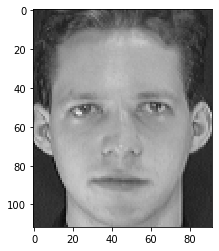

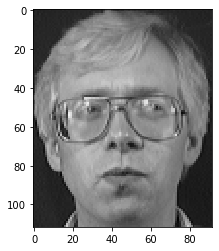

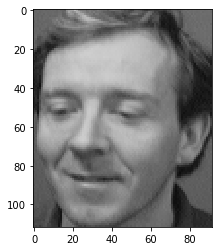

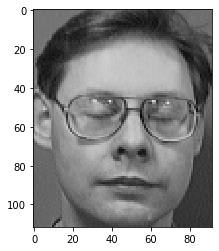

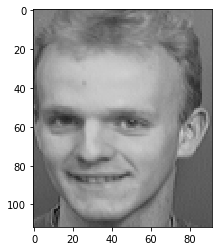

In [2]:
# displaying some sample images from random folders

base_path = 'facial_data/Datasets/att_faces_combined/'
    
img=cv2.imread(base_path + 's1/1.pgm')
imgplot = plt.imshow(img)
plt.show()
    
img=cv2.imread(base_path + 's2/3.pgm')
imgplot = plt.imshow(img)
plt.show()
    
img=cv2.imread(base_path + 's3/5.pgm')
imgplot = plt.imshow(img)
plt.show()
    
img=cv2.imread(base_path + 's4/9.pgm')
imgplot = plt.imshow(img)
plt.show()

img=cv2.imread(base_path + 's5/6.pgm')
imgplot = plt.imshow(img)
plt.show()

leny, lenx, z = img.shape

# Functions to create feature vector, mean vector and eigen vectors , etc.,

In [3]:
# creating feature vector for images from training
      
def create_feature_vec(num_train) :  

    feature_vector = []
    for i in range(1, 41) : # for each folder
        folder_path = base_path + 's' + str(i) + '/'
        for j in range(1, num_train + 1) : # for each image inside the folder si
            img_path = folder_path + str(j) + '.pgm'
            im = Image.open(img_path)
            pix = im.load()

            img_row = []
            for x in range(lenx) :
                for y in range(leny) :
                    img_row.append(pix[x, y])

            feature_vector.append(img_row)

    feature_vector = np.array(feature_vector)
    feature_vector_T = np.transpose(feature_vector)
    print("feature vector = ", feature_vector)
    print("shape of feature vector = ", feature_vector.shape)
    print("\n")

    return feature_vector

In [4]:
# mean vector

def create_mean_vec(feature_vector) :

    mean = np.mean(feature_vector, axis = 0)
    mean_T = np.transpose(mean)
    print("mean vector = ", mean)
    print("shape of mean vector = ", mean.shape)
    print("\n")
    return mean, mean_T

In [5]:
# deviation matrix

def create_dev_mat(feature_vector, mean) :

    dev_mat = feature_vector - mean
    dev_mat_T = np.transpose(dev_mat)
    print("deviation matrix = ", dev_mat)
    print("shape of deviation matrix = ", dev_mat.shape)
    print("\n")
    return dev_mat, dev_mat_T

In [6]:
# covariance matrix

def create_cov_matrix(dev_mat, dev_mat_T) :

    cov_mat = np.dot(dev_mat, dev_mat_T)
    print("covariance matrix = ", cov_mat)
    print("shape of covariance matrix = ", cov_mat.shape)
    print("\n")
    return cov_mat

In [7]:
# eigenvalues and eigenvectors

def create_eig_val_vec(cov_mat) :

    eigen_val, eigen_vec = np.linalg.eig(cov_mat)

    eigen_val_s = np.sort(eigen_val)
    eigen_vec_s = eigen_vec[:, eigen_val.argsort()]
    eigen_vec_s = np.fliplr(eigen_vec_s)

    eigen_vec = eigen_vec_s
    eigen_val = eigen_val_s
    
    print("shape of eigen values vector -->",eigen_val.shape)
    print("shape of eigen vector matrix -->",eigen_vec.shape)
    print("\n")

    return eigen_val, eigen_vec

In [8]:
def select_k_eigenvectors(eigen_vec, k) :
    return eigen_vec[:, :k]

In [9]:
def create_eigen_faces(dec_feature_vec, dev_mat) :
    eig_face = np.dot(np.transpose(dec_feature_vec), dev_mat)
    return eig_face

In [10]:
def signature_each_face(eig_face, dev_mat_T) :
    sig_face = np.dot(eig_face, dev_mat_T)
    print("dimension of signature = ", sig_face.shape)
    return sig_face

In [11]:
def prediction_vec(proj_test_face, sig_face, k, num_test, num_train, S, dist_type) :    
    min_idx_each_img = []

    for i in range(num_test * 40) : # for each test image
        test_img_proj = proj_test_face[:, i]
        test_img_proj = np.reshape(test_img_proj, (k, 1))

        dist_vec = []

        for j in range(num_train * 40) : # for each signature of training images
            sig_each_face = sig_face[:, j]
            sig_each_face = np.reshape(sig_each_face, (k, 1))
            if dist_type == "euclidean" :
                dist_vec.append(euclidean_dist(test_img_proj, sig_each_face))
            else :
                dist_vec.append(mahalonobis_dist(test_img_proj, sig_each_face, S))

        dist_vec = np.array(dist_vec)
        #print(dist_vec)
        min_dist = dist_vec[0]
        min_idx = 0

        for j in range(len(dist_vec)) :
            if dist_vec[j] < min_dist :
                min_dist = dist_vec[j]
                min_idx = j
        min_idx_each_img.append(min_idx // num_train + 1) 
    return min_idx_each_img

# Euclidean and Mahalonobis distance functions

In [12]:
def euclidean_dist(a, b) :
    dist = a - b
    sq_dist = np.dot(np.transpose(dist), dist)
    sq_dist = np.sqrt(sq_dist)
    return sq_dist

In [13]:
def mahalonobis_dist(a, b, S_inv) :
    a = np.reshape(a, (a.shape[0], 1))
    b = np.reshape(b, (b.shape[0], 1))
    diff = a - b
    return np.dot(np.dot(diff.T,S_inv),diff)

# Loading Test Data

In [14]:
# creating testing vector
def create_test_vec(num_test) :

    test_vec = list(range(1, 41))
    test_vec =  [ele for ele in test_vec for i in range(num_test)] 

    print("expected values = ",test_vec)
    print("\n")

    return test_vec

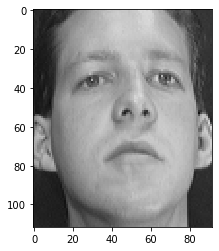

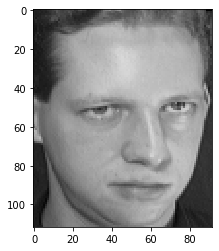

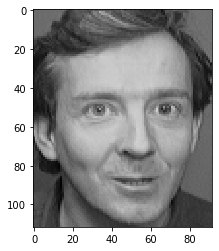

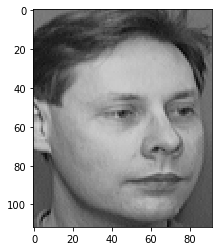

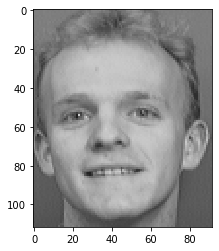

In [15]:
# displaying some sample images from random folders
    
img=cv2.imread(base_path + 's1/9.pgm')
imgplot = plt.imshow(img)
plt.show()
    
img=cv2.imread(base_path + 's1/10.pgm')
imgplot = plt.imshow(img)
plt.show()
    
img=cv2.imread(base_path + 's3/10.pgm')
imgplot = plt.imshow(img)
plt.show()
    
img=cv2.imread(base_path + 's4/10.pgm')
imgplot = plt.imshow(img)
plt.show()

img=cv2.imread(base_path + 's5/10.pgm')
imgplot = plt.imshow(img)
plt.show()

In [16]:
# create the test matrix
    
def create_test_matrix(num_train) :
    
    test_mat = []
    for i in range(1, 41) : # for each folder
        folder_path = base_path + 's' + str(i) + '/'
        for j in range(num_train + 1, 11) :

            img_path = folder_path + str(j) + '.pgm'
            im = Image.open(img_path)
            pix = im.load()

            img_row = []
            for x in range(lenx) :
                for y in range(leny) :
                    img_row.append(pix[x, y])

            test_mat.append(img_row)

    test_mat = np.array(test_mat)
    print("test matrix = ", test_mat)
    print("shape of test matrix = ", test_mat.shape)
    print("\n")
    return test_mat        

In [17]:
# mean zero

def create_mean_zero_test(test_mat, mean) :
    
    dev_test_mat = test_mat - mean
    dev_test_mat_T = np.transpose(dev_test_mat)
    print("mean zero test matrix = ", dev_test_mat)
    print("shape of mean zero test matrix = ", dev_test_mat.shape)
    print("\n")
    return dev_test_mat, dev_test_mat_T

# Function for calculating accuracy

In [18]:
# calculating accuracy

def accuracy(min_idx_each_img, test_vec, num_test) :
    count = 0
    for i in range(num_test * 40) :
        if min_idx_each_img[i] == test_vec[i] :
            count = count + 1
    return (count / (num_test * 40)) * 100

In [19]:
def get_projected_faces(num_train, num_test) :
    
    feature_vector = create_feature_vec(num_train)
    
    # getting mean
    mean, mean_T = create_mean_vec(feature_vector)
    
    # getting deaviation matrix
    dev_mat, dev_mat_T = create_dev_mat(feature_vector, mean)
    
    # getting covariance matrix
    cov_mat = create_cov_matrix(dev_mat, dev_mat_T)
    
    # getting eigen values and eigen vectors
    eigen_val, eigen_vec = create_eig_val_vec(cov_mat)
    
    # getting test matrix
    test_mat = create_test_matrix(num_train)
    
    # getting deviation test matrix
    dev_test_mat, dev_test_mat_T = create_mean_zero_test(test_mat, mean)
    
    # getting actual test values
    test_vec = create_test_vec(num_test)
    
    return test_mat, dev_test_mat, test_vec, eigen_vec, dev_mat

# Function for classification of different train test splits

In [20]:
def diff_cases(num_train, num_test, dist_type = "euclidean") :
    k_val = []
    acc_val = []
    test_mat, dev_test_mat, test_vec, eig_vec, dev_mat = get_projected_faces(num_train, num_test)
    
    for k in range(230, 231):
        
        print("\nFor k = {}\n".format(k))
    
        dec_feature_vec = select_k_eigenvectors(eig_vec, k)

        eig_face = create_eigen_faces(dec_feature_vec, dev_mat)

        sig_face = signature_each_face(eig_face, dev_mat.T)

        #projected_faces = dec_feature_vec.T
        projected_faces = sig_face
        print("\nProjected faces = ")
        print(projected_faces)
        print("shape = {}\n".format(projected_faces.shape))

        tot_mean = np.mean(projected_faces, axis = 1)
        print("\nMean of all classes = ")
        print(tot_mean)
        print("Shape = {}\n".format(tot_mean.shape))

        mean_classes = []
        dev_classes = []
        covariance_classes = []
        between_classes = []
        for i in range(0, num_train * 40, num_train) :
            classes = projected_faces[:, i: i + num_train]
            mean_cur_class = np.mean(classes, axis = 1)
            mean_cur_class = np.reshape(mean_cur_class, (mean_cur_class.shape[0], 1))
            mean_classes.append(mean_cur_class)
            dev_cur_class = classes - mean_cur_class
            dev_classes.append(dev_cur_class)
            covariance_classes.append(np.dot(dev_cur_class, dev_cur_class.T))
            mean_diff = mean_cur_class - tot_mean
            between_classes.append(k * np.dot(mean_diff, mean_diff.T))

        mean_classes = np.array(mean_classes)
        print("\nMean of individual classes = ")
        print(mean_classes)
        print("Shape = {}\n".format(mean_classes.shape))

        dev_classes = np.array(dev_classes)
        print("\nDeviation from mean each class = ")
        print(dev_classes)
        print("Shape = {}\n".format(dev_classes.shape))

        # covariance matrix for each class
        covariance_classes = np.array(covariance_classes)
        print("\nCovarince matrix for each class = ")
        print(covariance_classes)
        print("Shape = {}\n".format(covariance_classes.shape))

        within_scatter = sum(covariance_classes, axis = 0)
        print("\nWithin scatter matrix = ")
        print(within_scatter)
        print("Shape = {}\n".format(within_scatter.shape))

        between_classes = np.array(between_classes)
        print("\nBetween classes deviation = ")
        print(between_classes)
        print("Shape = {}\n".format(between_classes.shape))

        between_scatter = sum(between_classes, axis = 0)
        between_scatter_inv = np.linalg.inv(between_scatter)
        print("\nBetween scatter matrix = ")
        print(between_scatter)
        print("Shape = {}\n".format(between_scatter.shape))

        J = np.dot(np.linalg.inv(within_scatter), between_scatter)
        print("\nJ = ")
        print(J)
        print("Shape = {}\n".format(J.shape))

        eig_val_criterion, eig_vec_criterion = create_eig_val_vec(J)
        print("\n Eigen values and eigen vectors")
        print(eig_val_criterion)
        print(eig_val_criterion.shape)
        print(eig_vec_criterion)
        print(eig_vec_criterion.shape)
        print("\n")

        # taking m = 20 eigenvectors corresponding to maximum 20 eigen values
        for m in range(k) :
            k_val.append(m)
            new_feat_vec_W = eig_vec_criterion[:, 0:m:]
            print("\nNew feature vec with m columns = ")
            print(new_feat_vec_W)
            print("Shape = {}\n".format(new_feat_vec_W.shape))

            fisher_faces = np.dot(new_feat_vec_W.T, projected_faces)
            print("\nFisher faces = ")
            print(fisher_faces)
            print("Shape = {}\n".format(fisher_faces.shape))

            proj_eigen_face = np.dot(eig_face, dev_test_mat.T)
            print("\nProjected Eigen faces = ")
            print(proj_eigen_face)
            print("Shape = {}\n".format(proj_eigen_face.shape))

            proj_fisher_test = np.dot(new_feat_vec_W.T, proj_eigen_face)
            print("\nProjected fisher for test = ")
            print(proj_fisher_test)
            print("Shape = {}\n".format(proj_fisher_test.shape))

            min_idx_each_img = prediction_vec(proj_fisher_test, fisher_faces, m, num_test, num_train, np.cov(fisher_faces), dist_type)
            print(min_idx_each_img)

            acc = accuracy(min_idx_each_img, test_vec, num_test)
            acc_val.append(acc)
    return k_val, acc_val

# Function for plotting accuracy vs k

In [21]:
def print_accuracy_plot(k_val, acc_val, num_train, num_test) :

    print("Plotting accuracy vs k")    
    plt.plot(k_val, acc_val)
    plt.xlabel('Increasing value of k')
    plt.ylabel('Accuracy')

    plt.xticks(np.arange(min(k_val), max(k_val) + 1, 5.0))
    plt.yticks(np.arange(0, 100, 10.0))

    plt.show()

    print("maximum accuracy for {}-{} split = {}".format(num_train * 10, num_test * 10, max(acc_val)))

# Using Euclidean distance

In [22]:
k_val1, acc_val1 = diff_cases(6, 4)

feature vector =  [[ 48  45  45 ...  46  47  46]
 [ 60  58  68 ...  33  31  34]
 [ 39  44  59 ...  28  27  29]
 ...
 [130 126 123 ...  39  42  40]
 [128 129 126 ...  90  91  84]
 [123 128 126 ...  44  39  42]]
shape of feature vector =  (240, 10304)


mean vector =  [84.82916667 85.1        85.19583333 ... 70.25833333 71.25833333
 72.075     ]
shape of mean vector =  (10304,)


deviation matrix =  [[-36.82916667 -40.1        -40.19583333 ... -24.25833333 -24.25833333
  -26.075     ]
 [-24.82916667 -27.1        -17.19583333 ... -37.25833333 -40.25833333
  -38.075     ]
 [-45.82916667 -41.1        -26.19583333 ... -42.25833333 -44.25833333
  -43.075     ]
 ...
 [ 45.17083333  40.9         37.80416667 ... -31.25833333 -29.25833333
  -32.075     ]
 [ 43.17083333  43.9         40.80416667 ...  19.74166667  19.74166667
   11.925     ]
 [ 38.17083333  42.9         40.80416667 ... -26.25833333 -32.25833333
  -30.075     ]]
shape of deviation matrix =  (240, 10304)


covariance matrix =  [[1477

shape of eigen values vector --> (230,)
shape of eigen vector matrix --> (230, 230)



 Eigen values and eigen vectors
[-6.37951345e+20-2.90671055e+20j -6.37951345e+20+2.90671055e+20j
 -3.00916439e+20-6.73325607e+18j -3.00916439e+20+6.73325607e+18j
 -2.52050906e+20+0.00000000e+00j -1.65056676e+20-1.31615567e+19j
 -1.65056676e+20+1.31615567e+19j -1.38102346e+20+0.00000000e+00j
 -1.22182003e+20+0.00000000e+00j -1.07469397e+20+0.00000000e+00j
 -1.00325253e+20+0.00000000e+00j -8.03616477e+19-5.39017202e+18j
 -8.03616477e+19+5.39017202e+18j -6.88793701e+19+0.00000000e+00j
 -4.98419989e+19+0.00000000e+00j -2.11398457e+07+0.00000000e+00j
 -9.58880818e+06+0.00000000e+00j -8.37523551e+06+0.00000000e+00j
 -5.09152689e+06+0.00000000e+00j -4.01195560e+06-3.49062049e+06j
 -4.01195560e+06+3.49062049e+06j -4.01169153e+06+0.00000000e+00j
 -3.39539588e+06-6.92935518e+06j -3.39539588e+06+6.92935518e+06j
 -2.95293376e+06+0.00000000e+00j -2.30773349e+06+0.00000000e+00j
 -2.24530949e+06-7.80699333e+05j -2.

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

New feature vec with m columns = 
[[-0.00136274+0.j]
 [-0.00151413+0.j]
 [-0.00102808+0.j]
 [ 0.00674098+0.j]
 [ 0.00821482+0.j]
 [ 0.00041816+0.j]
 [ 0.00970251+0.j]
 [ 0.01263821+0.j]
 [-0.01828556+0.j]
 [ 0.00773516+0.j]
 [ 0.00685225+0.j]
 [-0.02631725+0.j]
 [-0.01191676+0.j]
 [-0.00272208+0.j]
 [-0.00787643+0.j]
 [ 0.01435975+0.j]
 [ 0.01100451+0.j]
 [ 0.00247244+0.j]
 [-0.00134534+0.j]
 [-0.03957753+0.j]
 [-0.00308467+0.j]
 [-0.00679156+0.j]
 [ 0.01215095+0.j]
 [ 0.01827449+0.j]
 [ 0.00417391+0.j]
 [-0.0297

[6, 38, 19, 9, 30, 4, 4, 10, 19, 34, 23, 19, 7, 9, 10, 2, 27, 17, 17, 2, 39, 23, 20, 5, 7, 30, 25, 10, 19, 7, 2, 9, 25, 18, 2, 30, 6, 17, 2, 30, 7, 25, 15, 9, 15, 15, 28, 14, 23, 23, 17, 6, 14, 14, 14, 14, 30, 34, 10, 9, 5, 32, 24, 17, 17, 19, 17, 19, 30, 30, 9, 26, 6, 5, 21, 17, 20, 29, 33, 20, 7, 17, 2, 25, 8, 9, 15, 11, 17, 34, 34, 34, 29, 5, 29, 1, 7, 21, 8, 25, 15, 37, 9, 18, 34, 17, 17, 19, 14, 37, 14, 40, 24, 32, 16, 33, 17, 19, 26, 34, 29, 31, 31, 10, 40, 2, 6, 34, 39, 24, 29, 20, 31, 10, 10, 10, 4, 10, 5, 9, 35, 9, 30, 21, 21, 4, 25, 7, 27, 19, 13, 6, 38, 5, 19, 10, 17, 34, 10, 10]

New feature vec with m columns = 
[[-1.36274199e-03+0.j  4.55752626e-04+0.j]
 [-1.51412989e-03+0.j -2.80974250e-03+0.j]
 [-1.02807847e-03+0.j  5.63906245e-03+0.j]
 [ 6.74098431e-03+0.j -2.76925601e-03+0.j]
 [ 8.21482215e-03+0.j  5.29202096e-04+0.j]
 [ 4.18163028e-04+0.j  4.10478974e-03+0.j]
 [ 9.70251424e-03+0.j -1.25991562e-03+0.j]
 [ 1.26382113e-02+0.j -4.18509137e-03+0.j]
 [-1.82855573e-02+0.j  

[5, 1, 17, 18, 26, 4, 30, 26, 40, 6, 23, 34, 9, 9, 4, 30, 38, 34, 34, 8, 13, 6, 3, 6, 7, 30, 21, 4, 23, 7, 30, 7, 37, 7, 30, 30, 38, 34, 2, 4, 9, 9, 15, 9, 12, 12, 12, 12, 23, 23, 40, 6, 14, 14, 14, 22, 30, 17, 36, 18, 5, 16, 31, 17, 17, 17, 17, 27, 4, 30, 7, 36, 27, 5, 7, 26, 20, 29, 29, 20, 7, 34, 7, 7, 26, 9, 22, 37, 40, 40, 10, 40, 29, 1, 39, 39, 25, 21, 8, 21, 15, 37, 7, 2, 26, 26, 17, 17, 28, 15, 12, 40, 33, 3, 38, 29, 10, 34, 10, 17, 33, 5, 5, 36, 26, 7, 38, 10, 32, 32, 29, 33, 1, 26, 26, 26, 40, 40, 35, 25, 16, 18, 4, 9, 11, 30, 37, 18, 38, 35, 31, 23, 38, 38, 17, 36, 40, 40, 10, 10]

New feature vec with m columns = 
[[-1.36274199e-03+0.j  4.55752626e-04+0.j  6.33887797e-04+0.j]
 [-1.51412989e-03+0.j -2.80974250e-03+0.j -1.44557971e-03+0.j]
 [-1.02807847e-03+0.j  5.63906245e-03+0.j  1.07149830e-02+0.j]
 [ 6.74098431e-03+0.j -2.76925601e-03+0.j  4.10917807e-04+0.j]
 [ 8.21482215e-03+0.j  5.29202096e-04+0.j  3.46298224e-03+0.j]
 [ 4.18163028e-04+0.j  4.10478974e-03+0.j  7.329550

[5, 5, 26, 18, 2, 2, 30, 2, 40, 40, 31, 31, 4, 4, 4, 7, 5, 30, 34, 40, 35, 6, 13, 6, 7, 30, 8, 4, 34, 8, 30, 7, 18, 8, 30, 36, 17, 10, 2, 4, 9, 9, 15, 9, 11, 12, 12, 12, 23, 23, 40, 6, 14, 14, 14, 22, 36, 17, 36, 18, 38, 29, 38, 17, 17, 17, 17, 27, 18, 30, 18, 36, 39, 38, 37, 19, 20, 29, 29, 20, 8, 34, 36, 21, 2, 9, 22, 18, 40, 40, 40, 40, 29, 39, 27, 19, 25, 25, 8, 8, 11, 21, 21, 26, 2, 17, 17, 17, 28, 21, 28, 40, 33, 35, 38, 29, 34, 34, 36, 34, 33, 31, 38, 30, 2, 30, 31, 36, 38, 38, 29, 33, 5, 34, 2, 2, 40, 6, 13, 6, 39, 18, 2, 9, 21, 30, 18, 9, 38, 40, 38, 38, 31, 38, 5, 30, 40, 40, 40, 23]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j -1.23490579e-04-9.97884480e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j  7.77087208e-04+7.67224018e-04j]
 [-1.02807847e-03+0.00000000e+00j  5.63906245e-03+0.00000000e+00j
   1.07149830e-02+0.00000000e+00

[5, 29, 26, 2, 36, 9, 30, 2, 36, 36, 38, 38, 4, 4, 4, 7, 36, 36, 36, 36, 6, 6, 13, 6, 7, 7, 7, 17, 36, 36, 36, 36, 30, 36, 8, 36, 31, 10, 18, 9, 2, 2, 15, 9, 12, 12, 12, 12, 35, 35, 23, 13, 11, 15, 14, 22, 36, 19, 36, 36, 38, 5, 36, 36, 17, 4, 4, 17, 36, 36, 36, 36, 24, 38, 36, 19, 20, 31, 33, 20, 36, 36, 36, 36, 36, 36, 22, 36, 23, 23, 36, 36, 24, 24, 20, 16, 25, 25, 25, 25, 11, 25, 25, 26, 2, 17, 17, 17, 28, 25, 12, 25, 29, 23, 38, 29, 36, 36, 36, 36, 38, 31, 36, 36, 2, 8, 36, 36, 38, 38, 33, 33, 5, 18, 36, 36, 40, 35, 35, 6, 39, 18, 37, 37, 25, 2, 9, 9, 38, 23, 38, 38, 36, 36, 36, 36, 40, 36, 23, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j -1.23490579e-04-9.97884480e-06j
  -1.23490579e-04+9.97884480e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j  7.77087208e-04+7.67224018e-04j
   7.77087208e-04-7.67224018e-04j]
 [-1.02807847e-03+0.

[5, 29, 5, 2, 9, 9, 26, 2, 23, 23, 23, 17, 4, 4, 4, 7, 5, 36, 36, 36, 3, 23, 6, 23, 7, 7, 7, 36, 23, 9, 8, 9, 8, 30, 34, 30, 16, 10, 9, 36, 37, 37, 37, 9, 12, 36, 12, 36, 23, 36, 23, 23, 37, 37, 37, 22, 18, 19, 18, 30, 36, 1, 26, 19, 4, 20, 31, 4, 30, 26, 26, 26, 16, 36, 9, 37, 20, 31, 20, 20, 18, 36, 18, 18, 9, 9, 36, 36, 23, 3, 36, 3, 24, 16, 16, 16, 25, 25, 36, 25, 12, 37, 12, 37, 2, 16, 16, 16, 28, 26, 12, 25, 33, 23, 36, 33, 23, 36, 8, 36, 32, 31, 36, 9, 37, 36, 38, 36, 31, 33, 33, 20, 5, 18, 18, 18, 36, 40, 6, 6, 37, 30, 18, 36, 25, 38, 26, 9, 3, 3, 3, 38, 36, 36, 36, 9, 36, 23, 36, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j -1.23490579e-04-9.97884480e-06j
  -1.23490579e-04+9.97884480e-06j -9.10590145e-04+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j  7.77087208e-04+7.67224018e-04j
   7.77087208e-04-7.67224018e-04j 

[5, 29, 5, 30, 36, 36, 26, 2, 36, 36, 33, 17, 4, 4, 4, 7, 1, 36, 36, 36, 23, 23, 6, 6, 7, 2, 7, 27, 23, 36, 8, 8, 30, 30, 30, 30, 10, 10, 36, 10, 2, 15, 37, 36, 12, 36, 12, 12, 23, 36, 23, 23, 11, 14, 15, 22, 36, 19, 36, 36, 36, 1, 33, 36, 4, 4, 17, 20, 23, 36, 9, 36, 19, 36, 36, 37, 20, 31, 16, 20, 18, 36, 36, 36, 36, 36, 36, 36, 23, 6, 36, 23, 24, 24, 24, 16, 25, 25, 36, 25, 15, 12, 12, 2, 7, 17, 16, 16, 28, 14, 11, 23, 33, 3, 38, 33, 36, 36, 18, 36, 32, 31, 36, 9, 26, 36, 36, 36, 3, 38, 33, 33, 36, 18, 37, 18, 36, 40, 35, 6, 16, 34, 36, 37, 36, 9, 36, 36, 3, 3, 36, 38, 36, 36, 36, 9, 23, 23, 36, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.23490579e-04+9.97884480e-06j
  -9.10590145e-04+0.00000000e+00j -1.43811897e-04+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  7.77087208e-04-7.67224018e-04j
   1.82567567e-0

[1, 1, 1, 37, 36, 36, 36, 2, 36, 36, 38, 38, 4, 4, 4, 4, 26, 36, 36, 36, 3, 6, 35, 6, 15, 37, 15, 7, 36, 8, 8, 36, 37, 37, 37, 37, 10, 10, 36, 10, 10, 19, 36, 19, 12, 12, 12, 12, 23, 23, 23, 13, 11, 11, 14, 22, 5, 19, 5, 37, 36, 1, 36, 36, 16, 17, 16, 16, 36, 36, 36, 36, 19, 36, 36, 37, 20, 16, 16, 20, 36, 38, 36, 37, 36, 36, 22, 36, 23, 23, 40, 3, 24, 24, 24, 24, 25, 25, 25, 25, 15, 12, 12, 26, 27, 17, 17, 17, 28, 25, 11, 25, 29, 33, 36, 29, 36, 30, 36, 36, 16, 31, 34, 36, 26, 36, 36, 36, 33, 1, 33, 33, 34, 36, 36, 36, 36, 35, 35, 40, 32, 18, 36, 36, 26, 36, 36, 36, 3, 3, 3, 23, 36, 36, 36, 36, 36, 36, 36, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.43811897e-04+0.00000000e+00j
  -3.32199672e-04-6.70838693e-06j -3.32199672e-04+6.70838693e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.67692633e-03+0.00000000e+00j
  -7.24

[1, 1, 1, 36, 36, 36, 36, 27, 36, 36, 38, 38, 4, 4, 4, 4, 26, 38, 3, 12, 3, 6, 35, 6, 15, 37, 15, 7, 8, 8, 8, 8, 37, 37, 37, 34, 10, 10, 36, 10, 10, 15, 37, 19, 12, 12, 12, 12, 23, 23, 23, 13, 11, 11, 14, 22, 5, 19, 5, 37, 36, 1, 1, 16, 16, 16, 16, 20, 36, 36, 36, 36, 19, 36, 36, 37, 20, 16, 20, 20, 36, 37, 36, 37, 19, 36, 22, 36, 23, 23, 40, 3, 24, 24, 24, 24, 25, 25, 25, 25, 15, 12, 12, 26, 10, 27, 27, 27, 12, 12, 11, 23, 29, 33, 36, 29, 36, 30, 36, 30, 16, 31, 34, 36, 19, 36, 32, 26, 33, 1, 33, 33, 34, 34, 37, 37, 40, 40, 35, 40, 37, 36, 36, 36, 26, 36, 36, 9, 3, 3, 3, 3, 30, 3, 37, 9, 40, 36, 36, 40]

New feature vec with m columns = 
[[-0.00136274+0.00000000e+00j  0.00045575+0.00000000e+00j
   0.00063389+0.00000000e+00j ... -0.0003322 +6.70838693e-06j
   0.00027913+0.00000000e+00j  0.0004889 +0.00000000e+00j]
 [-0.00151413+0.00000000e+00j -0.00280974+0.00000000e+00j
  -0.00144558+0.00000000e+00j ... -0.00072401+3.11957486e-04j
   0.00042049+0.00000000e+00j  0.00045305+0.00000000e+

[1, 1, 1, 36, 36, 36, 2, 2, 36, 36, 38, 38, 4, 4, 4, 4, 26, 19, 30, 18, 6, 6, 35, 6, 4, 25, 15, 7, 8, 8, 8, 8, 37, 30, 9, 34, 10, 10, 36, 10, 15, 15, 11, 19, 12, 12, 12, 12, 36, 13, 36, 13, 11, 14, 14, 22, 5, 19, 5, 15, 36, 36, 36, 19, 16, 17, 17, 16, 36, 18, 18, 36, 19, 10, 36, 19, 20, 16, 16, 20, 40, 37, 40, 40, 19, 36, 22, 36, 23, 23, 23, 23, 24, 24, 24, 24, 25, 25, 25, 25, 15, 26, 15, 26, 10, 16, 27, 16, 28, 12, 11, 23, 29, 33, 36, 29, 30, 30, 18, 30, 16, 31, 39, 30, 26, 11, 32, 5, 33, 23, 33, 33, 34, 34, 34, 34, 40, 40, 35, 40, 19, 36, 36, 18, 26, 36, 36, 37, 38, 25, 38, 23, 39, 39, 39, 36, 40, 36, 30, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.j          4.55752626e-04+0.j
   6.33887797e-04+0.j         ...  4.88899928e-04+0.j
  -4.80250957e-04+0.j         -8.26867156e-05-0.00025425j]
 [-1.51412989e-03+0.j         -2.80974250e-03+0.j
  -1.44557971e-03+0.j         ...  4.53046197e-04+0.j
   1.18665759e-05+0.j          6.78284266e-04-0.00019725j]
 [-1.02807847e-03+0.

[1, 1, 1, 36, 36, 36, 2, 2, 3, 36, 38, 38, 4, 4, 4, 31, 26, 19, 35, 35, 35, 6, 35, 6, 15, 15, 15, 7, 8, 8, 8, 8, 37, 30, 9, 34, 10, 10, 19, 10, 37, 15, 37, 37, 12, 12, 12, 12, 3, 3, 35, 13, 11, 14, 14, 22, 22, 15, 22, 22, 36, 39, 39, 16, 16, 17, 17, 16, 36, 18, 36, 36, 19, 10, 36, 19, 20, 16, 16, 20, 40, 38, 40, 40, 19, 37, 22, 11, 23, 23, 36, 37, 24, 24, 24, 24, 25, 25, 25, 25, 15, 26, 8, 26, 10, 16, 27, 16, 28, 28, 36, 26, 29, 33, 36, 29, 30, 30, 30, 30, 16, 31, 16, 18, 26, 36, 32, 37, 33, 35, 33, 33, 34, 34, 34, 34, 21, 40, 35, 40, 37, 36, 19, 11, 26, 36, 36, 38, 38, 25, 38, 38, 37, 37, 39, 38, 40, 35, 8, 35]

New feature vec with m columns = 
[[-1.36274199e-03+0.j          4.55752626e-04+0.j
   6.33887797e-04+0.j         ... -8.26867156e-05-0.00025425j
  -8.26867156e-05+0.00025425j -3.61638902e-04+0.j        ]
 [-1.51412989e-03+0.j         -2.80974250e-03+0.j
  -1.44557971e-03+0.j         ...  6.78284266e-04-0.00019725j
   6.78284266e-04+0.00019725j -9.02457830e-05+0.j        ]
 [-

[1, 1, 1, 36, 2, 2, 2, 2, 3, 36, 38, 38, 4, 4, 4, 15, 5, 19, 35, 35, 35, 6, 35, 6, 15, 15, 15, 7, 8, 8, 8, 8, 37, 30, 9, 34, 10, 10, 19, 10, 37, 15, 37, 37, 12, 12, 12, 12, 3, 3, 35, 13, 11, 11, 14, 22, 26, 15, 15, 15, 36, 24, 39, 16, 16, 17, 17, 16, 36, 18, 36, 36, 19, 10, 36, 19, 20, 16, 16, 20, 40, 38, 40, 40, 19, 37, 22, 11, 23, 23, 37, 37, 24, 24, 24, 39, 25, 11, 25, 25, 15, 26, 8, 26, 10, 27, 27, 27, 28, 28, 37, 12, 29, 33, 33, 29, 30, 30, 30, 30, 16, 31, 16, 18, 26, 36, 32, 32, 33, 35, 33, 33, 34, 34, 34, 11, 40, 21, 35, 40, 34, 36, 10, 34, 26, 36, 37, 38, 38, 40, 38, 38, 30, 30, 39, 39, 40, 35, 30, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.j  4.55752626e-04+0.j  6.33887797e-04+0.j ...
  -3.61638902e-04+0.j  3.09953902e-04+0.j -2.31439815e-04+0.j]
 [-1.51412989e-03+0.j -2.80974250e-03+0.j -1.44557971e-03+0.j ...
  -9.02457830e-05+0.j  4.65413684e-04+0.j -3.20062359e-04+0.j]
 [-1.02807847e-03+0.j  5.63906245e-03+0.j  1.07149830e-02+0.j ...
   1.72549887e-03+0.j  

[1, 1, 1, 36, 36, 2, 2, 2, 3, 36, 38, 38, 4, 4, 4, 31, 26, 9, 35, 35, 35, 6, 35, 6, 15, 15, 15, 7, 8, 8, 8, 8, 30, 30, 9, 34, 10, 10, 19, 10, 37, 15, 37, 37, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 15, 36, 24, 39, 9, 16, 17, 17, 16, 36, 18, 18, 36, 19, 10, 37, 19, 20, 16, 16, 20, 40, 38, 40, 40, 19, 37, 22, 11, 23, 23, 37, 37, 24, 24, 24, 39, 25, 11, 25, 25, 15, 26, 26, 26, 10, 27, 27, 16, 28, 28, 37, 12, 29, 33, 36, 29, 30, 30, 30, 30, 16, 31, 16, 40, 26, 36, 32, 37, 33, 35, 33, 33, 34, 34, 9, 34, 40, 21, 35, 40, 34, 36, 10, 34, 26, 36, 37, 38, 38, 40, 38, 38, 30, 30, 39, 38, 40, 35, 30, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.j          4.55752626e-04+0.j
   6.33887797e-04+0.j         ... -2.31439815e-04+0.j
  -6.78096419e-05-0.0002024j  -6.78096419e-05+0.0002024j ]
 [-1.51412989e-03+0.j         -2.80974250e-03+0.j
  -1.44557971e-03+0.j         ... -3.20062359e-04+0.j
  -3.62313407e-04-0.0001928j  -3.62313407e-04+0.0001928j ]
 [-1.02807847e-03+0.j

[1, 1, 1, 18, 36, 2, 2, 2, 3, 36, 38, 38, 4, 4, 4, 9, 26, 9, 9, 30, 35, 6, 35, 6, 15, 15, 15, 7, 8, 8, 8, 8, 30, 9, 9, 9, 10, 10, 19, 10, 37, 15, 37, 37, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 15, 36, 1, 39, 9, 16, 17, 17, 16, 36, 18, 18, 18, 19, 10, 37, 19, 20, 16, 16, 20, 40, 38, 40, 40, 19, 9, 22, 11, 23, 23, 37, 37, 24, 24, 16, 39, 25, 11, 25, 25, 15, 26, 11, 26, 10, 27, 27, 16, 28, 40, 18, 12, 29, 33, 37, 29, 30, 30, 30, 30, 16, 31, 16, 9, 26, 18, 32, 9, 33, 40, 33, 33, 34, 34, 9, 9, 40, 21, 35, 40, 34, 36, 10, 34, 26, 36, 37, 37, 38, 40, 38, 38, 39, 40, 39, 38, 40, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -6.78096419e-05+2.02396562e-04j
   1.33729620e-04+3.22211092e-06j  1.33729620e-04-3.22211092e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.62313407e-04+1.92799437e-04j
   2.74130959e-04

[1, 1, 1, 18, 36, 2, 2, 2, 3, 36, 38, 38, 4, 4, 4, 31, 26, 9, 9, 35, 35, 6, 35, 6, 15, 37, 15, 7, 36, 8, 8, 8, 37, 9, 9, 30, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 10, 22, 26, 31, 26, 37, 36, 1, 39, 9, 16, 17, 17, 16, 36, 18, 18, 36, 19, 10, 37, 19, 20, 16, 16, 20, 40, 38, 40, 40, 19, 37, 22, 11, 23, 23, 37, 37, 24, 24, 16, 39, 25, 11, 25, 25, 15, 26, 26, 26, 10, 27, 27, 2, 28, 40, 37, 26, 29, 33, 37, 29, 30, 30, 30, 30, 16, 9, 9, 9, 26, 18, 32, 9, 33, 40, 33, 33, 34, 34, 9, 9, 21, 21, 35, 40, 34, 36, 10, 34, 26, 36, 37, 37, 38, 40, 38, 38, 39, 39, 39, 37, 40, 35, 40, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.33729620e-04-3.22211092e-06j
  -8.49024223e-05+8.20381580e-06j -8.49024223e-05-8.20381580e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.74130959e-04-9.74293571e-06j
  -1.80727570e-

[1, 1, 1, 36, 36, 2, 2, 2, 3, 36, 38, 38, 4, 4, 4, 14, 26, 9, 9, 35, 35, 6, 35, 6, 15, 37, 15, 7, 36, 8, 8, 8, 37, 9, 9, 30, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 10, 22, 26, 31, 26, 37, 36, 1, 39, 39, 16, 17, 16, 16, 30, 18, 36, 36, 39, 39, 37, 19, 20, 16, 16, 20, 40, 38, 40, 40, 22, 37, 22, 11, 23, 23, 37, 37, 24, 24, 16, 39, 25, 11, 25, 25, 15, 26, 26, 26, 10, 27, 36, 2, 28, 40, 37, 26, 29, 33, 37, 29, 30, 30, 30, 30, 16, 9, 39, 9, 26, 32, 32, 9, 33, 40, 33, 33, 34, 34, 9, 9, 21, 21, 35, 40, 34, 36, 10, 34, 26, 36, 37, 37, 38, 40, 38, 38, 39, 37, 37, 37, 40, 40, 40, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -8.49024223e-05-8.20381580e-06j
  -1.72973654e-05+7.08975229e-06j -1.72973654e-05-7.08975229e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.80727570e-04-5.25655392e-05j
  -1.18454629

[1, 1, 1, 37, 36, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 14, 26, 9, 38, 35, 35, 6, 5, 6, 15, 37, 15, 7, 36, 8, 8, 8, 37, 9, 9, 34, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 38, 13, 35, 13, 11, 11, 10, 22, 26, 31, 26, 37, 36, 1, 39, 9, 16, 17, 16, 16, 36, 18, 36, 36, 39, 39, 37, 19, 20, 16, 16, 20, 40, 38, 35, 35, 22, 37, 22, 11, 23, 23, 37, 37, 24, 24, 16, 39, 25, 11, 25, 25, 15, 26, 11, 26, 10, 27, 36, 2, 28, 37, 37, 38, 29, 33, 37, 29, 9, 30, 30, 30, 16, 31, 39, 9, 26, 32, 32, 9, 33, 40, 33, 33, 34, 34, 9, 9, 21, 21, 35, 40, 31, 36, 10, 34, 26, 38, 37, 38, 38, 38, 38, 38, 39, 37, 37, 37, 40, 35, 11, 35]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.72973654e-05-7.08975229e-06j
   1.38410390e-05+5.02278763e-05j  1.38410390e-05-5.02278763e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.18454629e-05-2.15042434e-05j
   2.1705171

[1, 1, 1, 37, 1, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 14, 26, 38, 9, 35, 35, 6, 5, 6, 7, 37, 15, 7, 36, 8, 8, 8, 37, 9, 9, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 38, 13, 35, 13, 11, 11, 10, 22, 26, 31, 26, 37, 36, 1, 39, 1, 16, 17, 16, 16, 37, 18, 36, 36, 39, 1, 37, 19, 20, 16, 16, 20, 2, 38, 40, 40, 19, 37, 22, 11, 23, 23, 37, 37, 24, 24, 16, 39, 25, 11, 25, 25, 15, 38, 8, 5, 10, 16, 36, 2, 28, 40, 37, 38, 29, 33, 37, 29, 9, 30, 30, 30, 16, 9, 37, 9, 26, 32, 32, 9, 33, 40, 33, 33, 11, 34, 9, 9, 21, 21, 35, 40, 34, 36, 10, 34, 26, 38, 40, 38, 37, 38, 38, 38, 37, 37, 37, 37, 40, 35, 1, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.38410390e-05-5.02278763e-05j
   1.87907648e-05+0.00000000e+00j -2.83064893e-06-2.11763208e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.17051716e-04-6.37515922e-05j
   2.17874586e-05+0.0

[1, 1, 1, 37, 1, 2, 2, 2, 38, 37, 38, 38, 4, 4, 4, 9, 26, 38, 9, 35, 35, 6, 5, 6, 15, 37, 15, 7, 36, 8, 8, 8, 37, 9, 9, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 10, 22, 26, 9, 37, 37, 36, 1, 39, 1, 16, 17, 16, 16, 37, 18, 36, 36, 19, 19, 37, 19, 20, 16, 16, 20, 40, 37, 40, 40, 9, 37, 22, 11, 23, 23, 37, 37, 24, 24, 16, 39, 25, 40, 25, 25, 15, 37, 8, 5, 10, 16, 27, 16, 28, 37, 37, 38, 29, 33, 37, 29, 9, 30, 30, 30, 16, 9, 37, 9, 26, 32, 32, 9, 33, 40, 33, 33, 40, 34, 9, 9, 21, 21, 35, 40, 34, 36, 10, 37, 37, 36, 40, 37, 38, 37, 38, 38, 37, 37, 37, 37, 40, 35, 1, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.83064893e-06-2.11763208e-05j
  -2.83064893e-06+2.11763208e-05j -1.27388219e-05+8.87636568e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.42116655e-05-2.23704473e-05j
  -2.42116655e-05+2.2

[1, 1, 1, 37, 36, 2, 2, 2, 38, 37, 38, 38, 4, 4, 4, 9, 26, 38, 9, 35, 35, 6, 5, 6, 15, 37, 7, 7, 36, 8, 8, 8, 37, 37, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 10, 22, 26, 9, 37, 37, 36, 1, 39, 1, 16, 17, 16, 16, 37, 36, 36, 36, 39, 19, 37, 19, 20, 16, 16, 20, 40, 38, 40, 40, 37, 37, 22, 11, 23, 23, 37, 37, 24, 24, 16, 16, 25, 40, 25, 25, 15, 37, 8, 5, 10, 16, 27, 16, 28, 37, 37, 38, 29, 33, 37, 29, 9, 30, 30, 30, 16, 31, 37, 9, 37, 36, 32, 9, 33, 40, 33, 33, 40, 34, 9, 9, 21, 21, 35, 40, 34, 36, 10, 37, 37, 36, 40, 37, 38, 37, 38, 38, 37, 37, 37, 37, 40, 35, 11, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.27388219e-05+8.87636568e-06j
  -1.27388219e-05-8.87636568e-06j  6.58264244e-06+4.62862847e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -4.95413293e-05+2.82300606e-07j
  -4.95413293e-0

[1, 1, 1, 37, 36, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 26, 38, 38, 35, 35, 6, 5, 6, 15, 37, 7, 7, 8, 8, 8, 8, 37, 37, 37, 9, 10, 10, 19, 10, 37, 37, 40, 37, 12, 12, 12, 12, 3, 3, 35, 13, 40, 9, 14, 22, 26, 9, 37, 37, 36, 1, 39, 1, 16, 17, 16, 16, 37, 36, 36, 36, 39, 19, 37, 19, 20, 16, 16, 20, 2, 38, 40, 40, 9, 9, 22, 9, 23, 23, 37, 37, 24, 24, 16, 16, 25, 40, 40, 25, 15, 38, 12, 38, 10, 16, 36, 2, 28, 40, 37, 38, 29, 33, 36, 29, 30, 30, 30, 9, 16, 31, 9, 9, 37, 36, 32, 9, 33, 40, 33, 33, 40, 34, 9, 9, 21, 21, 35, 40, 30, 36, 10, 37, 38, 38, 40, 37, 38, 38, 38, 38, 37, 37, 37, 3, 40, 35, 40, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  6.58264244e-06+4.62862847e-05j
   6.58264244e-06-4.62862847e-05j  6.52584380e-05-6.26364024e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -6.85635765e-05+3.28154858e-05j
  -6.85635765e-05-3.281

[1, 1, 1, 37, 36, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 39, 9, 35, 38, 6, 35, 6, 15, 37, 7, 7, 8, 8, 8, 8, 37, 37, 37, 9, 10, 10, 19, 10, 37, 37, 40, 37, 12, 12, 12, 12, 38, 13, 35, 13, 11, 11, 10, 22, 26, 31, 37, 37, 36, 1, 38, 1, 16, 31, 16, 16, 37, 36, 18, 36, 39, 26, 37, 10, 20, 16, 16, 20, 2, 38, 40, 40, 19, 11, 38, 11, 23, 23, 37, 37, 24, 24, 16, 16, 25, 40, 25, 25, 22, 38, 38, 38, 10, 36, 36, 2, 28, 40, 37, 38, 29, 33, 36, 29, 30, 30, 30, 9, 38, 31, 38, 9, 38, 36, 9, 38, 36, 35, 33, 33, 39, 34, 9, 9, 21, 35, 35, 40, 30, 36, 10, 37, 38, 38, 40, 37, 38, 38, 38, 38, 39, 37, 37, 39, 40, 40, 9, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  6.52584380e-05-6.26364024e-05j
   6.52584380e-05+6.26364024e-05j  3.25079342e-05+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  6.86886719e-05+2.31380197e-05j
   6.86886719e-

[1, 1, 1, 37, 36, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 26, 38, 9, 35, 35, 6, 35, 6, 15, 37, 7, 7, 26, 8, 8, 8, 37, 9, 9, 37, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 38, 13, 35, 13, 11, 11, 10, 22, 26, 31, 26, 37, 36, 1, 38, 38, 16, 31, 16, 16, 40, 36, 18, 36, 19, 38, 37, 10, 20, 16, 16, 20, 40, 38, 40, 40, 38, 9, 38, 11, 23, 23, 37, 37, 24, 24, 16, 39, 25, 40, 25, 25, 26, 38, 38, 38, 10, 36, 36, 2, 28, 40, 37, 38, 29, 33, 38, 29, 30, 30, 30, 38, 38, 9, 38, 40, 38, 36, 32, 38, 36, 40, 33, 33, 39, 34, 9, 9, 21, 35, 35, 40, 34, 36, 10, 37, 38, 38, 40, 38, 3, 38, 38, 38, 39, 37, 37, 37, 40, 40, 11, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  3.25079342e-05+0.00000000e+00j
  -3.51583260e-05-2.97088705e-05j -3.51583260e-05+2.97088705e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.86153974e-05+0.00000000e+00j
   1.3085937

[1, 1, 1, 37, 36, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 38, 38, 35, 38, 6, 35, 6, 37, 37, 7, 7, 8, 8, 8, 8, 37, 37, 37, 37, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 38, 38, 35, 13, 11, 11, 10, 22, 26, 37, 26, 37, 36, 1, 38, 38, 16, 17, 16, 16, 40, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 40, 38, 40, 40, 38, 37, 38, 11, 23, 23, 37, 37, 24, 24, 16, 16, 25, 40, 40, 25, 26, 38, 38, 38, 10, 36, 36, 2, 28, 40, 37, 38, 29, 33, 37, 29, 30, 30, 30, 38, 38, 31, 38, 40, 38, 36, 9, 38, 36, 40, 33, 33, 39, 34, 9, 9, 21, 21, 35, 40, 34, 36, 10, 37, 37, 38, 38, 37, 37, 38, 38, 38, 39, 37, 37, 38, 40, 40, 40, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.51583260e-05+2.97088705e-05j
  -3.85361912e-06+1.85784723e-05j -3.85361912e-06-1.85784723e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.30859378e-05-3.62297757e-06j
  -9.096

[1, 1, 1, 37, 36, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 26, 38, 9, 35, 38, 6, 35, 6, 15, 37, 7, 7, 26, 26, 8, 8, 37, 37, 37, 37, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 38, 38, 35, 13, 11, 11, 10, 22, 26, 9, 26, 37, 36, 1, 38, 9, 16, 17, 16, 16, 36, 18, 36, 36, 19, 19, 37, 10, 20, 16, 16, 20, 40, 38, 40, 40, 19, 37, 38, 11, 23, 23, 37, 37, 24, 24, 16, 16, 25, 40, 25, 25, 26, 37, 38, 38, 10, 36, 36, 2, 28, 40, 37, 38, 29, 33, 37, 29, 30, 30, 30, 30, 38, 9, 38, 9, 38, 36, 9, 38, 36, 40, 33, 33, 39, 34, 9, 9, 21, 21, 35, 40, 34, 36, 10, 37, 37, 38, 37, 37, 38, 38, 38, 38, 39, 37, 37, 37, 40, 40, 40, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.85361912e-06-1.85784723e-05j
  -2.17030721e-05-2.71329441e-06j -2.17030721e-05+2.71329441e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -9.09667386e-06-1.04058601e-06j
   6.334306

[1, 1, 1, 37, 36, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 4, 38, 9, 38, 35, 35, 6, 35, 6, 7, 37, 7, 7, 26, 26, 8, 8, 37, 9, 9, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 38, 38, 35, 13, 11, 11, 10, 22, 26, 9, 26, 37, 36, 1, 38, 9, 16, 17, 16, 16, 36, 18, 36, 36, 19, 38, 37, 16, 20, 16, 16, 20, 40, 38, 40, 40, 38, 9, 38, 11, 23, 23, 40, 37, 24, 24, 16, 39, 25, 40, 25, 25, 26, 38, 38, 38, 10, 36, 36, 2, 28, 40, 37, 38, 29, 33, 37, 29, 30, 30, 30, 30, 38, 9, 38, 9, 38, 36, 9, 9, 36, 40, 33, 33, 40, 34, 9, 9, 40, 21, 35, 40, 34, 36, 10, 37, 38, 38, 37, 38, 38, 38, 38, 38, 39, 37, 39, 38, 40, 40, 40, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.17030721e-05+2.71329441e-06j
  -9.45832595e-06+0.00000000e+00j  7.59317838e-05+1.33057076e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  6.33430695e-06-3.88989051e-05j
  -7.01657437e-06

[1, 1, 1, 36, 36, 36, 2, 2, 38, 38, 38, 38, 4, 4, 4, 14, 38, 9, 38, 35, 35, 6, 5, 6, 37, 37, 7, 7, 26, 26, 8, 36, 37, 9, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 38, 13, 35, 13, 11, 11, 10, 22, 26, 37, 26, 37, 36, 1, 38, 9, 16, 17, 16, 16, 37, 18, 36, 36, 19, 38, 37, 16, 20, 16, 16, 20, 40, 38, 40, 35, 38, 11, 22, 11, 23, 23, 40, 37, 24, 24, 16, 39, 25, 40, 25, 25, 26, 38, 38, 38, 10, 36, 36, 2, 28, 40, 37, 38, 29, 33, 37, 29, 30, 30, 30, 30, 38, 9, 38, 9, 38, 36, 9, 9, 36, 40, 33, 33, 1, 34, 9, 9, 40, 35, 35, 40, 34, 36, 10, 37, 37, 37, 37, 38, 38, 38, 38, 38, 39, 37, 37, 37, 35, 40, 11, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  7.59317838e-05+1.33057076e-05j
   7.59317838e-05-1.33057076e-05j  2.33699346e-04-3.45096724e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.45549449e-05+1.43096886e-05j
   2.4554944

[1, 1, 1, 37, 1, 2, 2, 2, 12, 38, 38, 38, 4, 4, 4, 9, 38, 9, 38, 35, 35, 6, 1, 6, 7, 37, 7, 7, 26, 26, 8, 8, 37, 9, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 35, 13, 11, 12, 14, 22, 22, 37, 22, 37, 36, 1, 36, 37, 16, 31, 17, 17, 31, 36, 18, 36, 4, 38, 37, 16, 20, 16, 16, 20, 2, 9, 2, 40, 19, 37, 37, 40, 23, 23, 37, 37, 24, 1, 16, 39, 25, 40, 25, 25, 26, 37, 12, 22, 10, 27, 27, 2, 28, 40, 37, 12, 29, 33, 37, 29, 35, 31, 30, 30, 38, 9, 38, 9, 38, 34, 9, 38, 36, 35, 33, 33, 1, 34, 9, 9, 35, 35, 35, 40, 16, 36, 34, 37, 37, 36, 22, 38, 37, 38, 16, 38, 39, 37, 37, 38, 35, 40, 40, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.33699346e-04-3.45096724e-05j
   2.33699346e-04+3.45096724e-05j  1.85245776e-05+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.03709967e-04+1.30205982e-04j
   1.03709967e-04-1.3

[1, 1, 1, 37, 1, 2, 2, 2, 12, 38, 38, 38, 4, 4, 4, 9, 26, 9, 38, 35, 35, 6, 1, 6, 7, 37, 7, 7, 26, 8, 8, 8, 37, 9, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 35, 13, 11, 12, 14, 12, 22, 37, 22, 37, 27, 1, 36, 9, 16, 31, 17, 16, 31, 18, 36, 36, 19, 38, 37, 16, 20, 16, 16, 20, 40, 38, 40, 35, 9, 37, 37, 40, 23, 23, 37, 37, 24, 1, 16, 39, 25, 40, 25, 25, 26, 38, 12, 38, 10, 27, 27, 2, 28, 40, 37, 12, 29, 33, 37, 29, 35, 31, 35, 30, 35, 38, 38, 9, 38, 36, 9, 9, 36, 35, 33, 33, 1, 34, 9, 9, 35, 35, 35, 40, 16, 36, 34, 37, 37, 37, 37, 38, 37, 37, 12, 38, 39, 37, 37, 38, 35, 40, 40, 37]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.85245776e-05+0.00000000e+00j
  -1.84266097e-05-1.13470159e-05j -1.84266097e-05+1.13470159e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -9.90172084e-06+0.00000000e+00j
   5.76735585e-06-5.

[1, 1, 1, 37, 1, 2, 2, 2, 12, 38, 38, 38, 4, 4, 4, 9, 38, 38, 38, 35, 35, 6, 1, 6, 15, 37, 7, 7, 8, 8, 8, 8, 30, 37, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 35, 13, 11, 12, 10, 12, 22, 37, 22, 37, 27, 1, 36, 38, 16, 31, 17, 16, 36, 18, 36, 36, 19, 38, 37, 16, 20, 16, 16, 20, 35, 38, 35, 35, 38, 9, 37, 40, 23, 23, 37, 37, 24, 1, 16, 39, 25, 40, 25, 25, 26, 38, 12, 38, 10, 27, 27, 2, 28, 40, 37, 12, 29, 33, 37, 29, 35, 31, 35, 30, 35, 38, 38, 9, 38, 36, 9, 38, 36, 35, 33, 33, 1, 34, 9, 9, 35, 35, 35, 40, 16, 36, 34, 30, 37, 12, 40, 38, 37, 37, 12, 38, 39, 40, 37, 38, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.84266097e-05+1.13470159e-05j
  -1.45412005e-05-2.00185796e-06j -1.45412005e-05+2.00185796e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  5.76735585e-06+5.04774642e-06j
  -3.38449163e-0

[1, 1, 1, 37, 36, 2, 2, 2, 12, 38, 38, 38, 4, 4, 4, 9, 26, 38, 38, 35, 35, 6, 1, 6, 15, 37, 7, 7, 26, 8, 8, 8, 30, 9, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 35, 13, 11, 12, 10, 12, 26, 37, 22, 37, 27, 1, 36, 38, 16, 31, 17, 17, 36, 18, 36, 36, 19, 38, 37, 16, 20, 16, 16, 20, 35, 38, 35, 35, 37, 12, 22, 40, 23, 23, 37, 37, 24, 1, 16, 39, 25, 40, 25, 25, 26, 38, 12, 38, 10, 27, 27, 2, 28, 40, 37, 12, 29, 33, 37, 29, 35, 31, 35, 30, 35, 38, 38, 9, 26, 9, 9, 9, 36, 35, 33, 33, 1, 34, 9, 9, 35, 35, 35, 35, 16, 36, 34, 30, 37, 12, 22, 37, 38, 37, 37, 38, 39, 40, 37, 38, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.45412005e-05+2.00185796e-06j
  -2.73956545e-05+2.37243294e-05j -2.73956545e-05-2.37243294e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.38449163e-06-3.56389984e-06j
  -3.57646958e-0

[1, 1, 1, 36, 36, 2, 2, 2, 12, 12, 38, 38, 4, 4, 4, 9, 26, 38, 9, 35, 35, 6, 1, 6, 15, 37, 7, 7, 26, 8, 8, 8, 30, 37, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 12, 13, 11, 12, 1, 22, 26, 31, 22, 37, 36, 1, 36, 38, 16, 31, 17, 16, 36, 18, 18, 36, 4, 12, 37, 10, 20, 16, 16, 20, 35, 38, 35, 40, 9, 12, 37, 22, 23, 23, 37, 37, 24, 1, 16, 39, 25, 40, 25, 25, 26, 38, 12, 38, 10, 27, 36, 2, 28, 40, 37, 12, 29, 33, 37, 29, 35, 31, 30, 30, 1, 38, 38, 9, 26, 9, 9, 9, 33, 35, 33, 33, 1, 31, 9, 9, 35, 35, 35, 38, 16, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.73956545e-05-2.37243294e-05j
   5.77712366e-05-5.38414137e-05j  5.77712366e-05+5.38414137e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.57646958e-05+3.80136009e-06j
   1.15116349e-05+4.

[1, 1, 1, 36, 36, 2, 2, 2, 12, 12, 38, 12, 4, 4, 4, 9, 26, 31, 31, 35, 35, 6, 1, 6, 15, 37, 7, 7, 36, 8, 8, 8, 30, 37, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 12, 13, 11, 12, 1, 22, 22, 31, 22, 37, 36, 1, 36, 38, 16, 1, 16, 16, 36, 18, 36, 36, 10, 38, 37, 10, 20, 16, 16, 20, 40, 9, 40, 40, 37, 37, 12, 22, 23, 23, 37, 37, 24, 1, 16, 39, 25, 40, 25, 25, 26, 12, 12, 38, 10, 27, 36, 2, 28, 40, 37, 12, 29, 36, 37, 29, 35, 31, 35, 30, 1, 38, 38, 9, 26, 9, 9, 9, 33, 35, 33, 33, 1, 31, 9, 9, 35, 35, 35, 38, 16, 36, 10, 37, 37, 37, 37, 37, 37, 37, 12, 38, 39, 37, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.77712366e-05+5.38414137e-05j
  -4.47112789e-06+7.06981724e-07j -4.47112789e-06-7.06981724e-07j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.15116349e-05-4.98799849e-06j
  -2.34407674e-05-9.

[1, 1, 1, 36, 1, 2, 2, 2, 12, 12, 38, 38, 4, 4, 4, 9, 26, 38, 38, 35, 35, 6, 1, 6, 15, 37, 7, 7, 26, 8, 8, 8, 37, 9, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 12, 13, 11, 12, 10, 22, 22, 31, 22, 37, 36, 1, 36, 38, 16, 1, 17, 16, 36, 18, 36, 36, 19, 12, 37, 10, 20, 16, 16, 20, 40, 38, 40, 40, 9, 12, 38, 22, 23, 23, 37, 37, 24, 1, 24, 39, 25, 40, 25, 25, 26, 22, 12, 22, 10, 27, 36, 2, 28, 40, 37, 12, 29, 35, 38, 29, 35, 31, 35, 30, 1, 38, 38, 9, 37, 9, 9, 9, 33, 35, 33, 33, 1, 31, 9, 9, 35, 35, 35, 38, 16, 36, 10, 37, 37, 37, 22, 26, 3, 12, 38, 38, 39, 40, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.47112789e-06-7.06981724e-07j
  -5.87561719e-06+5.42597377e-06j -5.87561719e-06-5.42597377e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.34407674e-05+9.45581482e-06j
   9.72362378e-06-1.6

[1, 1, 1, 36, 36, 2, 2, 2, 12, 12, 38, 38, 4, 4, 4, 9, 26, 38, 12, 35, 35, 6, 1, 6, 15, 37, 7, 7, 26, 8, 8, 8, 37, 9, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 12, 13, 11, 12, 10, 22, 22, 31, 22, 37, 36, 1, 36, 38, 16, 1, 17, 16, 36, 18, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 40, 38, 40, 35, 12, 12, 38, 22, 23, 23, 37, 37, 24, 1, 39, 39, 25, 40, 25, 25, 26, 12, 11, 12, 10, 27, 36, 2, 28, 22, 37, 12, 29, 35, 37, 29, 35, 31, 35, 30, 1, 38, 38, 9, 37, 9, 9, 38, 36, 35, 33, 33, 1, 31, 9, 9, 12, 35, 35, 38, 16, 36, 10, 30, 37, 37, 40, 37, 37, 12, 12, 38, 39, 40, 37, 3, 35, 40, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -5.87561719e-06-5.42597377e-06j
  -1.33194429e-06-2.36200155e-06j -1.33194429e-06+2.36200155e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  9.72362378e-06+1.61196366e-05j
  -7.70646777e-06-

[1, 1, 1, 36, 36, 2, 2, 2, 12, 12, 38, 12, 4, 4, 4, 9, 26, 9, 12, 35, 35, 6, 1, 6, 7, 37, 31, 7, 26, 8, 8, 8, 37, 9, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 12, 13, 11, 12, 10, 22, 22, 31, 22, 37, 27, 10, 36, 9, 16, 31, 17, 16, 36, 18, 36, 36, 19, 12, 37, 10, 20, 16, 16, 20, 40, 38, 40, 35, 37, 12, 22, 22, 23, 23, 37, 37, 24, 1, 24, 39, 12, 40, 25, 25, 26, 12, 11, 22, 10, 27, 27, 2, 28, 22, 37, 12, 29, 35, 37, 29, 35, 31, 30, 30, 1, 38, 38, 9, 37, 9, 9, 9, 18, 40, 33, 33, 34, 31, 9, 11, 12, 35, 35, 38, 16, 36, 10, 37, 37, 37, 22, 37, 37, 12, 12, 38, 39, 40, 37, 37, 35, 40, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.33194429e-06+2.36200155e-06j
   1.22219358e-05-8.29222975e-07j  1.22219358e-05+8.29222975e-07j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -7.70646777e-06+2.42804743e-05j
   6.29086974e-0

[1, 1, 1, 36, 1, 2, 2, 2, 12, 12, 38, 38, 4, 4, 4, 9, 26, 38, 38, 35, 35, 6, 1, 6, 7, 37, 31, 7, 26, 8, 8, 8, 37, 9, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 9, 16, 1, 17, 16, 31, 36, 36, 36, 19, 12, 37, 10, 20, 16, 16, 20, 40, 38, 40, 40, 9, 37, 38, 22, 23, 23, 37, 37, 24, 1, 24, 39, 25, 11, 25, 25, 26, 38, 11, 38, 10, 36, 36, 2, 28, 1, 37, 12, 29, 35, 37, 29, 35, 31, 35, 30, 1, 38, 38, 40, 37, 9, 9, 38, 40, 40, 33, 33, 40, 31, 9, 11, 12, 35, 35, 21, 16, 36, 10, 37, 37, 38, 37, 37, 38, 12, 38, 38, 39, 40, 37, 37, 35, 40, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.22219358e-05+8.29222975e-07j
  -3.63602691e-05+4.17354452e-06j -3.63602691e-05-4.17354452e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  6.29086974e-06+2.09366914e-06j
   2.45887030e-05-

[1, 1, 1, 37, 1, 2, 2, 2, 12, 36, 38, 38, 4, 4, 4, 10, 26, 38, 9, 35, 35, 6, 35, 6, 31, 37, 31, 7, 36, 10, 8, 8, 37, 37, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 9, 16, 1, 17, 4, 36, 36, 36, 36, 10, 12, 37, 10, 20, 16, 16, 20, 40, 38, 40, 40, 9, 12, 22, 22, 23, 23, 37, 37, 31, 1, 24, 16, 25, 11, 36, 25, 26, 38, 12, 22, 10, 36, 36, 2, 28, 1, 37, 12, 29, 35, 37, 29, 35, 31, 35, 30, 35, 38, 38, 40, 37, 36, 9, 9, 40, 40, 33, 33, 40, 31, 1, 9, 35, 35, 35, 21, 16, 36, 10, 37, 37, 37, 40, 37, 38, 12, 37, 38, 39, 40, 37, 10, 35, 40, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.63602691e-05-4.17354452e-06j
  -1.05632309e-05+1.37593977e-05j -1.05632309e-05-1.37593977e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.45887030e-05+2.36468784e-05j
   5.43794520e-

[1, 1, 1, 37, 1, 2, 2, 2, 12, 36, 38, 38, 4, 4, 4, 10, 26, 9, 38, 35, 35, 6, 35, 6, 31, 37, 31, 7, 36, 10, 8, 8, 30, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 11, 12, 12, 12, 3, 13, 12, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 38, 16, 1, 17, 16, 36, 36, 36, 36, 19, 12, 37, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 9, 22, 22, 23, 23, 37, 37, 31, 1, 24, 16, 25, 11, 25, 25, 26, 12, 12, 38, 10, 36, 36, 36, 28, 11, 37, 12, 29, 35, 36, 29, 31, 31, 35, 30, 35, 38, 38, 40, 37, 9, 9, 38, 33, 40, 33, 33, 40, 31, 9, 11, 31, 35, 35, 21, 16, 36, 10, 30, 37, 36, 40, 38, 37, 12, 3, 38, 39, 40, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.05632309e-05-1.37593977e-05j
   1.75506265e-05+0.00000000e+00j -2.11937263e-05-1.02139626e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  5.43794520e-06+8.35720115e-06j
   1.81340864e

[1, 1, 1, 36, 36, 2, 2, 2, 12, 36, 38, 38, 4, 4, 4, 9, 26, 9, 12, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 10, 11, 8, 37, 9, 9, 9, 10, 10, 10, 10, 37, 37, 37, 37, 11, 12, 12, 12, 3, 13, 12, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 38, 16, 1, 17, 16, 36, 18, 36, 36, 10, 12, 37, 10, 20, 16, 20, 20, 40, 38, 40, 12, 38, 12, 22, 22, 23, 23, 37, 37, 24, 1, 24, 16, 25, 11, 25, 25, 26, 22, 12, 22, 10, 36, 36, 2, 28, 1, 37, 12, 29, 35, 37, 29, 35, 35, 35, 30, 35, 38, 38, 40, 26, 40, 9, 38, 33, 40, 33, 33, 40, 31, 9, 11, 31, 35, 35, 21, 16, 36, 10, 10, 37, 12, 38, 37, 38, 12, 38, 38, 39, 40, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.11937263e-05-1.02139626e-05j
  -2.11937263e-05+1.02139626e-05j -1.03059110e-05-1.23059362e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.45135191e-05-3.49982701e-05j
   1.45135191e

[1, 1, 1, 36, 36, 2, 2, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 9, 12, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 8, 11, 8, 37, 37, 9, 9, 10, 10, 19, 10, 37, 37, 37, 37, 11, 12, 12, 12, 3, 13, 12, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 38, 16, 1, 17, 4, 36, 18, 36, 36, 19, 12, 37, 10, 20, 16, 20, 20, 40, 9, 40, 12, 38, 12, 22, 22, 23, 23, 37, 37, 24, 1, 24, 16, 25, 11, 25, 25, 26, 12, 12, 22, 10, 36, 36, 2, 28, 1, 37, 12, 29, 35, 37, 29, 35, 35, 35, 30, 35, 38, 38, 40, 26, 40, 9, 38, 33, 40, 33, 33, 40, 34, 9, 11, 31, 35, 35, 21, 16, 36, 10, 10, 37, 12, 37, 37, 38, 12, 38, 38, 39, 40, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.03059110e-05-1.23059362e-06j
  -1.03059110e-05+1.23059362e-06j -2.37604248e-05-7.66257582e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.40077834e-06-6.72978734e-06j
  -1.40077834e-06

[1, 1, 1, 36, 36, 2, 2, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 9, 38, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 8, 11, 8, 37, 9, 9, 9, 10, 10, 19, 10, 37, 37, 37, 37, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 38, 16, 1, 17, 4, 36, 18, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 40, 9, 40, 12, 38, 12, 22, 22, 23, 23, 37, 37, 24, 1, 24, 16, 25, 11, 37, 25, 26, 12, 12, 22, 10, 36, 36, 2, 28, 1, 37, 12, 29, 36, 37, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 9, 9, 38, 40, 40, 33, 33, 40, 11, 9, 11, 35, 35, 35, 21, 16, 36, 10, 37, 37, 12, 37, 37, 38, 12, 38, 38, 39, 40, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.37604248e-05-7.66257582e-06j
  -2.37604248e-05+7.66257582e-06j  4.47473093e-05+2.39519165e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.78587010e-05-9.97875457e-06j
   1.78587010e-05+9

[1, 1, 1, 2, 36, 2, 2, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 9, 38, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 8, 11, 8, 37, 9, 9, 9, 10, 10, 19, 10, 37, 37, 37, 37, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 16, 36, 18, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 40, 9, 2, 12, 38, 12, 22, 22, 23, 23, 37, 37, 24, 1, 24, 16, 25, 11, 37, 25, 26, 12, 12, 22, 10, 36, 36, 2, 28, 1, 37, 12, 29, 36, 37, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 40, 9, 38, 40, 40, 33, 33, 40, 11, 9, 11, 35, 35, 35, 40, 16, 36, 10, 8, 37, 12, 37, 37, 38, 12, 38, 38, 39, 40, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  4.47473093e-05+2.39519165e-06j
   4.47473093e-05-2.39519165e-06j  1.22995620e-06-1.24235379e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  8.95133097e-06+2.53847179e-05j
   8.95133097e-06-2

[1, 1, 1, 2, 36, 2, 2, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 9, 9, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 11, 8, 37, 9, 37, 9, 10, 10, 36, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 13, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 16, 36, 36, 36, 36, 19, 19, 37, 10, 20, 16, 16, 20, 40, 9, 2, 12, 38, 12, 22, 22, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 37, 25, 26, 22, 11, 22, 10, 36, 36, 2, 28, 22, 37, 12, 29, 36, 37, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 40, 40, 33, 33, 40, 11, 9, 9, 35, 35, 35, 40, 16, 36, 10, 37, 37, 38, 40, 22, 38, 12, 37, 38, 37, 40, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.22995620e-06-1.24235379e-06j
   1.22995620e-06+1.24235379e-06j  3.68635989e-06-1.33743797e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.98229891e-06+3.63384053e-06j
   2.98229891e-06-

[1, 1, 1, 37, 36, 2, 2, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 9, 9, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 11, 8, 37, 9, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 13, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 16, 36, 36, 36, 36, 19, 19, 37, 10, 20, 16, 16, 20, 40, 9, 40, 12, 38, 12, 22, 22, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 37, 25, 26, 22, 11, 22, 10, 36, 36, 2, 28, 1, 37, 12, 29, 36, 37, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 40, 40, 33, 33, 40, 11, 9, 9, 35, 35, 35, 40, 16, 36, 10, 36, 37, 38, 40, 22, 38, 37, 37, 38, 37, 40, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  3.68635989e-06-1.33743797e-06j
   3.68635989e-06+1.33743797e-06j  1.24083895e-05+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.26336320e-06-7.92419092e-06j
   1.26336320e-06

[1, 1, 1, 36, 36, 2, 2, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 9, 9, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 11, 8, 37, 37, 9, 9, 10, 10, 19, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 13, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 9, 16, 31, 17, 16, 36, 36, 36, 36, 19, 19, 37, 10, 20, 16, 16, 20, 35, 9, 40, 35, 9, 12, 22, 22, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 25, 25, 26, 38, 12, 22, 10, 36, 36, 2, 28, 1, 37, 12, 29, 36, 37, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 40, 40, 33, 33, 40, 11, 9, 9, 35, 35, 35, 21, 16, 36, 10, 37, 37, 37, 37, 37, 37, 12, 37, 38, 37, 40, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.24083895e-05+0.00000000e+00j
   5.62084855e-06-6.27705302e-06j  5.62084855e-06+6.27705302e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.42825550e-05+0.00000000e+00j
  -4.13875927e-06+

[1, 1, 1, 36, 36, 2, 2, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 9, 9, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 11, 8, 37, 9, 9, 9, 10, 10, 19, 10, 37, 37, 37, 37, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 9, 16, 31, 17, 16, 36, 36, 36, 36, 19, 12, 37, 10, 20, 16, 16, 20, 35, 9, 40, 40, 37, 12, 22, 22, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 25, 25, 26, 22, 12, 22, 10, 27, 36, 2, 28, 1, 37, 12, 29, 36, 37, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 40, 40, 33, 33, 40, 11, 9, 9, 35, 35, 35, 21, 16, 36, 10, 37, 37, 38, 22, 22, 3, 12, 3, 38, 37, 40, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.62084855e-06+6.27705302e-06j
  -5.74581228e-06+7.11030073e-06j -5.74581228e-06-7.11030073e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -4.13875927e-06-6.87293586e-07j
  -2.61699613e-06-7.

[1, 1, 1, 37, 36, 2, 2, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 38, 38, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 11, 8, 37, 37, 9, 9, 10, 10, 19, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 13, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 9, 16, 31, 16, 16, 36, 36, 36, 36, 19, 12, 37, 10, 20, 16, 16, 20, 35, 9, 40, 35, 37, 12, 22, 11, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 25, 25, 26, 38, 12, 38, 10, 27, 36, 2, 28, 1, 37, 12, 29, 36, 37, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 40, 40, 33, 33, 40, 11, 9, 9, 35, 35, 35, 35, 16, 36, 10, 37, 37, 37, 37, 37, 38, 12, 37, 38, 37, 40, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -5.74581228e-06-7.11030073e-06j
   3.65094901e-07+1.13520916e-05j  3.65094901e-07-1.13520916e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.61699613e-06+7.72302646e-06j
   1.10355008e-

[1, 1, 1, 36, 36, 2, 2, 2, 12, 3, 38, 38, 7, 4, 4, 9, 26, 9, 38, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 11, 8, 37, 9, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 36, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 9, 16, 1, 16, 16, 36, 36, 36, 36, 19, 19, 37, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 9, 22, 11, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 37, 25, 26, 22, 11, 38, 10, 27, 36, 2, 28, 1, 37, 12, 29, 36, 37, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 40, 40, 33, 33, 40, 11, 9, 11, 35, 35, 35, 35, 16, 36, 10, 37, 37, 37, 37, 37, 38, 12, 37, 38, 37, 40, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  3.65094901e-07-1.13520916e-05j
   5.20334589e-06-1.06118142e-05j  5.20334589e-06+1.06118142e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.10355008e-06+1.97937545e-06j
  -5.97660347e-06-

[1, 1, 1, 36, 36, 2, 2, 2, 12, 3, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 11, 8, 37, 9, 9, 9, 10, 10, 19, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 3, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 1, 16, 1, 17, 17, 36, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 35, 9, 40, 9, 37, 9, 22, 11, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 25, 25, 26, 22, 11, 22, 10, 27, 36, 2, 28, 1, 37, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 38, 40, 40, 33, 33, 40, 11, 9, 9, 35, 35, 35, 35, 16, 36, 10, 37, 37, 38, 22, 37, 3, 12, 37, 38, 37, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.20334589e-06+1.06118142e-05j
  -1.77026900e-05-2.01429192e-05j -1.77026900e-05+2.01429192e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -5.97660347e-06+1.67783687e-06j
   1.07822217e-05+7.45

[1, 1, 1, 36, 36, 2, 2, 2, 12, 3, 38, 38, 7, 4, 4, 9, 26, 38, 38, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 11, 8, 37, 37, 37, 9, 10, 10, 19, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 36, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 1, 16, 1, 17, 17, 36, 36, 36, 36, 26, 38, 37, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 12, 22, 11, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 25, 25, 26, 38, 12, 38, 10, 27, 36, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 40, 40, 33, 33, 40, 34, 9, 11, 35, 35, 35, 35, 16, 36, 10, 37, 37, 37, 40, 38, 3, 12, 37, 38, 37, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.77026900e-05+2.01429192e-05j
  -9.63645011e-06+1.20904728e-06j -9.63645011e-06-1.20904728e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.07822217e-05-7.45816338e-07j
  -1.60331002e-0

[1, 1, 1, 2, 36, 2, 10, 2, 12, 3, 38, 38, 7, 4, 4, 9, 26, 9, 38, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 11, 8, 37, 37, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 13, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 9, 16, 1, 17, 17, 36, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 35, 9, 40, 9, 38, 37, 22, 11, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 25, 25, 26, 22, 11, 22, 10, 27, 36, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 33, 40, 33, 33, 40, 34, 9, 9, 35, 35, 35, 35, 16, 36, 10, 37, 37, 37, 40, 37, 3, 13, 37, 38, 37, 37, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -9.63645011e-06-1.20904728e-06j
  -1.09473052e-05-9.28991725e-06j -1.09473052e-05+9.28991725e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.60331002e-05+4.92498693e-06j
   2.75774379e-06+3

[1, 1, 1, 36, 36, 2, 10, 2, 12, 3, 38, 38, 7, 4, 4, 9, 26, 38, 9, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 11, 8, 37, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 13, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 9, 16, 1, 17, 17, 2, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 35, 9, 35, 9, 38, 37, 22, 11, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 25, 25, 26, 38, 11, 38, 10, 27, 36, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 33, 40, 33, 33, 39, 34, 9, 11, 35, 35, 35, 35, 16, 36, 10, 37, 37, 37, 37, 37, 38, 13, 37, 38, 37, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.09473052e-05+9.28991725e-06j
  -1.33755904e-05-6.41542760e-07j -1.33755904e-05+6.41542760e-07j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.75774379e-06-3.02536360e-06j
  -1.20632186e-05

[1, 1, 1, 36, 36, 2, 10, 2, 12, 3, 38, 38, 7, 4, 4, 9, 26, 9, 38, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 11, 8, 37, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 36, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 1, 16, 1, 17, 17, 2, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 40, 9, 40, 35, 37, 37, 22, 11, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 25, 25, 26, 38, 12, 38, 10, 27, 36, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 33, 40, 33, 33, 39, 34, 9, 11, 35, 35, 35, 35, 16, 36, 10, 37, 37, 37, 40, 37, 38, 12, 37, 38, 37, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.33755904e-05+6.41542760e-07j
  -6.87728902e-06-1.44164426e-05j -6.87728902e-06+1.44164426e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.20632186e-05+1.69503971e-06j
   8.74612824e-0

[1, 1, 1, 36, 36, 2, 10, 2, 12, 3, 38, 38, 7, 4, 4, 9, 26, 38, 9, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 37, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 36, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 1, 16, 1, 17, 17, 36, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 35, 9, 35, 35, 37, 37, 22, 11, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 37, 25, 26, 22, 12, 22, 10, 27, 36, 2, 28, 1, 37, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 33, 40, 33, 33, 39, 11, 9, 9, 35, 35, 35, 35, 16, 36, 10, 37, 37, 38, 22, 22, 3, 37, 37, 38, 37, 37, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -6.87728902e-06+1.44164426e-05j
   3.07059873e-06+1.26254502e-05j  3.07059873e-06-1.26254502e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  8.74612824e-06-1.16745033e-07j
   3.30369604e-06-1

[1, 1, 1, 36, 36, 2, 10, 2, 12, 3, 38, 38, 7, 4, 4, 9, 26, 9, 38, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 37, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 11, 37, 12, 12, 3, 36, 35, 13, 11, 11, 10, 22, 22, 31, 22, 37, 36, 10, 36, 1, 16, 1, 17, 17, 2, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 35, 38, 2, 35, 37, 12, 22, 11, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 37, 25, 26, 38, 12, 38, 10, 27, 36, 2, 28, 1, 37, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 36, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 38, 16, 36, 10, 37, 37, 37, 22, 22, 38, 38, 37, 38, 37, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  3.07059873e-06-1.26254502e-05j
  -5.17174464e-06-2.15320050e-06j -5.17174464e-06+2.15320050e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.30369604e-06+1.07906408e-05j
  -3.47073049e-06-

[1, 1, 1, 36, 36, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 37, 37, 9, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 37, 12, 12, 3, 36, 35, 13, 11, 11, 10, 22, 22, 31, 22, 37, 36, 10, 36, 9, 16, 31, 17, 17, 36, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 40, 38, 2, 9, 37, 12, 22, 11, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 37, 25, 26, 38, 12, 38, 10, 27, 36, 2, 28, 1, 37, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 8, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 37, 36, 10, 37, 37, 37, 40, 37, 38, 38, 37, 38, 37, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -5.17174464e-06+2.15320050e-06j
  -2.43816933e-06+3.60130649e-07j -2.43816933e-06-3.60130649e-07j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.47073049e-06+8.65336240e-07j
  -1.15982519e-06-

[1, 1, 1, 37, 36, 2, 10, 2, 12, 3, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 37, 9, 9, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 37, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 9, 16, 31, 17, 17, 36, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 35, 38, 40, 35, 9, 12, 22, 11, 23, 23, 37, 37, 24, 1, 24, 16, 13, 11, 37, 25, 26, 38, 12, 38, 10, 27, 36, 2, 28, 1, 37, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 8, 9, 9, 33, 40, 33, 33, 39, 34, 14, 9, 35, 35, 35, 35, 37, 36, 10, 37, 37, 37, 22, 37, 38, 38, 38, 38, 37, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.43816933e-06-3.60130649e-07j
  -6.30501980e-06+0.00000000e+00j  1.04508632e-05+8.87940339e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.15982519e-06+8.74980777e-06j
   1.60544148e-05+0

[1, 1, 1, 37, 36, 2, 10, 2, 12, 38, 38, 38, 4, 4, 4, 9, 26, 9, 9, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 37, 37, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 37, 12, 12, 3, 13, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 36, 9, 16, 31, 17, 17, 36, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 35, 38, 40, 35, 9, 12, 22, 11, 23, 23, 37, 37, 1, 1, 24, 16, 13, 11, 37, 25, 26, 38, 12, 38, 10, 27, 36, 2, 28, 1, 37, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 8, 9, 9, 33, 40, 33, 33, 39, 34, 9, 35, 35, 35, 35, 35, 37, 36, 10, 37, 37, 37, 22, 37, 38, 37, 37, 38, 37, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.04508632e-05+8.87940339e-06j
   1.04508632e-05-8.87940339e-06j -7.30734208e-06+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -6.45150474e-06-2.15790370e-05j
  -6.45150474e-06

[1, 1, 1, 36, 36, 2, 10, 2, 12, 38, 38, 38, 4, 4, 4, 9, 26, 38, 38, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 8, 8, 8, 37, 37, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 37, 12, 12, 3, 36, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 36, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 35, 38, 35, 35, 37, 12, 22, 11, 23, 23, 37, 37, 1, 1, 24, 16, 13, 11, 37, 25, 26, 22, 12, 22, 10, 27, 27, 2, 28, 1, 37, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 8, 9, 9, 33, 40, 33, 33, 39, 34, 14, 35, 35, 35, 35, 35, 37, 36, 10, 37, 37, 38, 37, 37, 3, 37, 37, 38, 37, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -7.30734208e-06+0.00000000e+00j
  -3.16677571e-05-3.62889946e-05j -3.16677571e-05+3.62889946e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.60697613e-06+0.00000000e+00j
   8.93252290e-

[1, 1, 1, 36, 2, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 37, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 37, 12, 12, 3, 36, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 2, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 35, 38, 2, 35, 9, 12, 22, 11, 23, 23, 37, 37, 31, 1, 24, 16, 13, 40, 37, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 8, 9, 9, 33, 40, 33, 33, 34, 34, 14, 35, 35, 35, 35, 35, 16, 36, 10, 37, 37, 37, 37, 37, 3, 37, 37, 38, 37, 37, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.16677571e-05+3.62889946e-05j
  -7.34719892e-06-3.32877388e-07j -7.34719892e-06+3.32877388e-07j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  8.93252290e-07+1.77729767e-05j
   2.36822305e-06-1.5

[1, 1, 1, 36, 2, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 38, 38, 35, 35, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 30, 37, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 37, 12, 12, 3, 36, 35, 13, 11, 11, 1, 22, 22, 31, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 2, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 35, 38, 35, 35, 37, 12, 22, 11, 23, 23, 37, 37, 31, 1, 24, 16, 13, 40, 37, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 8, 9, 9, 33, 40, 33, 33, 34, 34, 14, 35, 35, 35, 35, 35, 16, 36, 10, 37, 37, 38, 37, 22, 3, 37, 37, 38, 37, 37, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -7.34719892e-06+3.32877388e-07j
   1.07084863e-05-1.12791085e-05j  1.07084863e-05+1.12791085e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.36822305e-06+1.52216972e-06j
  -1.03473780e-0

[1, 1, 1, 36, 2, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 38, 38, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 37, 37, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 37, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 31, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 36, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 40, 38, 2, 35, 37, 37, 22, 11, 23, 23, 37, 37, 31, 1, 24, 16, 13, 40, 37, 25, 26, 22, 12, 38, 10, 27, 2, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 35, 38, 38, 40, 26, 8, 9, 38, 33, 40, 33, 33, 39, 34, 14, 35, 35, 35, 35, 35, 37, 36, 10, 37, 37, 38, 40, 38, 3, 37, 37, 38, 37, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.07084863e-05+1.12791085e-05j
  -1.89446234e-05-3.32397123e-06j -1.89446234e-05+3.32397123e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.03473780e-05-6.69897271e-06j
   3.05390954e-

[1, 1, 1, 2, 2, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 5, 9, 9, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 30, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 31, 22, 37, 36, 10, 38, 9, 16, 31, 17, 17, 2, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 40, 38, 2, 35, 37, 37, 22, 11, 23, 23, 37, 37, 31, 1, 24, 16, 13, 40, 37, 25, 26, 22, 12, 38, 10, 27, 2, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 8, 9, 9, 33, 40, 33, 33, 39, 34, 14, 35, 35, 35, 35, 35, 37, 36, 10, 37, 37, 37, 37, 22, 3, 37, 38, 38, 37, 37, 37, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.89446234e-05+3.32397123e-06j
   1.77856990e-05-1.50252395e-06j  1.77856990e-05+1.50252395e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.05390954e-06-6.52442115e-06j
  -4.00554618e-06-1.78

[1, 1, 1, 36, 2, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 5, 38, 38, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 30, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 31, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 36, 36, 36, 36, 19, 38, 37, 10, 20, 16, 16, 20, 40, 38, 2, 35, 9, 12, 22, 11, 23, 23, 37, 37, 31, 31, 24, 16, 13, 40, 37, 25, 26, 22, 12, 38, 10, 27, 2, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 8, 9, 38, 33, 40, 33, 33, 39, 34, 14, 35, 35, 35, 35, 35, 37, 36, 10, 8, 37, 37, 40, 38, 3, 37, 38, 38, 37, 37, 37, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.77856990e-05+1.50252395e-06j
  -3.98684821e-06+8.59640973e-06j -3.98684821e-06-8.59640973e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -4.00554618e-06+1.78575274e-06j
  -4.44078975e-06-5

[1, 1, 1, 37, 2, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 5, 9, 9, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 37, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 31, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 2, 36, 36, 36, 19, 38, 37, 19, 20, 16, 16, 20, 40, 38, 2, 35, 38, 12, 22, 11, 23, 23, 37, 37, 31, 31, 24, 16, 13, 40, 37, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 8, 9, 38, 33, 40, 33, 33, 39, 34, 14, 35, 35, 35, 35, 35, 37, 36, 10, 37, 37, 37, 40, 37, 38, 12, 38, 38, 37, 37, 37, 37, 35, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.98684821e-06-8.59640973e-06j
  -5.14052720e-06+0.00000000e+00j  2.92423237e-05-9.68720748e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -4.44078975e-06+5.63751931e-06j
  -7.63674753e-06+

[1, 1, 1, 37, 2, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 5, 9, 9, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 30, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 1, 22, 37, 37, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 2, 36, 36, 36, 19, 38, 37, 19, 20, 16, 16, 20, 40, 38, 2, 35, 38, 12, 22, 11, 23, 23, 37, 37, 31, 31, 24, 16, 13, 40, 37, 25, 26, 38, 12, 38, 10, 27, 27, 2, 28, 1, 18, 12, 29, 35, 36, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 8, 9, 38, 18, 40, 33, 33, 39, 34, 14, 35, 35, 35, 35, 35, 37, 36, 10, 37, 37, 37, 40, 37, 38, 37, 38, 38, 37, 37, 38, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.92423237e-05-9.68720748e-06j
   2.92423237e-05+9.68720748e-06j  3.80691823e-06-7.61096183e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  6.37620167e-06-6.54844361e-06j
   6.37620167e-06

[1, 1, 1, 36, 2, 2, 10, 2, 38, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 37, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 1, 22, 37, 31, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 36, 36, 36, 36, 19, 38, 37, 19, 20, 20, 16, 20, 40, 38, 2, 35, 38, 12, 22, 11, 23, 23, 37, 37, 31, 1, 24, 16, 13, 40, 37, 25, 26, 38, 12, 38, 10, 27, 27, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 8, 9, 38, 33, 40, 33, 33, 39, 34, 14, 35, 35, 35, 35, 35, 37, 36, 10, 37, 37, 37, 37, 38, 38, 37, 38, 38, 37, 37, 38, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  3.80691823e-06-7.61096183e-06j
   3.80691823e-06+7.61096183e-06j  2.63615623e-06-6.94267878e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.71107161e-06+9.75713421e-06j
   3.71107161e-0

[1, 1, 1, 36, 2, 2, 2, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 37, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 37, 12, 12, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 37, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 36, 36, 36, 36, 19, 38, 37, 19, 20, 20, 16, 20, 40, 38, 2, 35, 38, 12, 22, 11, 23, 23, 37, 37, 1, 31, 24, 16, 13, 40, 37, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 1, 18, 12, 29, 36, 36, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 8, 9, 38, 33, 40, 33, 33, 39, 34, 14, 35, 35, 35, 35, 35, 37, 36, 10, 37, 37, 37, 37, 38, 38, 38, 38, 38, 37, 37, 38, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.63615623e-06-6.94267878e-06j
   2.63615623e-06+6.94267878e-06j  4.38338224e-05+1.58195382e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -5.32636260e-06+1.43393029e-06j
  -5.32636260e-06-

[1, 1, 1, 36, 36, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 30, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 38, 12, 37, 12, 12, 3, 36, 12, 13, 11, 11, 10, 22, 37, 7, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 2, 36, 36, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 2, 35, 38, 12, 22, 40, 23, 23, 37, 37, 1, 1, 24, 39, 13, 40, 40, 25, 26, 12, 12, 38, 10, 27, 27, 2, 28, 40, 37, 12, 29, 40, 36, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 36, 9, 38, 40, 40, 33, 33, 39, 34, 14, 35, 35, 40, 35, 35, 16, 36, 10, 37, 38, 37, 37, 22, 38, 12, 38, 38, 37, 37, 38, 37, 40, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  4.38338224e-05+1.58195382e-05j
   4.38338224e-05-1.58195382e-05j -3.38395559e-09-1.72486067e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.03362806e-05-1.01587301e-04j
   2.03362806e-

[1, 1, 1, 36, 36, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 26, 8, 8, 30, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 38, 12, 37, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 37, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 2, 36, 36, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 2, 35, 38, 9, 22, 40, 23, 23, 37, 37, 31, 31, 24, 39, 13, 40, 40, 25, 26, 12, 12, 38, 10, 27, 27, 2, 28, 1, 37, 12, 29, 40, 36, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 8, 9, 38, 33, 40, 33, 33, 39, 34, 14, 35, 35, 40, 35, 35, 5, 36, 10, 37, 38, 37, 37, 22, 38, 12, 38, 38, 37, 37, 40, 37, 35, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.38395559e-09-1.72486067e-05j
  -3.38395559e-09+1.72486067e-05j  2.05748666e-06+3.00022237e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -5.85436553e-06+6.43120551e-06j
  -5.85436553e-06

[1, 1, 1, 36, 36, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 1, 6, 7, 37, 7, 7, 36, 26, 8, 8, 30, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 38, 12, 37, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 37, 22, 37, 36, 10, 38, 1, 16, 31, 17, 17, 2, 36, 36, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 35, 35, 38, 12, 22, 40, 23, 23, 37, 35, 31, 31, 24, 39, 13, 40, 40, 25, 26, 12, 12, 38, 10, 27, 27, 2, 28, 1, 37, 12, 29, 40, 37, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 8, 9, 38, 40, 40, 33, 33, 39, 34, 14, 9, 35, 40, 35, 35, 5, 36, 10, 37, 38, 37, 37, 22, 3, 12, 38, 38, 37, 37, 40, 37, 40, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.05748666e-06+3.00022237e-06j
   2.05748666e-06-3.00022237e-06j  5.50797564e-07-2.69185143e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  5.56325821e-06+3.23680270e-06j
   5.56325821e-06-

[1, 1, 1, 36, 36, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 1, 6, 7, 37, 7, 7, 36, 26, 8, 8, 30, 9, 37, 9, 10, 10, 10, 10, 12, 37, 37, 38, 12, 37, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 7, 22, 37, 36, 10, 38, 9, 16, 31, 17, 17, 2, 36, 36, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 35, 35, 9, 9, 9, 40, 23, 23, 37, 35, 31, 31, 24, 16, 13, 40, 40, 25, 26, 12, 12, 38, 10, 27, 27, 2, 28, 1, 37, 12, 29, 40, 37, 29, 9, 31, 35, 30, 40, 38, 38, 40, 26, 9, 9, 38, 40, 40, 33, 33, 39, 34, 9, 9, 35, 40, 35, 35, 34, 36, 10, 37, 38, 37, 37, 22, 3, 12, 38, 38, 37, 37, 40, 37, 35, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.50797564e-07-2.69185143e-06j
   5.50797564e-07+2.69185143e-06j  8.97928506e-06-6.42323567e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.05995956e-06-8.90080635e-06j
   2.05995956e-06+8.900

[1, 1, 1, 36, 36, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 1, 6, 7, 37, 7, 7, 36, 26, 8, 8, 30, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 38, 12, 37, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 37, 22, 37, 36, 10, 36, 9, 16, 31, 17, 17, 2, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 40, 35, 9, 9, 9, 40, 23, 23, 37, 35, 31, 31, 24, 20, 13, 40, 40, 25, 26, 12, 12, 38, 10, 27, 27, 2, 28, 40, 37, 12, 29, 40, 37, 29, 9, 31, 35, 30, 40, 38, 38, 40, 26, 9, 9, 38, 40, 1, 33, 33, 39, 34, 9, 9, 35, 40, 35, 35, 5, 36, 10, 37, 38, 37, 37, 22, 3, 12, 38, 38, 37, 37, 40, 37, 40, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  8.97928506e-06-6.42323567e-06j
   8.97928506e-06+6.42323567e-06j  8.75592203e-06+1.01857126e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.44283950e-06+4.80887448e-06j
  -2.44283950e-06-4.808

[1, 1, 1, 36, 2, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 1, 6, 7, 37, 7, 7, 36, 8, 8, 8, 30, 9, 9, 9, 10, 10, 10, 10, 12, 37, 37, 38, 12, 37, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 37, 22, 37, 36, 10, 36, 9, 16, 31, 17, 17, 2, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 40, 35, 9, 9, 9, 40, 23, 23, 37, 37, 31, 31, 24, 39, 13, 40, 40, 1, 26, 12, 12, 38, 10, 27, 27, 2, 28, 40, 37, 12, 29, 40, 37, 29, 9, 31, 35, 30, 40, 38, 38, 40, 26, 9, 9, 9, 40, 1, 33, 33, 39, 34, 9, 9, 35, 40, 35, 35, 34, 36, 10, 37, 26, 37, 37, 22, 38, 12, 38, 38, 37, 37, 40, 37, 40, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  8.75592203e-06+1.01857126e-06j
   8.75592203e-06-1.01857126e-06j  4.18856627e-06+2.23926479e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.01626596e-05+1.06800856e-06j
   1.01626596e-05-1.068008

[1, 1, 1, 36, 2, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 1, 6, 7, 37, 7, 7, 36, 26, 8, 8, 30, 9, 37, 9, 10, 10, 10, 10, 12, 37, 37, 38, 12, 37, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 37, 22, 37, 36, 10, 38, 9, 16, 31, 17, 17, 2, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 35, 35, 9, 9, 38, 40, 23, 23, 37, 37, 31, 31, 24, 39, 13, 40, 40, 1, 26, 12, 12, 38, 10, 27, 27, 2, 28, 40, 37, 12, 29, 40, 37, 29, 9, 31, 35, 30, 40, 38, 38, 40, 26, 40, 9, 9, 40, 40, 33, 33, 39, 34, 9, 9, 35, 40, 35, 35, 34, 36, 10, 37, 26, 37, 40, 22, 38, 12, 38, 38, 37, 37, 40, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  4.18856627e-06+2.23926479e-06j
   4.18856627e-06-2.23926479e-06j -6.26289586e-06-5.58406550e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.71006446e-06+2.12341440e-06j
   3.71006446e-06-2.1

[1, 1, 1, 36, 2, 2, 10, 2, 12, 38, 38, 38, 7, 4, 4, 9, 26, 9, 9, 35, 9, 6, 1, 6, 7, 37, 7, 7, 36, 8, 8, 8, 37, 9, 37, 9, 10, 10, 10, 10, 12, 37, 37, 38, 12, 37, 12, 12, 3, 36, 12, 13, 11, 11, 1, 22, 37, 37, 22, 37, 36, 10, 38, 9, 16, 31, 17, 17, 2, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 40, 35, 9, 9, 38, 40, 23, 23, 37, 35, 31, 31, 16, 39, 13, 40, 40, 1, 26, 12, 12, 38, 10, 27, 27, 2, 28, 40, 37, 12, 29, 40, 37, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 40, 9, 9, 40, 40, 33, 33, 39, 34, 9, 9, 35, 40, 35, 35, 34, 36, 10, 37, 26, 37, 40, 22, 38, 12, 38, 38, 37, 37, 40, 37, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -6.26289586e-06-5.58406550e-06j
  -6.26289586e-06+5.58406550e-06j -5.11696999e-05-7.22795681e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -6.11925050e-06-4.11857247e-06j
  -6.11925050e-06+4.1

[1, 1, 1, 36, 2, 2, 2, 2, 35, 38, 38, 38, 7, 4, 4, 9, 5, 9, 9, 35, 9, 6, 1, 6, 7, 37, 7, 7, 36, 8, 8, 8, 37, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 38, 12, 37, 12, 12, 3, 36, 35, 1, 11, 11, 1, 22, 37, 7, 22, 37, 36, 10, 36, 9, 16, 31, 17, 17, 2, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 35, 35, 9, 9, 38, 40, 23, 23, 37, 35, 31, 31, 16, 39, 40, 11, 40, 1, 26, 12, 12, 38, 10, 27, 27, 2, 28, 1, 37, 12, 29, 40, 37, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 8, 9, 9, 40, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 10, 37, 26, 37, 37, 22, 38, 12, 38, 38, 37, 37, 40, 37, 35, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -5.11696999e-05-7.22795681e-05j
  -5.11696999e-05+7.22795681e-05j  5.72382302e-06+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.14795889e-06+2.47419027e-05j
   1.14795889e-06-2.4741902

[1, 1, 1, 36, 2, 2, 10, 2, 35, 38, 38, 38, 7, 4, 4, 9, 38, 38, 9, 35, 9, 6, 1, 6, 7, 37, 7, 7, 36, 8, 8, 8, 30, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 38, 12, 37, 12, 12, 3, 13, 12, 1, 11, 11, 1, 22, 37, 7, 22, 37, 36, 10, 38, 16, 16, 31, 17, 17, 2, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 35, 38, 40, 35, 9, 9, 38, 40, 23, 23, 37, 35, 31, 31, 24, 39, 40, 11, 40, 1, 26, 12, 12, 38, 10, 27, 27, 2, 28, 1, 37, 12, 29, 40, 37, 29, 35, 31, 35, 30, 40, 38, 38, 40, 26, 8, 9, 9, 40, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 10, 37, 26, 37, 40, 37, 38, 12, 37, 38, 37, 37, 40, 37, 35, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.72382302e-06+0.00000000e+00j
   1.09699825e-06+1.38814901e-05j  1.09699825e-06-1.38814901e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.99208116e-05+0.00000000e+00j
  -1.64726391e-05+1.745

[1, 1, 1, 36, 2, 2, 10, 2, 38, 38, 38, 38, 7, 4, 4, 9, 38, 9, 9, 35, 9, 6, 1, 6, 7, 37, 7, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 38, 12, 37, 12, 12, 3, 13, 12, 1, 11, 12, 1, 37, 37, 7, 22, 37, 36, 10, 38, 16, 16, 31, 17, 17, 36, 36, 40, 36, 19, 38, 37, 19, 20, 20, 16, 20, 40, 38, 35, 35, 38, 9, 38, 40, 23, 23, 37, 35, 31, 31, 24, 39, 40, 11, 40, 1, 26, 38, 12, 38, 10, 27, 27, 2, 28, 1, 37, 12, 29, 40, 37, 29, 9, 31, 35, 9, 40, 38, 38, 40, 26, 9, 9, 9, 40, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 10, 37, 26, 37, 37, 37, 38, 38, 37, 38, 37, 37, 40, 37, 35, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.09699825e-06-1.38814901e-05j
   1.46001210e-05-8.06482352e-06j  1.46001210e-05+8.06482352e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.64726391e-05-1.74595545e-06j
   1.01530662e-05-1.056

[1, 1, 1, 36, 2, 2, 2, 2, 38, 38, 38, 38, 7, 4, 4, 9, 38, 9, 9, 35, 9, 6, 1, 6, 7, 37, 7, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 37, 37, 37, 38, 12, 37, 12, 12, 3, 13, 12, 1, 11, 12, 1, 37, 37, 7, 22, 37, 16, 10, 38, 16, 17, 31, 17, 17, 2, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 40, 35, 9, 9, 9, 40, 23, 23, 37, 35, 1, 31, 24, 39, 40, 11, 40, 1, 26, 12, 12, 38, 10, 27, 27, 2, 28, 1, 37, 12, 29, 40, 37, 29, 35, 31, 35, 9, 40, 38, 38, 40, 26, 9, 9, 9, 40, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 1, 37, 26, 37, 37, 37, 38, 12, 38, 38, 37, 37, 40, 37, 35, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.46001210e-05+8.06482352e-06j
  -4.15387386e-06+0.00000000e+00j -1.62805547e-06-1.61656636e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.01530662e-05+1.05639141e-06j
   4.12734287e-05+0.00000000

[1, 1, 1, 36, 2, 2, 2, 2, 12, 38, 38, 38, 7, 4, 4, 9, 38, 9, 9, 35, 9, 6, 1, 6, 7, 37, 7, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 38, 37, 37, 38, 12, 37, 12, 12, 3, 13, 12, 1, 11, 12, 1, 37, 37, 7, 22, 37, 36, 10, 38, 9, 17, 31, 17, 17, 2, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 40, 35, 9, 9, 9, 40, 23, 23, 37, 35, 1, 31, 24, 39, 40, 11, 40, 1, 26, 12, 12, 38, 10, 27, 27, 2, 28, 1, 37, 12, 29, 40, 37, 29, 35, 31, 35, 9, 40, 38, 38, 40, 26, 9, 9, 9, 40, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 10, 37, 26, 37, 37, 37, 38, 12, 38, 38, 37, 37, 40, 37, 35, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.62805547e-06-1.61656636e-06j
  -1.62805547e-06+1.61656636e-06j -2.25527643e-05+6.84648860e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.80590784e-05-1.63869638e-07j
   3.80590784e-05+1.63869638

[1, 1, 1, 36, 2, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 35, 9, 6, 35, 6, 7, 37, 7, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 38, 37, 37, 38, 12, 37, 12, 12, 3, 13, 12, 1, 11, 12, 1, 37, 37, 9, 22, 37, 16, 10, 38, 9, 17, 31, 17, 17, 2, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 40, 35, 9, 9, 9, 40, 23, 23, 37, 35, 1, 31, 24, 16, 13, 11, 40, 1, 26, 38, 12, 38, 10, 27, 2, 2, 28, 1, 37, 12, 29, 40, 35, 29, 35, 31, 35, 9, 40, 38, 38, 40, 26, 9, 9, 9, 40, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 1, 37, 26, 37, 37, 37, 38, 12, 38, 38, 37, 37, 40, 37, 35, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.25527643e-05+6.84648860e-06j
  -2.25527643e-05-6.84648860e-06j  4.23293663e-06-1.19092637e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -7.43859288e-06-3.08219102e-07j
  -7.43859288e-06+3.08219102e

[1, 1, 1, 2, 2, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 7, 37, 7, 7, 36, 8, 37, 8, 37, 9, 9, 9, 10, 10, 10, 10, 38, 37, 37, 38, 12, 37, 12, 12, 3, 13, 12, 13, 11, 12, 1, 37, 37, 9, 22, 37, 16, 10, 38, 9, 16, 31, 17, 17, 2, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 40, 35, 38, 9, 9, 40, 23, 23, 37, 35, 1, 31, 39, 39, 13, 11, 40, 1, 26, 12, 12, 38, 10, 27, 2, 2, 28, 1, 37, 12, 29, 40, 37, 29, 9, 31, 40, 9, 40, 38, 39, 40, 26, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 1, 37, 26, 37, 22, 22, 38, 38, 38, 38, 37, 37, 9, 37, 40, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  4.23293663e-06-1.19092637e-06j
   4.23293663e-06+1.19092637e-06j -1.20974021e-05-7.74327326e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.90501559e-05+1.24662146e-05j
  -3.90501559e-05-1.24662146e-05

[1, 1, 1, 2, 2, 2, 2, 2, 38, 38, 38, 38, 7, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 7, 37, 7, 7, 36, 8, 37, 8, 37, 9, 9, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 37, 12, 12, 3, 13, 12, 13, 11, 12, 1, 37, 37, 9, 22, 37, 16, 10, 38, 9, 16, 31, 17, 17, 2, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 40, 40, 38, 9, 9, 40, 23, 23, 37, 23, 1, 31, 39, 39, 13, 11, 40, 1, 26, 38, 12, 38, 10, 27, 27, 2, 28, 1, 37, 12, 29, 40, 33, 29, 9, 31, 40, 9, 40, 9, 39, 40, 26, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 1, 37, 26, 37, 22, 22, 38, 12, 38, 38, 37, 37, 40, 37, 40, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.20974021e-05-7.74327326e-06j
  -1.20974021e-05+7.74327326e-06j -4.25852597e-05-1.26694740e-04j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.19362026e-05-7.81797897e-06j
   1.19362026e-05+7.81797897e-0

[1, 1, 1, 2, 2, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 7, 37, 7, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 37, 12, 12, 3, 3, 12, 13, 11, 12, 1, 37, 37, 37, 22, 37, 16, 10, 38, 16, 16, 31, 17, 17, 37, 36, 40, 36, 10, 38, 37, 19, 20, 20, 16, 20, 40, 38, 40, 40, 38, 9, 22, 40, 23, 23, 37, 37, 1, 31, 39, 39, 40, 40, 40, 40, 26, 38, 12, 38, 10, 27, 27, 2, 40, 1, 37, 12, 29, 40, 33, 29, 31, 31, 1, 9, 40, 38, 37, 40, 16, 40, 9, 9, 33, 40, 33, 33, 40, 34, 9, 9, 40, 35, 35, 35, 16, 36, 1, 37, 37, 37, 22, 22, 38, 38, 37, 38, 37, 37, 40, 37, 40, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.25852597e-05-1.26694740e-04j
  -4.25852597e-05+1.26694740e-04j  5.52586220e-06+2.43615058e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -5.47273097e-05-2.82025517e-05j
  -5.47273097e-05+2.8202

[1, 1, 1, 2, 2, 2, 10, 2, 38, 37, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 7, 37, 7, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 37, 12, 12, 3, 3, 12, 13, 40, 12, 1, 37, 37, 9, 22, 37, 16, 10, 38, 16, 16, 31, 17, 17, 37, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 16, 40, 38, 40, 40, 38, 9, 22, 40, 23, 23, 37, 37, 1, 31, 39, 39, 40, 40, 40, 40, 26, 38, 12, 38, 10, 2, 2, 2, 28, 1, 37, 12, 29, 40, 37, 29, 31, 31, 1, 9, 40, 38, 37, 40, 26, 15, 9, 9, 33, 40, 33, 33, 40, 34, 9, 9, 40, 35, 35, 35, 16, 36, 1, 37, 37, 37, 22, 22, 38, 38, 37, 38, 37, 37, 40, 37, 40, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.52586220e-06+2.43615058e-06j
   5.52586220e-06-2.43615058e-06j  1.75747294e-05+1.45908865e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -9.14296573e-06+5.25281688e-06j
  -9.14296573e-06-5.252816

[1, 1, 1, 36, 2, 2, 10, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 7, 37, 7, 7, 36, 8, 37, 8, 37, 38, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 37, 12, 12, 3, 3, 12, 13, 40, 12, 10, 37, 37, 9, 22, 37, 16, 10, 38, 16, 16, 31, 17, 17, 37, 36, 40, 36, 19, 38, 37, 19, 20, 20, 20, 20, 40, 38, 40, 40, 38, 9, 22, 40, 23, 23, 37, 37, 1, 31, 39, 39, 40, 40, 40, 40, 26, 38, 12, 38, 10, 2, 2, 2, 28, 1, 37, 12, 29, 40, 33, 29, 31, 31, 1, 9, 40, 38, 37, 40, 26, 15, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 21, 35, 35, 16, 36, 1, 37, 37, 37, 22, 22, 38, 38, 37, 38, 37, 37, 40, 37, 40, 37, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.75747294e-05+1.45908865e-05j
   1.75747294e-05-1.45908865e-05j -1.10015145e-05+3.31304115e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.81322185e-05-2.92319378e-06j
   2.81322185e-05+2.923

[1, 1, 1, 36, 2, 2, 10, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 7, 37, 7, 7, 36, 8, 37, 8, 37, 38, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 37, 12, 12, 3, 3, 12, 1, 40, 12, 10, 37, 26, 9, 22, 37, 16, 10, 38, 16, 16, 31, 17, 17, 37, 36, 40, 36, 19, 38, 37, 19, 20, 20, 16, 20, 40, 38, 40, 2, 38, 9, 22, 40, 23, 23, 37, 37, 1, 31, 39, 39, 40, 40, 40, 40, 26, 38, 12, 38, 10, 2, 2, 2, 40, 1, 37, 12, 29, 40, 33, 29, 31, 31, 1, 9, 40, 38, 37, 40, 26, 15, 9, 9, 33, 40, 33, 33, 40, 34, 31, 9, 35, 35, 35, 35, 16, 36, 1, 37, 37, 37, 22, 22, 38, 38, 37, 38, 37, 37, 40, 37, 40, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.10015145e-05+3.31304115e-06j
  -1.10015145e-05-3.31304115e-06j  1.11163918e-05-8.17605631e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -9.48999355e-06-1.43023813e-05j
  -9.48999355e-06+1.4302

[1, 1, 1, 36, 2, 2, 10, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 37, 37, 7, 7, 36, 26, 37, 8, 37, 38, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 37, 12, 12, 3, 13, 12, 13, 11, 12, 10, 37, 26, 9, 26, 37, 16, 10, 27, 16, 16, 31, 17, 17, 37, 36, 40, 36, 38, 38, 37, 19, 20, 20, 16, 16, 40, 38, 40, 2, 38, 9, 22, 40, 23, 23, 37, 37, 1, 31, 39, 39, 13, 40, 40, 40, 26, 26, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 29, 40, 33, 29, 9, 31, 1, 9, 40, 38, 39, 40, 16, 9, 9, 9, 33, 40, 33, 33, 40, 34, 9, 9, 40, 35, 35, 35, 16, 36, 1, 37, 37, 9, 22, 22, 38, 38, 37, 38, 37, 37, 9, 37, 34, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.11163918e-05-8.17605631e-06j
   1.11163918e-05+8.17605631e-06j -3.84274205e-05-7.73399797e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.09850202e-05+4.46904365e-06j
   2.09850202e-05-4.4690

[1, 1, 1, 37, 2, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 7, 2, 7, 7, 36, 26, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 37, 12, 12, 3, 13, 2, 13, 40, 11, 10, 37, 26, 9, 26, 37, 16, 10, 27, 16, 16, 31, 17, 17, 2, 36, 40, 36, 38, 38, 37, 19, 20, 20, 16, 2, 40, 38, 40, 2, 38, 9, 9, 40, 23, 23, 37, 37, 1, 31, 39, 39, 13, 11, 40, 40, 9, 26, 12, 9, 10, 2, 2, 2, 40, 40, 18, 12, 29, 33, 33, 29, 9, 9, 1, 9, 2, 9, 39, 40, 16, 40, 9, 9, 33, 40, 33, 33, 40, 34, 9, 9, 40, 35, 35, 38, 16, 36, 1, 37, 37, 9, 22, 22, 38, 38, 37, 38, 40, 40, 9, 37, 34, 40, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.84274205e-05-7.73399797e-06j
  -3.84274205e-05+7.73399797e-06j -2.87646945e-05+8.71449277e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.12585243e-05+2.35805177e-05j
   1.12585243e-05-2.35805177e-05j  4

[1, 1, 1, 37, 2, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 7, 2, 7, 7, 36, 26, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 2, 37, 38, 12, 37, 12, 12, 3, 13, 2, 13, 40, 11, 10, 37, 26, 9, 26, 37, 16, 10, 27, 16, 16, 31, 17, 4, 2, 36, 40, 36, 38, 38, 37, 19, 20, 20, 16, 2, 40, 38, 2, 2, 38, 9, 9, 40, 23, 23, 37, 37, 1, 31, 39, 39, 13, 40, 40, 40, 26, 38, 12, 9, 10, 2, 2, 2, 40, 40, 18, 12, 29, 33, 33, 29, 9, 9, 1, 9, 2, 38, 39, 40, 16, 40, 9, 9, 33, 40, 33, 33, 40, 34, 9, 9, 40, 21, 35, 35, 16, 36, 1, 37, 37, 9, 40, 22, 38, 40, 37, 38, 40, 40, 9, 37, 34, 40, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.87646945e-05+8.71449277e-06j
  -2.87646945e-05-8.71449277e-06j -2.87818871e-05-6.29097391e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  4.85976741e-06+2.82674557e-05j
   4.85976741e-06-2.82674557e-05j -3.

[1, 1, 1, 37, 2, 2, 2, 2, 38, 38, 38, 38, 9, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 7, 2, 7, 7, 36, 26, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 12, 12, 12, 3, 13, 2, 13, 40, 11, 10, 37, 26, 9, 9, 37, 16, 10, 27, 16, 16, 9, 17, 17, 2, 36, 36, 36, 38, 38, 37, 19, 20, 20, 16, 2, 40, 38, 2, 2, 38, 9, 9, 40, 23, 23, 37, 37, 1, 31, 39, 39, 13, 40, 40, 40, 9, 26, 12, 9, 10, 2, 2, 2, 40, 2, 18, 12, 29, 33, 33, 29, 9, 9, 1, 9, 2, 38, 39, 40, 16, 40, 9, 9, 33, 40, 33, 33, 40, 34, 9, 9, 40, 21, 35, 35, 16, 36, 1, 37, 37, 37, 40, 22, 38, 38, 37, 38, 40, 40, 9, 37, 34, 40, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.87818871e-05-6.29097391e-05j
  -2.87818871e-05+6.29097391e-05j  2.16763154e-05-1.75626069e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.44363653e-06-1.59513272e-06j
  -3.44363653e-06+1.59513272e-06j  9.8

[1, 1, 1, 37, 2, 2, 2, 2, 38, 38, 38, 38, 9, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 7, 2, 7, 7, 36, 26, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 2, 37, 38, 12, 12, 12, 12, 3, 13, 2, 13, 11, 11, 10, 37, 26, 9, 9, 37, 16, 10, 27, 16, 16, 9, 17, 4, 2, 36, 36, 36, 38, 38, 37, 19, 20, 20, 16, 16, 40, 38, 40, 2, 38, 9, 9, 40, 23, 23, 40, 37, 1, 31, 39, 39, 13, 40, 40, 40, 9, 38, 12, 9, 10, 2, 2, 2, 40, 2, 18, 12, 29, 33, 33, 29, 9, 9, 1, 9, 2, 9, 39, 40, 16, 40, 9, 9, 33, 40, 33, 33, 40, 34, 9, 9, 40, 21, 35, 38, 16, 36, 1, 37, 37, 37, 40, 22, 38, 38, 37, 38, 40, 40, 9, 37, 34, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.16763154e-05-1.75626069e-05j
   2.16763154e-05+1.75626069e-05j  5.21043314e-06+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  9.80025860e-07+4.21761587e-06j
   9.80025860e-07-4.21761587e-06j -5.33

[1, 1, 1, 37, 2, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 37, 2, 7, 7, 36, 26, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 12, 12, 12, 3, 13, 2, 1, 40, 11, 1, 37, 26, 9, 9, 37, 16, 10, 27, 9, 16, 9, 17, 4, 2, 36, 36, 36, 38, 38, 37, 19, 20, 20, 16, 2, 40, 38, 40, 2, 9, 9, 9, 40, 23, 23, 40, 23, 1, 31, 39, 39, 13, 40, 40, 40, 9, 38, 40, 38, 10, 2, 2, 2, 40, 2, 18, 12, 29, 33, 33, 29, 9, 9, 1, 9, 2, 9, 39, 40, 16, 40, 9, 9, 33, 40, 33, 33, 40, 34, 9, 9, 40, 35, 35, 38, 16, 36, 1, 37, 26, 37, 40, 37, 38, 38, 37, 38, 40, 40, 9, 37, 34, 40, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.21043314e-06+0.00000000e+00j
  -1.80842671e-05+1.94485476e-05j -1.80842671e-05-1.94485476e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -5.33830101e-06+0.00000000e+00j
  -7.74835860e-06-2.89894782e-05j -7.7483

[1, 1, 1, 36, 2, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 38, 38, 9, 9, 6, 35, 6, 37, 2, 7, 7, 36, 26, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 12, 12, 12, 3, 36, 12, 1, 40, 11, 1, 37, 26, 9, 9, 37, 16, 10, 27, 9, 16, 9, 17, 4, 2, 36, 40, 36, 38, 38, 37, 19, 20, 20, 16, 20, 40, 38, 40, 2, 9, 9, 9, 40, 23, 23, 40, 23, 1, 31, 39, 39, 13, 40, 37, 40, 26, 26, 40, 38, 10, 2, 2, 2, 40, 22, 18, 12, 29, 40, 33, 29, 9, 9, 1, 9, 2, 9, 39, 40, 38, 40, 9, 9, 33, 40, 33, 33, 40, 34, 9, 9, 40, 35, 35, 38, 16, 36, 1, 37, 26, 9, 37, 37, 38, 40, 37, 38, 40, 40, 9, 37, 34, 40, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.80842671e-05-1.94485476e-05j
  -5.41624953e-05+3.53628200e-06j -5.41624953e-05-3.53628200e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -7.74835860e-06+2.89894782e-05j
  -4.66137440e-06-4.73813418e-06j -4

[1, 1, 1, 37, 2, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 37, 2, 7, 7, 36, 26, 37, 8, 37, 9, 37, 40, 10, 10, 10, 10, 24, 2, 37, 38, 12, 10, 12, 12, 3, 36, 12, 1, 40, 11, 1, 22, 26, 9, 9, 37, 16, 10, 27, 9, 16, 31, 17, 4, 2, 36, 40, 36, 10, 38, 37, 19, 20, 20, 16, 20, 40, 38, 40, 2, 9, 9, 9, 40, 23, 23, 40, 23, 1, 31, 39, 39, 13, 40, 40, 40, 26, 26, 40, 38, 10, 2, 2, 2, 40, 22, 18, 12, 29, 40, 33, 29, 9, 9, 1, 9, 40, 9, 39, 40, 38, 40, 9, 9, 33, 40, 33, 33, 40, 34, 9, 9, 40, 35, 35, 38, 16, 36, 10, 37, 26, 37, 40, 37, 38, 40, 37, 38, 40, 40, 9, 37, 34, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -5.41624953e-05-3.53628200e-06j
   1.27331728e-06+0.00000000e+00j -4.38547064e-05+2.41300123e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -4.66137440e-06+4.73813418e-06j
  -1.57551237e-05+0.00000000e+00j 

[1, 1, 1, 37, 2, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 37, 2, 7, 7, 36, 26, 37, 8, 37, 9, 37, 40, 10, 10, 10, 10, 24, 2, 37, 38, 12, 10, 40, 12, 3, 36, 12, 1, 40, 11, 1, 37, 26, 9, 26, 37, 16, 10, 27, 9, 16, 31, 17, 17, 2, 36, 40, 36, 38, 38, 37, 19, 20, 20, 16, 20, 40, 38, 40, 2, 9, 9, 9, 40, 23, 23, 37, 37, 1, 31, 39, 39, 13, 40, 40, 40, 26, 38, 40, 38, 10, 2, 2, 2, 40, 22, 18, 12, 29, 40, 33, 29, 9, 9, 1, 9, 40, 38, 37, 40, 38, 40, 9, 36, 33, 40, 33, 33, 40, 34, 9, 9, 40, 35, 35, 38, 16, 36, 1, 37, 37, 37, 40, 37, 38, 40, 37, 38, 40, 40, 9, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.38547064e-05+2.41300123e-06j
  -4.38547064e-05-2.41300123e-06j -4.76098510e-05-9.72903423e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.17521688e-05+1.70617477e-05j
   2.17521688e-05-1.70617477e-05

[1, 1, 1, 36, 2, 2, 2, 2, 38, 38, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 37, 2, 9, 7, 36, 26, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 12, 12, 12, 3, 36, 12, 1, 40, 12, 1, 37, 26, 9, 26, 37, 16, 10, 27, 16, 16, 17, 17, 17, 36, 36, 36, 36, 38, 38, 37, 19, 20, 20, 16, 20, 40, 38, 40, 2, 38, 9, 22, 40, 23, 23, 37, 37, 1, 31, 39, 39, 13, 40, 40, 40, 26, 38, 12, 38, 10, 2, 27, 2, 40, 22, 18, 12, 29, 40, 33, 29, 9, 9, 1, 9, 40, 38, 37, 31, 38, 34, 9, 36, 33, 40, 33, 33, 40, 34, 9, 9, 40, 35, 35, 35, 16, 36, 1, 37, 37, 37, 40, 37, 38, 40, 37, 38, 40, 39, 9, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.76098510e-05-9.72903423e-05j
  -4.76098510e-05+9.72903423e-05j  5.69681193e-05-5.18463285e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.94148085e-05-4.90152916e-05j
  -1.94148085e-05+4.9015291

[1, 1, 1, 37, 2, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 1, 6, 9, 2, 9, 7, 36, 26, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 37, 12, 12, 3, 13, 2, 1, 40, 12, 1, 37, 37, 9, 26, 37, 16, 10, 27, 16, 16, 17, 17, 17, 34, 36, 40, 36, 10, 38, 37, 19, 20, 20, 16, 20, 40, 38, 40, 2, 9, 9, 22, 40, 23, 23, 37, 37, 1, 31, 39, 39, 40, 40, 40, 40, 26, 12, 40, 38, 10, 2, 27, 2, 40, 22, 37, 12, 29, 40, 33, 29, 9, 9, 1, 9, 17, 38, 37, 31, 16, 34, 9, 36, 33, 40, 33, 33, 40, 34, 9, 9, 40, 35, 1, 35, 16, 36, 10, 37, 37, 37, 22, 40, 38, 40, 37, 38, 40, 39, 9, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.69681193e-05-5.18463285e-05j
   5.69681193e-05+5.18463285e-05j -3.73796318e-05+7.74969555e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.55410428e-04-1.59880934e-04j
  -1.55410428e-04+1.59880934e-04j

[1, 1, 1, 37, 2, 2, 2, 2, 12, 3, 38, 38, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 9, 2, 9, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 37, 12, 12, 3, 3, 2, 1, 40, 12, 9, 37, 26, 9, 26, 37, 16, 10, 16, 16, 16, 17, 17, 17, 2, 36, 40, 36, 38, 38, 37, 19, 20, 20, 16, 16, 40, 38, 40, 2, 9, 9, 22, 40, 23, 23, 37, 37, 1, 31, 39, 39, 40, 40, 40, 40, 26, 38, 12, 38, 10, 2, 27, 2, 40, 22, 37, 12, 29, 40, 33, 29, 9, 9, 1, 9, 17, 9, 37, 31, 26, 34, 9, 36, 33, 40, 33, 33, 40, 34, 34, 34, 40, 35, 35, 35, 16, 36, 10, 37, 37, 37, 22, 40, 38, 40, 37, 38, 40, 39, 9, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.73796318e-05+7.74969555e-05j
  -3.73796318e-05-7.74969555e-05j -4.65343482e-05+5.64407523e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.31710095e-05+2.66143741e-05j
   1.31710095e-05-2.66143741e-05

[1, 1, 1, 37, 2, 2, 2, 2, 12, 37, 38, 12, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 9, 2, 9, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 12, 12, 12, 3, 13, 12, 1, 40, 12, 9, 22, 26, 9, 26, 37, 16, 10, 16, 16, 16, 17, 17, 17, 2, 36, 40, 36, 10, 12, 37, 19, 20, 20, 16, 20, 40, 37, 40, 40, 9, 9, 22, 40, 23, 23, 37, 37, 1, 24, 39, 39, 40, 40, 40, 40, 26, 12, 12, 38, 10, 2, 27, 2, 40, 22, 37, 12, 29, 40, 33, 29, 9, 9, 1, 9, 17, 9, 37, 31, 38, 9, 9, 36, 33, 40, 33, 33, 40, 34, 34, 34, 40, 35, 35, 35, 16, 36, 10, 37, 37, 37, 22, 40, 38, 40, 37, 38, 40, 39, 9, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.65343482e-05+5.64407523e-05j
  -4.65343482e-05-5.64407523e-05j  6.46471293e-05+8.29529886e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.30437546e-05-2.44571395e-05j
   3.30437546e-05+2.44571395e

[1, 1, 1, 37, 2, 2, 2, 2, 12, 37, 38, 12, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 9, 2, 9, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 12, 12, 12, 3, 13, 12, 1, 40, 12, 9, 22, 26, 9, 22, 37, 16, 10, 16, 16, 16, 17, 17, 17, 2, 36, 40, 36, 10, 12, 37, 19, 20, 20, 16, 20, 40, 37, 40, 40, 9, 37, 22, 40, 23, 23, 40, 37, 1, 34, 39, 39, 40, 40, 40, 40, 26, 12, 12, 38, 10, 27, 27, 2, 40, 22, 37, 12, 29, 40, 33, 29, 9, 9, 1, 9, 17, 9, 37, 31, 38, 34, 9, 36, 33, 40, 33, 33, 40, 34, 34, 34, 40, 35, 35, 35, 16, 36, 10, 37, 37, 37, 22, 22, 38, 40, 37, 38, 40, 39, 9, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  6.46471293e-05+8.29529886e-06j
   6.46471293e-05-8.29529886e-06j -1.49685996e-06+1.07152331e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.77086783e-05-1.94423339e-07j
  -2.77086783e-05+1.944233

[1, 1, 1, 2, 2, 2, 2, 2, 12, 37, 38, 12, 4, 4, 4, 9, 26, 9, 9, 9, 9, 6, 35, 6, 37, 2, 7, 7, 36, 8, 37, 8, 9, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 12, 12, 12, 40, 13, 2, 1, 40, 12, 9, 22, 26, 9, 26, 37, 16, 10, 16, 1, 16, 17, 17, 17, 2, 36, 40, 36, 10, 12, 37, 19, 20, 20, 16, 20, 40, 37, 40, 40, 9, 37, 22, 40, 23, 23, 40, 37, 1, 34, 39, 39, 40, 40, 40, 40, 26, 12, 12, 12, 10, 27, 27, 2, 40, 28, 37, 12, 29, 40, 33, 29, 9, 31, 1, 9, 17, 31, 37, 31, 38, 34, 9, 36, 33, 40, 33, 33, 40, 34, 9, 34, 40, 35, 35, 35, 16, 40, 10, 37, 37, 37, 22, 22, 38, 40, 37, 38, 40, 39, 9, 37, 34, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.49685996e-06+1.07152331e-05j
  -1.49685996e-06-1.07152331e-05j  6.97856038e-05+6.57087899e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.91229184e-05+1.69744076e-05j
  -2.91229184e-05-1.697440

[1, 1, 1, 2, 2, 2, 2, 2, 12, 37, 38, 12, 37, 4, 4, 9, 26, 9, 9, 9, 9, 6, 35, 6, 37, 37, 7, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 37, 12, 12, 3, 35, 2, 1, 40, 12, 9, 22, 26, 9, 26, 37, 16, 10, 16, 16, 16, 17, 17, 17, 36, 40, 40, 36, 34, 12, 37, 19, 20, 20, 16, 20, 40, 37, 40, 40, 9, 37, 22, 40, 23, 23, 40, 37, 1, 24, 39, 39, 40, 40, 40, 40, 26, 12, 12, 12, 10, 27, 27, 2, 40, 28, 37, 12, 29, 40, 33, 29, 9, 31, 1, 9, 17, 31, 37, 31, 19, 34, 9, 9, 33, 40, 33, 33, 40, 34, 9, 34, 40, 35, 1, 35, 16, 40, 10, 37, 37, 37, 22, 22, 38, 40, 37, 38, 40, 39, 9, 37, 34, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  6.97856038e-05+6.57087899e-05j
   6.97856038e-05-6.57087899e-05j -1.84747258e-05-6.60735588e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -8.61618051e-06-3.32836872e-05j
  -8.61618051e-06+3.3283

[1, 1, 1, 2, 2, 2, 2, 2, 12, 37, 38, 12, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 37, 2, 7, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 12, 12, 12, 3, 3, 2, 1, 40, 12, 9, 22, 26, 9, 22, 37, 16, 10, 27, 1, 16, 17, 17, 17, 2, 36, 40, 36, 34, 12, 37, 19, 20, 20, 16, 20, 40, 37, 40, 2, 9, 37, 22, 40, 23, 23, 40, 37, 1, 34, 39, 39, 40, 40, 40, 40, 26, 12, 12, 38, 10, 27, 27, 2, 40, 12, 37, 12, 29, 40, 33, 29, 9, 31, 1, 9, 17, 9, 37, 31, 38, 34, 9, 9, 33, 40, 33, 33, 40, 34, 9, 34, 40, 35, 1, 38, 16, 40, 10, 37, 37, 37, 22, 22, 38, 40, 37, 38, 40, 39, 9, 37, 34, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.84747258e-05-6.60735588e-05j
  -1.84747258e-05+6.60735588e-05j  1.12528482e-05+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.03764762e-05+6.64472732e-05j
  -2.03764762e-05-6.64472732e-0

[1, 1, 1, 2, 2, 2, 2, 2, 12, 37, 38, 12, 4, 4, 4, 9, 38, 9, 9, 9, 9, 6, 35, 6, 37, 2, 15, 7, 36, 8, 37, 8, 37, 9, 37, 9, 10, 10, 10, 10, 24, 37, 37, 38, 12, 37, 12, 12, 3, 35, 2, 13, 40, 12, 9, 22, 40, 9, 22, 37, 16, 10, 27, 1, 16, 17, 17, 16, 2, 36, 40, 36, 34, 12, 37, 19, 20, 20, 16, 20, 40, 37, 40, 2, 9, 37, 22, 40, 23, 23, 40, 37, 1, 34, 39, 39, 40, 40, 37, 40, 26, 38, 12, 38, 10, 27, 27, 2, 40, 12, 37, 12, 29, 40, 33, 29, 9, 31, 1, 30, 17, 9, 37, 34, 38, 34, 9, 9, 33, 40, 33, 33, 40, 34, 9, 34, 40, 35, 1, 38, 16, 40, 10, 37, 37, 37, 22, 22, 38, 40, 37, 38, 40, 39, 9, 37, 34, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.12528482e-05+0.00000000e+00j
  -2.54340146e-05+0.00000000e+00j  9.37731905e-05-1.68727477e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  4.32066557e-05+0.00000000e+00j
   8.79231658e-05+0.0000000

[1, 1, 1, 36, 2, 2, 2, 2, 12, 37, 38, 12, 4, 4, 4, 9, 38, 9, 38, 1, 9, 6, 35, 6, 37, 2, 15, 7, 36, 8, 37, 8, 37, 9, 37, 9, 38, 10, 10, 19, 16, 37, 37, 38, 12, 37, 12, 12, 3, 35, 2, 1, 40, 12, 9, 22, 22, 9, 18, 37, 16, 10, 16, 16, 16, 17, 17, 16, 34, 36, 40, 36, 34, 12, 37, 19, 27, 16, 16, 16, 40, 37, 40, 2, 9, 9, 22, 40, 23, 23, 40, 37, 1, 34, 39, 39, 40, 40, 37, 1, 26, 12, 12, 38, 10, 27, 27, 2, 40, 12, 37, 12, 29, 40, 33, 29, 9, 9, 1, 30, 1, 9, 37, 34, 38, 34, 9, 37, 33, 40, 33, 33, 40, 34, 9, 34, 40, 35, 1, 38, 16, 36, 16, 8, 37, 37, 40, 22, 38, 40, 37, 38, 40, 39, 9, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  9.37731905e-05-1.68727477e-05j
   9.37731905e-05+1.68727477e-05j -1.67054299e-04+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.76861142e-05-1.08026585e-04j
  -3.76861142e-05+1.08026585e

[1, 1, 1, 2, 2, 2, 2, 2, 12, 37, 38, 12, 4, 4, 4, 9, 38, 9, 9, 1, 9, 6, 35, 6, 37, 2, 15, 7, 36, 8, 37, 8, 37, 9, 37, 9, 38, 10, 10, 19, 24, 37, 37, 38, 12, 37, 12, 12, 35, 35, 2, 1, 40, 12, 9, 22, 1, 9, 18, 37, 16, 1, 16, 1, 16, 17, 17, 16, 36, 40, 40, 40, 38, 12, 37, 19, 27, 16, 16, 20, 2, 37, 40, 2, 9, 37, 22, 40, 23, 23, 40, 37, 1, 34, 39, 39, 40, 40, 37, 1, 26, 38, 12, 38, 10, 27, 27, 2, 40, 28, 37, 12, 29, 40, 33, 29, 9, 31, 1, 30, 1, 9, 37, 34, 38, 34, 32, 37, 33, 40, 33, 33, 40, 34, 34, 9, 34, 35, 40, 38, 16, 40, 10, 35, 37, 37, 2, 22, 38, 40, 37, 38, 40, 39, 9, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.67054299e-04+0.00000000e+00j
  -4.63322050e-06+1.51296826e-05j -4.63322050e-06-1.51296826e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -8.58433749e-06+0.00000000e+00j
   7.23744892e-05+2.72564295e-

[1, 1, 1, 36, 2, 2, 2, 2, 12, 37, 38, 12, 4, 4, 4, 9, 38, 9, 38, 1, 9, 6, 35, 6, 37, 2, 15, 7, 36, 8, 37, 8, 9, 9, 37, 9, 38, 10, 10, 19, 12, 37, 37, 38, 12, 37, 12, 12, 35, 35, 2, 1, 40, 12, 9, 22, 9, 9, 18, 37, 16, 1, 16, 16, 16, 17, 17, 16, 34, 40, 40, 40, 38, 12, 37, 19, 20, 20, 16, 20, 40, 37, 40, 2, 9, 12, 12, 40, 23, 23, 37, 37, 1, 34, 39, 39, 40, 40, 37, 1, 26, 12, 12, 12, 10, 27, 27, 2, 40, 28, 18, 12, 29, 40, 36, 29, 9, 31, 1, 9, 35, 9, 37, 34, 38, 34, 32, 37, 33, 40, 33, 2, 31, 34, 9, 34, 34, 35, 40, 38, 16, 40, 10, 35, 37, 37, 40, 22, 38, 40, 37, 12, 39, 39, 9, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.63322050e-06-1.51296826e-05j
   1.55566851e-05+0.00000000e+00j -2.10657377e-04+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  7.23744892e-05-2.72564295e-05j
   4.36313223e-05+0.0000000

[1, 1, 1, 2, 2, 2, 2, 2, 3, 38, 38, 12, 4, 4, 4, 9, 38, 9, 38, 1, 9, 6, 35, 6, 37, 2, 15, 7, 10, 8, 37, 8, 37, 37, 37, 9, 38, 10, 15, 10, 24, 37, 37, 38, 12, 12, 12, 12, 35, 35, 2, 1, 40, 12, 9, 22, 9, 9, 18, 37, 16, 1, 27, 1, 34, 17, 17, 17, 34, 40, 40, 40, 38, 38, 37, 19, 20, 20, 35, 20, 35, 37, 40, 2, 9, 37, 12, 40, 23, 23, 37, 37, 1, 34, 39, 39, 34, 40, 37, 1, 26, 12, 12, 38, 10, 27, 27, 2, 28, 28, 18, 38, 29, 33, 37, 29, 1, 31, 1, 30, 35, 38, 37, 34, 38, 34, 32, 37, 33, 40, 33, 33, 31, 34, 34, 34, 34, 35, 40, 37, 34, 40, 12, 35, 37, 37, 40, 22, 38, 40, 37, 38, 39, 39, 40, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.j  4.55752626e-04+0.j  6.33887797e-04+0.j ...
  -2.10657377e-04+0.j  2.43035586e-04+0.j -2.99657840e-05+0.j]
 [-1.51412989e-03+0.j -2.80974250e-03+0.j -1.44557971e-03+0.j ...
  -1.72810308e-04+0.j  1.49269836e-04+0.j  1.29170260e-03+0.j]
 [-1.02807847e-03+0.j  5.63906245e-03+0.j  1.07149830e-02+0.j ...
  -2.31217838e-04+0.j  4.90926991e-04+

[1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 38, 3, 4, 4, 4, 4, 5, 9, 9, 1, 9, 6, 1, 6, 2, 2, 7, 7, 8, 8, 8, 8, 30, 38, 37, 9, 38, 10, 5, 10, 24, 37, 37, 38, 12, 12, 12, 12, 12, 13, 2, 13, 40, 12, 9, 22, 9, 9, 22, 37, 16, 1, 27, 16, 17, 17, 17, 20, 2, 40, 40, 40, 5, 12, 37, 19, 20, 20, 16, 20, 40, 37, 40, 2, 9, 12, 12, 40, 23, 23, 40, 37, 1, 34, 39, 39, 34, 40, 37, 1, 26, 12, 12, 12, 10, 27, 27, 27, 28, 28, 37, 38, 29, 33, 37, 29, 9, 30, 1, 30, 1, 38, 37, 34, 38, 34, 32, 37, 33, 40, 33, 33, 31, 34, 34, 34, 34, 35, 1, 37, 39, 36, 12, 37, 37, 12, 22, 37, 38, 40, 37, 38, 39, 39, 9, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.23566259e-04+0.00000000e+00j
   5.53861841e-04+0.00000000e+00j -6.21131210e-04-9.70551398e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  5.56591932e-04+0.00000000e+00j
  -1.20300407e-03+0.00000000e+00j  

[1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 38, 3, 4, 4, 4, 4, 5, 38, 38, 1, 6, 6, 1, 6, 9, 2, 9, 7, 8, 8, 8, 8, 9, 38, 34, 9, 4, 10, 5, 19, 40, 37, 37, 38, 12, 12, 12, 12, 3, 2, 2, 13, 40, 12, 9, 22, 22, 34, 18, 37, 16, 1, 27, 16, 20, 17, 20, 20, 2, 40, 40, 40, 5, 38, 2, 19, 20, 20, 35, 20, 40, 37, 40, 40, 9, 12, 12, 40, 23, 23, 40, 2, 24, 24, 24, 24, 40, 40, 37, 40, 26, 12, 12, 12, 10, 27, 27, 27, 28, 28, 37, 2, 29, 35, 37, 29, 31, 30, 1, 30, 2, 1, 37, 31, 26, 34, 32, 37, 33, 40, 33, 33, 40, 34, 34, 34, 2, 35, 35, 37, 39, 11, 12, 37, 37, 12, 22, 37, 38, 40, 38, 38, 39, 39, 39, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -6.21131210e-04-9.70551398e-05j
  -6.21131210e-04+9.70551398e-05j  6.84334377e-05+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  9.10023712e-04-3.05316457e-04j
   9.10023712e-04+3.05316457e-04j 

[1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 38, 3, 4, 4, 4, 4, 5, 38, 38, 1, 6, 6, 1, 6, 9, 2, 9, 7, 8, 8, 8, 8, 9, 38, 9, 9, 10, 10, 10, 19, 40, 37, 37, 38, 12, 12, 12, 12, 3, 13, 1, 13, 40, 12, 9, 22, 22, 34, 18, 37, 16, 1, 14, 16, 20, 17, 17, 9, 40, 40, 40, 40, 38, 38, 2, 19, 20, 20, 35, 20, 40, 37, 40, 2, 9, 12, 12, 40, 23, 23, 40, 37, 24, 24, 24, 24, 34, 40, 37, 1, 11, 12, 12, 12, 34, 27, 27, 27, 28, 28, 18, 2, 29, 23, 37, 29, 1, 30, 1, 30, 37, 1, 37, 31, 38, 34, 32, 37, 33, 40, 33, 33, 40, 34, 34, 34, 40, 35, 35, 37, 34, 11, 12, 37, 37, 12, 22, 37, 38, 40, 38, 38, 39, 39, 39, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.j  4.55752626e-04+0.j  6.33887797e-04+0.j ...
   6.84334377e-05+0.j  2.31306944e-04+0.j -2.55675231e-03+0.j]
 [-1.51412989e-03+0.j -2.80974250e-03+0.j -1.44557971e-03+0.j ...
  -1.57473184e-03+0.j  8.84487519e-04+0.j -1.73193028e-03+0.j]
 [-1.02807847e-03+0.j  5.63906245e-03+0.j  1.07149830e-02+0.j ...
  -3.29436802e-04+0.j  1.38218257e-03+0.j -4.6

[1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 38, 3, 4, 4, 4, 4, 5, 38, 9, 1, 6, 6, 1, 6, 9, 2, 9, 7, 8, 8, 8, 8, 9, 38, 9, 9, 10, 10, 10, 8, 40, 37, 37, 38, 12, 12, 12, 12, 3, 13, 1, 13, 40, 12, 9, 22, 9, 9, 18, 37, 39, 1, 2, 16, 34, 17, 17, 9, 40, 18, 40, 40, 1, 9, 2, 19, 20, 20, 35, 20, 40, 37, 40, 40, 38, 12, 22, 11, 23, 23, 23, 23, 24, 24, 24, 24, 34, 25, 34, 25, 11, 12, 12, 12, 34, 27, 27, 27, 28, 28, 37, 2, 29, 2, 37, 29, 1, 30, 1, 30, 35, 31, 37, 31, 38, 34, 32, 37, 33, 23, 33, 33, 34, 34, 34, 34, 35, 35, 1, 37, 39, 36, 1, 37, 37, 12, 37, 37, 38, 40, 38, 38, 39, 39, 39, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-0.00136274+0.j          0.00045575+0.j          0.00063389+0.j
  ... -0.00114609+0.j          0.00021026+0.0012282j
   0.00021026-0.0012282j ]
 [-0.00151413+0.j         -0.00280974+0.j         -0.00144558+0.j
  ...  0.00149706+0.j         -0.00166042-0.00018024j
  -0.00166042+0.00018024j]
 [-0.00102808+0.j          0.00563906+0.j          0.01071498+0.j
  ...  0.00273604

[1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4, 5, 38, 9, 1, 6, 6, 1, 6, 9, 2, 7, 7, 8, 8, 8, 8, 9, 9, 9, 9, 10, 10, 2, 8, 40, 37, 37, 38, 12, 12, 12, 12, 3, 13, 1, 13, 40, 37, 9, 22, 9, 9, 18, 37, 39, 1, 2, 9, 34, 17, 17, 9, 40, 18, 40, 40, 5, 9, 2, 19, 20, 20, 35, 20, 40, 37, 40, 40, 38, 9, 22, 38, 23, 23, 23, 23, 24, 24, 24, 24, 34, 25, 34, 25, 11, 12, 12, 40, 34, 27, 27, 27, 40, 28, 9, 2, 29, 2, 40, 29, 30, 30, 1, 30, 35, 31, 40, 31, 26, 40, 32, 37, 33, 23, 33, 33, 34, 34, 34, 34, 35, 35, 1, 25, 39, 36, 1, 37, 37, 37, 37, 37, 38, 40, 38, 38, 39, 39, 39, 37, 34, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.10258292e-04-1.22820356e-03j
  -6.86010792e-04+0.00000000e+00j -7.61074745e-04+5.44222675e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.66041680e-03+1.80237758e-04j
  -3.66367402e-04+0.00000000e+00j -2.18261

[1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 5, 4, 4, 4, 4, 5, 9, 9, 9, 6, 6, 1, 6, 9, 2, 7, 7, 8, 8, 8, 8, 9, 9, 9, 9, 10, 10, 2, 8, 38, 37, 37, 38, 12, 12, 12, 12, 3, 13, 13, 13, 21, 14, 9, 22, 22, 34, 26, 37, 39, 1, 39, 9, 20, 17, 17, 9, 9, 18, 40, 40, 5, 9, 2, 19, 20, 20, 35, 20, 21, 38, 40, 14, 38, 9, 22, 38, 23, 23, 23, 23, 24, 24, 24, 24, 34, 25, 34, 25, 11, 26, 26, 26, 34, 27, 27, 27, 28, 28, 9, 2, 29, 2, 23, 29, 30, 30, 30, 30, 35, 31, 40, 31, 26, 40, 32, 32, 33, 23, 33, 33, 34, 34, 34, 34, 35, 35, 1, 35, 39, 36, 34, 34, 37, 37, 37, 37, 38, 38, 38, 38, 39, 39, 39, 37, 34, 40, 28, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -7.61074745e-04+5.44222675e-05j
  -7.61074745e-04-5.44222675e-05j  1.81056771e-04+6.51011321e-04j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.18261193e-03+1.25352608e-04j
  -2.18261193e-03-1.25352608e-04j -3.3

In [23]:
k_val2, acc_val2 = diff_cases(8, 2)

feature vector =  [[ 48  45  45 ...  46  47  46]
 [ 60  58  68 ...  33  31  34]
 [ 39  44  59 ...  28  27  29]
 ...
 [123 128 126 ...  44  39  42]
 [129 130 127 ...  95  92  93]
 [125 121 122 ...  43  35  40]]
shape of feature vector =  (320, 10304)


mean vector =  [85.503125 85.6      85.771875 ... 70.875    72.559375 73.5625  ]
shape of mean vector =  (10304,)


deviation matrix =  [[-37.503125 -40.6      -40.771875 ... -24.875    -25.559375 -27.5625  ]
 [-25.503125 -27.6      -17.771875 ... -37.875    -41.559375 -39.5625  ]
 [-46.503125 -41.6      -26.771875 ... -42.875    -45.559375 -44.5625  ]
 ...
 [ 37.496875  42.4       40.228125 ... -26.875    -33.559375 -31.5625  ]
 [ 43.496875  44.4       41.228125 ...  24.125     19.440625  19.4375  ]
 [ 39.496875  35.4       36.228125 ... -27.875    -37.559375 -33.5625  ]]
shape of deviation matrix =  (320, 10304)


covariance matrix =  [[14520940.71233399  6843978.97170899  9707034.00920898 ...
    294706.07795898  1300224.36233398    99

   8.80663568e+13  5.12627658e+14]]
Shape = (230, 230)


J = 
[[ 1.83137017e+06 -3.79674909e+04 -3.40349265e+04 ... -1.77439208e+01
   1.44487464e+01 -4.35340627e+01]
 [-7.72218798e+04  1.52208870e+06  3.93455903e+04 ... -3.16692314e+01
   2.84229287e+01  2.77006966e+01]
 [-2.33217085e+05  1.32557144e+05  1.06057263e+06 ... -1.47817158e+02
  -2.88239016e+00  2.50006174e+02]
 ...
 [-5.32571905e+06 -4.67345120e+06 -6.47467488e+06 ...  9.93583598e+03
  -4.99296417e+02 -1.91772927e+03]
 [ 4.42411218e+06  4.27894115e+06 -1.28799205e+05 ... -5.09361070e+02
   7.69372883e+03  1.90870170e+03]
 [-1.34039272e+07  4.19338831e+06  1.12335766e+07 ... -1.96725880e+03
   1.91930928e+03  7.52803694e+03]]
Shape = (230, 230)

shape of eigen values vector --> (230,)
shape of eigen vector matrix --> (230, 230)



 Eigen values and eigen vectors
[-4.01722911e-10+0.00000000e+00j -2.15903491e-10+0.00000000e+00j
 -1.66928736e-10+0.00000000e+00j -1.18570212e-10-1.43234648e-11j
 -1.18570212e-10+1.43234648e-11j 

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

New feature vec with m columns = 
[[-4.02126289e-03+0.j]
 [ 6.76293148e-03+0.j]
 [ 1.16916268e-02+0.j]
 [ 2.02066738e-02+0.j]
 [-1.31414064e-02+0.j]
 [ 8.68949344e-03+0.j]
 [-1.53332922e-02+0.j]
 [-7.00672998e-03+0.j]
 [ 2.65227716e-02+0.j]
 [-1.32732416e-02+0.j]
 [ 4.01303899e-02+0.j]
 [ 1.30706503e-02+0.j]
 [-4.78746649e-02+0.j]
 [-4.51629758e-03+0.j]
 [-2.51229685e-02+0.j]
 [-1.27455180e-02+0.j]
 [ 2.54895574e-02+0.j]
 [ 4.90422677e-02+0.j]
 [ 3.55819485e-02+0.j]
 [-3.80800768e-02+0.j]
 [-7.96950932e-02+0.j]
 [-1.69104161e-02+0.j]
 [-5.90941735e-02+0.j]
 [ 8.47767761e-03+0.j]
 [-1.08971756e-03+0.j]
 [-1.28055224e-02+0.j]
 [-4.11355745e-02+0.j]
 [-9.23401748e-02+0.j]
 [ 2.08003604e-02+0.j]
 [-3.90435175e-02+0.j]
 [-2.51070350e-02+0.j]
 [ 4.620251

[39, 17, 33, 39, 3, 26, 3, 25, 25, 25, 25, 6, 35, 31, 25, 10, 9, 13, 3, 4, 17, 29, 12, 37, 25, 38, 14, 10, 29, 33, 33, 17, 35, 33, 26, 18, 21, 38, 40, 9, 13, 27, 29, 33, 6, 18, 1, 24, 32, 25, 8, 26, 9, 20, 25, 4, 31, 33, 19, 29, 35, 11, 40, 20, 33, 15, 34, 34, 22, 2, 2, 35, 12, 12, 40, 32, 15, 29, 32, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j]
 [ 2.02066738e-02+0.j  3.67779837e-03+0.j]
 [-1.31414064e-02+0.j -2.60350974e-04+0.j]
 [ 8.68949344e-03+0.j  2.13641115e-03+0.j]
 [-1.53332922e-02+0.j  2.03657833e-02+0.j]
 [-7.00672998e-03+0.j  2.76370422e-04+0.j]
 [ 2.65227716e-02+0.j -8.74303902e-03+0.j]
 [-1.32732416e-02+0.j -1.52291822e-02+0.j]
 [ 4.01303899e-02+0.j  5.71208293e-03+0.j]
 [ 1.30706503e-02+0.j -1.40094450e-02+0.j]
 [-4.78746649e-02+0.j -3.28053593e-02+0.j]
 [-4.51629758e-03+0.j  1.56535356e-02+0.j]
 [-2.51229685e-02+0.j -8.32256293e-04+0.j]
 [-1.27455180

[1, 19, 35, 2, 3, 6, 3, 40, 5, 25, 10, 6, 30, 30, 6, 6, 21, 9, 23, 8, 16, 17, 12, 12, 25, 13, 26, 32, 15, 15, 35, 35, 30, 39, 26, 28, 13, 19, 20, 20, 38, 9, 22, 35, 8, 10, 24, 24, 25, 25, 18, 26, 21, 40, 13, 26, 30, 29, 30, 30, 11, 22, 19, 19, 33, 33, 34, 34, 19, 1, 2, 16, 26, 37, 38, 6, 39, 30, 25, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j]
 [ 2.02066738e-02+0.j  3.67779837e-03+0.j -1.59906148e-03+0.j]
 [-1.31414064e-02+0.j -2.60350974e-04+0.j  9.80719682e-03+0.j]
 [ 8.68949344e-03+0.j  2.13641115e-03+0.j -1.32339836e-02+0.j]
 [-1.53332922e-02+0.j  2.03657833e-02+0.j -7.05882752e-03+0.j]
 [-7.00672998e-03+0.j  2.76370422e-04+0.j  1.00191677e-02+0.j]
 [ 2.65227716e-02+0.j -8.74303902e-03+0.j -1.31894419e-02+0.j]
 [-1.32732416e-02+0.j -1.52291822e-02+0.j -2.61642986e-02+0.j]
 [ 4.01303899e-02+0.j  5.71208

[1, 19, 35, 2, 3, 3, 4, 25, 5, 25, 3, 6, 30, 17, 23, 6, 38, 21, 10, 8, 16, 11, 12, 12, 25, 13, 37, 14, 15, 15, 16, 16, 17, 17, 12, 28, 16, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 28, 26, 27, 9, 13, 37, 29, 29, 30, 30, 31, 16, 32, 32, 33, 33, 34, 34, 19, 2, 2, 16, 37, 37, 38, 23, 39, 29, 25, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j
  -3.17761778e-03+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j
   7.53589689e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j
  -1.22535836e-02+0.j]
 [ 2.02066738e-02+0.j  3.67779837e-03+0.j -1.59906148e-03+0.j
  -4.22932072e-07+0.j]
 [-1.31414064e-02+0.j -2.60350974e-04+0.j  9.80719682e-03+0.j
   3.66256646e-03+0.j]
 [ 8.68949344e-03+0.j  2.13641115e-03+0.j -1.32339836e-02+0.j
   1.49954246e-02+0.j]
 [-1.53332922e-02+0.j  2.03657833e-02+0.j -7.05882752e-03+0.j
   2.55807353e-02+0.j]
 [-7.00672998e-03+0.j  2.76370422e-04+0.j  1.00191677e-02+0.j


[1, 19, 35, 2, 3, 3, 25, 25, 5, 40, 6, 6, 30, 7, 8, 8, 9, 9, 10, 8, 35, 11, 12, 12, 13, 13, 37, 14, 15, 15, 16, 16, 17, 17, 18, 18, 13, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 28, 26, 27, 13, 25, 37, 33, 29, 30, 30, 31, 9, 32, 32, 33, 33, 34, 34, 35, 11, 2, 35, 37, 37, 38, 23, 39, 33, 4, 25]

New feature vec with m columns = 
[[-0.00402126+0.j  0.00907043+0.j -0.0044164 +0.j -0.00317762+0.j
   0.00077222+0.j]
 [ 0.00676293+0.j  0.00684889+0.j  0.00916106+0.j  0.00075359+0.j
   0.00566109+0.j]
 [ 0.01169163+0.j -0.0050461 +0.j -0.00667821+0.j -0.01225358+0.j
   0.01072543+0.j]
 ...
 [-0.18085433+0.j -0.04651197+0.j  0.1651372 +0.j -0.0240621 +0.j
  -0.06983732+0.j]
 [ 0.11121836+0.j  0.06400492+0.j -0.04475621+0.j  0.07080094+0.j
   0.00489257+0.j]
 [ 0.21246837+0.j -0.06197169+0.j -0.10124642+0.j  0.02089555+0.j
   0.17520388+0.j]]
Shape = (230, 5)


Fisher faces = 
[[  972584.16537908+0.j   987597.77797501+0.j   965322.15820882+0.j ...
   -130143.78204693+0.j  -190996.7319

[1, 19, 2, 2, 3, 23, 4, 9, 5, 40, 10, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 5, 35, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 17, 17, 28, 37, 33, 29, 30, 30, 31, 9, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 23, 39, 33, 13, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j
  -3.17761778e-03+0.j  7.72220949e-04+0.j -5.31136195e-05+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j
   7.53589689e-04+0.j  5.66109489e-03+0.j  2.60877836e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j
  -1.22535836e-02+0.j  1.07254313e-02+0.j  1.09375556e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j
  -2.40620988e-02+0.j -6.98373201e-02+0.j -2.22938752e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j
   7.08009409e-02+0.j  4.89256901e-03+0.j -2.36477928e-01+0.j]
 [ 2.12468369e-01+0.j -6.197169

[1, 13, 2, 2, 3, 3, 4, 9, 5, 40, 6, 6, 7, 7, 8, 8, 9, 21, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 17, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 15, 35, 37, 37, 21, 23, 39, 33, 40, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   7.72220949e-04+0.j -5.31136195e-05+0.j -3.80179434e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   5.66109489e-03+0.j  2.60877836e-03+0.j  1.98437780e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   1.07254313e-02+0.j  1.09375556e-03+0.j -2.12163417e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -6.98373201e-02+0.j -2.22938752e-01+0.j  5.79088456e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   4.89256901e-03+0.j -2.36477928e-01+0.j -7.80438621e-02+0.j]
 [ 2.12468

[1, 1, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 25, 36, 35, 37, 37, 21, 23, 39, 22, 40, 13]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -5.31136195e-05+0.j -3.80179434e-04+0.j  1.62845375e-03+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   2.60877836e-03+0.j  1.98437780e-04+0.j -1.66359102e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   1.09375556e-03+0.j -2.12163417e-03+0.j -3.70359913e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -2.22938752e-01+0.j  5.79088456e-02+0.j  1.21745674e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -2.36477928e-01+0.j -7.80438621e-02+0.j  3.71901708e-02+0.j]
 [ 2.124683

[1, 16, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 17, 26, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 13, 25, 36, 22, 37, 37, 38, 23, 39, 22, 40, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -3.80179434e-04+0.j  1.62845375e-03+0.j  1.11416772e-03+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   1.98437780e-04+0.j -1.66359102e-04+0.j  6.43191856e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -2.12163417e-03+0.j -3.70359913e-03+0.j -1.13773489e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   5.79088456e-02+0.j  1.21745674e-02+0.j  1.09121856e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -7.80438621e-02+0.j  3.71901708e-02+0.j  2.12259054e-01+0.j]
 [ 2.12468

[1, 18, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 17, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 21, 37, 37, 38, 23, 39, 22, 40, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   1.62845375e-03+0.j  1.11416772e-03+0.j -5.32703860e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -1.66359102e-04+0.j  6.43191856e-04+0.j -2.53905623e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -3.70359913e-03+0.j -1.13773489e-03+0.j  4.75483944e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   1.21745674e-02+0.j  1.09121856e-01+0.j  1.13236891e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   3.71901708e-02+0.j  2.12259054e-01+0.j -7.98672563e-02+0.j]
 [ 2.12468

[1, 1, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 5, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 21, 37, 37, 38, 23, 39, 22, 40, 25]

New feature vec with m columns = 
[[-0.00402126+0.j  0.00907043+0.j -0.0044164 +0.j ...  0.00111417+0.j
  -0.0005327 +0.j  0.00085032+0.j]
 [ 0.00676293+0.j  0.00684889+0.j  0.00916106+0.j ...  0.00064319+0.j
  -0.00253906+0.j -0.00090898+0.j]
 [ 0.01169163+0.j -0.0050461 +0.j -0.00667821+0.j ... -0.00113773+0.j
   0.00475484+0.j  0.00280644+0.j]
 ...
 [-0.18085433+0.j -0.04651197+0.j  0.1651372 +0.j ...  0.10912186+0.j
   0.11323689+0.j -0.05023714+0.j]
 [ 0.11121836+0.j  0.06400492+0.j -0.04475621+0.j ...  0.21225905+0.j
  -0.07986726+0.j -0.1409687 +0.j]
 [ 0.21246837+0.j -0.06197169+0.j -0.10124642+0.j ...  0.02125461+0.j
   0.1394388 +0.j  0.0329623 +0.j]]
Shape = (230, 11)


Fisher

[1, 1, 17, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 5, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 21, 37, 37, 38, 23, 39, 22, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -5.32703860e-04+0.j  8.50315272e-04+0.j -2.12983978e-06+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -2.53905623e-03+0.j -9.08984748e-04+0.j -4.87179895e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   4.75483944e-03+0.j  2.80643886e-03+0.j -6.24520866e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   1.13236891e-01+0.j -5.02371423e-02+0.j -9.45609488e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -7.98672563e-02+0.j -1.40968703e-01+0.j  7.03795490e-02+0.j]
 [ 2.1246836

[1, 1, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 22, 37, 37, 38, 38, 39, 22, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   8.50315272e-04+0.j -2.12983978e-06+0.j -4.63258265e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -9.08984748e-04+0.j -4.87179895e-04+0.j  4.06174178e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   2.80643886e-03+0.j -6.24520866e-03+0.j -2.05665855e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -5.02371423e-02+0.j -9.45609488e-02+0.j -8.29504993e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -1.40968703e-01+0.j  7.03795490e-02+0.j -5.68265428e-02+0.j]
 [ 2.1246836

[1, 1, 15, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 21, 37, 37, 38, 38, 39, 22, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -6.54755452e-05+0.j  9.51383446e-04+0.j  8.35900413e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -6.37357909e-04+0.j -7.26331183e-04+0.j  2.08914324e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   1.90577810e-04+0.j -3.90657919e-03+0.j  1.36728996e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   5.88159433e-03+0.j  8.42158344e-02+0.j -4.07301738e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   1.17250184e-01+0.j -1.67483212e-01+0.j  3.05875309e-02+0.j]
 [ 2.124683

[1, 1, 2, 2, 3, 3, 4, 25, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -4.38181573e-04+0.j  2.28544710e-05+0.j  2.68352346e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -3.12551975e-04+0.j  1.86808543e-05+0.j -2.41180111e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -8.78519181e-04+0.j  3.68156085e-04+0.j  8.69490544e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -1.09380867e-01+0.j  2.23812323e-02+0.j  1.85871540e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   6.45093740e-03+0.j -1.00087237e-01+0.j  1.39365621e-02+0.j]
 [ 2.12468369

[1, 1, 2, 2, 3, 3, 4, 25, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -6.60030413e-04+0.j -2.60954342e-04+0.j -3.26101782e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   5.76561955e-04+0.j  4.51353354e-04+0.j -9.17342805e-06+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -8.97420292e-04+0.j -2.46177821e-03+0.j -4.38012731e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   6.96333117e-03+0.j -1.79294215e-01+0.j  1.62756148e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -4.14491525e-02+0.j  5.22492215e-02+0.j  1.31372239e-01+0.j]
 [ 2.12468369

[1, 17, 2, 2, 3, 3, 4, 25, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -1.10446267e-04+0.j  3.69886362e-04+0.j -7.44638246e-05+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   1.37651485e-03+0.j  7.83797200e-04+0.j -2.17909483e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   3.17980920e-04+0.j  1.98896965e-03+0.j  3.60190111e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -3.75992945e-02+0.j  1.22396779e-01+0.j  8.22666661e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   3.95896820e-02+0.j -2.21429451e-02+0.j  3.21419265e-02+0.j]
 [ 2.1246836

[1, 1, 2, 2, 3, 3, 4, 25, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   4.70797532e-05+0.j -2.82242146e-04+0.j  3.25396241e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   2.86889591e-04+0.j  8.95632147e-05+0.j -2.00502394e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -3.96396641e-04+0.j  1.95175321e-03+0.j -6.73110029e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   2.43185957e-01+0.j -2.36618381e-01+0.j -1.30075064e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -1.07877711e-01+0.j  1.19119446e-01+0.j -1.49835783e-01+0.j]
 [ 2.12468369

[1, 40, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -1.77079291e-04+0.j  3.13679778e-05+0.j  3.34950326e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   4.96929393e-05+0.j  2.96896702e-04+0.j  1.24929439e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   1.90794542e-03+0.j  1.49218439e-03+0.j -1.37702812e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -3.57232794e-02+0.j  3.42679553e-02+0.j  1.18591099e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -5.19731509e-02+0.j -4.68697183e-02+0.j -9.16291077e-02+0.j]
 [ 2.12468369

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -8.05186148e-05+0.j  1.82778196e-04+0.j -3.60533441e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -1.30705149e-04+0.j -4.22627875e-04+0.j -3.67822594e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -2.93776928e-04+0.j  1.49322953e-03+0.j  6.65958940e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   1.95536017e-01+0.j  1.29818908e-01+0.j -5.67433548e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -1.84717848e-01+0.j  1.83202226e-02+0.j -2.54166330e-02+0.j]
 [ 2.12468369

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   1.62391082e-04+0.j  1.28840987e-04+0.j  1.02717202e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -2.56818723e-04+0.j -1.13521668e-04+0.j  3.62582385e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -7.38387747e-04+0.j  9.40700485e-04+0.j  1.41215711e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   1.92876344e-02+0.j -9.21340438e-03+0.j  5.94886456e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   4.61042390e-02+0.j  3.12825117e-02+0.j  5.34476076e-04+0.j]
 [ 2.1246836

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   7.31313953e-05+0.j  8.28279071e-05+0.j  5.55613734e-05+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -2.27187379e-04+0.j -1.11544869e-04+0.j -1.40078901e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -9.81691471e-05+0.j -5.44245665e-04+0.j -5.90580203e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -2.06039375e-01+0.j  1.70936515e-02+0.j  6.01988010e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   1.39234880e-01+0.j -1.40207624e-01+0.j -7.14827860e-02+0.j]
 [ 2.1246836

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 5, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.73731491e-05+0.00000000e+00j
   7.22280645e-05-6.66194974e-05j  7.22280645e-05+6.66194974e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.22353656e-04+0.00000000e+00j
   6.65591038e-05-5.95276647e-06j  6.65591038e-05+5.95276647e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  9.44401135e-04+0.00000000e+00j
  -7.18210222e-04-1.44802429e-04j -7.18210222e-04+1.44802429e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 17, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 5, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  7.22280645e-05+6.66194974e-05j
   4.43526226e-05+8.39509845e-05j  4.43526226e-05-8.39509845e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.65591038e-05+5.95276647e-06j
  -6.94218538e-05-3.87133776e-04j -6.94218538e-05+3.87133776e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -7.18210222e-04+1.44802429e-04j
   1.18252195e-05+5.43099652e-05j  1.18252195e-05-5.43099652e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 17, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 5, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  4.43526226e-05-8.39509845e-05j
  -5.89697478e-05+1.66005529e-05j -5.89697478e-05-1.66005529e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.94218538e-05+3.87133776e-04j
   1.47414633e-05+4.89199197e-05j  1.47414633e-05-4.89199197e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.18252195e-05-5.43099652e-05j
   1.10851435e-04-2.93600845e-04j  1.10851435e-04+2.93600845e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 17, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -5.89697478e-05-1.66005529e-05j
  -6.42628408e-05+0.00000000e+00j  6.88254451e-05+1.19854144e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.47414633e-05-4.89199197e-05j
   5.72821402e-05+0.00000000e+00j  1.77760439e-04-8.38960912e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.10851435e-04+2.93600845e-04j
  -5.27427786e-05+0.00000000e+00j  2.35282961e-04-5.45658581e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 17, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  6.88254451e-05+1.19854144e-05j
   6.88254451e-05-1.19854144e-05j  3.70260418e-05-6.50548792e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.77760439e-04-8.38960912e-05j
   1.77760439e-04+8.38960912e-05j -2.61195462e-04+1.94013843e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.35282961e-04-5.45658581e-05j
   2.35282961e-04+5.45658581e-05j  1.13449637e-04+2.71368661e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 17, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 5, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.70260418e-05-6.50548792e-05j
   3.70260418e-05+6.50548792e-05j -8.36481171e-06-1.45330317e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.61195462e-04+1.94013843e-04j
  -2.61195462e-04-1.94013843e-04j -4.37782749e-05-1.38578929e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.13449637e-04+2.71368661e-04j
   1.13449637e-04-2.71368661e-04j  3.69983024e-04-6.99360407e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 17, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -8.36481171e-06-1.45330317e-05j
  -8.36481171e-06+1.45330317e-05j  2.30722823e-05-4.17079723e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -4.37782749e-05-1.38578929e-04j
  -4.37782749e-05+1.38578929e-04j -7.89850703e-05+2.16621282e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.69983024e-04-6.99360407e-05j
   3.69983024e-04+6.99360407e-05j -4.40882393e-05+1.42673556e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 17, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 21, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.30722823e-05-4.17079723e-05j
   2.30722823e-05+4.17079723e-05j -3.24534901e-05-1.23867790e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -7.89850703e-05+2.16621282e-04j
  -7.89850703e-05-2.16621282e-04j  1.12268389e-04+6.15232844e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -4.40882393e-05+1.42673556e-04j
  -4.40882393e-05-1.42673556e-04j  2.67457132e-05-1.81947013e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 17, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 21, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.24534901e-05-1.23867790e-05j
  -3.24534901e-05+1.23867790e-05j  2.68385948e-05+7.59582137e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.12268389e-04+6.15232844e-05j
   1.12268389e-04-6.15232844e-05j -8.73576170e-05-1.92510055e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.67457132e-05-1.81947013e-04j
   2.67457132e-05+1.81947013e-04j -4.29922788e-05+9.23681066e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 17, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 21, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.68385948e-05+7.59582137e-06j
   2.68385948e-05-7.59582137e-06j -3.92934957e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -8.73576170e-05-1.92510055e-05j
  -8.73576170e-05+1.92510055e-05j  1.66965946e-04+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -4.29922788e-05+9.23681066e-05j
  -4.29922788e-05-9.23681066e-05j -5.79819268e-06+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 17, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 21, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.92934957e-05+0.00000000e+00j
  -2.33487224e-05+0.00000000e+00j -1.11985402e-05+2.83650298e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.66965946e-04+0.00000000e+00j
   4.10419078e-06+0.00000000e+00j -5.58393168e-05-1.43448493e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.79819268e-06+0.00000000e+00j
   1.23721400e-04+0.00000000e+00j -2.21753300e-04-1.49067201e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 21, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.11985402e-05+2.83650298e-05j
  -1.11985402e-05-2.83650298e-05j -4.17836742e-05+3.60344708e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -5.58393168e-05-1.43448493e-04j
  -5.58393168e-05+1.43448493e-04j -7.03419813e-06-1.06198738e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.21753300e-04-1.49067201e-04j
  -2.21753300e-04+1.49067201e-04j -2.25187759e-05-8.39143593e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 21, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -4.17836742e-05+3.60344708e-05j
  -4.17836742e-05-3.60344708e-05j  4.59541267e-05-2.97624323e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -7.03419813e-06-1.06198738e-04j
  -7.03419813e-06+1.06198738e-04j -1.29048977e-04+6.08546113e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.25187759e-05-8.39143593e-05j
  -2.25187759e-05+8.39143593e-05j  6.63427424e-05+2.60118548e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 21, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  4.59541267e-05-2.97624323e-05j
   4.59541267e-05+2.97624323e-05j  1.81281458e-05-2.24846292e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.29048977e-04+6.08546113e-05j
  -1.29048977e-04-6.08546113e-05j -3.22188175e-05+4.62066186e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  6.63427424e-05+2.60118548e-04j
   6.63427424e-05-2.60118548e-04j  3.42537378e-05-1.71525699e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 21, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.81281458e-05-2.24846292e-05j
   1.81281458e-05+2.24846292e-05j  1.46584163e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.22188175e-05+4.62066186e-05j
  -3.22188175e-05-4.62066186e-05j  3.90704571e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.42537378e-05-1.71525699e-05j
   3.42537378e-05+1.71525699e-05j  7.58455339e-05+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 21, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.46584163e-05+0.00000000e+00j
   3.55605427e-05-3.96144708e-05j  3.55605427e-05+3.96144708e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.90704571e-05+0.00000000e+00j
  -5.89948237e-05+1.02144868e-04j -5.89948237e-05-1.02144868e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  7.58455339e-05+0.00000000e+00j
   2.03597315e-04+5.20003807e-07j  2.03597315e-04-5.20003807e-07j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.55605427e-05+3.96144708e-05j
  -1.50877842e-05+0.00000000e+00j  1.07299742e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -5.89948237e-05-1.02144868e-04j
  -2.15612657e-05+0.00000000e+00j  1.26554297e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.03597315e-04-5.20003807e-07j
  -7.25817145e-05+0.00000000e+00j -4.99890509e-05+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.07299742e-05+0.00000000e+00j
   1.41306510e-05+3.39021502e-05j  1.41306510e-05-3.39021502e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.26554297e-05+0.00000000e+00j
  -3.09641599e-05-4.02388725e-05j -3.09641599e-05+4.02388725e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -4.99890509e-05+0.00000000e+00j
  -5.37661126e-06+3.57776222e-05j -5.37661126e-06-3.57776222e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.41306510e-05-3.39021502e-05j
   2.26772431e-05+4.08966582e-05j  2.26772431e-05-4.08966582e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.09641599e-05+4.02388725e-05j
  -2.89696127e-05-2.60511329e-05j -2.89696127e-05+2.60511329e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.37661126e-06-3.57776222e-05j
   1.10416894e-05+4.65647996e-05j  1.10416894e-05-4.65647996e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.26772431e-05-4.08966582e-05j
  -7.05285402e-05+8.85148373e-06j -7.05285402e-05-8.85148373e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.89696127e-05+2.60511329e-05j
  -5.65077692e-05+3.58792754e-05j -5.65077692e-05-3.58792754e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.10416894e-05-4.65647996e-05j
  -2.36493770e-04-2.73513585e-04j -2.36493770e-04+2.73513585e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -7.05285402e-05-8.85148373e-06j
  -6.60657353e-06+9.31978335e-06j -6.60657353e-06-9.31978335e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -5.65077692e-05-3.58792754e-05j
   1.29670277e-05-6.42079860e-05j  1.29670277e-05+6.42079860e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.36493770e-04+2.73513585e-04j
   9.43764014e-06+1.39729510e-05j  9.43764014e-06-1.39729510e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -6.60657353e-06-9.31978335e-06j
   1.21595154e-05+3.31092398e-05j  1.21595154e-05-3.31092398e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.29670277e-05+6.42079860e-05j
  -8.85906263e-06+1.92225764e-06j -8.85906263e-06-1.92225764e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  9.43764014e-06-1.39729510e-05j
   1.02744521e-05+6.51085738e-05j  1.02744521e-05-6.51085738e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.21595154e-05-3.31092398e-05j
  -4.74769643e-05-2.60130562e-05j -4.74769643e-05+2.60130562e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -8.85906263e-06-1.92225764e-06j
   3.16870662e-05+1.93569039e-05j  3.16870662e-05-1.93569039e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.02744521e-05-6.51085738e-05j
  -6.05942900e-05-2.79361354e-05j -6.05942900e-05+2.79361354e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -4.74769643e-05+2.60130562e-05j
  -1.14276038e-05+0.00000000e+00j -1.49810995e-07+1.78120286e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.16870662e-05-1.93569039e-05j
   1.61795456e-05+0.00000000e+00j  9.63042772e-06-2.92512313e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -6.05942900e-05+2.79361354e-05j
  -1.98239792e-05+0.00000000e+00j  1.77068463e-05-1.05624316e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.49810995e-07+1.78120286e-05j
  -1.49810995e-07-1.78120286e-05j  6.57822065e-07-6.78062604e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  9.63042772e-06-2.92512313e-05j
   9.63042772e-06+2.92512313e-05j -3.91717430e-05+5.10892105e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.77068463e-05-1.05624316e-05j
   1.77068463e-05+1.05624316e-05j -3.45938946e-05-2.90368318e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  6.57822065e-07-6.78062604e-06j
   6.57822065e-07+6.78062604e-06j  1.83061639e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.91717430e-05+5.10892105e-05j
  -3.91717430e-05-5.10892105e-05j  6.17441245e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -3.45938946e-05-2.90368318e-05j
  -3.45938946e-05+2.90368318e-05j  1.00577384e-04+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.83061639e-05+0.00000000e+00j
   7.71056274e-06-5.84481320e-05j  7.71056274e-06+5.84481320e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.17441245e-05+0.00000000e+00j
  -6.55646142e-05+7.43607196e-05j -6.55646142e-05-7.43607196e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.00577384e-04+0.00000000e+00j
   2.78234600e-04-1.22981621e-04j  2.78234600e-04+1.22981621e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  7.71056274e-06+5.84481320e-05j
  -1.82350655e-06+1.77315953e-06j -1.82350655e-06-1.77315953e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.55646142e-05-7.43607196e-05j
   6.18452692e-05+2.57558368e-05j  6.18452692e-05-2.57558368e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.78234600e-04+1.22981621e-04j
   3.17630497e-05+2.05092215e-05j  3.17630497e-05-2.05092215e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.82350655e-06-1.77315953e-06j
  -1.29610616e-05-9.77781297e-06j -1.29610616e-05+9.77781297e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.18452692e-05-2.57558368e-05j
  -1.39550647e-05-2.96550557e-05j -1.39550647e-05+2.96550557e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.17630497e-05-2.05092215e-05j
  -7.53809138e-06-5.72277763e-05j -7.53809138e-06+5.72277763e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.29610616e-05+9.77781297e-06j
   7.79312873e-06-3.54420785e-05j  7.79312873e-06+3.54420785e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.39550647e-05+2.96550557e-05j
   1.73573329e-05-8.16885853e-05j  1.73573329e-05+8.16885853e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -7.53809138e-06+5.72277763e-05j
   1.60018053e-04-7.31813436e-05j  1.60018053e-04+7.31813436e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  7.79312873e-06+3.54420785e-05j
   5.26218770e-05-6.71558909e-05j  5.26218770e-05+6.71558909e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.73573329e-05+8.16885853e-05j
  -1.95631999e-04-4.74218388e-05j -1.95631999e-04+4.74218388e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.60018053e-04+7.31813436e-05j
   6.47167860e-05-5.36773682e-05j  6.47167860e-05+5.36773682e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  5.26218770e-05+6.71558909e-05j
   9.23188466e-08+4.71953159e-06j  9.23188466e-08-4.71953159e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.95631999e-04+4.74218388e-05j
  -3.09323617e-05-1.39891385e-05j -3.09323617e-05+1.39891385e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  6.47167860e-05+5.36773682e-05j
  -1.14326493e-05-8.09795953e-05j -1.14326493e-05+8.09795953e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  9.23188466e-08-4.71953159e-06j
  -4.75798901e-06-4.49061402e-06j -4.75798901e-06+4.49061402e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.09323617e-05+1.39891385e-05j
   3.75972255e-05-4.99856769e-05j  3.75972255e-05+4.99856769e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.14326493e-05+8.09795953e-05j
   4.66845370e-05-2.70393453e-05j  4.66845370e-05+2.70393453e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -4.75798901e-06+4.49061402e-06j
   7.29626550e-06+1.18065483e-06j  7.29626550e-06-1.18065483e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.75972255e-05+4.99856769e-05j
  -4.02745980e-06+2.96991490e-05j -4.02745980e-06-2.96991490e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  4.66845370e-05+2.70393453e-05j
  -1.16042745e-05+1.94392039e-05j -1.16042745e-05-1.94392039e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  7.29626550e-06-1.18065483e-06j
   1.03955870e-05+5.13873626e-07j  1.03955870e-05-5.13873626e-07j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -4.02745980e-06-2.96991490e-05j
  -4.61487014e-05+3.95879884e-06j -4.61487014e-05-3.95879884e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.16042745e-05-1.94392039e-05j
  -2.23167361e-05+1.81970145e-05j -2.23167361e-05-1.81970145e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.03955870e-05-5.13873626e-07j
  -1.63878035e-06-2.82604792e-06j -1.63878035e-06+2.82604792e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -4.61487014e-05-3.95879884e-06j
  -7.41916175e-06+1.29998964e-05j -7.41916175e-06-1.29998964e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.23167361e-05-1.81970145e-05j
   1.07081000e-06-2.64812779e-06j  1.07081000e-06+2.64812779e-06j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.63878035e-06+2.82604792e-06j
  -8.38339920e-06+4.61446730e-07j -8.38339920e-06-4.61446730e-07j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -7.41916175e-06-1.29998964e-05j
  -1.68615695e-05+2.97321522e-06j -1.68615695e-05-2.97321522e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.07081000e-06+2.64812779e-06j
  -3.55779613e-05-2.71091675e-05j -3.55779613e-05+2.71091675e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -8.38339920e-06-4.61446730e-07j
   1.22163134e-06+0.00000000e+00j -1.24413437e-05+9.94588859e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.68615695e-05-2.97321522e-06j
  -9.40932882e-06+0.00000000e+00j -8.29504344e-06+3.28898455e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -3.55779613e-05+2.71091675e-05j
  -6.21918870e-05+0.00000000e+00j -1.68197295e-05+5.85354865e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.24413437e-05+9.94588859e-06j
  -1.24413437e-05-9.94588859e-06j  5.12146107e-06+9.68701339e-07j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -8.29504344e-06+3.28898455e-06j
  -8.29504344e-06-3.28898455e-06j  1.02258492e-06-2.21755145e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.68197295e-05+5.85354865e-05j
  -1.68197295e-05-5.85354865e-05j -1.55741850e-05-2.07276448e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 8, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  5.12146107e-06+9.68701339e-07j
   5.12146107e-06-9.68701339e-07j -7.09409785e-06-1.10686239e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.02258492e-06-2.21755145e-06j
   1.02258492e-06+2.21755145e-06j  1.17965399e-04-4.36643039e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.55741850e-05-2.07276448e-05j
  -1.55741850e-05+2.07276448e-05j  1.39889230e-04+4.51529919e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -7.09409785e-06-1.10686239e-05j
  -7.09409785e-06+1.10686239e-05j  2.41097180e-05+5.95492498e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.17965399e-04-4.36643039e-05j
   1.17965399e-04+4.36643039e-05j -1.47120538e-05+1.57483050e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.39889230e-04+4.51529919e-05j
   1.39889230e-04-4.51529919e-05j -8.87735750e-05+1.03932912e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.41097180e-05+5.95492498e-05j
   2.41097180e-05-5.95492498e-05j -1.04955783e-05+4.80315768e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.47120538e-05+1.57483050e-05j
  -1.47120538e-05-1.57483050e-05j -6.09295815e-05-7.55451768e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -8.87735750e-05+1.03932912e-04j
  -8.87735750e-05-1.03932912e-04j -1.47253355e-04-1.13844039e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.04955783e-05+4.80315768e-05j
  -1.04955783e-05-4.80315768e-05j  8.68107671e-06+8.53928895e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.09295815e-05-7.55451768e-06j
  -6.09295815e-05+7.55451768e-06j -2.72516090e-05-1.44021360e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.47253355e-04-1.13844039e-05j
  -1.47253355e-04+1.13844039e-05j  1.69658837e-05-2.87471372e-06j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.68107671e-06+8.53928895e-06j
   8.68107671e-06-8.53928895e-06j  8.87315521e-07-1.86212120e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.72516090e-05-1.44021360e-05j
  -2.72516090e-05+1.44021360e-05j -5.10977038e-06+9.32902572e-08j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.69658837e-05-2.87471372e-06j
   1.69658837e-05+2.87471372e-06j  1.45638678e-05-4.68409219e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.87315521e-07-1.86212120e-05j
   8.87315521e-07+1.86212120e-05j  1.31038056e-05-3.22662569e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -5.10977038e-06+9.32902572e-08j
  -5.10977038e-06-9.32902572e-08j  7.10199912e-05-2.24235539e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.45638678e-05-4.68409219e-05j
   1.45638678e-05+4.68409219e-05j  8.33226831e-05-2.23081119e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.31038056e-05-3.22662569e-05j
   1.31038056e-05+3.22662569e-05j  1.65670000e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  7.10199912e-05-2.24235539e-05j
   7.10199912e-05+2.24235539e-05j  4.24483407e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  8.33226831e-05-2.23081119e-05j
   8.33226831e-05+2.23081119e-05j  6.47237923e-05+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.65670000e-05+0.00000000e+00j
   4.19111890e-06-1.16034091e-05j  4.19111890e-06+1.16034091e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  4.24483407e-05+0.00000000e+00j
   1.98169126e-05+3.25620687e-05j  1.98169126e-05-3.25620687e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  6.47237923e-05+0.00000000e+00j
  -2.13254603e-06+5.09871859e-05j -2.13254603e-06-5.09871859e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  4.19111890e-06+1.16034091e-05j
  -1.08578991e-05-3.74557579e-06j -1.08578991e-05+3.74557579e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.98169126e-05-3.25620687e-05j
  -1.99231666e-05-1.27065930e-05j -1.99231666e-05+1.27065930e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.13254603e-06-5.09871859e-05j
  -1.20752137e-04-1.76280479e-05j -1.20752137e-04+1.76280479e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.08578991e-05+3.74557579e-06j
   1.02253510e-05-7.54598879e-07j  1.02253510e-05+7.54598879e-07j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.99231666e-05+1.27065930e-05j
  -7.93566117e-06+2.85824775e-06j -7.93566117e-06-2.85824775e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.20752137e-04+1.76280479e-05j
   2.93283978e-05-4.49618637e-06j  2.93283978e-05+4.49618637e-06j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.02253510e-05+7.54598879e-07j
   5.55338445e-06-4.35817926e-05j  5.55338445e-06+4.35817926e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -7.93566117e-06-2.85824775e-06j
   4.71519437e-06-2.81628332e-05j  4.71519437e-06+2.81628332e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.93283978e-05+4.49618637e-06j
   1.16432324e-04+2.57512954e-05j  1.16432324e-04-2.57512954e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  5.55338445e-06+4.35817926e-05j
  -5.27636329e-06-4.82182752e-06j -5.27636329e-06+4.82182752e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  4.71519437e-06+2.81628332e-05j
   1.06097892e-05-1.79638309e-05j  1.06097892e-05+1.79638309e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.16432324e-04-2.57512954e-05j
   4.91367888e-05-5.20232397e-06j  4.91367888e-05+5.20232397e-06j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -5.27636329e-06+4.82182752e-06j
   8.95030866e-06-7.44691305e-06j  8.95030866e-06+7.44691305e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.06097892e-05+1.79638309e-05j
  -8.03063046e-07+1.57128220e-05j -8.03063046e-07-1.57128220e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  4.91367888e-05+5.20232397e-06j
   3.81692351e-05+6.32855142e-05j  3.81692351e-05-6.32855142e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.95030866e-06+7.44691305e-06j
   2.36668105e-05-5.89830073e-06j  2.36668105e-05+5.89830073e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -8.03063046e-07-1.57128220e-05j
   1.72953890e-05+2.68940202e-05j  1.72953890e-05-2.68940202e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.81692351e-05-6.32855142e-05j
  -5.58524197e-05+3.96053486e-05j -5.58524197e-05-3.96053486e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.36668105e-05+5.89830073e-06j
  -3.43161261e-06-5.66726137e-06j -3.43161261e-06+5.66726137e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.72953890e-05-2.68940202e-05j
   3.75257684e-05-3.55826678e-05j  3.75257684e-05+3.55826678e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.58524197e-05-3.96053486e-05j
   6.94635440e-05-5.99245922e-05j  6.94635440e-05+5.99245922e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.43161261e-06+5.66726137e-06j
  -2.69689593e-05-1.64253728e-06j -2.69689593e-05+1.64253728e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.75257684e-05+3.55826678e-05j
   2.25451237e-05+8.39639376e-06j  2.25451237e-05-8.39639376e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  6.94635440e-05+5.99245922e-05j
  -3.34106232e-05+3.54663990e-05j -3.34106232e-05-3.54663990e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -2.69689593e-05+1.64253728e-06j
  -2.71309943e-06+3.72875230e-06j -2.71309943e-06-3.72875230e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.25451237e-05-8.39639376e-06j
   2.32694886e-05-3.30336274e-05j  2.32694886e-05+3.30336274e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -3.34106232e-05-3.54663990e-05j
   3.33290311e-05-4.98403682e-05j  3.33290311e-05+4.98403682e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -2.71309943e-06-3.72875230e-06j
  -3.03719520e-05+0.00000000e+00j -4.96716467e-06-2.21968946e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.32694886e-05+3.30336274e-05j
   8.65065566e-06+0.00000000e+00j  2.39405862e-05-3.68309351e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.33290311e-05+4.98403682e-05j
  -3.94903363e-05+0.00000000e+00j  6.66518049e-05-9.23332379e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 2, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -4.96716467e-06-2.21968946e-06j
  -4.96716467e-06+2.21968946e-06j  1.55678848e-04-1.90886291e-04j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.39405862e-05-3.68309351e-05j
   2.39405862e-05+3.68309351e-05j -4.10742353e-04+4.50127799e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  6.66518049e-05-9.23332379e-05j
   6.66518049e-05+9.23332379e-05j  3.08987274e-04-9.43903878e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.55678848e-04-1.90886291e-04j
   1.55678848e-04+1.90886291e-04j  1.71871088e-05-1.07955533e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -4.10742353e-04+4.50127799e-05j
  -4.10742353e-04-4.50127799e-05j  9.25611457e-06+3.31409957e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.08987274e-04-9.43903878e-05j
   3.08987274e-04+9.43903878e-05j  1.74469078e-06+6.40508358e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.71871088e-05-1.07955533e-05j
   1.71871088e-05+1.07955533e-05j  1.95691710e-05-1.53287169e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  9.25611457e-06+3.31409957e-05j
   9.25611457e-06-3.31409957e-05j -2.34026187e-05+2.51522303e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.74469078e-06+6.40508358e-05j
   1.74469078e-06-6.40508358e-05j  4.41397131e-05+8.85771887e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.95691710e-05-1.53287169e-06j
   1.95691710e-05+1.53287169e-06j  8.90951709e-06+3.49318336e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.34026187e-05+2.51522303e-05j
  -2.34026187e-05-2.51522303e-05j -1.27506515e-05+4.07110638e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  4.41397131e-05+8.85771887e-05j
   4.41397131e-05-8.85771887e-05j  4.32615371e-05+1.42965488e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.90951709e-06+3.49318336e-06j
   8.90951709e-06-3.49318336e-06j -1.46526401e-05-6.42543618e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.27506515e-05+4.07110638e-05j
  -1.27506515e-05-4.07110638e-05j  2.32009204e-05-1.71598865e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  4.32615371e-05+1.42965488e-05j
   4.32615371e-05-1.42965488e-05j  2.84297902e-05-4.07010601e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.46526401e-05-6.42543618e-06j
  -1.46526401e-05+6.42543618e-06j  2.72447138e-05-2.01703500e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.32009204e-05-1.71598865e-06j
   2.32009204e-05+1.71598865e-06j  6.56713756e-06+2.93204026e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.84297902e-05-4.07010601e-05j
   2.84297902e-05+4.07010601e-05j -4.15201858e-06-4.25626558e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.72447138e-05-2.01703500e-05j
   2.72447138e-05+2.01703500e-05j  8.50601106e-07+4.50734689e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.56713756e-06+2.93204026e-05j
   6.56713756e-06-2.93204026e-05j -8.94059627e-05-8.59063028e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -4.15201858e-06-4.25626558e-05j
  -4.15201858e-06+4.25626558e-05j  1.23222444e-04-2.56927559e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.50601106e-07+4.50734689e-05j
   8.50601106e-07-4.50734689e-05j -2.07445128e-06+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -8.94059627e-05-8.59063028e-05j
  -8.94059627e-05+8.59063028e-05j  4.54319654e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.23222444e-04-2.56927559e-05j
   1.23222444e-04+2.56927559e-05j  1.64608996e-04+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -2.07445128e-06+0.00000000e+00j
   3.96524746e-05-6.57399465e-06j  3.96524746e-05+6.57399465e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  4.54319654e-05+0.00000000e+00j
  -7.26757219e-05+1.11034719e-04j -7.26757219e-05-1.11034719e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.64608996e-04+0.00000000e+00j
  -1.32164519e-05+4.55831170e-05j -1.32164519e-05-4.55831170e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.96524746e-05+6.57399465e-06j
   1.55509491e-05+1.94715849e-05j  1.55509491e-05-1.94715849e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -7.26757219e-05-1.11034719e-04j
  -2.74197521e-05+1.44135534e-06j -2.74197521e-05-1.44135534e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.32164519e-05-4.55831170e-05j
   4.72643937e-06+4.72640778e-05j  4.72643937e-06-4.72640778e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.55509491e-05-1.94715849e-05j
   6.18363170e-06+0.00000000e+00j  8.55573843e-06-1.46009521e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.74197521e-05-1.44135534e-06j
  -4.31826343e-05+0.00000000e+00j -3.12788024e-05+2.69148564e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  4.72643937e-06-4.72640778e-05j
  -4.91681548e-05+0.00000000e+00j -7.28729931e-05+4.15502625e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.55573843e-06-1.46009521e-06j
   8.55573843e-06+1.46009521e-06j  1.92133000e-05-4.66779508e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.12788024e-05+2.69148564e-05j
  -3.12788024e-05-2.69148564e-05j -1.97569471e-05+3.08197717e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -7.28729931e-05+4.15502625e-05j
  -7.28729931e-05-4.15502625e-05j  7.59986630e-05+3.17604976e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.92133000e-05-4.66779508e-06j
   1.92133000e-05+4.66779508e-06j -1.15732609e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.97569471e-05+3.08197717e-05j
  -1.97569471e-05-3.08197717e-05j  5.18989703e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  7.59986630e-05+3.17604976e-05j
   7.59986630e-05-3.17604976e-05j -6.53241220e-05+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.15732609e-05+0.00000000e+00j
  -2.36141160e-06+0.00000000e+00j -2.92111587e-05+5.71242206e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  5.18989703e-05+0.00000000e+00j
  -2.16548447e-05+0.00000000e+00j  4.33180997e-05+2.46560524e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -6.53241220e-05+0.00000000e+00j
   1.55079142e-05+0.00000000e+00j -6.81713424e-05+5.99451988e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -2.92111587e-05+5.71242206e-06j
  -2.92111587e-05-5.71242206e-06j -1.39767744e-05+3.97069196e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  4.33180997e-05+2.46560524e-05j
   4.33180997e-05-2.46560524e-05j -6.33633042e-05-5.75173196e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -6.81713424e-05+5.99451988e-05j
  -6.81713424e-05-5.99451988e-05j  1.25291402e-05-1.52005463e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.39767744e-05+3.97069196e-05j
  -1.39767744e-05-3.97069196e-05j  1.31841316e-06+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.33633042e-05-5.75173196e-05j
  -6.33633042e-05+5.75173196e-05j  8.39193611e-06+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.25291402e-05-1.52005463e-04j
   1.25291402e-05+1.52005463e-04j  7.68426558e-05+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.31841316e-06+0.00000000e+00j
   2.01316845e-06+9.87742570e-06j  2.01316845e-06-9.87742570e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  8.39193611e-06+0.00000000e+00j
  -4.42013605e-05-2.57614632e-05j -4.42013605e-05+2.57614632e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  7.68426558e-05+0.00000000e+00j
  -1.82745688e-04+4.39853177e-05j -1.82745688e-04-4.39853177e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.01316845e-06-9.87742570e-06j
   9.38439478e-06-1.75681289e-05j  9.38439478e-06+1.75681289e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -4.42013605e-05+2.57614632e-05j
  -3.14453934e-05+2.83302506e-05j -3.14453934e-05-2.83302506e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.82745688e-04-4.39853177e-05j
   9.83573310e-05+5.25635602e-05j  9.83573310e-05-5.25635602e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  9.38439478e-06+1.75681289e-05j
   1.84850790e-06+6.98461084e-06j  1.84850790e-06-6.98461084e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.14453934e-05-2.83302506e-05j
   3.37794699e-06-6.98756146e-05j  3.37794699e-06+6.98756146e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  9.83573310e-05-5.25635602e-05j
  -5.56193549e-05-6.83343606e-05j -5.56193549e-05+6.83343606e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.84850790e-06-6.98461084e-06j
   2.49250661e-05+3.38994253e-05j  2.49250661e-05-3.38994253e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.37794699e-06+6.98756146e-05j
  -6.26766235e-05+4.82159936e-05j -6.26766235e-05-4.82159936e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.56193549e-05+6.83343606e-05j
  -1.27845428e-04+2.40526256e-04j -1.27845428e-04-2.40526256e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.49250661e-05-3.38994253e-05j
   9.27646965e-06-1.05583149e-05j  9.27646965e-06+1.05583149e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.26766235e-05-4.82159936e-05j
  -1.40391494e-05-7.81927858e-05j -1.40391494e-05+7.81927858e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.27845428e-04-2.40526256e-04j
  -2.79952436e-05-4.81138028e-05j -2.79952436e-05+4.81138028e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  9.27646965e-06+1.05583149e-05j
  -3.14612210e-05+2.48854965e-05j -3.14612210e-05-2.48854965e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.40391494e-05+7.81927858e-05j
   3.96431158e-05+1.26193250e-05j  3.96431158e-05-1.26193250e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.79952436e-05+4.81138028e-05j
  -3.51542435e-05-1.16767882e-04j -3.51542435e-05+1.16767882e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.14612210e-05-2.48854965e-05j
   2.16174526e-05+1.05907932e-05j  2.16174526e-05-1.05907932e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.96431158e-05-1.26193250e-05j
   2.39937333e-05+6.41519789e-05j  2.39937333e-05-6.41519789e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -3.51542435e-05+1.16767882e-04j
  -5.49334236e-05+1.86100381e-04j -5.49334236e-05-1.86100381e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.16174526e-05-1.05907932e-05j
   5.43975702e-05+3.27350300e-05j  5.43975702e-05-3.27350300e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.39937333e-05-6.41519789e-05j
  -6.39986354e-05+1.11171717e-04j -6.39986354e-05-1.11171717e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.49334236e-05-1.86100381e-04j
  -1.75572286e-04+2.67225397e-05j -1.75572286e-04-2.67225397e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  5.43975702e-05-3.27350300e-05j
   1.00676291e-05-1.94378032e-05j  1.00676291e-05+1.94378032e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.39986354e-05-1.11171717e-04j
   8.49116669e-05-2.14296966e-05j  8.49116669e-05+2.14296966e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.75572286e-04-2.67225397e-05j
   1.09397033e-04+4.09631595e-05j  1.09397033e-04-4.09631595e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.00676291e-05+1.94378032e-05j
   3.27072723e-05+2.88535918e-05j  3.27072723e-05-2.88535918e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  8.49116669e-05+2.14296966e-05j
  -1.17017915e-04+7.96475451e-05j -1.17017915e-04-7.96475451e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.09397033e-04-4.09631595e-05j
  -2.07569707e-04+9.57641240e-05j -2.07569707e-04-9.57641240e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.27072723e-05-2.88535918e-05j
   5.21590657e-05+0.00000000e+00j  3.36860476e-05+1.83881785e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.17017915e-04-7.96475451e-05j
   1.16981466e-05+0.00000000e+00j  7.11702675e-05+2.14834702e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.07569707e-04-9.57641240e-05j
  -1.43748260e-04+0.00000000e+00j -2.31104808e-04+8.41411432e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 37, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.36860476e-05+1.83881785e-05j
   3.36860476e-05-1.83881785e-05j  9.12354084e-05-1.22185333e-04j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  7.11702675e-05+2.14834702e-05j
   7.11702675e-05-2.14834702e-05j  1.34492035e-05+8.69444248e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.31104808e-04+8.41411432e-05j
  -2.31104808e-04-8.41411432e-05j -1.50961282e-06-2.13700045e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 37, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 1, 35, 36, 40, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  9.12354084e-05-1.22185333e-04j
   9.12354084e-05+1.22185333e-04j  5.33791093e-07-8.37794235e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.34492035e-05+8.69444248e-05j
   1.34492035e-05-8.69444248e-05j -2.68248088e-05+1.30129726e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.50961282e-06-2.13700045e-04j
  -1.50961282e-06+2.13700045e-04j -1.62294593e-04-4.14196989e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 37, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 1, 35, 36, 40, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  5.33791093e-07-8.37794235e-06j
   5.33791093e-07+8.37794235e-06j -9.64931807e-06-4.74159833e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.68248088e-05+1.30129726e-05j
  -2.68248088e-05-1.30129726e-05j  6.23891062e-05+2.96902019e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.62294593e-04-4.14196989e-04j
  -1.62294593e-04+4.14196989e-04j -2.11532807e-04-2.25168495e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 22, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -9.64931807e-06-4.74159833e-05j
  -9.64931807e-06+4.74159833e-05j -3.44378079e-05+1.29292983e-04j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.23891062e-05+2.96902019e-05j
   6.23891062e-05-2.96902019e-05j  1.58758165e-04+1.14481638e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.11532807e-04-2.25168495e-04j
  -2.11532807e-04+2.25168495e-04j  5.73445056e-06-1.59075866e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 22, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.44378079e-05+1.29292983e-04j
  -3.44378079e-05-1.29292983e-04j  1.13917373e-04-4.49518685e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.58758165e-04+1.14481638e-04j
   1.58758165e-04-1.14481638e-04j -3.48637139e-05+6.67662428e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  5.73445056e-06-1.59075866e-04j
   5.73445056e-06+1.59075866e-04j -3.19513471e-04+6.60584953e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 22, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 1, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.13917373e-04-4.49518685e-05j
   1.13917373e-04+4.49518685e-05j -3.67430695e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.48637139e-05+6.67662428e-05j
  -3.48637139e-05-6.67662428e-05j -2.07909161e-04+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -3.19513471e-04+6.60584953e-05j
  -3.19513471e-04-6.60584953e-05j -5.32293389e-04+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 22, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 1, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.67430695e-05+0.00000000e+00j
   1.39530747e-05+2.06788412e-05j  1.39530747e-05-2.06788412e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.07909161e-04+0.00000000e+00j
   6.69767312e-05-3.89902046e-05j  6.69767312e-05+3.89902046e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.32293389e-04+0.00000000e+00j
   2.23703513e-04+1.55563846e-04j  2.23703513e-04-1.55563846e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 22, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 29, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 1, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.39530747e-05-2.06788412e-05j
  -8.81134302e-05+4.70006328e-05j -8.81134302e-05-4.70006328e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.69767312e-05+3.89902046e-05j
   1.72079352e-04-1.11595679e-04j  1.72079352e-04+1.11595679e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.23703513e-04-1.55563846e-04j
  -1.71734368e-04+7.18590588e-04j -1.71734368e-04-7.18590588e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-0

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 22, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -8.81134302e-05-4.70006328e-05j
   3.30142670e-05-3.87122473e-05j  3.30142670e-05+3.87122473e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.72079352e-04+1.11595679e-04j
   2.55191735e-04+1.04126605e-04j  2.55191735e-04-1.04126605e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.71734368e-04-7.18590588e-04j
   1.94395222e-04-4.62845503e-04j  1.94395222e-04+4.62845503e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 25, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 22, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 9, 13, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.30142670e-05+3.87122473e-05j
   6.02203610e-05+0.00000000e+00j -2.16098904e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.55191735e-04-1.04126605e-04j
   2.96918228e-04+0.00000000e+00j -3.23952906e-04+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.94395222e-04+4.62845503e-04j
   2.87368201e-04+0.00000000e+00j -8.97983093e-04+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

In [24]:
k_val3, acc_val3 = diff_cases(9, 1)

feature vector =  [[ 48  45  45 ...  46  47  46]
 [ 60  58  68 ...  33  31  34]
 [ 39  44  59 ...  28  27  29]
 ...
 [129 130 127 ...  95  92  93]
 [125 121 122 ...  43  35  40]
 [119 118 120 ...  88  92  85]]
shape of feature vector =  (360, 10304)


mean vector =  [85.45555556 85.55833333 85.78611111 ... 71.525      73.33055556
 74.66944444]
shape of mean vector =  (10304,)


deviation matrix =  [[-37.45555556 -40.55833333 -40.78611111 ... -25.525      -26.33055556
  -28.66944444]
 [-25.45555556 -27.55833333 -17.78611111 ... -38.525      -42.33055556
  -40.66944444]
 [-46.45555556 -41.55833333 -26.78611111 ... -43.525      -46.33055556
  -45.66944444]
 ...
 [ 43.54444444  44.44166667  41.21388889 ...  23.475       18.66944444
   18.33055556]
 [ 39.54444444  35.44166667  36.21388889 ... -28.525      -38.33055556
  -34.66944444]
 [ 33.54444444  32.44166667  34.21388889 ...  16.475       18.66944444
   10.33055556]]
shape of deviation matrix =  (360, 10304)


covariance matrix =  [[1446

[-1.52656471e-10+0.00000000e+00j -9.64204085e-11+0.00000000e+00j
 -9.46963886e-11-1.62281263e-10j -9.46963886e-11+1.62281263e-10j
 -9.34243385e-11+0.00000000e+00j -5.46293228e-11+0.00000000e+00j
 -4.42778682e-11-1.22287342e-11j -4.42778682e-11+1.22287342e-11j
 -3.32986044e-11-6.59836780e-12j -3.32986044e-11+6.59836780e-12j
 -3.23676431e-11-6.39181994e-11j -3.23676431e-11+6.39181994e-11j
 -2.83395128e-11+0.00000000e+00j -2.42446597e-11+0.00000000e+00j
 -2.37751786e-11-3.03628073e-11j -2.37751786e-11+3.03628073e-11j
 -2.23969599e-11-1.38445925e-11j -2.23969599e-11+1.38445925e-11j
 -2.15984068e-11-1.11789434e-11j -2.15984068e-11+1.11789434e-11j
 -1.98388718e-11-1.81964942e-11j -1.98388718e-11+1.81964942e-11j
 -1.66960977e-11-1.36646463e-12j -1.66960977e-11+1.36646463e-12j
 -1.27092858e-11-1.24341691e-11j -1.27092858e-11+1.24341691e-11j
 -1.25378919e-11-3.70359827e-11j -1.25378919e-11+3.70359827e-11j
 -1.24544096e-11-3.46798224e-12j -1.24544096e-11+3.46798224e-12j
 -1.19591037e-11-4.916045

[[ 0.00706983+0.j]
 [-0.01139812+0.j]
 [-0.01257358+0.j]
 [-0.02778643+0.j]
 [-0.01811747+0.j]
 [-0.00338158+0.j]
 [-0.03408179+0.j]
 [ 0.01286049+0.j]
 [-0.02628718+0.j]
 [-0.02860832+0.j]
 [-0.06633849+0.j]
 [-0.0117243 +0.j]
 [ 0.06297329+0.j]
 [ 0.02572703+0.j]
 [ 0.03944238+0.j]
 [-0.03085047+0.j]
 [-0.01859302+0.j]
 [ 0.02499952+0.j]
 [-0.01629876+0.j]
 [-0.07495298+0.j]
 [ 0.02589617+0.j]
 [ 0.00758379+0.j]
 [-0.01577873+0.j]
 [-0.00460771+0.j]
 [ 0.01484222+0.j]
 [ 0.03007208+0.j]
 [ 0.03826159+0.j]
 [-0.01450388+0.j]
 [-0.02983927+0.j]
 [-0.06760054+0.j]
 [ 0.01489751+0.j]
 [ 0.02305581+0.j]
 [ 0.05523578+0.j]
 [-0.04155884+0.j]
 [ 0.03671513+0.j]
 [ 0.05268666+0.j]
 [ 0.00505332+0.j]
 [ 0.03255296+0.j]
 [-0.01467053+0.j]
 [ 0.1133307 +0.j]
 [ 0.01943065+0.j]
 [-0.02733572+0.j]
 [ 0.05269627+0.j]
 [-0.01911555+0.j]
 [ 0.01812446+0.j]
 [ 0.04044598+0.j]
 [ 0.00699244+0.j]
 [ 0.0062031 +0.j]
 [-0.00492398+0.j]
 [ 0.00229026+0.j]
 [-0.03713784+0.j]
 [ 0.02288465+0.j]
 [-0.0039213

[[-9.78997205e+05+0.j -1.10197859e+06+0.j -9.87462635e+05+0.j
  -1.11310220e+06+0.j -9.41464194e+05+0.j -1.02039409e+06+0.j
  -1.02981050e+06+0.j -1.02943752e+06+0.j -1.07748295e+06+0.j
  -8.59679648e+05+0.j -7.75847581e+05+0.j -7.21945758e+05+0.j
  -8.84197018e+05+0.j -8.31374671e+05+0.j -8.37106632e+05+0.j
  -8.12000739e+05+0.j -8.93055544e+05+0.j -8.16060542e+05+0.j
   8.97740604e+05+0.j  9.90356414e+05+0.j  7.64592916e+05+0.j
   9.89420939e+05+0.j  8.55938419e+05+0.j  9.68158580e+05+0.j
   8.53400850e+05+0.j  9.92542135e+05+0.j  8.81081436e+05+0.j
   1.08428320e+06+0.j  1.08588145e+06+0.j  1.21524863e+06+0.j
   1.11531461e+06+0.j  1.15364440e+06+0.j  1.09874272e+06+0.j
   1.13600768e+06+0.j  9.44109428e+05+0.j  1.18585723e+06+0.j
   7.55905790e+05+0.j  9.18869964e+05+0.j  8.43255731e+05+0.j
   8.20090613e+05+0.j  8.97646473e+05+0.j  8.98691137e+05+0.j
   9.07842892e+05+0.j  9.54848378e+05+0.j  7.73310005e+05+0.j
   4.65638198e+05+0.j  4.50454814e+05+0.j  3.86515507e+05+0.j
   2.813

[11, 2, 3, 5, 9, 6, 21, 40, 9, 23, 19, 12, 13, 14, 15, 35, 13, 5, 19, 29, 21, 16, 23, 24, 5, 26, 19, 4, 30, 30, 31, 32, 33, 34, 35, 35, 37, 8, 33, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j]
 [-2.77864345e-02+0.j  1.29061960e-03+0.j -1.37065154e-02+0.j]
 [-1.81174706e-02+0.j  4.68260931e-03+0.j -1.85244707e-02+0.j]
 [-3.38157689e-03+0.j -1.43556044e-02+0.j  1.80309767e-03+0.j]
 [-3.40817864e-02+0.j  1.18430724e-02+0.j  2.00621415e-03+0.j]
 [ 1.28604858e-02+0.j -2.63070434e-03+0.j  7.46091576e-03+0.j]
 [-2.62871775e-02+0.j  1.50988715e-02+0.j -6.13776238e-02+0.j]
 [-2.86083222e-02+0.j -9.99583433e-03+0.j -1.88803389e-03+0.j]
 [-6.63384853e-02+0.j -2.09649112e-02+0.j  8.79111449e-03+0.j]
 [-1.17242996e-02+0.j  3.21449275e-03+0.j -4.03780961e-03+0.j]
 [ 6.29732874e-02+0.j  1.53341273e-02+0.j  1.71529503e-02+

[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j
   6.02463347e-05+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j
   8.87083552e-05+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j
   1.24039710e-02+0.j]
 [-2.77864345e-02+0.j  1.29061960e-03+0.j -1.37065154e-02+0.j
  -6.09561686e-03+0.j]
 [-1.81174706e-02+0.j  4.68260931e-03+0.j -1.85244707e-02+0.j
  -8.30964444e-03+0.j]
 [-3.38157689e-03+0.j -1.43556044e-02+0.j  1.80309767e-03+0.j
  -2.03897084e-02+0.j]
 [-3.40817864e-02+0.j  1.18430724e-02+0.j  2.00621415e-03+0.j
   1.67371082e-02+0.j]
 [ 1.28604858e-02+0.j -2.63070434e-03+0.j  7.46091576e-03+0.j
  -1.81944830e-03+0.j]
 [-2.62871775e-02+0.j  1.50988715e-02+0.j -6.13776238e-02+0.j
   6.99737979e-03+0.j]
 [-2.86083222e-02+0.j -9.99583433e-03+0.j -1.88803389e-03+0.j
   2.31797695e-02+0.j]
 [-6.63384853e-02+0.j -2.09649112e-02+0.j  8.79111449e-03+0.j
  -2.39883669e-03+0.j]
 [-1.17242996e-02+0.j  3.21449275e-03+0.j -4.03780961e-03+0.j
  -

[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j
   6.02463347e-05+0.j  1.32194783e-03+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j
   8.87083552e-05+0.j  2.19021412e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j
   1.24039710e-02+0.j -6.60687751e-03+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j
   4.25923674e-02+0.j  8.54530432e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j
  -6.09073488e-02+0.j -1.32690737e-05+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j
  -4.54558940e-02+0.j  4.86819148e-02+0.j]]
Shape = (230, 5)


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-1110858.80321886+0.j -1048069.9790461 +0.j -1139858.31184323+0.j ...
    262928.39952836+0.j   212002.06503906+0.j   257984.35062353+0.j]
 [-1690947.72446736+0.j -1778124.46327869+0.j -


Projected Eigen faces = 
[[ 8.16013102e+07  4.38044956e+07  1.73953245e+07 ... -6.04421738e+07
  -8.04734806e+07  1.59918790e+07]
 [-2.96415706e+07  1.70426113e+07 -2.77016947e+07 ... -2.48526875e+07
   5.92645914e+07 -1.48863827e+07]
 [ 1.91711539e+07  1.86755767e+07  3.11229179e+06 ... -9.24636347e+06
  -1.14405805e+07 -3.98952698e+07]
 ...
 [ 3.07559243e+04 -3.71358766e+04  3.47934672e+04 ...  1.33315885e+04
   1.51628563e+04 -5.71218913e+04]
 [ 1.97906962e+04 -1.72166101e+03  2.24969477e+04 ... -1.76439935e+05
   2.89701030e+04  2.55029168e+04]
 [-1.11679720e+05 -1.13011031e+04  4.06179808e+04 ...  7.63732851e+04
   6.93912281e+04  6.82004072e+03]]
Shape = (230, 40)


Projected fisher for test = 
[[-3.48668857e+05+0.j -8.52812981e+05+0.j  1.17052029e+06+0.j
   9.17310229e+05+0.j  5.94381658e+05+0.j  3.44610412e+05+0.j
  -9.63161836e+04+0.j  6.36713139e+05+0.j  2.24560682e+05+0.j
   8.48139214e+05+0.j -1.64190094e+05+0.j  1.95872090e+06+0.j
   1.40072420e+05+0.j  1.39280604e+03+0.j

   -311733.84841279+0.j  -315185.81080361+0.j  -335699.52532215+0.j]]
Shape = (8, 360)


Projected Eigen faces = 
[[ 8.16013102e+07  4.38044956e+07  1.73953245e+07 ... -6.04421738e+07
  -8.04734806e+07  1.59918790e+07]
 [-2.96415706e+07  1.70426113e+07 -2.77016947e+07 ... -2.48526875e+07
   5.92645914e+07 -1.48863827e+07]
 [ 1.91711539e+07  1.86755767e+07  3.11229179e+06 ... -9.24636347e+06
  -1.14405805e+07 -3.98952698e+07]
 ...
 [ 3.07559243e+04 -3.71358766e+04  3.47934672e+04 ...  1.33315885e+04
   1.51628563e+04 -5.71218913e+04]
 [ 1.97906962e+04 -1.72166101e+03  2.24969477e+04 ... -1.76439935e+05
   2.89701030e+04  2.55029168e+04]
 [-1.11679720e+05 -1.13011031e+04  4.06179808e+04 ...  7.63732851e+04
   6.93912281e+04  6.82004072e+03]]
Shape = (230, 40)


Projected fisher for test = 
[[-3.48668857e+05+0.j -8.52812981e+05+0.j  1.17052029e+06+0.j
   9.17310229e+05+0.j  5.94381658e+05+0.j  3.44610412e+05+0.j
  -9.63161836e+04+0.j  6.36713139e+05+0.j  2.24560682e+05+0.j
   8.48139214e+


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-1110858.80321886+0.j -1048069.9790461 +0.j -1139858.31184323+0.j ...
    262928.39952836+0.j   212002.06503906+0.j   257984.35062353+0.j]
 [-1690947.72446736+0.j -1778124.46327869+0.j -1752434.62708668+0.j ...
   -779549.75181495+0.j  -719546.41115633+0.j  -754653.12069172+0.j]
 ...
 [  820768.53703785+0.j   796392.76534378+0.j   631298.81962925+0.j ...
    244485.48674033+0.j   368492.79824784+0.j   142857.2460503 +0.j]
 [  192430.17329992+0.j    37537.93075106+0.j   234776.29854231+0.j ...
   -311733.84841279+0.j  -315185.81080361+0.j  -335699.52532215+0.j]
 [  111816.26523204+0.j   125237.02722234+0.j   140458.69873658+0.j ...
    310669.55766291+0.j    -5888.45485177+0.j   104761.46624164+0.j]]
Shape = (9, 360)


Projected Eigen faces = 
[[ 8.16013102e+07  4.38044956e+07  1.73953245e+07 ... -6.04421738e+07
  -8.04734806e+07


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-1110858.80321886+0.j -1048069.9790461 +0.j -1139858.31184323+0.j ...
    262928.39952836+0.j   212002.06503906+0.j   257984.35062353+0.j]
 [-1690947.72446736+0.j -1778124.46327869+0.j -1752434.62708668+0.j ...
   -779549.75181495+0.j  -719546.41115633+0.j  -754653.12069172+0.j]
 ...
 [  192430.17329992+0.j    37537.93075106+0.j   234776.29854231+0.j ...
   -311733.84841279+0.j  -315185.81080361+0.j  -335699.52532215+0.j]
 [  111816.26523204+0.j   125237.02722234+0.j   140458.69873658+0.j ...
    310669.55766291+0.j    -5888.45485177+0.j   104761.46624164+0.j]
 [  348236.33808929+0.j   453205.77150684+0.j   232792.23282965+0.j ...
    -70626.4317787 +0.j  -274742.47087769+0.j  -215412.44422707+0.j]]
Shape = (10, 360)


Projected Eigen faces = 
[[ 8.16013102e+07  4.38044956e+07  1.73953245e+07 ... -6.04421738e+07
  -8.04734806e+0


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-1110858.80321886+0.j -1048069.9790461 +0.j -1139858.31184323+0.j ...
    262928.39952836+0.j   212002.06503906+0.j   257984.35062353+0.j]
 [-1690947.72446736+0.j -1778124.46327869+0.j -1752434.62708668+0.j ...
   -779549.75181495+0.j  -719546.41115633+0.j  -754653.12069172+0.j]
 ...
 [  111816.26523204+0.j   125237.02722234+0.j   140458.69873658+0.j ...
    310669.55766291+0.j    -5888.45485177+0.j   104761.46624164+0.j]
 [  348236.33808929+0.j   453205.77150684+0.j   232792.23282965+0.j ...
    -70626.4317787 +0.j  -274742.47087769+0.j  -215412.44422707+0.j]
 [  -44493.28248361+0.j   -57207.83377614+0.j  -150438.55732311+0.j ...
   -165528.35997422+0.j  -321161.97289512+0.j   -71311.87931422+0.j]]
Shape = (11, 360)


Projected Eigen faces = 
[[ 8.16013102e+07  4.38044956e+07  1.73953245e+07 ... -6.04421738e+07
  -8.04734806e+0


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-1110858.80321886+0.j -1048069.9790461 +0.j -1139858.31184323+0.j ...
    262928.39952836+0.j   212002.06503906+0.j   257984.35062353+0.j]
 [-1690947.72446736+0.j -1778124.46327869+0.j -1752434.62708668+0.j ...
   -779549.75181495+0.j  -719546.41115633+0.j  -754653.12069172+0.j]
 ...
 [  348236.33808929+0.j   453205.77150684+0.j   232792.23282965+0.j ...
    -70626.4317787 +0.j  -274742.47087769+0.j  -215412.44422707+0.j]
 [  -44493.28248361+0.j   -57207.83377614+0.j  -150438.55732311+0.j ...
   -165528.35997422+0.j  -321161.97289512+0.j   -71311.87931422+0.j]
 [  -25777.27529572+0.j   -97036.96055503+0.j  -184117.56694056+0.j ...
   -169568.39679762+0.j  -200311.34765369+0.j  -218956.32561226+0.j]]
Shape = (12, 360)


Projected Eigen faces = 
[[ 8.16013102e+07  4.38044956e+07  1.73953245e+07 ... -6.04421738e+07
  -8.04734806e+0


Projected Eigen faces = 
[[ 8.16013102e+07  4.38044956e+07  1.73953245e+07 ... -6.04421738e+07
  -8.04734806e+07  1.59918790e+07]
 [-2.96415706e+07  1.70426113e+07 -2.77016947e+07 ... -2.48526875e+07
   5.92645914e+07 -1.48863827e+07]
 [ 1.91711539e+07  1.86755767e+07  3.11229179e+06 ... -9.24636347e+06
  -1.14405805e+07 -3.98952698e+07]
 ...
 [ 3.07559243e+04 -3.71358766e+04  3.47934672e+04 ...  1.33315885e+04
   1.51628563e+04 -5.71218913e+04]
 [ 1.97906962e+04 -1.72166101e+03  2.24969477e+04 ... -1.76439935e+05
   2.89701030e+04  2.55029168e+04]
 [-1.11679720e+05 -1.13011031e+04  4.06179808e+04 ...  7.63732851e+04
   6.93912281e+04  6.82004072e+03]]
Shape = (230, 40)


Projected fisher for test = 
[[-3.48668857e+05+0.j -8.52812981e+05+0.j  1.17052029e+06+0.j
   9.17310229e+05+0.j  5.94381658e+05+0.j  3.44610412e+05+0.j
  -9.63161836e+04+0.j  6.36713139e+05+0.j  2.24560682e+05+0.j
   8.48139214e+05+0.j -1.64190094e+05+0.j  1.95872090e+06+0.j
   1.40072420e+05+0.j  1.39280604e+03+0.j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -7.18845941e-04+0.j  1.46402129e-04+0.j -4.56400502e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   6.97302214e-05+0.j -9.23231791e-04+0.j  9.89271031e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
   1.91312128e-04+0.j -9.33383733e-05+0.j -8.44571669e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -8.34437518e-02+0.j -4.48120038e-03+0.j -4.00204419e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -9.05567669e-02+0.j -7.41469346e-02+0.j  7.26690114e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   1.31728325e-01+0.j -6.56605604e-02+0.j  1.53142638e-01+0.j]]
Shape = (230, 15)


Fisher faces = 

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -4.56400502e-04+0.j -1.95478434e-04+0.j -6.48632337e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   9.89271031e-04+0.j -9.31166739e-04+0.j  1.29794339e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -8.44571669e-04+0.j -1.59528832e-03+0.j  8.81473763e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -4.00204419e-02+0.j  7.44779094e-02+0.j  1.08356949e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
   7.26690114e-02+0.j -1.32212751e-01+0.j  2.11175782e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   1.53142638e-01+0.j  3.04274410e-02+0.j  2.21072012e-02+0.j]]
Shape = (230, 17)


Fisher faces = 


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-1110858.80321886+0.j -1048069.9790461 +0.j -1139858.31184323+0.j ...
    262928.39952836+0.j   212002.06503906+0.j   257984.35062353+0.j]
 [-1690947.72446736+0.j -1778124.46327869+0.j -1752434.62708668+0.j ...
   -779549.75181495+0.j  -719546.41115633+0.j  -754653.12069172+0.j]
 ...
 [  -93886.36299214+0.j   -40013.43591848+0.j  -262765.92594285+0.j ...
    -52072.04306766+0.j    11411.15437287+0.j   -96955.49888223+0.j]
 [ -185446.86054421+0.j  -106315.7028431 +0.j  -102847.9476153 +0.j ...
   -213929.96187447+0.j   -80566.36724611+0.j   -39713.41126492+0.j]
 [    6543.56421523+0.j   102483.90399399+0.j    17747.34326422+0.j ...
    330934.15045207+0.j   470482.0794744 +0.j   349568.22126161+0.j]]
Shape = (18, 360)


Projected Eigen faces = 
[[ 8.16013102e+07  4.38044956e+07  1.73953245e+07 ... -6.04421738e+07
  -8.04734806e+0

   2.21072012e-02+0.j -3.44511511e-02+0.j  2.68653432e-02+0.j]]
Shape = (230, 19)


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-1110858.80321886+0.j -1048069.9790461 +0.j -1139858.31184323+0.j ...
    262928.39952836+0.j   212002.06503906+0.j   257984.35062353+0.j]
 [-1690947.72446736+0.j -1778124.46327869+0.j -1752434.62708668+0.j ...
   -779549.75181495+0.j  -719546.41115633+0.j  -754653.12069172+0.j]
 ...
 [ -185446.86054421+0.j  -106315.7028431 +0.j  -102847.9476153 +0.j ...
   -213929.96187447+0.j   -80566.36724611+0.j   -39713.41126492+0.j]
 [    6543.56421523+0.j   102483.90399399+0.j    17747.34326422+0.j ...
    330934.15045207+0.j   470482.0794744 +0.j   349568.22126161+0.j]
 [ -256711.80100088+0.j  -563774.96815001+0.j  -214579.27216553+0.j ...
    351644.15644117+0.j   484031.51525388+0.j   322817.12155426+0.j]]
Shape = (19, 360)


Projected Eigen faces = 
[[ 

[[-3.48668857e+05+0.j -8.52812981e+05+0.j  1.17052029e+06+0.j
   9.17310229e+05+0.j  5.94381658e+05+0.j  3.44610412e+05+0.j
  -9.63161836e+04+0.j  6.36713139e+05+0.j  2.24560682e+05+0.j
   8.48139214e+05+0.j -1.64190094e+05+0.j  1.95872090e+06+0.j
   1.40072420e+05+0.j  1.39280604e+03+0.j -5.72887070e+05+0.j
  -8.03246830e+05+0.j -1.47883648e+05+0.j  7.74429897e+05+0.j
   1.73727616e+05+0.j -4.81970002e+05+0.j -3.67033406e+05+0.j
  -1.46188719e+06+0.j  1.05606895e+06+0.j -2.03620318e+06+0.j
   8.28779338e+05+0.j  1.83876854e+06+0.j  8.37710389e+04+0.j
   1.18192638e+06+0.j -5.27792552e+05+0.j -5.43433738e+05+0.j
  -5.15079289e+05+0.j  7.48476069e+05+0.j -1.56503278e+06+0.j
  -3.04340287e+06+0.j -7.66690675e+05+0.j -6.74073423e+05+0.j
   1.51884806e+06+0.j  6.26308848e+05+0.j -1.01753141e+06+0.j
   7.33649548e+05+0.j]
 [-8.57221832e+05+0.j -1.33974817e+06+0.j  3.73022502e+05+0.j
   9.02360013e+04+0.j  1.36048400e+05+0.j  1.39446484e+06+0.j
   5.28582446e+05+0.j  3.09457911e+05+0.j  1.47

[[-3.48668857e+05+0.j -8.52812981e+05+0.j  1.17052029e+06+0.j
   9.17310229e+05+0.j  5.94381658e+05+0.j  3.44610412e+05+0.j
  -9.63161836e+04+0.j  6.36713139e+05+0.j  2.24560682e+05+0.j
   8.48139214e+05+0.j -1.64190094e+05+0.j  1.95872090e+06+0.j
   1.40072420e+05+0.j  1.39280604e+03+0.j -5.72887070e+05+0.j
  -8.03246830e+05+0.j -1.47883648e+05+0.j  7.74429897e+05+0.j
   1.73727616e+05+0.j -4.81970002e+05+0.j -3.67033406e+05+0.j
  -1.46188719e+06+0.j  1.05606895e+06+0.j -2.03620318e+06+0.j
   8.28779338e+05+0.j  1.83876854e+06+0.j  8.37710389e+04+0.j
   1.18192638e+06+0.j -5.27792552e+05+0.j -5.43433738e+05+0.j
  -5.15079289e+05+0.j  7.48476069e+05+0.j -1.56503278e+06+0.j
  -3.04340287e+06+0.j -7.66690675e+05+0.j -6.74073423e+05+0.j
   1.51884806e+06+0.j  6.26308848e+05+0.j -1.01753141e+06+0.j
   7.33649548e+05+0.j]
 [-8.57221832e+05+0.j -1.33974817e+06+0.j  3.73022502e+05+0.j
   9.02360013e+04+0.j  1.36048400e+05+0.j  1.39446484e+06+0.j
   5.28582446e+05+0.j  3.09457911e+05+0.j  1.47

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 0.00706983+0.j -0.01083451+0.j -0.0062706 +0.j ...  0.00030541+0.j
   0.00015576+0.j  0.00053372+0.j]
 [-0.01139812+0.j -0.01027195+0.j  0.01271852+0.j ... -0.00040811+0.j
   0.00061037+0.j  0.00116362+0.j]
 [-0.01257358+0.j -0.00614231+0.j -0.01216479+0.j ...  0.0020157 +0.j
  -0.00182755+0.j  0.00157836+0.j]
 ...
 [ 0.08476449+0.j  0.04439493+0.j -0.03885647+0.j ...  0.13257777+0.j
  -0.11345244+0.j  0.12039721+0.j]
 [ 0.09692011+0.j  0.04061005+0.j -0.00406666+0.j ... -0.05177766+0.j
   0.08624592+0.j -0.15519035+0.j]
 [ 0.06248564+0.j -0.05180637+0.j  0.02786739+0.j ...  0.12360334+0.j
  -0.03766802+0.j -0.05080472+0.j]]
Shape = (230, 23)


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-1110858.80321886+0.j -1048069.9790461 +0.j -1139858.31184323+0.j ...
    262928.39952836+0.j   212002.06503906+0.j   257984.35062353+0.j]
 [-1690947.72446736+0.j -1778124.46327869+0.j -1752434.62708668+0.j ...
   -779549.75181495+0.j  -719546.41115633+0.j  -754653.12069172+0.j]
 ...
 [ -320122.93022178+0.j  -514168.33846077+0.j  -324006.45639294+0.j ...
    339699.68033918+0.j   366327.24271817+0.j   359104.44370984+0.j]
 [ -151759.8688929 +0.j  -288120.06151208+0.j  -170479.71243891+0.j ...
     55831.48760234+0.j    11445.58930725+0.j   192780.75391908+0.j]
 [ -171686.63869652+0.j  -269485.52912368+0.j  -146903.04358609+0.j ...
   -268947.29789376+0.j  -215420.68412306+0.j  -106623.45893894+0.j]]
Shape = (24, 360)


Projected Eigen faces = 
[[ 8.16013102e+07  4.38044956e+07  1.73953245e+07 ... -6.04421738e+07
  -8.04734806e+0

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -1.22821644e-04+0.j -8.02872161e-04+0.j -2.12930982e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
  -5.63664899e-04+0.j -3.70694602e-05+0.j  2.97938148e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
   6.18442176e-04+0.j -1.76721403e-04+0.j  4.43660594e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -9.20368493e-02+0.j  6.88137936e-02+0.j -1.79793492e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -7.57860926e-02+0.j -1.85001131e-01+0.j -5.87396705e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   2.59373148e-01+0.j -2.99033451e-02+0.j -9.03351787e-02+0.j]]
Shape = (230, 26)


Fisher faces =

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -3.92166703e-04+0.j  2.55506990e-05+0.j -1.74378059e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   5.49783821e-04+0.j -5.80360867e-05+0.j -1.07504798e-03+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
   3.20167326e-03+0.j -3.09596670e-04+0.j  2.01646513e-03+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -1.35652802e-01+0.j  9.05443756e-02+0.j  9.93960290e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
   1.23336800e-01+0.j -6.93460398e-02+0.j  1.02264112e-01+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   1.63104464e-01+0.j -1.41992183e-02+0.j  1.33602187e-01+0.j]]
Shape = (230, 30)


Fisher faces =


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-1110858.80321886+0.j -1048069.9790461 +0.j -1139858.31184323+0.j ...
    262928.39952836+0.j   212002.06503906+0.j   257984.35062353+0.j]
 [-1690947.72446736+0.j -1778124.46327869+0.j -1752434.62708668+0.j ...
   -779549.75181495+0.j  -719546.41115633+0.j  -754653.12069172+0.j]
 ...
 [  111558.86081769+0.j  -160135.77018808+0.j  -120539.83397144+0.j ...
   -203530.53520372+0.j  -442137.29933478+0.j  -198386.8950212 +0.j]
 [ -305918.56974353+0.j  -387286.30305384+0.j  -484658.79464418+0.j ...
   -533391.68836166+0.j  -404824.81197762+0.j  -584349.20895224+0.j]
 [   72024.28660691+0.j    44621.14430461+0.j   193608.10414085+0.j ...
   -764241.92827569+0.j -1143285.90059411+0.j  -629076.38766356+0.j]]
Shape = (33, 360)


Projected Eigen faces = 
[[ 8.16013102e+07  4.38044956e+07  1.73953245e+07 ... -6.04421738e+07
  -8.04734806e+0


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-1110858.80321886+0.j -1048069.9790461 +0.j -1139858.31184323+0.j ...
    262928.39952836+0.j   212002.06503906+0.j   257984.35062353+0.j]
 [-1690947.72446736+0.j -1778124.46327869+0.j -1752434.62708668+0.j ...
   -779549.75181495+0.j  -719546.41115633+0.j  -754653.12069172+0.j]
 ...
 [  694114.29318148+0.j   499355.18665499+0.j   547755.35857398+0.j ...
   -158030.91427689+0.j  -201910.4129726 +0.j  -169258.54524177+0.j]
 [  329810.96212616+0.j   362052.22158831+0.j   392188.49268009+0.j ...
   -210603.23587905+0.j  -262314.7065796 +0.j  -198148.90183132+0.j]
 [  452156.24065354+0.j    62401.52414287+0.j  -250028.36265738+0.j ...
   -176042.96420581+0.j  -430832.61125916+0.j  -263024.14495836+0.j]]
Shape = (36, 360)


Projected Eigen faces = 
[[ 8.16013102e+07  4.38044956e+07  1.73953245e+07 ... -6.04421738e+07
  -8.04734806e+0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
   5.59233026e-05+0.j  3.52437346e-05+0.j  8.08619597e-06+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
  -2.81831133e-04+0.j  2.63235117e-04+0.j -7.44910055e-05+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -8.13536869e-04+0.j -3.13743321e-04+0.j  6.77742776e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
   3.54561642e-02+0.j  1.30648193e-01+0.j  1.40639991e-01+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -1.06572816e-01+0.j -1.66368147e-01+0.j  3.61943101e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   5.63291777e-03+0.j -2.18559749e-01+0.j -8.00592176e-02+0.j]]
Shape = (230, 39)


Fisher faces 


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [   43637.99343697     +0.j          -374141.34969773     +0.j
    341014.08976051     +0.j         ...
    553330.33504272     +0.j           655236.24069506     +0.j
    234869.05061234     +0.j        ]
 [  -47554.32208336     +0.j           -67593.70775026     +0.j
    -14910.55938012     +0.j         ...
    -88622.48606428     +0.j            92855

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.66055455e-05+5.96906835e-05j
  -9.94477839e-05+2.80467528e-05j -9.94477839e-05-2.80467528e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.55855214e-04-8.58455054e-05j
  -7.68811672e-05-4.09255137e-05j -7.68811672e-05+4.09255137e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -5.26087152e-04+2.23050161e-04j
   8.05991775e-04-4.13381184e-04j  8.05991775e-04+4.13381184e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -2.46446688e-02-1.08364736e-02j
   2.35420109e-02-2.08598565e-02j  2.35420109e-02+2.08598565e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -9.94477839e-05-2.80467528e-05j
   4.08007226e-05-9.41356525e-06j  4.08007226e-05+9.41356525e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -7.68811672e-05+4.09255137e-05j
   4.16982577e-05-2.00057081e-05j  4.16982577e-05+2.00057081e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  8.05991775e-04+4.13381184e-04j
  -2.33816949e-04+1.58492429e-04j -2.33816949e-04-1.58492429e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  2.35420109e-02+2.08598565e-02j
   3.46850238e-02+4.87760371e-03j  3.46850238e-02-4.87760371e-0


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [   33347.28200923 -34823.5896241j   -281217.97727189-121651.16476308j
   -181164.69988551-100145.09497283j ...
   -282198.73633664 +28794.33719459j    27776.57782236+111070.45995079j
   -111064.38877903-112576.05463482j]
 [ -210213.00251455 +80306.37507887j   110750.01938675-298380.38539335j
     22624.78334286+228912.283271j   ...
    148124.06485584 +

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  5.35369136e-05+6.91469202e-06j
   5.35369136e-05-6.91469202e-06j -4.15535625e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.35069027e-05+5.23491601e-05j
  -3.35069027e-05-5.23491601e-05j -8.97950331e-05+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -3.04487012e-04-1.34675891e-04j
  -3.04487012e-04+1.34675891e-04j  3.98392618e-04+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.89647605e-02-3.56726563e-02j
   1.89647605e-02+3.56726563e-02j  2.69735875e-02+0.00000000e+0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -4.15535625e-05+0.00000000e+00j
  -4.09323008e-05-1.19033551e-05j -4.09323008e-05+1.19033551e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -8.97950331e-05+0.00000000e+00j
   5.17617361e-06-1.97241972e-05j  5.17617361e-06+1.97241972e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  3.98392618e-04+0.00000000e+00j
   4.06619188e-04+2.29602704e-04j  4.06619188e-04-2.29602704e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  2.69735875e-02+0.00000000e+00j
  -3.44320241e-02-2.15840388e-02j -3.44320241e-02+2.15840388e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -4.09323008e-05+1.19033551e-05j
   4.99339460e-05+0.00000000e+00j  5.99825350e-06+1.07335331e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  5.17617361e-06+1.97241972e-05j
  -1.70757007e-06+0.00000000e+00j  6.47528546e-05-3.48584799e-07j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  4.06619188e-04-2.29602704e-04j
  -2.10853967e-04+0.00000000e+00j  1.84102899e-04-1.47199549e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -3.44320241e-02+2.15840388e-02j
  -4.58209406e-02+0.00000000e+00j -1.98581898e-02-7.46732883e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  5.99825350e-06+1.07335331e-05j
   5.99825350e-06-1.07335331e-05j  3.42189897e-05+2.11992961e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  6.47528546e-05-3.48584799e-07j
   6.47528546e-05+3.48584799e-07j -2.42679795e-05+1.03834210e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.84102899e-04-1.47199549e-05j
   1.84102899e-04+1.47199549e-05j  7.02116905e-05-1.33488218e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.98581898e-02-7.46732883e-02j
  -1.98581898e-02+7.46732883e-02j  1.13461657e-02+2.52898904e-0


Fisher faces = 
[[-9.78997205e+05     +0.j         -1.10197859e+06     +0.j
  -9.87462635e+05     +0.j         ...  7.67236800e+05     +0.j
   6.69355674e+05     +0.j          6.86357011e+05     +0.j        ]
 [-1.11085880e+06     +0.j         -1.04806998e+06     +0.j
  -1.13985831e+06     +0.j         ...  2.62928400e+05     +0.j
   2.12002065e+05     +0.j          2.57984351e+05     +0.j        ]
 [-1.69094772e+06     +0.j         -1.77812446e+06     +0.j
  -1.75243463e+06     +0.j         ... -7.79549752e+05     +0.j
  -7.19546411e+05     +0.j         -7.54653121e+05     +0.j        ]
 ...
 [ 9.41291629e+03 +68311.10700434j  2.37544749e+04-128247.08874533j
   8.96431783e+04 +60823.4934496j  ... -7.62554904e+04 +82433.11716894j
  -2.01283627e+04  -8723.27498687j  1.72777051e+04-253270.15898929j]
 [ 9.41291629e+03 -68311.10700434j  2.37544749e+04+128247.08874533j
   8.96431783e+04 -60823.4934496j  ... -7.62554904e+04 -82433.11716894j
  -2.01283627e+04  +8723.27498687j  1.72777051e+04

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  5.62339243e-06+3.51474139e-06j
   1.04156258e-05+1.06308122e-05j  1.04156258e-05-1.06308122e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -4.39324103e-05+3.60958991e-05j
  -6.42443451e-05-3.16394557e-06j -6.42443451e-05+3.16394557e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  7.99425446e-05+1.22861981e-04j
   8.91401733e-05-1.83139264e-04j  8.91401733e-05+1.83139264e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  6.91925774e-02-2.11564868e-02j
  -5.44145399e-02-3.69570587e-02j -5.44145399e-02+3.69570587e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.04156258e-05-1.06308122e-05j
   4.39299676e-05+0.00000000e+00j -9.72436700e-06+2.63034772e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -6.42443451e-05+3.16394557e-06j
   1.20602004e-05+0.00000000e+00j -9.01391827e-05+2.38555053e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  8.91401733e-05+1.83139264e-04j
   4.23349528e-05+0.00000000e+00j  1.30482464e-04-2.78205551e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -5.44145399e-02+3.69570587e-02j
  -3.38442286e-02+0.00000000e+00j -1.76957102e-02-2.92267961e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -9.72436700e-06+2.63034772e-06j
  -9.72436700e-06-2.63034772e-06j  5.16407208e-06+7.67344790e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -9.01391827e-05+2.38555053e-05j
  -9.01391827e-05-2.38555053e-05j  7.38555405e-05-3.36958160e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.30482464e-04-2.78205551e-04j
   1.30482464e-04+2.78205551e-04j  1.08224526e-04+1.37662702e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.76957102e-02-2.92267961e-03j
  -1.76957102e-02+2.92267961e-03j -6.33586471e-02+4.17674871e-


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [ -195699.54598069+121833.43261928j   164832.29962254 +15016.24109961j
     90546.24463984 +60262.61677498j ...
    -18128.63508526  +9346.36600862j  -118830.17117435 +21414.80109691j
    193755.41309261+150697.00367916j]
 [ -195699.54598069-121833.43261928j   164832.29962254 -15016.24109961j
     90546.24463984 -60262.61677498j ...
    -18128.63508526  

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  7.57214028e-06+5.06616915e-06j
  -2.52278215e-05+1.16499141e-05j -2.52278215e-05-1.16499141e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -5.89645559e-05-4.47752549e-05j
   5.42289328e-05+1.26290576e-04j  5.42289328e-05-1.26290576e-04j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -9.47267072e-05+1.21308011e-04j
  -1.42358284e-04+4.31071666e-05j -1.42358284e-04-4.31071666e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  6.32500910e-02-2.69222085e-02j
   1.84122309e-02-3.01784042e-02j  1.84122309e-02+3.01784042e-0


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [ -173141.69849899 -44118.73866243j    -5204.09625587+282002.20263545j
    -47727.0319576 -125368.34354009j ...
     -3574.5853634 +181366.10992252j   -14718.32287806 -47646.03180826j
    -57350.03804636-182747.1705932j ]
 [  275076.98187698  +5192.83711109j   141091.07059679+382666.7298175j
     34960.0905036  +38393.19842755j ...
   -427022.27076895 +9


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [  168787.70098469-113526.88866144j    19986.75531897 -39757.14474785j
     57339.22175669-121224.13278109j ...
     61395.9105628  +65845.02643132j  -123896.96213175 +74797.96849984j
   -106317.143413  -171448.42030177j]
 [  168787.70098469+113526.88866144j    19986.75531897 +39757.14474785j
     57339.22175669+121224.13278109j ...
     61395.9105628  -


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [  239849.30014801-289823.69922946j   168073.99316445 +42584.99872236j
   -159371.1915053 -124818.31142749j ...
     -9674.48353141 -90308.45497322j    77967.70070041 +16636.57070381j
    232246.95758844 -15188.53578034j]
 [   69230.05131536-100657.52962153j   -71430.67024249 -18836.31495914j
    -96422.06822958 -14285.27795157j ...
    -40451.48527066 +


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [   69230.05131536+100657.52962153j   -71430.67024249 +18836.31495914j
    -96422.06822958 +14285.27795157j ...
    -40451.48527066 -32085.60510544j    33606.07750801 +63022.97773234j
    -14242.28347777-245061.31475557j]
 [  124116.89948073 -71618.29368607j   113327.9988153  -29268.14809284j
   -211718.4152221  +28756.58115035j ...
    -25646.29755409+2

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  6.50040235e-07-1.25439207e-05j
   1.44751038e-06-1.02924056e-05j  1.44751038e-06+1.02924056e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  4.18023956e-05+6.02510550e-05j
  -4.45150579e-05+5.09766867e-06j -4.45150579e-05-5.09766867e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.62413857e-04-5.67119623e-05j
   1.50322995e-04-1.88740673e-04j  1.50322995e-04+1.88740673e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -3.10763133e-02-2.82139155e-02j
  -1.20007081e-01+1.00304333e-01j -1.20007081e-01-1.00304333e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.44751038e-06+1.02924056e-05j
   8.82777507e-06-2.70546648e-07j  8.82777507e-06+2.70546648e-07j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -4.45150579e-05-5.09766867e-06j
   1.97878321e-05-9.89794819e-07j  1.97878321e-05+9.89794819e-07j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.50322995e-04+1.88740673e-04j
  -1.92729261e-05-1.84747200e-05j -1.92729261e-05+1.84747200e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.20007081e-01-1.00304333e-01j
  -9.89493002e-02-4.83952620e-02j -9.89493002e-02+4.83952620e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  8.82777507e-06+2.70546648e-07j
  -1.59965872e-05+7.02560400e-08j -1.59965872e-05-7.02560400e-08j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.97878321e-05+9.89794819e-07j
   6.21252427e-06+6.04299448e-05j  6.21252427e-06-6.04299448e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -1.92729261e-05+1.84747200e-05j
  -7.88952014e-05+1.06759342e-05j -7.88952014e-05-1.06759342e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -9.89493002e-02+4.83952620e-02j
  -4.76929180e-02-5.83021465e-02j -4.76929180e-02+5.83021465e-0


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [  112994.81585044 -32777.914355j      84676.13777437+129180.33594678j
   -113966.91942374-197336.88183214j ...
     61687.15014068 +70118.06022089j   -19927.19400733 -96171.83015563j
   -312732.46189501 -25645.81545215j]
 [  204234.40723865     +0.j           172186.53652261     +0.j
    104273.03947268     +0.j         ...
   -110468.10263818     +0.j 

    -33104.64924067+121097.41324599j]]
Shape = (93, 40)

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.17076513e-05+1.16754089e-07j
   4.53848174e-07-3.88328641e-06j  4.53848174e-07+3.88328641e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.40237390e-05+2.89783350e-05j
  -3.44072399e-05+8.15602305e-07j -3.44072399e-05-8.15602305e-07j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -7.61208229e-07+1.16778556e-04j
   5.08070148e-05+7.52362206e-05j  5.08070148e-05-7.52362206e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  6.70357516e-02-6.59287489e-02j
   4.2

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  4.53848174e-07+3.88328641e-06j
   1.34302369e-05+0.00000000e+00j -2.73166302e-06-1.66691613e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.44072399e-05-8.15602305e-07j
   2.45435251e-05+0.00000000e+00j -2.94257419e-06-6.21851600e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  5.08070148e-05-7.52362206e-05j
  -9.79717200e-05+0.00000000e+00j -1.81286884e-04-1.27118963e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  4.23070180e-02-7.21353617e-02j
   5.64555299e-02+0.00000000e+00j  8.47929601e-02-5.93379061e-0


Fisher faces = 
[[ -978997.20536243    +0.j         -1101978.58968179    +0.j
   -987462.63452005    +0.j         ...   767236.79999849    +0.j
    669355.67398213    +0.j           686357.01135662    +0.j        ]
 [-1110858.80321886    +0.j         -1048069.9790461     +0.j
  -1139858.31184323    +0.j         ...   262928.39952836    +0.j
    212002.06503906    +0.j           257984.35062353    +0.j        ]
 [-1690947.72446736    +0.j         -1778124.46327869    +0.j
  -1752434.62708668    +0.j         ...  -779549.75181495    +0.j
   -719546.41115633    +0.j          -754653.12069172    +0.j        ]
 ...
 [  152081.95656875+64069.19048684j    89668.32317877-94498.10537099j
    -97888.2029523 -22593.45877456j ...    89812.10623017-16072.05923673j
    -94535.32860857-39424.17680359j  -212411.23425321+86134.17473051j]
 [  152081.95656875-64069.19048684j    89668.32317877+94498.10537099j
    -97888.2029523 +22593.45877456j ...    89812.10623017+16072.05923673j
    -94535.32860857+39

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -4.82036191e-06-1.01347435e-05j
  -4.82036191e-06+1.01347435e-05j  1.44907560e-05-8.65382511e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.68987882e-05+3.00657750e-05j
  -3.68987882e-05-3.00657750e-05j -1.76943278e-05+3.30227199e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.34870143e-05+1.71800915e-05j
   2.34870143e-05-1.71800915e-05j -3.09883429e-06+2.72776532e-06j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  2.11475175e-02+1.97674689e-01j
   2.11475175e-02-1.97674689e-01j  6.44306798e-02+2.05277110e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.44907560e-05-8.65382511e-06j
   1.44907560e-05+8.65382511e-06j -1.32588380e-05-7.94450759e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.76943278e-05+3.30227199e-05j
  -1.76943278e-05-3.30227199e-05j -3.95468138e-05-3.39562125e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -3.09883429e-06+2.72776532e-06j
  -3.09883429e-06-2.72776532e-06j  8.36799019e-05-2.13684681e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  6.44306798e-02+2.05277110e-01j
   6.44306798e-02-2.05277110e-01j -1.17990056e-01-2.48663165e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.32588380e-05-7.94450759e-06j
  -1.32588380e-05+7.94450759e-06j  2.56242399e-05+8.33108244e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.95468138e-05-3.39562125e-05j
  -3.95468138e-05+3.39562125e-05j  5.18567726e-05-7.30784259e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  8.36799019e-05-2.13684681e-05j
   8.36799019e-05+2.13684681e-05j  1.64475150e-05-9.14590372e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.17990056e-01-2.48663165e-02j
  -1.17990056e-01+2.48663165e-02j  8.32005036e-02-4.14248186e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  2.56242399e-05+8.33108244e-06j
   2.56242399e-05-8.33108244e-06j -1.42038251e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  5.18567726e-05-7.30784259e-05j
   5.18567726e-05+7.30784259e-05j -2.56121562e-05+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.64475150e-05-9.14590372e-05j
   1.64475150e-05+9.14590372e-05j  8.59094911e-05+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  8.32005036e-02-4.14248186e-02j
   8.32005036e-02+4.14248186e-02j  1.30115420e-01+0.00000000e+0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.42038251e-05+0.00000000e+00j
  -9.14017769e-06-1.80155136e-05j -9.14017769e-06+1.80155136e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.56121562e-05+0.00000000e+00j
  -2.46513596e-05-4.51602737e-05j -2.46513596e-05+4.51602737e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  8.59094911e-05+0.00000000e+00j
  -6.00771039e-05+8.49779529e-05j -6.00771039e-05-8.49779529e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.30115420e-01+0.00000000e+00j
  -6.67546371e-02-9.13289982e-02j -6.67546371e-02+9.13289982e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -9.14017769e-06+1.80155136e-05j
  -1.06359216e-05+5.57275782e-06j -1.06359216e-05-5.57275782e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.46513596e-05+4.51602737e-05j
  -9.61097058e-06-7.71180177e-06j -9.61097058e-06+7.71180177e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -6.00771039e-05-8.49779529e-05j
   3.11117955e-05+5.77323379e-05j  3.11117955e-05-5.77323379e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.67546371e-02+9.13289982e-02j
  -4.31725857e-02+8.28256515e-02j -4.31725857e-02-8.28256515e-0


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [  -64415.06166514 -90987.01642829j    94442.61476052 +54730.20685647j
     14068.56992541 -15972.93834287j ...
    141555.48930658-121654.08804219j   121097.80223872 -28324.4892112j
   -102915.35454949 +92511.99069052j]
 [ -146138.07758426-124205.60176867j    60662.78671626 -43132.65530251j
    -28230.28445202  -9806.89228222j ...
     57853.09404896+17


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [ -146138.07758426+124205.60176867j    60662.78671626 +43132.65530251j
    -28230.28445202  +9806.89228222j ...
     57853.09404896-179025.97000608j    84397.12466506-153855.07615317j
    -13412.59278659  -3963.26979716j]
 [  192416.54283689-102827.03860814j   -32747.45082381 +12949.06960921j
     17352.10216752   +889.62947836j ...
     65833.49630213 +

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.38000093e-05-8.03653973e-06j
   1.38000093e-05+8.03653973e-06j  2.41705979e-06+4.57308887e-07j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.45051687e-05-3.21266366e-06j
   1.45051687e-05+3.21266366e-06j -1.04978568e-05+2.32091177e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  3.72179423e-05-2.24382298e-05j
   3.72179423e-05+2.24382298e-05j  2.82171807e-05-2.28347275e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  5.25422754e-02-1.13968202e-02j
   5.25422754e-02+1.13968202e-02j  1.58156298e-01+4.86764963e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  2.41705979e-06+4.57308887e-07j
   2.41705979e-06-4.57308887e-07j  5.37655469e-06+3.69037521e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.04978568e-05+2.32091177e-05j
  -1.04978568e-05-2.32091177e-05j -1.43547965e-05-1.60541575e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.82171807e-05-2.28347275e-05j
   2.82171807e-05+2.28347275e-05j  1.50392606e-05+2.99940165e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.58156298e-01+4.86764963e-02j
   1.58156298e-01-4.86764963e-02j -5.05011922e-02+1.33449965e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  5.37655469e-06+3.69037521e-06j
   5.37655469e-06-3.69037521e-06j  8.65138836e-06-7.17399574e-08j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.43547965e-05-1.60541575e-05j
  -1.43547965e-05+1.60541575e-05j  2.39922715e-05-5.51082551e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.50392606e-05+2.99940165e-05j
   1.50392606e-05-2.99940165e-05j -4.45412621e-05+5.41862891e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -5.05011922e-02+1.33449965e-01j
  -5.05011922e-02-1.33449965e-01j -6.65167786e-02-1.32582594e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  8.65138836e-06-7.17399574e-08j
   8.65138836e-06+7.17399574e-08j -1.38838903e-04-7.33555330e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.39922715e-05-5.51082551e-05j
   2.39922715e-05+5.51082551e-05j  2.69807824e-04-1.14848929e-04j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -4.45412621e-05+5.41862891e-05j
  -4.45412621e-05-5.41862891e-05j -6.40246208e-04+7.68911472e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.65167786e-02-1.32582594e-01j
  -6.65167786e-02+1.32582594e-01j  5.81590198e-02+1.73839664e-

[[ -348668.85657233     +0.j          -852812.98098162     +0.j
   1170520.2926358      +0.j         ...
    626308.84828911     +0.j         -1017531.41418312     +0.j
    733649.54761957     +0.j        ]
 [ -857221.8317669      +0.j         -1339748.16738256     +0.j
    373022.50211722     +0.j         ...
    672482.16600739     +0.j           892497.81484086     +0.j
    236650.41607942     +0.j        ]
 [-1410903.28807959     +0.j         -1272764.73552099     +0.j
    407616.37314933     +0.j         ...
    784597.25953526     +0.j          1058070.24889206     +0.j
   -459094.33324585     +0.j        ]
 ...
 [  116643.0847606 +324563.63315403j    72818.94154463 +27346.5780799j
      8649.25781632 -51127.40129575j ...
   -112498.45354952 -25304.1223021j     91017.80893249-192042.38317336j
    221127.68537841+129216.43337888j]
 [  116643.0847606 -324563.63315403j    72818.94154463 -27346.5780799j
      8649.25781632 +51127.40129575j ...
   -112498.45354952 +25304.1223021j     

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -4.52235062e-06+1.27620445e-05j
   5.80660674e-06-8.66180018e-06j  5.80660674e-06+8.66180018e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -6.90152313e-06-5.83272627e-06j
   2.59015746e-06-4.37172430e-05j  2.59015746e-06+4.37172430e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.59733212e-05+3.19904529e-06j
   2.66860973e-05+5.19240300e-05j  2.66860973e-05-5.19240300e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  9.26448298e-02+1.05852852e-01j
  -7.80163603e-02-5.31208993e-02j -7.80163603e-02+5.31208993e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  5.80660674e-06+8.66180018e-06j
  -2.16960757e-05+5.59940732e-06j -2.16960757e-05-5.59940732e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.59015746e-06+4.37172430e-05j
  -6.65778232e-06+6.89848568e-05j -6.65778232e-06-6.89848568e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.66860973e-05-5.19240300e-05j
  -1.38927975e-04+1.08285159e-05j -1.38927975e-04-1.08285159e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -7.80163603e-02+5.31208993e-02j
  -4.64007194e-02+3.89943888e-03j -4.64007194e-02-3.89943888e-


Projected fisher for test = 
[[ -348668.85657233     +0.j          -852812.98098162     +0.j
   1170520.2926358      +0.j         ...
    626308.84828911     +0.j         -1017531.41418312     +0.j
    733649.54761957     +0.j        ]
 [ -857221.8317669      +0.j         -1339748.16738256     +0.j
    373022.50211722     +0.j         ...
    672482.16600739     +0.j           892497.81484086     +0.j
    236650.41607942     +0.j        ]
 [-1410903.28807959     +0.j         -1272764.73552099     +0.j
    407616.37314933     +0.j         ...
    784597.25953526     +0.j          1058070.24889206     +0.j
   -459094.33324585     +0.j        ]
 ...
 [ -163300.17460603 -45359.56524312j    59585.55719292 +16569.2775558j
    198114.5290716  +21237.46300511j ...
   -101155.38628375-144519.41298896j    43306.42548533 -22509.65858236j
    -63289.14378869 -57739.30032182j]
 [ -163300.17460603 +45359.56524312j    59585.55719292 -16569.2775558j
    198114.5290716  -21237.46300511j ...
   -101155

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -3.56931933e-06-8.41529250e-07j
  -6.86392322e-07+0.00000000e+00j -2.26730205e-05+2.66547297e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.73271661e-05-3.03290553e-05j
  -1.55761745e-05+0.00000000e+00j -2.38576908e-05+1.91673475e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  5.06735299e-05+8.43991141e-06j
  -3.72400769e-06+0.00000000e+00j -2.10064489e-05+3.67023381e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  8.40603990e-02-9.22147574e-02j
  -1.39084655e-02+0.00000000e+00j -2.45226138e-02-3.90313158e-


Projected fisher for test = 
[[ -348668.85657233+0.00000000e+00j  -852812.98098162+0.00000000e+00j
   1170520.2926358 +0.00000000e+00j ...   626308.84828911+0.00000000e+00j
  -1017531.41418312+0.00000000e+00j   733649.54761957+0.00000000e+00j]
 [ -857221.8317669 +0.00000000e+00j -1339748.16738256+0.00000000e+00j
    373022.50211722+0.00000000e+00j ...   672482.16600739+0.00000000e+00j
    892497.81484086+0.00000000e+00j   236650.41607942+0.00000000e+00j]
 [-1410903.28807959+0.00000000e+00j -1272764.73552099+0.00000000e+00j
    407616.37314933+0.00000000e+00j ...   784597.25953526+0.00000000e+00j
   1058070.24889206+0.00000000e+00j  -459094.33324585+0.00000000e+00j]
 ...
 [   96607.00687568+3.08811597e+04j    -9061.67794209+6.46730354e+04j
   -134958.95734226+4.72061227e+04j ...   -13740.11777482+5.49402126e+01j
    -22815.13271439-5.31472057e+04j   110698.65780724+1.31220131e+05j]
 [   96607.00687568-3.08811597e+04j    -9061.67794209-6.46730354e+04j
   -134958.95734226-4.72061227e+04j

[[ -348668.85657233     +0.j          -852812.98098162     +0.j
   1170520.2926358      +0.j         ...
    626308.84828911     +0.j         -1017531.41418312     +0.j
    733649.54761957     +0.j        ]
 [ -857221.8317669      +0.j         -1339748.16738256     +0.j
    373022.50211722     +0.j         ...
    672482.16600739     +0.j           892497.81484086     +0.j
    236650.41607942     +0.j        ]
 [-1410903.28807959     +0.j         -1272764.73552099     +0.j
    407616.37314933     +0.j         ...
    784597.25953526     +0.j          1058070.24889206     +0.j
   -459094.33324585     +0.j        ]
 ...
 [  -75188.857832    +5219.19749875j  -111551.74855221 -35281.55860012j
    -72275.03601374-114779.90251484j ...
     55767.85753237 -56931.69136999j    12886.92662467  +9817.78730864j
    208270.74890893+119097.37149961j]
 [   97669.90495087  +1880.09395093j    -3521.12931712 -56257.26999434j
     -3567.11294642 +32501.09932605j ...
     67786.58353766 +49412.11147832j  

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.15212032e-05-1.09533797e-05j
  -1.15212032e-05+1.09533797e-05j -1.74307148e-05+1.56455077e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.55781631e-05-1.37948024e-05j
   1.55781631e-05+1.37948024e-05j -2.15090427e-06+4.21644923e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.50998205e-05-5.01349320e-05j
  -2.50998205e-05+5.01349320e-05j -5.68379131e-06-7.17670444e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.02099564e-01-3.39654607e-02j
   1.02099564e-01+3.39654607e-02j -2.68246679e-02+5.66880180e-


Projected fisher for test = 
[[ -348668.85657233     +0.j          -852812.98098162     +0.j
   1170520.2926358      +0.j         ...
    626308.84828911     +0.j         -1017531.41418312     +0.j
    733649.54761957     +0.j        ]
 [ -857221.8317669      +0.j         -1339748.16738256     +0.j
    373022.50211722     +0.j         ...
    672482.16600739     +0.j           892497.81484086     +0.j
    236650.41607942     +0.j        ]
 [-1410903.28807959     +0.j         -1272764.73552099     +0.j
    407616.37314933     +0.j         ...
    784597.25953526     +0.j          1058070.24889206     +0.j
   -459094.33324585     +0.j        ]
 ...
 [  -20346.93508327-144885.10414772j    26998.92039195 -33279.04955953j
   -121839.50629291+153647.91155513j ...
    -35226.69008434 +92145.6949859j    -48806.9903083  +60381.08684178j
   -107712.3021108  -37214.1206902j ]
 [   17349.21146968 +31381.74053265j   -59218.72685613+140262.74420456j
    -49128.03578878 +54923.54489528j ...
    -531

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  7.12982730e-06+1.81415108e-05j
   7.12982730e-06-1.81415108e-05j  7.27839621e-06+3.12894786e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.03107364e-05+2.18298159e-06j
  -1.03107364e-05-2.18298159e-06j -3.63052242e-06+1.56753590e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.31244676e-06+1.51739289e-06j
   2.31244676e-06-1.51739289e-06j  9.46018242e-05+6.58810445e-06j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -9.00742491e-02-1.82399650e-02j
  -9.00742491e-02+1.82399650e-02j -8.89175042e-02+7.16164342e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  7.27839621e-06+3.12894786e-06j
   7.27839621e-06-3.12894786e-06j -2.72445920e-05-5.21029550e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.63052242e-06+1.56753590e-05j
  -3.63052242e-06-1.56753590e-05j  2.24929973e-05+4.88988380e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  9.46018242e-05+6.58810445e-06j
   9.46018242e-05-6.58810445e-06j -5.26248842e-06-4.97441103e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -8.89175042e-02+7.16164342e-02j
  -8.89175042e-02-7.16164342e-02j  7.90961997e-02+1.41742712e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -2.72445920e-05-5.21029550e-06j
  -2.72445920e-05+5.21029550e-06j -1.15140198e-05-1.71989735e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.24929973e-05+4.88988380e-06j
   2.24929973e-05-4.88988380e-06j  7.80671285e-05+1.48794732e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -5.26248842e-06-4.97441103e-05j
  -5.26248842e-06+4.97441103e-05j -8.07383342e-05+5.38933117e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  7.90961997e-02+1.41742712e-01j
   7.90961997e-02-1.41742712e-01j  9.73639100e-02+1.23313730e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.15140198e-05-1.71989735e-05j
  -1.15140198e-05+1.71989735e-05j -8.85270468e-06+1.43131069e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  7.80671285e-05+1.48794732e-05j
   7.80671285e-05-1.48794732e-05j -1.01123619e-05+3.89378464e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -8.07383342e-05+5.38933117e-05j
  -8.07383342e-05-5.38933117e-05j  2.23482342e-05-4.80916524e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  9.73639100e-02+1.23313730e-02j
   9.73639100e-02-1.23313730e-02j -9.29011223e-02+2.90994609e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -8.85270468e-06+1.43131069e-05j
  -8.85270468e-06-1.43131069e-05j -7.77620536e-06-5.95350813e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.01123619e-05+3.89378464e-05j
  -1.01123619e-05-3.89378464e-05j -3.33941178e-05+1.12220834e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.23482342e-05-4.80916524e-05j
   2.23482342e-05+4.80916524e-05j -3.84613216e-06+5.48425441e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -9.29011223e-02+2.90994609e-02j
  -9.29011223e-02-2.90994609e-02j -4.15812833e-02-4.00454488e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -7.77620536e-06-5.95350813e-06j
  -7.77620536e-06+5.95350813e-06j -1.46345282e-05+1.53274090e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.33941178e-05+1.12220834e-05j
  -3.33941178e-05-1.12220834e-05j -3.68103016e-05+2.44160898e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -3.84613216e-06+5.48425441e-05j
  -3.84613216e-06-5.48425441e-05j -3.64946467e-05+2.98590667e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.15812833e-02-4.00454488e-02j
  -4.15812833e-02+4.00454488e-02j -6.51924891e-03+2.01021446e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.46345282e-05+1.53274090e-06j
  -1.46345282e-05-1.53274090e-06j -5.79182557e-06-7.62529523e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.68103016e-05+2.44160898e-05j
  -3.68103016e-05-2.44160898e-05j -7.44261132e-07-1.41127735e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -3.64946467e-05+2.98590667e-05j
  -3.64946467e-05-2.98590667e-05j -6.11699372e-05-2.74232267e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.51924891e-03+2.01021446e-01j
  -6.51924891e-03-2.01021446e-01j  5.35985038e-02-8.32940654e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -5.79182557e-06-7.62529523e-06j
  -5.79182557e-06+7.62529523e-06j  4.84050766e-06+3.10659981e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -7.44261132e-07-1.41127735e-05j
  -7.44261132e-07+1.41127735e-05j  1.01357213e-05+4.27121553e-07j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -6.11699372e-05-2.74232267e-05j
  -6.11699372e-05+2.74232267e-05j -2.86630921e-05-6.08228710e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  5.35985038e-02-8.32940654e-03j
   5.35985038e-02+8.32940654e-03j -8.54107595e-02+2.28382344e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  4.84050766e-06+3.10659981e-06j
   4.84050766e-06-3.10659981e-06j -9.03142782e-07+5.71267332e-07j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.01357213e-05+4.27121553e-07j
   1.01357213e-05-4.27121553e-07j  5.79715421e-06+1.51888074e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.86630921e-05-6.08228710e-05j
  -2.86630921e-05+6.08228710e-05j  3.33566087e-05-3.07211069e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -8.54107595e-02+2.28382344e-02j
  -8.54107595e-02-2.28382344e-02j -9.22424109e-02+2.23849285e-

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -9.03142782e-07+5.71267332e-07j
  -9.03142782e-07-5.71267332e-07j  1.04894674e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  5.79715421e-06+1.51888074e-05j
   5.79715421e-06-1.51888074e-05j  1.43581440e-06+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  3.33566087e-05-3.07211069e-05j
   3.33566087e-05+3.07211069e-05j  1.46198062e-05+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -9.22424109e-02+2.23849285e-03j
  -9.22424109e-02-2.23849285e-03j -3.08560345e-03+0.00000000e+


Fisher faces = 
[[ -978997.20536243    +0.j         -1101978.58968179    +0.j
   -987462.63452005    +0.j         ...   767236.79999849    +0.j
    669355.67398213    +0.j           686357.01135662    +0.j        ]
 [-1110858.80321886    +0.j         -1048069.9790461     +0.j
  -1139858.31184323    +0.j         ...   262928.39952836    +0.j
    212002.06503906    +0.j           257984.35062353    +0.j        ]
 [-1690947.72446736    +0.j         -1778124.46327869    +0.j
  -1752434.62708668    +0.j         ...  -779549.75181495    +0.j
   -719546.41115633    +0.j          -754653.12069172    +0.j        ]
 ...
 [  260370.58849691    +0.j          -135270.09731757    +0.j
     79586.39599642    +0.j         ...    62819.9289279     +0.j
     75077.78465902    +0.j          -577580.77715238    +0.j        ]
 [  198588.03919647-29705.42265488j   108713.579649  +15462.83676858j
    184964.36867865 +5674.91556858j ...    84549.50230761+90096.12803827j
     83357.62727835 -1574.48928628j   


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [  236525.94734021 +15943.29996533j   -29647.75957006+139146.7988183j
    168241.46108749-113796.67515152j ...
    -35428.1341425  +35627.48505127j   -36692.67979231+140619.45158198j
   -204202.71983482+244854.57747897j]
 [  236525.94734021 -15943.29996533j   -29647.75957006-139146.7988183j
    168241.46108749+113796.67515152j ...
    -35428.1341425  -35

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.63927200e-05-1.56939069e-05j
  -1.63927200e-05+1.56939069e-05j -2.64222269e-06-7.38568050e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.01434071e-06-1.49514477e-05j
  -2.01434071e-06+1.49514477e-05j  1.25428623e-05-2.50517654e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.87106546e-07-2.89771183e-05j
   1.87106546e-07+2.89771183e-05j -9.82925909e-06-1.23911549e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.50770280e-03+1.57208363e-02j
  -4.50770280e-03-1.57208363e-02j -1.36912936e-01-1.14996180e-0

[[ -348668.85657233     +0.j          -852812.98098162     +0.j
   1170520.2926358      +0.j         ...
    626308.84828911     +0.j         -1017531.41418312     +0.j
    733649.54761957     +0.j        ]
 [ -857221.8317669      +0.j         -1339748.16738256     +0.j
    373022.50211722     +0.j         ...
    672482.16600739     +0.j           892497.81484086     +0.j
    236650.41607942     +0.j        ]
 [-1410903.28807959     +0.j         -1272764.73552099     +0.j
    407616.37314933     +0.j         ...
    784597.25953526     +0.j          1058070.24889206     +0.j
   -459094.33324585     +0.j        ]
 ...
 [ -186832.66232424 -23559.82648832j   138705.48747954 +82728.72463883j
     94944.53424932  -7151.60144255j ...
    137598.58591634 +10750.34435951j   -67947.46085589 -94496.65202031j
     90224.13803635-206289.82235454j]
 [ -186832.66232424 +23559.82648832j   138705.48747954 -82728.72463883j
     94944.53424932  +7151.60144255j ...
    137598.58591634 -10750.34435951j  


Projected fisher for test = 
[[ -348668.85657233     +0.j          -852812.98098162     +0.j
   1170520.2926358      +0.j         ...
    626308.84828911     +0.j         -1017531.41418312     +0.j
    733649.54761957     +0.j        ]
 [ -857221.8317669      +0.j         -1339748.16738256     +0.j
    373022.50211722     +0.j         ...
    672482.16600739     +0.j           892497.81484086     +0.j
    236650.41607942     +0.j        ]
 [-1410903.28807959     +0.j         -1272764.73552099     +0.j
    407616.37314933     +0.j         ...
    784597.25953526     +0.j          1058070.24889206     +0.j
   -459094.33324585     +0.j        ]
 ...
 [   23264.68120199+262185.64012663j   -84919.88695996 +76315.98386502j
    -52900.11670735 -68100.72676084j ...
     74258.67183311 -62144.86603499j  -104731.18480016 +92912.11016317j
     69054.78806752 +94275.41522735j]
 [ -190786.44290439-210961.46731532j   -26203.9205826  +37761.10919416j
    -42610.50990988 +33624.38452149j ...
   -1193

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -7.58765935e-06-1.84564637e-06j
   1.34743897e-06-1.17866837e-06j  1.34743897e-06+1.17866837e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.41494909e-05+2.49754027e-06j
   2.30419787e-05-5.03642759e-05j  2.30419787e-05+5.03642759e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.06347353e-05-5.08069486e-05j
  -7.98990899e-05+1.89158930e-05j -7.98990899e-05-1.89158930e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -3.74358613e-02+2.38002546e-02j
  -7.36905215e-02-3.02157966e-02j -7.36905215e-02+3.02157966e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.34743897e-06+1.17866837e-06j
   1.29541119e-06+8.84296223e-06j  1.29541119e-06-8.84296223e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.30419787e-05+5.03642759e-05j
   1.10367285e-05-1.90055919e-05j  1.10367285e-05+1.90055919e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -7.98990899e-05-1.89158930e-05j
   3.06001466e-05-1.35331356e-04j  3.06001466e-05+1.35331356e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -7.36905215e-02+3.02157966e-02j
  -1.07765738e-01-1.35900040e-02j -1.07765738e-01+1.35900040e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.29541119e-06-8.84296223e-06j
   2.56562295e-05+8.33510167e-06j  2.56562295e-05-8.33510167e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.10367285e-05+1.90055919e-05j
  -5.43506427e-06+4.17575747e-05j -5.43506427e-06-4.17575747e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  3.06001466e-05+1.35331356e-04j
   5.02050845e-05+5.03838128e-05j  5.02050845e-05-5.03838128e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.07765738e-01+1.35900040e-02j
   4.67155795e-02+1.46716190e-02j  4.67155795e-02-1.46716190e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  2.56562295e-05-8.33510167e-06j
   3.89901921e-05-8.28222727e-06j  3.89901921e-05+8.28222727e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -5.43506427e-06-4.17575747e-05j
   1.06275869e-05+8.02289486e-06j  1.06275869e-05-8.02289486e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  5.02050845e-05-5.03838128e-05j
  -5.71392994e-05+3.68013550e-05j -5.71392994e-05-3.68013550e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  4.67155795e-02-1.46716190e-02j
  -2.06254552e-02+1.08420841e-01j -2.06254552e-02-1.08420841e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  3.89901921e-05+8.28222727e-06j
   7.43262184e-06+0.00000000e+00j  2.08164786e-05-4.90452252e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.06275869e-05-8.02289486e-06j
   3.51792576e-05+0.00000000e+00j  2.29489358e-05+4.86498550e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -5.71392994e-05-3.68013550e-05j
  -3.90376164e-05+0.00000000e+00j  6.93295068e-05-5.87170893e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -2.06254552e-02-1.08420841e-01j
   3.14232968e-03+0.00000000e+00j  9.15760256e-02+1.55241743e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  2.08164786e-05-4.90452252e-06j
   2.08164786e-05+4.90452252e-06j  2.63844195e-05+1.50771566e-07j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.29489358e-05+4.86498550e-05j
   2.29489358e-05-4.86498550e-05j -3.21234951e-05+4.04906119e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  6.93295068e-05-5.87170893e-05j
   6.93295068e-05+5.87170893e-05j  1.57641934e-04-3.04140599e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  9.15760256e-02+1.55241743e-03j
   9.15760256e-02-1.55241743e-03j -1.58902866e-02+6.20573094e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  2.63844195e-05+1.50771566e-07j
   2.63844195e-05-1.50771566e-07j -8.98291594e-06+4.33824344e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.21234951e-05+4.04906119e-05j
  -3.21234951e-05-4.04906119e-05j -7.33881409e-05-1.11529949e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.57641934e-04-3.04140599e-05j
   1.57641934e-04+3.04140599e-05j  7.57711173e-07+1.34197957e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.58902866e-02+6.20573094e-02j
  -1.58902866e-02-6.20573094e-02j -4.52743281e-02-1.88404026e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -8.98291594e-06+4.33824344e-06j
  -8.98291594e-06-4.33824344e-06j  3.06640858e-05+3.08893918e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -7.33881409e-05-1.11529949e-05j
  -7.33881409e-05+1.11529949e-05j  1.80615569e-05-2.48466906e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  7.57711173e-07+1.34197957e-05j
   7.57711173e-07-1.34197957e-05j -7.92279690e-05+3.63563104e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.52743281e-02-1.88404026e-03j
  -4.52743281e-02+1.88404026e-03j  3.93416634e-02+1.30505643e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  3.06640858e-05+3.08893918e-05j
   3.06640858e-05-3.08893918e-05j -3.36651817e-06-8.22887534e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.80615569e-05-2.48466906e-05j
   1.80615569e-05+2.48466906e-05j  5.95319124e-07+1.23312955e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -7.92279690e-05+3.63563104e-04j
  -7.92279690e-05-3.63563104e-04j -1.25287450e-04-9.98632831e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  3.93416634e-02+1.30505643e-01j
   3.93416634e-02-1.30505643e-01j  9.70694889e-02+2.44092014e-0


Projected fisher for test = 
[[ -348668.85657233     +0.j          -852812.98098162     +0.j
   1170520.2926358      +0.j         ...
    626308.84828911     +0.j         -1017531.41418312     +0.j
    733649.54761957     +0.j        ]
 [ -857221.8317669      +0.j         -1339748.16738256     +0.j
    373022.50211722     +0.j         ...
    672482.16600739     +0.j           892497.81484086     +0.j
    236650.41607942     +0.j        ]
 [-1410903.28807959     +0.j         -1272764.73552099     +0.j
    407616.37314933     +0.j         ...
    784597.25953526     +0.j          1058070.24889206     +0.j
   -459094.33324585     +0.j        ]
 ...
 [  -73452.02948772  +4256.34353126j   -26045.63596623 -30338.38875567j
    131269.70349068-176510.1010522j  ...
    -99805.14474214 -77652.78187582j    91439.13799598 -16908.18461309j
   -200930.00708964 +61442.09507352j]
 [  -73452.02948772  -4256.34353126j   -26045.63596623 +30338.38875567j
    131269.70349068+176510.1010522j  ...
    -998


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [ -250582.17379457 +45394.08545831j   -41152.22209918 -69972.81672066j
    188208.9976855  -83429.65700379j ...
     75823.80980696 +27869.00387103j   -55733.67369261 +38356.39880723j
   -121362.75165324 -23097.28790278j]
 [   46144.48991639-235636.24105132j   289142.59726727 +92186.44345463j
     60489.27941298+143344.55525996j ...
   -122166.1119291  -

[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.43048291e-05-9.83608514e-05j
  -4.13938507e-06+1.06616408e-05j -4.13938507e-06-1.06616408e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -7.98362210e-05+8.07702905e-05j
   4.97947940e-05-3.45510459e-06j  4.97947940e-05+3.45510459e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.38105839e-04+1.56317238e-04j
  -4.34031485e-05-2.55804844e-04j -4.34031485e-05+2.55804844e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.37498367e-02+8.38020521e-03j
  -3.73821648e-02-1.19288033e-01j -3.73821648e-02+1.19288033e-01j]
 [ 9.69201128e-02+0.00000000e+00j  4.06100508e-02+0.00000000e+00j
  -4.06665507e-03+0.00000000e+00j ...  6.00152162e-02+1.00597156e-01j
   1.16573160e-02-6.50185357e-03j  1.16573160e-


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [ -267668.58639688-160955.81147619j    99865.73746366-182623.54094238j
    150546.89537608 +25545.81985629j ...
   -120365.82414708 +76148.2036688j    -85372.25098228  -8290.37002149j
    -77024.21612279+166195.021509j  ]
 [ -527519.62166488 -46664.91553584j   -45703.13104021+114662.50075085j
    155008.19609026 -27849.1193538j  ...
    166399.28359054 -


Fisher faces = 
[[ -978997.20536243     +0.j         -1101978.58968179     +0.j
   -987462.63452005     +0.j         ...
    767236.79999849     +0.j           669355.67398213     +0.j
    686357.01135662     +0.j        ]
 [-1110858.80321886     +0.j         -1048069.9790461      +0.j
  -1139858.31184323     +0.j         ...
    262928.39952836     +0.j           212002.06503906     +0.j
    257984.35062353     +0.j        ]
 [-1690947.72446736     +0.j         -1778124.46327869     +0.j
  -1752434.62708668     +0.j         ...
   -779549.75181495     +0.j          -719546.41115633     +0.j
   -754653.12069172     +0.j        ]
 ...
 [   88288.27021474+135603.10039827j   108818.53660765 -69984.93734283j
   -180088.14573959 -60203.42351265j ...
    -63201.40997853 -43779.34514943j    63167.87041825 +70903.43411303j
    -19369.46408211 +60998.6742297j ]
 [   88288.27021474-135603.10039827j   108818.53660765 +69984.93734283j
   -180088.14573959 +60203.42351265j ...
    -63201.40997853 +

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -6.92992193e-06-2.58397832e-05j
   1.14919620e-05+3.38837436e-05j  1.14919620e-05-3.38837436e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.77608550e-05+9.01506745e-05j
  -4.28842445e-05-4.87238383e-05j -4.28842445e-05+4.87238383e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.23945797e-04-7.81661646e-05j
  -9.16076031e-05+7.75977882e-05j -9.16076031e-05-7.75977882e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.61636370e-02-2.12983391e-02j
  -4.68765310e-02-2.18852983e-03j -4.68765310e-02+2.18852983e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.14919620e-05-3.38837436e-05j
  -5.19294269e-06-5.70488342e-05j -5.19294269e-06+5.70488342e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -4.28842445e-05+4.87238383e-05j
   5.57199935e-05-2.76160501e-05j  5.57199935e-05+2.76160501e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -9.16076031e-05-7.75977882e-05j
   2.17800798e-05-1.35585616e-05j  2.17800798e-05+1.35585616e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.68765310e-02+2.18852983e-03j
   7.41655155e-03+4.87279114e-02j  7.41655155e-03-4.87279114e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -5.19294269e-06+5.70488342e-05j
   3.21332084e-05+0.00000000e+00j -2.05645457e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  5.57199935e-05+2.76160501e-05j
  -6.87257416e-05+0.00000000e+00j  7.73302590e-05+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.17800798e-05+1.35585616e-05j
  -7.15333015e-05+0.00000000e+00j  1.15565051e-05+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  7.41655155e-03-4.87279114e-02j
  -7.56872350e-02+0.00000000e+00j  1.21439483e-01+0.00000000e+0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -2.05645457e-05+0.00000000e+00j
  -1.29834057e-04-1.05699805e-04j -1.29834057e-04+1.05699805e-04j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  7.73302590e-05+0.00000000e+00j
  -8.15619550e-06-4.06137506e-04j -8.15619550e-06+4.06137506e-04j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.15565051e-05+0.00000000e+00j
   4.72917188e-04+3.01637341e-04j  4.72917188e-04-3.01637341e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.21439483e-01+0.00000000e+00j
   2.70026472e-02-8.64773035e-02j  2.70026472e-02+8.64773035e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.29834057e-04+1.05699805e-04j
  -1.76849316e-05+2.23295646e-05j -1.76849316e-05-2.23295646e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -8.15619550e-06+4.06137506e-04j
   1.68022547e-05+1.37610380e-05j  1.68022547e-05-1.37610380e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  4.72917188e-04-3.01637341e-04j
  -1.75085003e-04+1.54495882e-04j -1.75085003e-04-1.54495882e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  2.70026472e-02+8.64773035e-02j
  -5.22500661e-02+2.35187922e-02j -5.22500661e-02-2.35187922e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.76849316e-05-2.23295646e-05j
   1.41959109e-06-5.01727638e-05j  1.41959109e-06+5.01727638e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.68022547e-05-1.37610380e-05j
   4.73619627e-05-1.13344757e-04j  4.73619627e-05+1.13344757e-04j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -1.75085003e-04-1.54495882e-04j
   1.01678787e-04+1.59923393e-04j  1.01678787e-04-1.59923393e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -5.22500661e-02-2.35187922e-02j
  -2.74912019e-02-1.22097446e-01j -2.74912019e-02+1.22097446e-0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.41959109e-06+5.01727638e-05j
  -1.87480548e-05+0.00000000e+00j  6.39167089e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  4.73619627e-05+1.13344757e-04j
   4.25755528e-05+0.00000000e+00j  2.16820373e-04+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.01678787e-04-1.59923393e-04j
  -1.94918301e-04+0.00000000e+00j  3.62612918e-04+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -2.74912019e-02+1.22097446e-01j
   1.40260624e-01+0.00000000e+00j -9.18718902e-02+0.00000000e+0

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j         -1.08345110e-02+0.j
  -6.27059957e-03+0.j         ...  6.39167089e-05+0.j
  -3.76187298e-04+0.00041894j -3.76187298e-04-0.00041894j]
 [-1.13981246e-02+0.j         -1.02719531e-02+0.j
   1.27185167e-02+0.j         ...  2.16820373e-04+0.j
  -1.21591453e-03-0.00027125j -1.21591453e-03+0.00027125j]
 [-1.25735792e-02+0.j         -6.14230599e-03+0.j
  -1.21647904e-02+0.j         ...  3.62612918e-04+0.j
   9.13737277e-04-0.00062113j  9.13737277e-04+0.00062113j]
 ...
 [ 8.47644910e-02+0.j          4.43949276e-02+0.j
  -3.88564741e-02+0.j         ... -9.18718902e-02+0.j
  -1.26121007e-01-0.01244932j -1.26121007e-01+0.01244932j]
 [ 9.69201128e-02+0.j          4.06100508e-02+0.j
  -4.06665507e-03+0.j         ... -1.01084322e-01+0.j
  -1.12240717e-01-0.0683621j  -1.12240717e-01+0.0683

[16, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 5]


# Now plotting graphs for results calculated in the above three cells using Euclidean distance

Plotting accuracy vs k


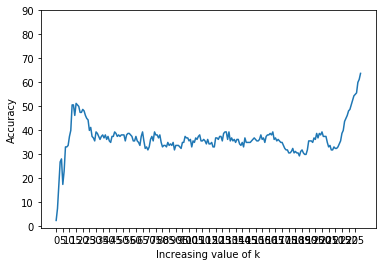

maximum accuracy for 60-40 split = 63.74999999999999


In [25]:
print_accuracy_plot(k_val1, acc_val1, 6, 4)

Plotting accuracy vs k


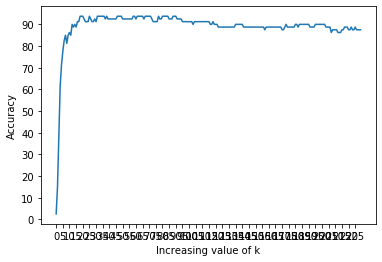

maximum accuracy for 80-20 split = 93.75


In [26]:
print_accuracy_plot(k_val2, acc_val2, 8, 2)

Plotting accuracy vs k


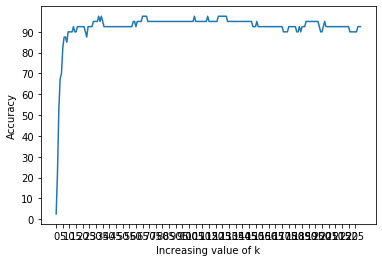

maximum accuracy for 90-10 split = 97.5


In [27]:
print_accuracy_plot(k_val3, acc_val3, 9, 1)

# In case of LDA the maximum accuracy we get for the following train-test splits are:
### 60-40 : 97.5 %
### 80-20 : 98.75 %
### 90-10 : 100.0 %

# In case of PCA(third assignment) the maximum accuracy we get for the following train-test splits are:
### 60-40 : 90.0 %
### 80-20 : 95.0 %
### 90-10 : 95.0 %

# Therefore LDA is providing better accuracy as compared to PCA

# Now

# Using Mahalonobis distance

In [28]:
k_val1, acc_val1 = diff_cases(6, 4, "mahalonobis")

feature vector =  [[ 48  45  45 ...  46  47  46]
 [ 60  58  68 ...  33  31  34]
 [ 39  44  59 ...  28  27  29]
 ...
 [130 126 123 ...  39  42  40]
 [128 129 126 ...  90  91  84]
 [123 128 126 ...  44  39  42]]
shape of feature vector =  (240, 10304)


mean vector =  [84.82916667 85.1        85.19583333 ... 70.25833333 71.25833333
 72.075     ]
shape of mean vector =  (10304,)


deviation matrix =  [[-36.82916667 -40.1        -40.19583333 ... -24.25833333 -24.25833333
  -26.075     ]
 [-24.82916667 -27.1        -17.19583333 ... -37.25833333 -40.25833333
  -38.075     ]
 [-45.82916667 -41.1        -26.19583333 ... -42.25833333 -44.25833333
  -43.075     ]
 ...
 [ 45.17083333  40.9         37.80416667 ... -31.25833333 -29.25833333
  -32.075     ]
 [ 43.17083333  43.9         40.80416667 ...  19.74166667  19.74166667
   11.925     ]
 [ 38.17083333  42.9         40.80416667 ... -26.25833333 -32.25833333
  -30.075     ]]
shape of deviation matrix =  (240, 10304)


covariance matrix =  [[1477

shape of eigen values vector --> (230,)
shape of eigen vector matrix --> (230, 230)



 Eigen values and eigen vectors
[-6.37951345e+20-2.90671055e+20j -6.37951345e+20+2.90671055e+20j
 -3.00916439e+20-6.73325607e+18j -3.00916439e+20+6.73325607e+18j
 -2.52050906e+20+0.00000000e+00j -1.65056676e+20-1.31615567e+19j
 -1.65056676e+20+1.31615567e+19j -1.38102346e+20+0.00000000e+00j
 -1.22182003e+20+0.00000000e+00j -1.07469397e+20+0.00000000e+00j
 -1.00325253e+20+0.00000000e+00j -8.03616477e+19-5.39017202e+18j
 -8.03616477e+19+5.39017202e+18j -6.88793701e+19+0.00000000e+00j
 -4.98419989e+19+0.00000000e+00j -2.11398457e+07+0.00000000e+00j
 -9.58880818e+06+0.00000000e+00j -8.37523551e+06+0.00000000e+00j
 -5.09152689e+06+0.00000000e+00j -4.01195560e+06-3.49062049e+06j
 -4.01195560e+06+3.49062049e+06j -4.01169153e+06+0.00000000e+00j
 -3.39539588e+06-6.92935518e+06j -3.39539588e+06+6.92935518e+06j
 -2.95293376e+06+0.00000000e+00j -2.30773349e+06+0.00000000e+00j
 -2.24530949e+06-7.80699333e+05j -2.

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

New feature vec with m columns = 
[[-0.00136274+0.j]
 [-0.00151413+0.j]
 [-0.00102808+0.j]
 [ 0.00674098+0.j]
 [ 0.00821482+0.j]
 [ 0.00041816+0.j]
 [ 0.00970251+0.j]
 [ 0.01263821+0.j]
 [-0.01828556+0.j]
 [ 0.00773516+0.j]
 [ 0.00685225+0.j]
 [-0.02631725+0.j]
 [-0.01191676+0.j]
 [-0.00272208+0.j]
 [-0.00787643+0.j]
 [ 0.01435975+0.j]
 [ 0.01100451+0.j]
 [ 0.00247244+0.j]
 [-0.00134534+0.j]
 [-0.03957753+0.j]
 [-0.00308467+0.j]
 [-0.00679156+0.j]
 [ 0.01215095+0.j]
 [ 0.01827449+0.j]
 [ 0.00417391+0.j]
 [-0.0297

[6, 38, 19, 9, 30, 4, 4, 10, 19, 34, 23, 19, 7, 9, 10, 2, 27, 17, 17, 2, 39, 23, 20, 5, 7, 30, 25, 10, 19, 7, 2, 9, 25, 18, 2, 30, 6, 17, 2, 30, 7, 25, 15, 9, 15, 15, 28, 14, 23, 23, 17, 6, 14, 14, 14, 14, 30, 34, 10, 9, 5, 32, 24, 17, 17, 19, 17, 19, 30, 30, 9, 26, 6, 5, 21, 17, 20, 29, 33, 20, 7, 17, 2, 25, 8, 9, 15, 11, 17, 34, 34, 34, 29, 5, 29, 1, 7, 21, 8, 25, 15, 37, 9, 18, 34, 17, 17, 19, 14, 37, 14, 40, 24, 32, 16, 33, 17, 19, 26, 34, 29, 31, 31, 10, 40, 2, 6, 34, 39, 24, 29, 20, 31, 10, 10, 10, 4, 10, 5, 9, 35, 9, 30, 21, 21, 4, 25, 7, 27, 19, 13, 6, 38, 5, 19, 10, 17, 34, 10, 10]

New feature vec with m columns = 
[[-1.36274199e-03+0.j  4.55752626e-04+0.j]
 [-1.51412989e-03+0.j -2.80974250e-03+0.j]
 [-1.02807847e-03+0.j  5.63906245e-03+0.j]
 [ 6.74098431e-03+0.j -2.76925601e-03+0.j]
 [ 8.21482215e-03+0.j  5.29202096e-04+0.j]
 [ 4.18163028e-04+0.j  4.10478974e-03+0.j]
 [ 9.70251424e-03+0.j -1.25991562e-03+0.j]
 [ 1.26382113e-02+0.j -4.18509137e-03+0.j]
 [-1.82855573e-02+0.j  

[5, 1, 17, 18, 26, 4, 30, 26, 40, 6, 23, 34, 9, 9, 4, 30, 38, 34, 34, 8, 13, 6, 33, 13, 7, 30, 21, 4, 23, 7, 30, 7, 37, 7, 30, 30, 38, 34, 2, 4, 9, 9, 15, 9, 12, 12, 12, 12, 23, 23, 40, 6, 14, 14, 14, 22, 30, 17, 36, 18, 5, 16, 32, 17, 17, 17, 17, 5, 4, 4, 7, 36, 19, 5, 37, 26, 20, 29, 29, 20, 7, 34, 7, 7, 2, 9, 22, 37, 40, 40, 10, 40, 29, 1, 39, 39, 25, 21, 8, 8, 11, 37, 7, 2, 26, 26, 17, 17, 28, 15, 28, 40, 33, 3, 5, 29, 23, 17, 10, 17, 33, 5, 5, 36, 26, 7, 38, 10, 32, 32, 29, 33, 1, 26, 26, 26, 8, 40, 13, 25, 16, 18, 4, 9, 21, 30, 37, 18, 38, 13, 31, 23, 38, 38, 17, 36, 40, 10, 40, 10]

New feature vec with m columns = 
[[-1.36274199e-03+0.j  4.55752626e-04+0.j  6.33887797e-04+0.j]
 [-1.51412989e-03+0.j -2.80974250e-03+0.j -1.44557971e-03+0.j]
 [-1.02807847e-03+0.j  5.63906245e-03+0.j  1.07149830e-02+0.j]
 [ 6.74098431e-03+0.j -2.76925601e-03+0.j  4.10917807e-04+0.j]
 [ 8.21482215e-03+0.j  5.29202096e-04+0.j  3.46298224e-03+0.j]
 [ 4.18163028e-04+0.j  4.10478974e-03+0.j  7.32955078e

[5, 38, 26, 18, 2, 2, 30, 4, 40, 40, 31, 10, 4, 4, 4, 7, 5, 2, 34, 40, 35, 6, 13, 13, 18, 30, 15, 4, 34, 18, 30, 18, 18, 8, 30, 36, 17, 10, 2, 4, 2, 9, 15, 2, 11, 12, 12, 12, 23, 23, 40, 6, 14, 15, 14, 22, 36, 17, 36, 18, 31, 29, 38, 17, 17, 17, 17, 19, 30, 30, 18, 36, 39, 31, 37, 19, 20, 29, 29, 20, 8, 34, 8, 21, 2, 9, 22, 22, 40, 40, 40, 40, 39, 31, 16, 27, 25, 21, 8, 8, 11, 21, 8, 36, 2, 17, 17, 17, 28, 11, 28, 40, 33, 3, 38, 39, 34, 34, 36, 2, 33, 31, 31, 30, 2, 8, 31, 36, 38, 38, 29, 33, 5, 34, 2, 2, 25, 6, 13, 6, 39, 18, 2, 9, 11, 2, 18, 9, 38, 40, 38, 34, 31, 38, 38, 30, 40, 40, 40, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j -1.23490579e-04-9.97884480e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j  7.77087208e-04+7.67224018e-04j]
 [-1.02807847e-03+0.00000000e+00j  5.63906245e-03+0.00000000e+00j
   1.07149830e-02+0.00000000e+00

[26, 31, 5, 37, 36, 36, 36, 2, 36, 36, 36, 36, 4, 4, 4, 7, 36, 36, 36, 40, 23, 6, 13, 6, 7, 7, 7, 17, 36, 36, 36, 36, 37, 8, 37, 36, 31, 10, 36, 17, 2, 37, 37, 9, 11, 12, 12, 12, 23, 23, 23, 13, 11, 15, 14, 37, 36, 19, 36, 36, 38, 33, 38, 19, 16, 16, 16, 16, 36, 36, 36, 36, 31, 31, 36, 19, 20, 31, 33, 20, 36, 36, 36, 8, 9, 36, 37, 36, 23, 40, 40, 8, 24, 31, 16, 16, 25, 25, 36, 25, 11, 25, 8, 30, 2, 17, 17, 17, 28, 25, 12, 26, 33, 23, 38, 29, 36, 36, 36, 36, 32, 31, 32, 36, 2, 36, 36, 36, 3, 38, 33, 33, 5, 36, 2, 36, 40, 6, 6, 6, 39, 37, 36, 37, 25, 36, 36, 36, 38, 23, 38, 3, 32, 36, 36, 36, 23, 23, 36, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j -1.23490579e-04-9.97884480e-06j
  -1.23490579e-04+9.97884480e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j  7.77087208e-04+7.67224018e-04j
   7.77087208e-04-7.67224018e-04j]
 [-1.02807847e-03

[26, 31, 5, 37, 36, 36, 36, 2, 36, 36, 36, 36, 4, 4, 4, 7, 36, 36, 36, 40, 23, 23, 13, 6, 7, 7, 7, 10, 36, 36, 36, 36, 37, 36, 37, 36, 31, 10, 36, 10, 2, 37, 15, 9, 12, 21, 12, 12, 23, 23, 23, 23, 11, 15, 14, 37, 36, 19, 36, 36, 38, 31, 36, 19, 16, 16, 16, 16, 36, 36, 36, 36, 31, 31, 36, 19, 20, 31, 33, 20, 36, 36, 36, 8, 36, 36, 36, 36, 23, 23, 40, 3, 24, 31, 16, 16, 25, 25, 36, 25, 11, 25, 8, 26, 31, 17, 17, 16, 14, 25, 12, 26, 33, 23, 38, 33, 36, 36, 36, 36, 32, 31, 32, 36, 2, 36, 36, 36, 3, 1, 33, 33, 5, 36, 36, 36, 40, 6, 6, 6, 32, 37, 36, 37, 25, 36, 36, 36, 38, 23, 3, 38, 32, 36, 36, 36, 23, 36, 26, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j -1.23490579e-04-9.97884480e-06j
  -1.23490579e-04+9.97884480e-06j -9.10590145e-04+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j  7.77087208e-04+7.67224018e-04j
   7.77087208e-0

[5, 31, 3, 37, 36, 36, 26, 2, 36, 36, 36, 36, 4, 4, 4, 7, 36, 36, 36, 36, 23, 6, 35, 6, 7, 2, 7, 10, 36, 15, 8, 15, 37, 30, 37, 18, 10, 10, 36, 10, 2, 10, 36, 10, 12, 21, 12, 12, 36, 35, 23, 13, 11, 15, 15, 22, 36, 19, 36, 36, 38, 33, 1, 36, 4, 16, 4, 16, 36, 36, 36, 36, 19, 5, 36, 32, 20, 31, 16, 20, 36, 36, 36, 11, 36, 36, 22, 36, 23, 23, 36, 23, 24, 31, 24, 16, 25, 25, 36, 25, 15, 12, 8, 26, 4, 17, 17, 17, 12, 14, 11, 26, 29, 3, 3, 29, 36, 3, 36, 36, 32, 31, 38, 36, 10, 8, 36, 36, 3, 1, 33, 33, 3, 36, 36, 36, 6, 21, 35, 6, 32, 37, 36, 37, 26, 36, 36, 36, 38, 23, 38, 38, 3, 36, 36, 36, 23, 36, 23, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.23490579e-04+9.97884480e-06j
  -9.10590145e-04+0.00000000e+00j -1.43811897e-04+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  7.77087208e-04-7.67224018e-04j
   1.82567567e-

[23, 29, 23, 36, 36, 36, 36, 2, 36, 36, 38, 38, 4, 4, 4, 26, 5, 9, 3, 8, 3, 6, 13, 6, 26, 26, 15, 7, 36, 15, 8, 8, 37, 30, 37, 30, 19, 10, 9, 10, 10, 10, 11, 19, 12, 12, 12, 12, 23, 23, 23, 13, 11, 14, 15, 15, 5, 19, 5, 22, 1, 1, 1, 32, 16, 17, 16, 16, 36, 36, 36, 36, 19, 32, 36, 32, 20, 16, 16, 20, 36, 3, 36, 11, 9, 37, 22, 36, 23, 23, 36, 25, 24, 39, 24, 16, 25, 25, 25, 25, 15, 12, 8, 26, 10, 17, 17, 17, 12, 25, 11, 26, 29, 33, 1, 29, 36, 30, 36, 30, 32, 31, 32, 36, 10, 8, 32, 36, 33, 1, 33, 33, 34, 36, 36, 36, 11, 40, 35, 40, 32, 18, 36, 37, 26, 36, 36, 9, 3, 23, 3, 3, 3, 3, 30, 9, 36, 36, 25, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.43811897e-04+0.00000000e+00j
  -3.32199672e-04-6.70838693e-06j -3.32199672e-04+6.70838693e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.67692633e-03+0.00000000e+00j
  -7.24014817e-04-

[23, 1, 23, 36, 36, 2, 36, 2, 30, 30, 38, 38, 4, 4, 4, 31, 5, 9, 5, 12, 3, 6, 23, 6, 26, 25, 15, 7, 8, 15, 8, 8, 37, 30, 37, 37, 19, 10, 37, 19, 19, 19, 37, 19, 12, 12, 12, 12, 23, 23, 23, 13, 11, 11, 14, 15, 5, 19, 5, 22, 1, 1, 39, 32, 16, 17, 17, 16, 37, 36, 18, 30, 19, 10, 11, 32, 20, 16, 16, 20, 36, 3, 36, 11, 9, 37, 22, 11, 23, 23, 40, 25, 24, 39, 24, 16, 25, 25, 25, 25, 15, 12, 12, 26, 10, 17, 27, 27, 28, 11, 11, 23, 29, 35, 1, 29, 30, 30, 36, 30, 1, 31, 39, 30, 10, 11, 32, 5, 33, 1, 33, 33, 34, 34, 34, 34, 40, 40, 35, 40, 32, 36, 10, 37, 26, 30, 37, 9, 3, 23, 3, 3, 3, 3, 37, 37, 40, 40, 30, 40]

New feature vec with m columns = 
[[-0.00136274+0.00000000e+00j  0.00045575+0.00000000e+00j
   0.00063389+0.00000000e+00j ... -0.0003322 +6.70838693e-06j
   0.00027913+0.00000000e+00j  0.0004889 +0.00000000e+00j]
 [-0.00151413+0.00000000e+00j -0.00280974+0.00000000e+00j
  -0.00144558+0.00000000e+00j ... -0.00072401+3.11957486e-04j
   0.00042049+0.00000000e+00j  0.00045305+0.00000000e+00j

[1, 1, 1, 36, 2, 2, 2, 2, 3, 36, 38, 38, 4, 4, 4, 31, 5, 5, 30, 11, 30, 6, 35, 6, 15, 25, 15, 7, 8, 8, 8, 8, 30, 30, 9, 34, 19, 10, 37, 10, 19, 19, 11, 19, 12, 12, 12, 12, 23, 13, 23, 13, 11, 11, 14, 15, 22, 19, 5, 22, 36, 2, 39, 19, 19, 17, 17, 17, 30, 18, 18, 40, 19, 10, 11, 19, 20, 16, 16, 20, 40, 37, 40, 11, 19, 34, 15, 11, 25, 23, 23, 23, 24, 24, 24, 16, 25, 11, 25, 25, 22, 26, 11, 26, 10, 16, 27, 27, 28, 11, 11, 23, 29, 33, 36, 29, 30, 30, 18, 30, 39, 31, 39, 30, 19, 34, 32, 5, 33, 1, 33, 33, 34, 34, 34, 34, 40, 40, 35, 40, 19, 36, 10, 18, 26, 23, 37, 37, 38, 25, 38, 23, 39, 39, 39, 37, 40, 40, 30, 23]

New feature vec with m columns = 
[[-1.36274199e-03+0.j          4.55752626e-04+0.j
   6.33887797e-04+0.j         ...  4.88899928e-04+0.j
  -4.80250957e-04+0.j         -8.26867156e-05-0.00025425j]
 [-1.51412989e-03+0.j         -2.80974250e-03+0.j
  -1.44557971e-03+0.j         ...  4.53046197e-04+0.j
   1.18665759e-05+0.j          6.78284266e-04-0.00019725j]
 [-1.02807847e-03+0.j  

[1, 1, 1, 36, 2, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 31, 5, 26, 30, 11, 30, 6, 35, 6, 15, 25, 15, 7, 8, 8, 8, 8, 30, 30, 9, 34, 19, 10, 26, 10, 19, 15, 11, 19, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 22, 9, 22, 22, 36, 39, 39, 17, 19, 17, 17, 17, 30, 18, 18, 40, 19, 10, 11, 19, 20, 16, 16, 20, 40, 37, 40, 40, 19, 34, 22, 11, 25, 23, 23, 37, 24, 24, 24, 24, 25, 11, 25, 25, 22, 26, 11, 26, 10, 16, 27, 27, 28, 11, 18, 25, 29, 36, 36, 29, 30, 30, 30, 30, 39, 31, 39, 18, 15, 15, 32, 26, 33, 1, 33, 33, 34, 34, 34, 34, 40, 40, 30, 40, 39, 36, 10, 11, 26, 37, 37, 26, 38, 25, 38, 25, 39, 37, 39, 38, 40, 35, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.j          4.55752626e-04+0.j
   6.33887797e-04+0.j         ... -8.26867156e-05-0.00025425j
  -8.26867156e-05+0.00025425j -3.61638902e-04+0.j        ]
 [-1.51412989e-03+0.j         -2.80974250e-03+0.j
  -1.44557971e-03+0.j         ...  6.78284266e-04-0.00019725j
   6.78284266e-04+0.00019725j -9.02457830e-05+0.j        ]
 [-1.0

[1, 1, 1, 36, 2, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 31, 5, 5, 30, 11, 30, 6, 35, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 30, 9, 30, 19, 10, 26, 10, 19, 15, 11, 19, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 11, 22, 26, 9, 15, 15, 36, 24, 39, 31, 19, 17, 17, 17, 30, 18, 18, 40, 19, 10, 11, 19, 20, 16, 16, 20, 40, 38, 40, 40, 19, 37, 22, 11, 23, 23, 23, 37, 24, 24, 24, 39, 25, 11, 25, 25, 22, 26, 11, 26, 10, 16, 27, 27, 28, 11, 18, 26, 29, 33, 35, 29, 30, 30, 30, 30, 39, 31, 39, 18, 15, 15, 32, 26, 33, 1, 33, 33, 39, 34, 34, 34, 40, 40, 35, 40, 39, 36, 10, 11, 26, 37, 37, 26, 38, 40, 38, 38, 39, 39, 39, 3, 40, 35, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.j  4.55752626e-04+0.j  6.33887797e-04+0.j ...
  -3.61638902e-04+0.j  3.09953902e-04+0.j -2.31439815e-04+0.j]
 [-1.51412989e-03+0.j -2.80974250e-03+0.j -1.44557971e-03+0.j ...
  -9.02457830e-05+0.j  4.65413684e-04+0.j -3.20062359e-04+0.j]
 [-1.02807847e-03+0.j  5.63906245e-03+0.j  1.07149830e-02+0.j ...
   1.72549887e-03+0.j  1.0

[1, 1, 1, 36, 2, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 31, 5, 9, 30, 11, 30, 6, 5, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 30, 9, 30, 19, 10, 26, 10, 19, 15, 11, 19, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 15, 36, 24, 39, 31, 19, 17, 17, 17, 30, 18, 18, 18, 19, 10, 11, 19, 20, 16, 16, 20, 40, 37, 40, 40, 19, 37, 22, 11, 23, 23, 23, 37, 24, 24, 24, 39, 25, 11, 25, 25, 22, 26, 11, 26, 10, 16, 27, 27, 28, 11, 18, 26, 29, 33, 35, 29, 30, 30, 30, 30, 39, 31, 39, 18, 15, 15, 32, 26, 33, 1, 33, 33, 39, 34, 34, 34, 40, 40, 35, 40, 39, 36, 10, 11, 26, 37, 37, 26, 38, 40, 38, 38, 39, 39, 39, 3, 40, 35, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.j          4.55752626e-04+0.j
   6.33887797e-04+0.j         ... -2.31439815e-04+0.j
  -6.78096419e-05-0.0002024j  -6.78096419e-05+0.0002024j ]
 [-1.51412989e-03+0.j         -2.80974250e-03+0.j
  -1.44557971e-03+0.j         ... -3.20062359e-04+0.j
  -3.62313407e-04-0.0001928j  -3.62313407e-04+0.0001928j ]
 [-1.02807847e-03+0.j    

[1, 1, 1, 36, 2, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 31, 5, 9, 30, 30, 30, 6, 35, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 30, 9, 30, 19, 10, 26, 10, 19, 15, 11, 19, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 9, 31, 26, 15, 36, 1, 39, 31, 19, 17, 17, 17, 30, 18, 18, 18, 19, 10, 11, 19, 20, 16, 16, 20, 40, 37, 40, 40, 19, 37, 22, 11, 23, 23, 23, 37, 24, 24, 24, 16, 25, 11, 25, 25, 22, 26, 11, 5, 10, 16, 27, 27, 28, 40, 18, 26, 29, 33, 35, 29, 30, 30, 30, 30, 16, 31, 39, 18, 15, 15, 32, 9, 33, 1, 33, 33, 1, 34, 34, 34, 40, 40, 35, 40, 39, 36, 10, 34, 26, 37, 37, 26, 38, 40, 38, 38, 39, 39, 39, 38, 40, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -6.78096419e-05+2.02396562e-04j
   1.33729620e-04+3.22211092e-06j  1.33729620e-04-3.22211092e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.62313407e-04+1.92799437e-04j
   2.74130959e

[1, 1, 1, 36, 2, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 31, 5, 9, 30, 30, 30, 6, 35, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 30, 9, 30, 19, 10, 26, 10, 19, 15, 11, 19, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 15, 36, 1, 39, 39, 19, 17, 17, 17, 30, 18, 18, 18, 19, 10, 11, 19, 20, 16, 16, 20, 40, 37, 40, 40, 19, 37, 22, 11, 23, 23, 23, 37, 24, 24, 24, 39, 25, 11, 25, 25, 22, 26, 11, 5, 10, 16, 27, 27, 28, 40, 18, 26, 29, 33, 40, 29, 30, 30, 30, 30, 39, 31, 39, 18, 26, 15, 32, 9, 33, 1, 33, 33, 39, 34, 34, 34, 40, 40, 35, 40, 39, 36, 10, 34, 26, 37, 37, 26, 38, 40, 38, 38, 39, 39, 39, 37, 40, 35, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.33729620e-04-3.22211092e-06j
  -8.49024223e-05+8.20381580e-06j -8.49024223e-05-8.20381580e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.74130959e-04-9.74293571e-06j
  -1.80727570

[1, 1, 1, 36, 2, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 31, 26, 9, 9, 30, 30, 6, 35, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 30, 9, 30, 19, 10, 26, 10, 19, 15, 11, 19, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 11, 22, 26, 9, 26, 15, 36, 1, 39, 39, 19, 17, 17, 17, 30, 18, 18, 40, 19, 10, 11, 19, 20, 16, 16, 20, 40, 37, 40, 40, 19, 37, 22, 11, 23, 23, 23, 37, 24, 24, 24, 39, 25, 11, 25, 25, 22, 26, 11, 5, 10, 16, 27, 27, 28, 11, 21, 26, 29, 33, 36, 29, 30, 30, 30, 30, 39, 31, 39, 18, 26, 15, 32, 9, 33, 1, 33, 33, 39, 34, 34, 34, 40, 40, 35, 40, 39, 36, 10, 34, 26, 37, 37, 26, 38, 40, 38, 38, 39, 39, 37, 37, 40, 35, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -8.49024223e-05-8.20381580e-06j
  -1.72973654e-05+7.08975229e-06j -1.72973654e-05-7.08975229e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.80727570e-04-5.25655392e-05j
  -1.18454629

[1, 1, 1, 36, 2, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 31, 5, 9, 9, 30, 30, 6, 5, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 30, 9, 30, 19, 10, 26, 10, 37, 37, 11, 19, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 15, 36, 1, 39, 39, 19, 17, 17, 16, 30, 18, 18, 18, 19, 39, 11, 19, 20, 16, 16, 20, 40, 37, 40, 40, 19, 37, 22, 11, 23, 23, 23, 37, 24, 24, 16, 39, 25, 11, 25, 25, 22, 26, 11, 5, 10, 16, 27, 2, 28, 40, 21, 26, 29, 33, 36, 29, 30, 30, 30, 30, 39, 31, 39, 18, 37, 15, 32, 9, 33, 40, 33, 33, 39, 34, 34, 34, 40, 40, 35, 40, 39, 36, 10, 30, 37, 37, 37, 37, 38, 40, 38, 38, 39, 39, 37, 37, 40, 35, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.72973654e-05-7.08975229e-06j
   1.38410390e-05+5.02278763e-05j  1.38410390e-05-5.02278763e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.18454629e-05-2.15042434e-05j
   2.17051716e-

[1, 1, 1, 36, 36, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 31, 5, 9, 9, 30, 30, 6, 5, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 30, 9, 30, 10, 10, 10, 10, 37, 37, 37, 19, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 37, 36, 1, 39, 39, 16, 17, 17, 16, 30, 18, 18, 18, 19, 39, 11, 19, 20, 16, 16, 20, 40, 37, 40, 40, 9, 37, 22, 11, 23, 23, 23, 37, 24, 1, 16, 39, 25, 11, 25, 25, 22, 26, 11, 5, 10, 16, 27, 2, 28, 40, 21, 26, 29, 33, 36, 29, 30, 30, 30, 30, 39, 31, 39, 18, 37, 15, 32, 9, 33, 40, 33, 33, 39, 34, 34, 34, 40, 40, 30, 40, 39, 36, 10, 30, 37, 37, 37, 37, 38, 40, 38, 38, 39, 39, 37, 37, 40, 35, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.38410390e-05-5.02278763e-05j
   1.87907648e-05+0.00000000e+00j -2.83064893e-06-2.11763208e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.17051716e-04-6.37515922e-05j
   2.17874586e-0

[1, 1, 1, 36, 36, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 31, 5, 9, 9, 30, 30, 6, 5, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 30, 9, 30, 19, 10, 10, 10, 37, 37, 37, 9, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 15, 36, 1, 39, 39, 16, 17, 17, 16, 30, 18, 18, 18, 19, 39, 11, 19, 20, 16, 16, 20, 40, 37, 40, 40, 9, 37, 22, 11, 23, 23, 23, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 26, 26, 5, 10, 16, 27, 2, 28, 40, 21, 26, 29, 33, 36, 29, 30, 30, 30, 30, 39, 31, 39, 18, 37, 18, 32, 9, 33, 40, 33, 33, 39, 34, 34, 34, 40, 40, 30, 40, 39, 36, 10, 30, 37, 37, 37, 37, 38, 37, 38, 38, 39, 39, 37, 37, 40, 35, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.83064893e-06-2.11763208e-05j
  -2.83064893e-06+2.11763208e-05j -1.27388219e-05+8.87636568e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.42116655e-05-2.23704473e-05j
  -2.42116655e-05

[1, 1, 1, 36, 36, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 31, 5, 9, 9, 30, 30, 6, 5, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 30, 9, 30, 19, 10, 10, 10, 37, 37, 37, 9, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 37, 36, 1, 39, 39, 16, 17, 17, 16, 30, 18, 18, 18, 19, 39, 11, 19, 20, 16, 16, 20, 40, 37, 40, 40, 9, 37, 22, 11, 23, 23, 23, 37, 24, 24, 16, 16, 25, 11, 25, 25, 22, 12, 11, 5, 10, 16, 27, 2, 28, 11, 21, 26, 29, 33, 36, 29, 30, 30, 30, 30, 39, 31, 39, 18, 37, 34, 9, 9, 33, 40, 33, 33, 39, 34, 34, 34, 40, 40, 30, 40, 39, 36, 10, 34, 37, 37, 37, 37, 38, 40, 38, 38, 39, 39, 37, 37, 40, 35, 11, 35]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.27388219e-05+8.87636568e-06j
  -1.27388219e-05-8.87636568e-06j  6.58264244e-06+4.62862847e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -4.95413293e-05+2.82300606e-07j
  -4.95413293e-05

[1, 1, 1, 36, 36, 2, 2, 2, 3, 3, 38, 38, 9, 4, 4, 31, 5, 9, 9, 30, 30, 6, 5, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 30, 9, 9, 19, 10, 10, 10, 37, 37, 37, 9, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 37, 36, 1, 39, 9, 16, 17, 17, 16, 37, 18, 40, 18, 19, 39, 40, 19, 20, 16, 16, 20, 40, 37, 40, 40, 9, 37, 22, 11, 23, 23, 40, 37, 24, 39, 16, 39, 25, 11, 25, 25, 22, 12, 12, 5, 10, 16, 2, 2, 28, 40, 28, 12, 29, 33, 36, 29, 30, 30, 30, 30, 39, 9, 39, 40, 37, 15, 9, 9, 33, 40, 33, 33, 39, 34, 9, 30, 40, 40, 30, 40, 39, 36, 10, 34, 37, 37, 37, 37, 38, 37, 38, 38, 39, 39, 37, 37, 40, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  6.58264244e-06+4.62862847e-05j
   6.58264244e-06-4.62862847e-05j  6.52584380e-05-6.26364024e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -6.85635765e-05+3.28154858e-05j
  -6.85635765e-05-3.28

[1, 1, 1, 36, 36, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 14, 26, 38, 38, 30, 9, 6, 35, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 9, 9, 9, 19, 10, 38, 10, 37, 37, 11, 9, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 26, 36, 1, 39, 38, 16, 31, 17, 16, 40, 18, 40, 18, 19, 38, 11, 10, 20, 16, 16, 20, 40, 38, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 39, 39, 39, 25, 11, 25, 25, 22, 38, 12, 38, 10, 16, 2, 2, 28, 40, 21, 38, 29, 33, 36, 29, 30, 30, 30, 30, 39, 38, 39, 40, 38, 15, 9, 9, 33, 40, 33, 33, 39, 34, 9, 30, 35, 35, 35, 40, 31, 36, 10, 34, 37, 38, 37, 37, 38, 38, 38, 38, 39, 39, 37, 37, 40, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  6.52584380e-05-6.26364024e-05j
   6.52584380e-05+6.26364024e-05j  3.25079342e-05+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  6.86886719e-05+2.31380197e-05j
   6.86886719e-05-

[1, 1, 1, 36, 36, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 14, 38, 38, 38, 30, 38, 6, 35, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 9, 9, 9, 19, 10, 38, 10, 37, 37, 11, 9, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 26, 26, 36, 1, 39, 38, 16, 31, 17, 16, 37, 18, 40, 18, 19, 38, 11, 10, 20, 16, 16, 20, 40, 38, 40, 40, 9, 37, 37, 11, 23, 23, 40, 37, 24, 39, 39, 39, 25, 11, 25, 25, 22, 38, 12, 38, 10, 16, 2, 2, 28, 40, 21, 38, 29, 33, 36, 29, 30, 30, 30, 30, 39, 38, 39, 40, 38, 15, 9, 9, 33, 40, 33, 33, 39, 34, 9, 30, 35, 35, 35, 40, 39, 36, 10, 34, 37, 38, 37, 37, 38, 38, 38, 38, 39, 39, 37, 3, 40, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  3.25079342e-05+0.00000000e+00j
  -3.51583260e-05-2.97088705e-05j -3.51583260e-05+2.97088705e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.86153974e-05+0.00000000e+00j
   1.30859378e-0

[1, 1, 1, 36, 36, 2, 2, 2, 3, 3, 38, 38, 4, 4, 4, 38, 38, 38, 38, 30, 38, 6, 35, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 9, 9, 9, 19, 10, 38, 10, 37, 37, 37, 9, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 26, 36, 1, 39, 38, 16, 31, 17, 16, 37, 18, 40, 18, 19, 38, 11, 10, 20, 16, 16, 20, 40, 38, 40, 40, 9, 37, 38, 11, 23, 23, 40, 37, 24, 39, 39, 39, 25, 11, 25, 25, 22, 38, 38, 38, 10, 16, 2, 2, 28, 40, 21, 38, 29, 33, 36, 29, 30, 30, 30, 38, 39, 38, 39, 40, 38, 15, 9, 9, 33, 40, 33, 33, 39, 34, 9, 30, 35, 35, 35, 40, 39, 36, 10, 34, 37, 38, 37, 37, 38, 38, 38, 38, 39, 39, 37, 3, 40, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.51583260e-05+2.97088705e-05j
  -3.85361912e-06+1.85784723e-05j -3.85361912e-06-1.85784723e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.30859378e-05-3.62297757e-06j
  -9.09667386e-06

[1, 1, 1, 36, 36, 2, 2, 2, 38, 3, 38, 38, 4, 4, 4, 14, 38, 38, 38, 30, 38, 6, 35, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 9, 9, 9, 19, 10, 38, 10, 37, 37, 11, 9, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 37, 36, 1, 39, 38, 16, 31, 17, 16, 37, 18, 40, 18, 38, 38, 11, 10, 20, 16, 16, 20, 40, 38, 40, 40, 9, 9, 38, 11, 23, 23, 40, 37, 24, 39, 39, 39, 25, 11, 25, 25, 22, 38, 38, 38, 10, 16, 2, 2, 28, 40, 21, 38, 29, 35, 36, 29, 30, 30, 30, 30, 39, 38, 39, 40, 38, 15, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 40, 35, 40, 39, 36, 10, 34, 37, 38, 37, 37, 38, 38, 38, 38, 39, 39, 37, 3, 40, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.85361912e-06-1.85784723e-05j
  -2.17030721e-05-2.71329441e-06j -2.17030721e-05+2.71329441e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -9.09667386e-06-1.04058601e-06j
   6.33430695e-06+

[1, 1, 1, 36, 36, 2, 2, 2, 38, 3, 38, 38, 4, 4, 4, 14, 38, 38, 38, 30, 38, 6, 35, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 9, 9, 9, 19, 10, 19, 10, 37, 37, 11, 9, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 26, 27, 1, 39, 38, 16, 31, 17, 16, 37, 18, 40, 18, 19, 38, 11, 10, 20, 16, 16, 20, 40, 38, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 24, 39, 39, 25, 11, 25, 25, 22, 38, 12, 38, 10, 16, 2, 2, 28, 40, 21, 38, 29, 35, 37, 29, 30, 30, 30, 30, 39, 38, 39, 40, 38, 15, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 40, 35, 40, 39, 36, 10, 34, 37, 38, 37, 37, 38, 38, 38, 38, 39, 39, 37, 3, 40, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.17030721e-05+2.71329441e-06j
  -9.45832595e-06+0.00000000e+00j  7.59317838e-05+1.33057076e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  6.33430695e-06-3.88989051e-05j
  -7.01657437e-06+

[1, 1, 1, 36, 36, 2, 2, 2, 38, 3, 38, 38, 4, 4, 4, 14, 38, 38, 38, 30, 9, 6, 35, 6, 15, 37, 15, 7, 8, 8, 8, 8, 30, 9, 9, 9, 19, 10, 38, 10, 37, 37, 11, 9, 12, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 9, 26, 26, 36, 1, 39, 38, 16, 31, 17, 16, 37, 18, 18, 18, 19, 38, 11, 10, 20, 16, 16, 20, 40, 38, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 24, 39, 39, 25, 11, 25, 25, 22, 38, 12, 38, 10, 16, 2, 2, 28, 40, 21, 38, 29, 35, 37, 29, 30, 30, 30, 30, 39, 38, 39, 40, 38, 15, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 40, 39, 36, 10, 37, 37, 38, 37, 37, 38, 38, 38, 38, 39, 39, 37, 3, 40, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  7.59317838e-05+1.33057076e-05j
   7.59317838e-05-1.33057076e-05j  2.33699346e-04-3.45096724e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.45549449e-05+1.43096886e-05j
   2.45549449e-05-1

[1, 1, 1, 36, 1, 2, 1, 2, 12, 37, 38, 38, 4, 4, 4, 14, 26, 38, 38, 30, 9, 6, 1, 6, 15, 37, 15, 7, 40, 8, 8, 8, 30, 37, 9, 9, 19, 10, 19, 10, 37, 15, 37, 9, 12, 12, 12, 12, 3, 13, 1, 13, 11, 11, 14, 22, 22, 9, 22, 26, 27, 1, 39, 9, 16, 31, 17, 17, 31, 18, 40, 18, 19, 38, 40, 10, 16, 16, 16, 20, 40, 38, 40, 40, 9, 37, 37, 11, 23, 23, 40, 37, 24, 1, 16, 39, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 27, 2, 28, 28, 40, 12, 29, 35, 37, 29, 30, 30, 30, 30, 1, 38, 39, 1, 37, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 40, 39, 36, 10, 30, 37, 37, 37, 37, 38, 37, 38, 38, 39, 37, 37, 3, 40, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.33699346e-04-3.45096724e-05j
   2.33699346e-04+3.45096724e-05j  1.85245776e-05+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.03709967e-04+1.30205982e-04j
   1.03709967e-04-1.30

[1, 1, 1, 36, 1, 2, 2, 2, 12, 3, 38, 38, 4, 4, 4, 14, 26, 38, 9, 30, 9, 6, 1, 6, 15, 37, 15, 7, 40, 8, 8, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 15, 37, 9, 12, 12, 12, 12, 3, 13, 1, 13, 11, 11, 14, 22, 22, 31, 22, 26, 27, 1, 39, 39, 16, 31, 17, 17, 40, 18, 40, 18, 19, 38, 11, 10, 16, 16, 16, 20, 40, 38, 40, 40, 9, 37, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 27, 2, 28, 28, 40, 12, 29, 35, 37, 29, 30, 30, 30, 30, 1, 38, 39, 1, 37, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 40, 39, 36, 10, 30, 37, 37, 40, 37, 38, 37, 38, 38, 39, 39, 37, 3, 40, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.85245776e-05+0.00000000e+00j
  -1.84266097e-05-1.13470159e-05j -1.84266097e-05+1.13470159e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -9.90172084e-06+0.00000000e+00j
   5.76735585e-06-5.04

[1, 1, 1, 36, 1, 2, 1, 2, 12, 3, 38, 38, 4, 4, 4, 14, 26, 38, 9, 30, 9, 6, 1, 6, 15, 37, 15, 7, 40, 8, 8, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 15, 37, 9, 12, 12, 12, 12, 3, 13, 1, 13, 11, 11, 14, 22, 26, 31, 22, 26, 27, 1, 39, 39, 16, 31, 17, 16, 40, 18, 40, 18, 19, 38, 11, 10, 16, 16, 16, 20, 40, 38, 40, 40, 9, 37, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 27, 2, 28, 40, 40, 12, 29, 35, 33, 29, 30, 30, 30, 30, 1, 38, 39, 1, 37, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 40, 39, 36, 10, 30, 37, 37, 40, 37, 38, 37, 38, 38, 39, 39, 37, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.84266097e-05+1.13470159e-05j
  -1.45412005e-05-2.00185796e-06j -1.45412005e-05+2.00185796e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  5.76735585e-06+5.04774642e-06j
  -3.38449163e-06+3.56

[1, 1, 1, 36, 1, 2, 1, 2, 12, 12, 38, 38, 9, 4, 4, 14, 26, 38, 38, 30, 9, 6, 1, 6, 15, 37, 15, 7, 40, 8, 8, 8, 30, 9, 9, 9, 19, 10, 19, 10, 37, 15, 37, 9, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 22, 26, 31, 22, 26, 27, 1, 39, 19, 16, 31, 17, 16, 40, 18, 40, 36, 19, 38, 11, 10, 16, 16, 16, 20, 40, 38, 40, 40, 9, 9, 37, 12, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 27, 2, 28, 40, 40, 12, 29, 35, 33, 29, 30, 30, 30, 30, 1, 38, 39, 1, 37, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 40, 39, 36, 10, 30, 12, 37, 40, 37, 38, 37, 38, 38, 39, 39, 37, 3, 35, 12, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.45412005e-05+2.00185796e-06j
  -2.73956545e-05+2.37243294e-05j -2.73956545e-05-2.37243294e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.38449163e-06-3.56389984e-06j
  -3.57646958e-05-3.8

[1, 1, 1, 36, 36, 2, 36, 2, 12, 12, 38, 38, 9, 4, 4, 14, 26, 38, 9, 30, 9, 6, 1, 6, 15, 18, 15, 7, 40, 8, 8, 8, 30, 9, 9, 9, 10, 10, 19, 10, 37, 31, 37, 9, 12, 12, 12, 12, 3, 13, 12, 13, 11, 12, 14, 22, 26, 31, 22, 26, 27, 1, 39, 9, 16, 31, 17, 16, 40, 18, 18, 36, 19, 38, 11, 10, 16, 16, 16, 20, 40, 38, 40, 40, 9, 9, 12, 12, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 27, 2, 28, 40, 18, 12, 29, 35, 37, 29, 30, 30, 30, 30, 1, 38, 38, 1, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 10, 30, 12, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 3, 35, 12, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.73956545e-05-2.37243294e-05j
   5.77712366e-05-5.38414137e-05j  5.77712366e-05+5.38414137e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.57646958e-05+3.80136009e-06j
   1.15116349e-05+4.9

[1, 1, 1, 36, 36, 2, 36, 2, 12, 12, 38, 38, 4, 4, 4, 14, 26, 38, 9, 30, 9, 6, 1, 6, 15, 18, 31, 7, 12, 8, 8, 12, 30, 9, 9, 9, 10, 10, 19, 10, 37, 31, 37, 22, 12, 12, 12, 12, 3, 13, 12, 13, 11, 12, 14, 22, 26, 31, 22, 26, 27, 1, 39, 9, 16, 31, 16, 16, 31, 18, 18, 18, 19, 12, 37, 10, 16, 16, 16, 20, 40, 38, 40, 12, 9, 9, 12, 12, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 27, 2, 28, 40, 18, 12, 29, 35, 37, 29, 30, 30, 30, 30, 1, 38, 38, 1, 38, 9, 9, 9, 33, 40, 33, 33, 39, 31, 9, 9, 35, 35, 35, 35, 39, 36, 10, 30, 12, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 30, 35, 12, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.77712366e-05+5.38414137e-05j
  -4.47112789e-06+7.06981724e-07j -4.47112789e-06-7.06981724e-07j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.15116349e-05-4.98799849e-06j
  -2.34407674e-05-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 12, 38, 38, 4, 4, 4, 14, 26, 38, 38, 30, 9, 6, 1, 6, 15, 18, 15, 7, 40, 8, 8, 12, 30, 9, 9, 9, 10, 10, 19, 10, 37, 31, 37, 22, 12, 12, 12, 12, 3, 13, 12, 13, 11, 12, 14, 22, 26, 31, 22, 26, 27, 1, 39, 9, 16, 31, 16, 16, 18, 18, 18, 18, 19, 38, 37, 10, 16, 16, 16, 20, 40, 38, 40, 40, 9, 9, 12, 12, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 27, 2, 28, 40, 18, 12, 29, 35, 37, 29, 30, 30, 30, 30, 1, 38, 38, 1, 38, 9, 9, 9, 33, 40, 33, 33, 39, 31, 9, 9, 40, 35, 35, 35, 39, 36, 10, 30, 12, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 30, 35, 12, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.47112789e-06-7.06981724e-07j
  -5.87561719e-06+5.42597377e-06j -5.87561719e-06-5.42597377e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.34407674e-05+9.45581482e-06j
   9.72362378e-06

[1, 1, 1, 36, 36, 2, 36, 2, 12, 12, 38, 38, 4, 4, 4, 14, 26, 38, 38, 30, 9, 6, 1, 6, 15, 18, 15, 7, 40, 8, 8, 12, 30, 9, 9, 9, 10, 10, 19, 10, 37, 31, 37, 22, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 22, 26, 31, 22, 26, 27, 1, 39, 9, 16, 31, 17, 16, 18, 18, 18, 18, 19, 12, 11, 10, 16, 16, 16, 20, 40, 38, 40, 40, 9, 9, 12, 12, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 27, 2, 28, 40, 18, 12, 29, 35, 37, 29, 30, 30, 30, 30, 1, 38, 38, 1, 38, 9, 9, 9, 33, 40, 33, 33, 39, 31, 9, 9, 40, 35, 35, 35, 39, 36, 10, 30, 12, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 30, 35, 12, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -5.87561719e-06-5.42597377e-06j
  -1.33194429e-06-2.36200155e-06j -1.33194429e-06+2.36200155e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  9.72362378e-06+1.61196366e-05j
  -7.70646777e-06

[1, 1, 1, 36, 36, 2, 36, 2, 12, 12, 38, 38, 4, 4, 4, 14, 26, 38, 12, 30, 9, 6, 1, 6, 15, 18, 31, 7, 12, 8, 8, 12, 30, 9, 9, 9, 19, 10, 19, 10, 37, 31, 37, 22, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 22, 26, 31, 22, 26, 27, 1, 39, 9, 16, 31, 17, 16, 18, 18, 18, 18, 19, 12, 37, 10, 16, 16, 16, 20, 40, 38, 40, 40, 9, 12, 12, 12, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 27, 2, 28, 40, 18, 12, 29, 35, 37, 29, 30, 30, 30, 30, 1, 38, 38, 1, 38, 9, 9, 9, 33, 40, 33, 33, 39, 31, 9, 9, 40, 35, 35, 35, 39, 36, 10, 30, 12, 12, 40, 37, 38, 37, 38, 38, 39, 37, 37, 30, 35, 12, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.33194429e-06+2.36200155e-06j
   1.22219358e-05-8.29222975e-07j  1.22219358e-05+8.29222975e-07j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -7.70646777e-06+2.42804743e-05j
   6.29086974e-0

[1, 1, 1, 36, 36, 2, 36, 2, 12, 12, 38, 38, 4, 4, 4, 14, 26, 38, 38, 30, 9, 6, 1, 6, 15, 18, 31, 7, 12, 8, 8, 8, 30, 9, 9, 9, 10, 10, 19, 10, 37, 31, 37, 22, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 22, 26, 31, 22, 26, 27, 1, 39, 38, 16, 31, 17, 16, 31, 18, 18, 36, 19, 12, 37, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 12, 12, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 27, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 30, 30, 1, 38, 39, 1, 38, 9, 9, 9, 33, 40, 33, 33, 39, 31, 1, 9, 35, 35, 35, 35, 39, 36, 10, 30, 12, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.22219358e-05+8.29222975e-07j
  -3.63602691e-05+4.17354452e-06j -3.63602691e-05-4.17354452e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  6.29086974e-06+2.09366914e-06j
   2.45887030e-05-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 31, 4, 4, 9, 26, 38, 38, 30, 9, 6, 1, 6, 31, 31, 31, 7, 35, 22, 8, 8, 30, 9, 9, 9, 10, 10, 19, 10, 37, 31, 37, 22, 11, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 22, 26, 31, 22, 26, 27, 10, 39, 38, 16, 31, 17, 16, 31, 18, 18, 36, 19, 12, 37, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 36, 2, 28, 40, 18, 12, 29, 36, 36, 29, 30, 30, 30, 30, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 31, 1, 31, 11, 35, 35, 35, 39, 36, 10, 10, 12, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.63602691e-05-4.17354452e-06j
  -1.05632309e-05+1.37593977e-05j -1.05632309e-05-1.37593977e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.45887030e-05+2.36468784e-05j
   5.43794520e

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 31, 4, 4, 9, 26, 38, 38, 30, 9, 6, 1, 6, 31, 31, 31, 7, 35, 22, 8, 8, 30, 9, 9, 9, 10, 10, 19, 10, 38, 31, 37, 22, 11, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 22, 26, 31, 22, 26, 27, 10, 39, 38, 16, 31, 17, 16, 31, 18, 18, 36, 19, 12, 37, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 36, 2, 28, 40, 18, 12, 29, 36, 36, 29, 30, 30, 35, 30, 35, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 31, 1, 31, 11, 35, 35, 35, 39, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.05632309e-05-1.37593977e-05j
   1.75506265e-05+0.00000000e+00j -2.11937263e-05-1.02139626e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  5.43794520e-06+8.35720115e-06j
   1.81340864

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 38, 38, 30, 9, 6, 1, 6, 31, 37, 31, 7, 35, 22, 8, 8, 30, 9, 9, 9, 10, 10, 19, 10, 38, 31, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 26, 36, 10, 39, 38, 16, 31, 17, 16, 31, 18, 18, 36, 19, 12, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 36, 36, 2, 28, 40, 18, 12, 29, 36, 36, 29, 30, 30, 35, 30, 1, 38, 38, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 31, 1, 9, 11, 35, 35, 35, 10, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.11937263e-05-1.02139626e-05j
  -2.11937263e-05+1.02139626e-05j -1.03059110e-05-1.23059362e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.45135191e-05-3.49982701e-05j
   1.45135191e-0

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 9, 9, 9, 10, 10, 19, 10, 37, 31, 9, 22, 11, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 22, 26, 31, 22, 26, 36, 10, 36, 38, 16, 31, 17, 16, 36, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 36, 36, 2, 28, 40, 18, 12, 29, 36, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 31, 1, 9, 11, 35, 35, 35, 10, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.03059110e-05-1.23059362e-06j
  -1.03059110e-05+1.23059362e-06j -2.37604248e-05-7.66257582e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.40077834e-06-6.72978734e-06j
  -1.40077834e-06

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 37, 9, 9, 10, 10, 19, 10, 38, 31, 9, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 26, 36, 10, 36, 38, 16, 31, 17, 16, 36, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 36, 36, 2, 28, 40, 18, 12, 29, 36, 36, 29, 30, 30, 35, 30, 35, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 10, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.37604248e-05-7.66257582e-06j
  -2.37604248e-05+7.66257582e-06j  4.47473093e-05+2.39519165e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.78587010e-05-9.97875457e-06j
   1.78587010e-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 16, 11, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 10, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  4.47473093e-05+2.39519165e-06j
   4.47473093e-05-2.39519165e-06j  1.22995620e-06-1.24235379e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  8.95133097e-06+2.53847179e-05j
   8.95133097e

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 37, 9, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 16, 11, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 36, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.22995620e-06-1.24235379e-06j
   1.22995620e-06+1.24235379e-06j  3.68635989e-06-1.33743797e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.98229891e-06+3.63384053e-06j
   2.98229891e-0

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 26, 38, 38, 30, 9, 6, 1, 6, 15, 37, 15, 7, 35, 22, 11, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 37, 9, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 16, 11, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 36, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  3.68635989e-06-1.33743797e-06j
   3.68635989e-06+1.33743797e-06j  1.24083895e-05+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.26336320e-06-7.92419092e-06j
   1.26336320e-0

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 37, 9, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 16, 11, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 36, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.24083895e-05+0.00000000e+00j
   5.62084855e-06-6.27705302e-06j  5.62084855e-06+6.27705302e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.42825550e-05+0.00000000e+00j
  -4.13875927e-06

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 37, 9, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 16, 11, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 36, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.62084855e-06+6.27705302e-06j
  -5.74581228e-06+7.11030073e-06j -5.74581228e-06-7.11030073e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -4.13875927e-06-6.87293586e-07j
  -2.61699613e-06

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 16, 11, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 24, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -5.74581228e-06-7.11030073e-06j
   3.65094901e-07+1.13520916e-05j  3.65094901e-07-1.13520916e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.61699613e-06+7.72302646e-06j
   1.10355008e-0

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 16, 11, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 12, 12, 38, 10, 16, 36, 2, 28, 40, 18, 12, 29, 36, 36, 29, 30, 30, 35, 30, 1, 38, 24, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  3.65094901e-07-1.13520916e-05j
   5.20334589e-06-1.06118142e-05j  5.20334589e-06+1.06118142e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.10355008e-06+1.97937545e-06j
  -5.97660347e-0

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 16, 11, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 24, 16, 25, 11, 11, 25, 22, 12, 12, 38, 10, 16, 36, 2, 28, 40, 18, 12, 29, 36, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 9, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.20334589e-06+1.06118142e-05j
  -1.77026900e-05-2.01429192e-05j -1.77026900e-05+2.01429192e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -5.97660347e-06+1.67783687e-06j
   1.07822217e-05

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 9, 9, 9, 10, 10, 19, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 17, 18, 18, 18, 36, 26, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 40, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 24, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.77026900e-05+2.01429192e-05j
  -9.63645011e-06+1.20904728e-06j -9.63645011e-06-1.20904728e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.07822217e-05-7.45816338e-07j
  -1.60331002e-05

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 17, 18, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 24, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -9.63645011e-06-1.20904728e-06j
  -1.09473052e-05-9.28991725e-06j -1.09473052e-05+9.28991725e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.60331002e-05+4.92498693e-06j
   2.75774379e-0

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 37, 9, 9, 10, 10, 19, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 17, 18, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.09473052e-05+9.28991725e-06j
  -1.33755904e-05-6.41542760e-07j -1.33755904e-05+6.41542760e-07j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.75774379e-06-3.02536360e-06j
  -1.20632186e-0

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 9, 9, 9, 10, 10, 19, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 17, 18, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 11, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.33755904e-05+6.41542760e-07j
  -6.87728902e-06-1.44164426e-05j -6.87728902e-06+1.44164426e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.20632186e-05+1.69503971e-06j
   8.74612824e-06

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 11, 8, 30, 9, 9, 9, 10, 10, 26, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 17, 18, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -6.87728902e-06+1.44164426e-05j
   3.07059873e-06+1.26254502e-05j  3.07059873e-06-1.26254502e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  8.74612824e-06-1.16745033e-07j
   3.30369604e-06

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 8, 8, 30, 9, 9, 9, 10, 10, 26, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 17, 18, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 24, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  3.07059873e-06-1.26254502e-05j
  -5.17174464e-06-2.15320050e-06j -5.17174464e-06+2.15320050e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.30369604e-06+1.07906408e-05j
  -3.47073049e-06-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 8, 8, 30, 9, 9, 9, 10, 10, 26, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 10, 36, 38, 16, 31, 17, 17, 18, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 24, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 34, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -5.17174464e-06+2.15320050e-06j
  -2.43816933e-06+3.60130649e-07j -2.43816933e-06-3.60130649e-07j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.47073049e-06+8.65336240e-07j
  -1.15982519e-06-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 8, 8, 30, 37, 9, 9, 10, 10, 26, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 3, 36, 38, 16, 31, 17, 17, 18, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 24, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 1, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 34, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.43816933e-06-3.60130649e-07j
  -6.30501980e-06+0.00000000e+00j  1.04508632e-05+8.87940339e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.15982519e-06+8.74980777e-06j
   1.60544148e-05+

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 8, 8, 30, 37, 9, 9, 10, 10, 26, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 1, 36, 38, 16, 31, 17, 17, 18, 18, 18, 36, 5, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 9, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 36, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 38, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 11, 1, 9, 11, 35, 35, 35, 34, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.04508632e-05+8.87940339e-06j
   1.04508632e-05-8.87940339e-06j -7.30734208e-06+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -6.45150474e-06-2.15790370e-05j
  -6.45150474e-06+

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 8, 8, 30, 37, 9, 9, 10, 10, 26, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 13, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 1, 36, 38, 16, 31, 17, 17, 18, 18, 18, 36, 19, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 8, 9, 9, 33, 40, 33, 33, 39, 34, 1, 9, 11, 35, 35, 35, 16, 36, 10, 10, 37, 38, 40, 37, 38, 37, 38, 38, 39, 39, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -7.30734208e-06+0.00000000e+00j
  -3.16677571e-05-3.62889946e-05j -3.16677571e-05+3.62889946e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.60697613e-06+0.00000000e+00j
   8.93252290e-07-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 22, 4, 4, 14, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 8, 8, 30, 37, 9, 9, 10, 10, 26, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 36, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 1, 36, 38, 16, 31, 17, 17, 18, 18, 18, 40, 19, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 8, 9, 9, 33, 40, 33, 33, 39, 34, 1, 9, 11, 35, 35, 35, 16, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.16677571e-05+3.62889946e-05j
  -7.34719892e-06-3.32877388e-07j -7.34719892e-06+3.32877388e-07j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  8.93252290e-07+1.77729767e-05j
   2.36822305e-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 22, 4, 4, 14, 5, 38, 38, 30, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 26, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 36, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 1, 38, 38, 16, 31, 17, 17, 18, 18, 18, 40, 38, 38, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 8, 9, 9, 33, 40, 33, 33, 39, 34, 1, 9, 11, 35, 35, 35, 39, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -7.34719892e-06+3.32877388e-07j
   1.07084863e-05-1.12791085e-05j  1.07084863e-05+1.12791085e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.36822305e-06+1.52216972e-06j
  -1.03473780e-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 22, 4, 4, 14, 5, 38, 38, 35, 9, 6, 1, 6, 15, 37, 31, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 26, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 36, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 27, 1, 38, 38, 16, 31, 17, 17, 18, 18, 18, 40, 38, 38, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 8, 9, 9, 33, 40, 33, 33, 39, 34, 1, 9, 11, 35, 35, 35, 16, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.07084863e-05+1.12791085e-05j
  -1.89446234e-05-3.32397123e-06j -1.89446234e-05+3.32397123e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.03473780e-05-6.69897271e-06j
   3.05390954e-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 22, 4, 4, 14, 5, 38, 38, 35, 9, 6, 1, 6, 37, 37, 31, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 26, 10, 37, 37, 37, 22, 11, 12, 12, 12, 3, 36, 12, 13, 11, 11, 14, 22, 26, 31, 22, 37, 36, 1, 38, 38, 16, 31, 17, 17, 37, 18, 18, 40, 38, 38, 37, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 8, 9, 9, 33, 40, 33, 33, 39, 34, 1, 9, 11, 35, 35, 35, 16, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.89446234e-05+3.32397123e-06j
   1.77856990e-05-1.50252395e-06j  1.77856990e-05+1.50252395e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.05390954e-06-6.52442115e-06j
  -4.00554618e-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 22, 4, 4, 14, 5, 38, 38, 35, 9, 6, 1, 6, 37, 37, 31, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 26, 10, 37, 37, 9, 22, 12, 12, 12, 12, 3, 36, 12, 13, 11, 11, 14, 22, 26, 31, 22, 37, 27, 1, 38, 38, 16, 31, 17, 17, 37, 18, 18, 40, 38, 19, 37, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 8, 9, 9, 33, 40, 33, 33, 39, 34, 31, 9, 11, 35, 35, 35, 34, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.77856990e-05+1.50252395e-06j
  -3.98684821e-06+8.59640973e-06j -3.98684821e-06-8.59640973e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -4.00554618e-06+1.78575274e-06j
  -4.44078975e-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 22, 4, 4, 14, 5, 38, 38, 35, 9, 6, 1, 6, 37, 37, 31, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 26, 10, 37, 37, 9, 22, 12, 12, 12, 12, 3, 36, 35, 13, 11, 11, 14, 22, 26, 31, 22, 37, 27, 1, 38, 38, 16, 31, 17, 17, 37, 18, 18, 40, 5, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 8, 9, 9, 33, 40, 33, 33, 39, 34, 31, 9, 11, 35, 35, 35, 34, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.98684821e-06-8.59640973e-06j
  -5.14052720e-06+0.00000000e+00j  2.92423237e-05-9.68720748e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -4.44078975e-06+5.63751931e-06j
  -7.63674753e-0

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 22, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 37, 37, 15, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 26, 10, 37, 37, 9, 22, 12, 12, 12, 12, 3, 36, 35, 13, 11, 11, 14, 22, 26, 31, 26, 37, 36, 1, 38, 38, 16, 31, 17, 17, 37, 18, 18, 40, 5, 19, 37, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 8, 9, 9, 33, 40, 33, 33, 39, 34, 31, 9, 11, 35, 35, 35, 39, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.92423237e-05-9.68720748e-06j
   2.92423237e-05+9.68720748e-06j  3.80691823e-06-7.61096183e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  6.37620167e-06-6.54844361e-06j
   6.37620167e-06

[1, 1, 1, 36, 36, 2, 36, 2, 38, 3, 38, 38, 22, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 37, 37, 15, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 26, 10, 37, 37, 9, 22, 12, 12, 12, 12, 3, 36, 35, 13, 11, 11, 14, 22, 26, 31, 26, 37, 36, 1, 38, 38, 16, 31, 17, 17, 37, 18, 18, 40, 5, 19, 37, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 38, 1, 38, 39, 40, 38, 8, 9, 9, 33, 40, 33, 33, 39, 34, 31, 9, 11, 35, 35, 35, 39, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  3.80691823e-06-7.61096183e-06j
   3.80691823e-06+7.61096183e-06j  2.63615623e-06-6.94267878e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.71107161e-06+9.75713421e-06j
   3.71107161e-06-

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 22, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 37, 37, 15, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 26, 10, 37, 37, 9, 22, 12, 12, 12, 12, 3, 36, 12, 13, 11, 11, 14, 22, 26, 31, 26, 37, 36, 1, 38, 38, 16, 31, 17, 17, 18, 18, 18, 40, 5, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 38, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 38, 1, 38, 39, 40, 38, 8, 9, 9, 33, 40, 33, 33, 39, 34, 1, 9, 11, 35, 35, 35, 39, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 37, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.63615623e-06-6.94267878e-06j
   2.63615623e-06+6.94267878e-06j  4.38338224e-05+1.58195382e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -5.32636260e-06+1.43393029e-06j
  -5.32636260e-06-1

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 15, 37, 9, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 26, 10, 37, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 26, 31, 22, 37, 27, 1, 38, 38, 16, 31, 17, 17, 18, 18, 18, 40, 5, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 11, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 1, 9, 35, 35, 35, 35, 34, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 10, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  4.38338224e-05+1.58195382e-05j
   4.38338224e-05-1.58195382e-05j -3.38395559e-09-1.72486067e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.03362806e-05-1.01587301e-04j
   2.03362806e-05+1

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 4, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 9, 37, 9, 7, 35, 22, 8, 8, 30, 9, 9, 9, 38, 10, 26, 10, 37, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 31, 22, 37, 27, 1, 38, 38, 16, 31, 17, 17, 18, 18, 18, 40, 5, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 35, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 1, 9, 35, 40, 35, 35, 39, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.38395559e-09-1.72486067e-05j
  -3.38395559e-09+1.72486067e-05j  2.05748666e-06+3.00022237e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -5.85436553e-06+6.43120551e-06j
  -5.85436553e-06-6.43

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 22, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 9, 37, 9, 7, 35, 22, 8, 8, 30, 9, 9, 9, 38, 10, 26, 10, 37, 37, 37, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 31, 22, 37, 27, 1, 38, 38, 16, 31, 17, 17, 18, 18, 18, 40, 5, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 35, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 1, 9, 35, 40, 35, 35, 39, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.05748666e-06+3.00022237e-06j
   2.05748666e-06-3.00022237e-06j  5.50797564e-07-2.69185143e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  5.56325821e-06+3.23680270e-06j
   5.56325821e-06-3.

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 22, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 9, 37, 9, 7, 35, 22, 8, 8, 30, 9, 9, 9, 38, 10, 26, 10, 37, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 31, 22, 37, 27, 1, 36, 38, 16, 31, 17, 17, 18, 18, 18, 40, 5, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 40, 35, 35, 34, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.50797564e-07-2.69185143e-06j
   5.50797564e-07+2.69185143e-06j  8.97928506e-06-6.42323567e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.05995956e-06-8.90080635e-06j
   2.05995956e-06+8.90

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 9, 37, 9, 7, 35, 22, 8, 8, 30, 9, 9, 9, 38, 10, 26, 10, 37, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 31, 22, 37, 27, 1, 36, 38, 16, 31, 17, 17, 18, 18, 18, 40, 5, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 12, 38, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 38, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 40, 35, 35, 34, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  8.97928506e-06-6.42323567e-06j
   8.97928506e-06+6.42323567e-06j  8.75592203e-06+1.01857126e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.44283950e-06+4.80887448e-06j
  -2.44283950e-06-4.808

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 9, 37, 9, 7, 35, 22, 8, 8, 30, 9, 9, 9, 38, 10, 26, 10, 37, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 31, 22, 37, 27, 1, 38, 38, 16, 31, 17, 17, 18, 18, 18, 40, 5, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 12, 38, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 38, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 40, 35, 35, 34, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  8.75592203e-06+1.01857126e-06j
   8.75592203e-06-1.01857126e-06j  4.18856627e-06+2.23926479e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.01626596e-05+1.06800856e-06j
   1.01626596e-05-1.068

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 9, 37, 9, 7, 35, 22, 8, 8, 30, 9, 9, 9, 38, 10, 10, 10, 37, 37, 37, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 31, 26, 37, 27, 1, 36, 38, 16, 31, 17, 17, 18, 18, 18, 40, 5, 19, 11, 10, 20, 16, 16, 20, 40, 9, 40, 35, 9, 12, 38, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 38, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 40, 35, 35, 39, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  4.18856627e-06+2.23926479e-06j
   4.18856627e-06-2.23926479e-06j -6.26289586e-06-5.58406550e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.71006446e-06+2.12341440e-06j
   3.71006446e-06-2.12

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 9, 37, 9, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 10, 10, 38, 37, 37, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 31, 26, 37, 27, 1, 36, 38, 16, 31, 17, 17, 37, 18, 18, 40, 5, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 12, 9, 12, 38, 11, 23, 23, 40, 37, 24, 1, 16, 16, 25, 11, 25, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 38, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 40, 35, 35, 39, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -6.26289586e-06-5.58406550e-06j
  -6.26289586e-06+5.58406550e-06j -5.11696999e-05-7.22795681e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -6.11925050e-06-4.11857247e-06j
  -6.11925050e-06+4.

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 9, 37, 9, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 10, 10, 37, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 11, 14, 15, 37, 31, 26, 37, 16, 1, 38, 38, 17, 31, 17, 17, 37, 18, 18, 40, 5, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 37, 24, 1, 16, 24, 25, 11, 25, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 38, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -5.11696999e-05-7.22795681e-05j
  -5.11696999e-05+7.22795681e-05j  5.72382302e-06+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.14795889e-06+2.47419027e-05j
   1.14795889e-06-2.4

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 37, 37, 9, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 10, 10, 37, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 31, 22, 37, 16, 1, 38, 38, 17, 31, 17, 17, 37, 18, 18, 40, 5, 38, 37, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 11, 23, 23, 40, 18, 24, 1, 16, 24, 25, 11, 25, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 38, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.72382302e-06+0.00000000e+00j
   1.09699825e-06+1.38814901e-05j  1.09699825e-06-1.38814901e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.99208116e-05+0.00000000e+00j
  -1.64726391e-05+1.

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 37, 37, 9, 7, 35, 22, 8, 8, 30, 37, 9, 9, 38, 10, 10, 10, 37, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 9, 26, 37, 16, 1, 38, 38, 17, 31, 17, 17, 37, 18, 18, 40, 38, 38, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 38, 11, 23, 23, 40, 18, 24, 1, 16, 24, 25, 11, 25, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 38, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 39, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.09699825e-06-1.38814901e-05j
   1.46001210e-05-8.06482352e-06j  1.46001210e-05+8.06482352e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.64726391e-05-1.74595545e-06j
   1.01530662e-05-1.

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 37, 37, 9, 7, 35, 5, 8, 8, 30, 37, 9, 9, 38, 10, 10, 10, 37, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 9, 26, 37, 16, 1, 38, 38, 17, 31, 17, 17, 37, 18, 18, 40, 38, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 38, 11, 23, 23, 40, 18, 24, 1, 16, 24, 25, 11, 25, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 1, 18, 12, 38, 35, 36, 29, 30, 30, 35, 38, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 34, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.46001210e-05+8.06482352e-06j
  -4.15387386e-06+0.00000000e+00j -1.62805547e-06-1.61656636e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.01530662e-05+1.05639141e-06j
   4.12734287e-05+0.00

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 37, 37, 9, 7, 35, 26, 8, 8, 30, 9, 9, 9, 38, 10, 10, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 9, 22, 37, 16, 1, 38, 38, 17, 31, 17, 17, 37, 18, 18, 40, 38, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 40, 23, 23, 40, 18, 24, 1, 24, 24, 40, 11, 25, 25, 26, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 34, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.62805547e-06-1.61656636e-06j
  -1.62805547e-06+1.61656636e-06j -2.25527643e-05+6.84648860e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.80590784e-05-1.63869638e-07j
   3.80590784e-05+1.6

[1, 1, 1, 36, 36, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 5, 38, 38, 35, 9, 6, 1, 6, 9, 37, 9, 7, 35, 26, 11, 8, 30, 9, 9, 9, 38, 10, 10, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 9, 22, 37, 16, 1, 38, 38, 17, 31, 17, 17, 37, 18, 18, 40, 38, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 37, 40, 23, 23, 40, 18, 24, 1, 24, 24, 40, 11, 25, 25, 22, 38, 12, 38, 10, 27, 2, 2, 28, 40, 18, 12, 29, 35, 36, 29, 30, 30, 35, 30, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 35, 35, 35, 35, 34, 36, 10, 37, 37, 38, 37, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.25527643e-05+6.84648860e-06j
  -2.25527643e-05-6.84648860e-06j  4.23293663e-06-1.19092637e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -7.43859288e-06-3.08219102e-07j
  -7.43859288e-06+3.0

[1, 1, 1, 36, 36, 2, 36, 2, 38, 3, 38, 38, 9, 4, 4, 9, 9, 38, 38, 35, 9, 6, 1, 6, 9, 37, 9, 7, 35, 26, 11, 8, 30, 9, 9, 9, 38, 10, 15, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 12, 14, 15, 37, 9, 26, 37, 16, 1, 16, 38, 17, 31, 17, 17, 37, 18, 18, 40, 38, 19, 11, 10, 20, 16, 16, 20, 40, 38, 40, 35, 9, 12, 9, 40, 23, 23, 40, 18, 24, 1, 39, 24, 40, 11, 25, 25, 22, 38, 12, 38, 10, 27, 2, 2, 40, 40, 18, 12, 38, 35, 33, 29, 30, 30, 1, 30, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 35, 35, 35, 34, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  4.23293663e-06-1.19092637e-06j
   4.23293663e-06+1.19092637e-06j -1.20974021e-05-7.74327326e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.90501559e-05+1.24662146e-05j
  -3.90501559e-05-1.246

[1, 1, 1, 36, 36, 2, 2, 2, 38, 3, 38, 38, 9, 4, 4, 9, 9, 38, 38, 18, 9, 6, 1, 6, 9, 37, 9, 7, 35, 26, 11, 8, 30, 9, 9, 9, 38, 10, 15, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 13, 12, 13, 11, 12, 14, 22, 30, 9, 26, 37, 16, 1, 16, 38, 17, 31, 17, 17, 37, 18, 18, 40, 38, 19, 11, 19, 20, 16, 16, 20, 40, 38, 40, 12, 9, 12, 9, 40, 23, 23, 40, 18, 24, 1, 39, 24, 40, 11, 25, 25, 22, 38, 12, 38, 10, 27, 2, 2, 40, 40, 18, 12, 38, 35, 33, 29, 30, 9, 1, 38, 1, 38, 39, 40, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 35, 35, 35, 34, 36, 10, 37, 26, 38, 40, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.20974021e-05-7.74327326e-06j
  -1.20974021e-05+7.74327326e-06j -4.25852597e-05-1.26694740e-04j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.19362026e-05-7.81797897e-06j
   1.19362026e-05+7.817978

[1, 1, 1, 2, 2, 2, 1, 2, 12, 3, 38, 38, 9, 4, 4, 9, 38, 38, 38, 18, 9, 6, 1, 6, 37, 37, 9, 7, 35, 26, 40, 8, 30, 9, 9, 9, 38, 10, 15, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 15, 30, 9, 26, 37, 16, 1, 16, 38, 17, 31, 17, 17, 37, 18, 18, 40, 38, 19, 37, 19, 20, 16, 16, 16, 40, 9, 40, 12, 9, 12, 37, 40, 23, 23, 40, 18, 24, 31, 16, 24, 40, 11, 25, 25, 22, 38, 12, 38, 10, 27, 2, 2, 40, 40, 18, 12, 38, 33, 40, 29, 30, 9, 1, 38, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 35, 35, 35, 34, 36, 10, 37, 37, 38, 40, 22, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.25852597e-05-1.26694740e-04j
  -4.25852597e-05+1.26694740e-04j  5.52586220e-06+2.43615058e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -5.47273097e-05-2.82025517e-05j
  -5.47273097e-05+2.8202

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 38, 38, 38, 18, 9, 6, 1, 6, 37, 37, 9, 7, 35, 26, 40, 8, 30, 9, 9, 9, 38, 10, 15, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 11, 14, 15, 30, 9, 26, 37, 16, 1, 16, 38, 17, 31, 17, 17, 37, 18, 18, 40, 38, 19, 37, 19, 20, 16, 16, 16, 40, 9, 40, 12, 9, 12, 37, 40, 23, 23, 40, 18, 24, 31, 16, 24, 40, 11, 25, 25, 22, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 40, 29, 30, 9, 1, 38, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 35, 34, 36, 10, 37, 37, 38, 40, 22, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.52586220e-06+2.43615058e-06j
   5.52586220e-06-2.43615058e-06j  1.75747294e-05+1.45908865e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -9.14296573e-06+5.25281688e-06j
  -9.14296573e-06-5.2528

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 38, 38, 38, 18, 9, 6, 1, 6, 37, 37, 9, 7, 35, 26, 40, 8, 30, 38, 9, 9, 38, 10, 15, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 36, 12, 13, 11, 11, 14, 15, 30, 9, 26, 37, 16, 1, 16, 38, 17, 31, 17, 17, 37, 18, 18, 40, 38, 19, 37, 19, 20, 16, 16, 16, 40, 9, 40, 12, 9, 12, 37, 40, 23, 23, 40, 18, 24, 31, 16, 24, 40, 11, 25, 25, 22, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 40, 29, 30, 9, 1, 38, 1, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 35, 35, 35, 34, 36, 10, 37, 37, 38, 40, 37, 38, 37, 38, 38, 39, 37, 38, 3, 35, 35, 40, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.75747294e-05+1.45908865e-05j
   1.75747294e-05-1.45908865e-05j -1.10015145e-05+3.31304115e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.81322185e-05-2.92319378e-06j
   2.81322185e-05+2.923

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 38, 38, 38, 18, 9, 6, 1, 6, 37, 37, 9, 7, 35, 26, 40, 8, 30, 38, 9, 9, 38, 10, 19, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 15, 30, 9, 26, 37, 16, 1, 16, 38, 17, 31, 17, 17, 37, 18, 40, 40, 38, 19, 37, 19, 20, 16, 16, 16, 40, 9, 40, 12, 9, 12, 37, 40, 23, 23, 40, 18, 24, 31, 16, 24, 40, 40, 25, 25, 22, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 40, 29, 30, 9, 1, 38, 17, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 35, 34, 36, 10, 37, 37, 38, 40, 22, 38, 37, 38, 38, 39, 37, 38, 3, 35, 40, 40, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.10015145e-05+3.31304115e-06j
  -1.10015145e-05-3.31304115e-06j  1.11163918e-05-8.17605631e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -9.48999355e-06-1.43023813e-05j
  -9.48999355e-06+1.43

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 4, 4, 9, 9, 38, 9, 18, 9, 6, 1, 6, 37, 37, 9, 7, 40, 26, 40, 8, 30, 9, 9, 9, 38, 10, 19, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 15, 30, 9, 26, 37, 16, 10, 16, 38, 19, 31, 17, 17, 37, 18, 40, 40, 38, 19, 37, 19, 20, 16, 16, 16, 40, 9, 40, 12, 9, 9, 37, 40, 23, 23, 40, 18, 24, 31, 16, 24, 40, 40, 25, 25, 22, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 33, 29, 9, 9, 1, 38, 17, 38, 39, 40, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 35, 16, 36, 10, 37, 37, 38, 40, 22, 38, 38, 38, 38, 39, 40, 9, 3, 35, 40, 40, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.11163918e-05-8.17605631e-06j
   1.11163918e-05+8.17605631e-06j -3.84274205e-05-7.73399797e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.09850202e-05+4.46904365e-06j
   2.09850202e-05-4.4690436

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 38, 9, 9, 9, 6, 40, 6, 37, 40, 9, 9, 40, 26, 40, 8, 30, 9, 9, 9, 38, 10, 19, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 15, 30, 9, 26, 37, 27, 10, 27, 9, 19, 9, 17, 17, 37, 18, 40, 40, 38, 19, 37, 19, 20, 16, 16, 16, 40, 9, 40, 12, 9, 9, 9, 40, 23, 23, 40, 18, 24, 31, 39, 24, 40, 11, 25, 25, 9, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 33, 29, 9, 9, 1, 38, 2, 38, 39, 40, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 12, 34, 36, 10, 37, 37, 38, 40, 22, 38, 38, 38, 38, 39, 40, 9, 3, 1, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.84274205e-05-7.73399797e-06j
  -3.84274205e-05+7.73399797e-06j -2.87646945e-05+8.71449277e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.12585243e-05+2.35805177e-05j
   1.12585243e-05-2.35805177e-05j 

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 38, 9, 9, 9, 6, 40, 6, 37, 2, 9, 9, 40, 26, 40, 8, 30, 9, 9, 9, 38, 10, 19, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 15, 30, 9, 26, 37, 27, 10, 27, 9, 19, 9, 17, 17, 37, 18, 40, 40, 38, 19, 37, 19, 20, 16, 16, 16, 40, 9, 40, 12, 9, 9, 9, 40, 23, 23, 40, 18, 24, 31, 39, 24, 40, 40, 25, 25, 9, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 33, 29, 9, 9, 1, 38, 2, 38, 39, 40, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 35, 34, 36, 10, 10, 37, 38, 40, 22, 38, 38, 38, 38, 39, 40, 9, 3, 1, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.87646945e-05+8.71449277e-06j
  -2.87646945e-05-8.71449277e-06j -2.87818871e-05-6.29097391e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  4.85976741e-06+2.82674557e-05j
   4.85976741e-06-2.82674557e-05j -

[1, 1, 1, 2, 2, 2, 2, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 38, 9, 9, 9, 6, 40, 6, 9, 2, 9, 9, 35, 26, 40, 8, 30, 9, 9, 9, 38, 10, 19, 19, 38, 37, 9, 38, 12, 12, 12, 12, 3, 2, 12, 13, 11, 11, 14, 15, 30, 9, 26, 37, 27, 10, 27, 9, 19, 9, 17, 17, 2, 18, 40, 40, 38, 19, 37, 19, 20, 2, 16, 16, 40, 9, 40, 12, 9, 9, 9, 40, 23, 23, 40, 18, 24, 31, 39, 24, 40, 40, 25, 25, 9, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 33, 29, 9, 9, 1, 38, 2, 38, 39, 40, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 35, 16, 36, 10, 10, 37, 38, 40, 22, 38, 38, 38, 38, 39, 40, 9, 3, 1, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.87818871e-05-6.29097391e-05j
  -2.87818871e-05+6.29097391e-05j  2.16763154e-05-1.75626069e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.44363653e-06-1.59513272e-06j
  -3.44363653e-06+1.59513272e-06j  9.800

[1, 1, 1, 2, 2, 2, 2, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 38, 9, 9, 9, 6, 40, 6, 9, 2, 9, 9, 40, 26, 40, 8, 30, 9, 9, 9, 38, 10, 19, 19, 38, 37, 9, 38, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 15, 30, 9, 26, 37, 16, 10, 27, 9, 19, 9, 17, 17, 34, 18, 40, 40, 38, 38, 11, 19, 20, 2, 16, 16, 40, 9, 40, 12, 9, 9, 9, 40, 23, 23, 40, 18, 24, 31, 39, 24, 40, 40, 25, 25, 9, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 33, 29, 9, 9, 1, 38, 2, 38, 39, 40, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 12, 16, 36, 10, 10, 37, 38, 40, 22, 38, 38, 38, 38, 39, 40, 9, 3, 1, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.16763154e-05-1.75626069e-05j
   2.16763154e-05+1.75626069e-05j  5.21043314e-06+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  9.80025860e-07+4.21761587e-06j
   9.80025860e-07-4.21761587e-06j -5.3

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 38, 9, 9, 9, 6, 40, 6, 9, 2, 9, 9, 40, 26, 40, 8, 30, 9, 9, 9, 38, 10, 19, 19, 38, 37, 9, 38, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 9, 30, 9, 26, 37, 27, 10, 27, 9, 16, 9, 17, 17, 34, 40, 40, 40, 38, 38, 11, 19, 20, 2, 16, 16, 40, 9, 40, 12, 9, 9, 9, 40, 23, 23, 40, 18, 24, 31, 39, 24, 40, 40, 25, 25, 9, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 33, 29, 9, 9, 1, 38, 2, 38, 39, 40, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 12, 16, 36, 10, 10, 37, 38, 40, 22, 38, 38, 38, 38, 39, 40, 9, 3, 1, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.21043314e-06+0.00000000e+00j
  -1.80842671e-05+1.94485476e-05j -1.80842671e-05-1.94485476e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -5.33830101e-06+0.00000000e+00j
  -7.74835860e-06-2.89894782e-05j -7.7

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 38, 9, 9, 9, 6, 40, 6, 9, 40, 9, 9, 40, 26, 40, 8, 30, 9, 9, 9, 38, 10, 19, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 15, 30, 9, 26, 37, 27, 10, 27, 9, 16, 9, 17, 17, 34, 40, 40, 40, 38, 38, 11, 19, 20, 16, 16, 16, 40, 9, 40, 12, 9, 9, 9, 40, 23, 23, 40, 18, 24, 31, 39, 24, 40, 40, 25, 25, 9, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 33, 29, 9, 9, 1, 38, 2, 38, 39, 40, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 12, 16, 36, 10, 10, 37, 38, 40, 22, 38, 40, 38, 38, 39, 40, 9, 3, 9, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.80842671e-05-1.94485476e-05j
  -5.41624953e-05+3.53628200e-06j -5.41624953e-05-3.53628200e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -7.74835860e-06+2.89894782e-05j
  -4.66137440e-06-4.73813418e-06j -

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 38, 9, 9, 9, 6, 40, 6, 9, 40, 9, 9, 40, 26, 40, 8, 30, 9, 9, 9, 38, 10, 19, 10, 38, 37, 9, 38, 12, 40, 12, 12, 3, 13, 12, 13, 11, 11, 9, 22, 30, 9, 26, 37, 27, 10, 27, 9, 16, 9, 17, 17, 34, 40, 40, 40, 38, 38, 11, 19, 20, 16, 16, 20, 40, 9, 40, 12, 9, 9, 9, 40, 23, 23, 40, 18, 24, 31, 39, 24, 40, 40, 25, 25, 9, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 40, 33, 29, 9, 9, 1, 38, 17, 38, 39, 40, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 12, 34, 36, 10, 10, 37, 38, 40, 22, 38, 40, 38, 38, 39, 40, 9, 3, 9, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -5.41624953e-05-3.53628200e-06j
   1.27331728e-06+0.00000000e+00j -4.38547064e-05+2.41300123e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -4.66137440e-06+4.73813418e-06j
  -1.57551237e-05+0.00000000e+00j  

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 38, 9, 9, 9, 6, 40, 6, 9, 40, 9, 9, 40, 26, 40, 8, 30, 9, 9, 9, 38, 10, 19, 10, 38, 37, 9, 38, 12, 40, 12, 12, 3, 13, 12, 13, 11, 11, 9, 22, 30, 9, 26, 37, 27, 10, 27, 9, 16, 9, 17, 17, 37, 40, 40, 40, 38, 19, 37, 19, 20, 16, 16, 20, 40, 9, 40, 12, 9, 9, 9, 40, 23, 40, 40, 18, 24, 31, 39, 24, 40, 40, 37, 25, 9, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 40, 33, 29, 9, 9, 1, 38, 17, 38, 39, 40, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 12, 34, 36, 10, 10, 37, 38, 40, 22, 38, 40, 38, 38, 39, 40, 9, 9, 1, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.38547064e-05+2.41300123e-06j
  -4.38547064e-05-2.41300123e-06j -4.76098510e-05-9.72903423e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  2.17521688e-05+1.70617477e-05j
   2.17521688e-05-1.70617477e-05j -

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 38, 9, 9, 9, 6, 40, 6, 9, 2, 9, 9, 35, 26, 40, 8, 30, 9, 9, 9, 38, 10, 19, 10, 38, 37, 9, 38, 12, 12, 12, 12, 3, 13, 12, 13, 11, 11, 14, 15, 30, 9, 26, 37, 27, 10, 27, 9, 16, 9, 17, 17, 34, 40, 40, 40, 38, 19, 37, 19, 20, 16, 16, 16, 40, 9, 40, 12, 9, 9, 9, 40, 23, 23, 40, 37, 24, 31, 39, 24, 40, 40, 37, 25, 9, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 40, 29, 9, 9, 1, 38, 17, 38, 39, 40, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 12, 16, 36, 10, 10, 37, 38, 40, 22, 38, 40, 38, 38, 39, 40, 9, 9, 1, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.76098510e-05-9.72903423e-05j
  -4.76098510e-05+9.72903423e-05j  5.69681193e-05-5.18463285e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.94148085e-05-4.90152916e-05j
  -1.94148085e-05+4.90152916e-05j -

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 38, 9, 18, 9, 6, 40, 6, 9, 40, 9, 9, 35, 26, 40, 8, 30, 9, 9, 9, 38, 10, 19, 10, 38, 37, 9, 38, 12, 40, 12, 12, 3, 13, 1, 1, 11, 12, 14, 9, 30, 9, 26, 37, 16, 1, 16, 9, 16, 9, 17, 17, 34, 18, 40, 40, 38, 19, 37, 19, 16, 16, 16, 16, 40, 9, 40, 12, 9, 9, 37, 40, 1, 40, 40, 37, 24, 1, 16, 24, 40, 40, 37, 25, 9, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 33, 40, 29, 9, 9, 1, 30, 17, 38, 39, 37, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 12, 16, 36, 10, 35, 37, 38, 40, 22, 38, 37, 37, 38, 39, 40, 37, 9, 1, 40, 40, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  5.69681193e-05-5.18463285e-05j
   5.69681193e-05+5.18463285e-05j -3.73796318e-05+7.74969555e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.55410428e-04-1.59880934e-04j
  -1.55410428e-04+1.59880934e-04j  1.

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 9, 9, 18, 9, 6, 40, 6, 9, 40, 9, 7, 35, 8, 40, 8, 30, 9, 9, 9, 38, 10, 19, 10, 24, 37, 9, 38, 12, 40, 12, 12, 3, 13, 1, 1, 11, 12, 9, 15, 30, 9, 26, 37, 16, 1, 16, 9, 16, 9, 17, 16, 34, 18, 40, 40, 38, 19, 37, 19, 16, 16, 16, 16, 40, 9, 40, 12, 9, 9, 37, 40, 1, 40, 40, 37, 24, 1, 16, 24, 40, 40, 37, 25, 9, 38, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 40, 40, 29, 9, 9, 1, 30, 17, 38, 39, 37, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 12, 34, 36, 10, 35, 37, 38, 40, 22, 38, 37, 37, 38, 40, 40, 9, 9, 34, 40, 11, 40]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -3.73796318e-05+7.74969555e-05j
  -3.73796318e-05-7.74969555e-05j -4.65343482e-05+5.64407523e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  1.31710095e-05+2.66143741e-05j
   1.31710095e-05-2.66143741e-05j  3.3

[1, 1, 1, 2, 2, 2, 36, 2, 12, 12, 38, 38, 9, 9, 4, 9, 9, 9, 9, 18, 9, 6, 40, 6, 9, 40, 9, 9, 35, 8, 40, 8, 9, 9, 9, 9, 38, 10, 19, 10, 12, 37, 9, 38, 12, 40, 12, 12, 3, 13, 12, 1, 40, 12, 9, 15, 30, 9, 26, 37, 16, 10, 16, 9, 16, 9, 17, 17, 34, 18, 40, 40, 38, 19, 37, 19, 16, 16, 16, 16, 40, 9, 40, 12, 9, 9, 37, 40, 18, 23, 40, 37, 24, 1, 16, 24, 37, 40, 37, 25, 9, 12, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 38, 40, 40, 29, 9, 9, 1, 30, 17, 38, 39, 37, 38, 18, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 12, 34, 36, 10, 35, 37, 37, 40, 22, 38, 37, 37, 38, 40, 40, 9, 9, 1, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.65343482e-05+5.64407523e-05j
  -4.65343482e-05-5.64407523e-05j  6.46471293e-05+8.29529886e-06j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  3.30437546e-05-2.44571395e-05j
   3.30437546e-05+2.44571395e-05j -2

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 9, 9, 18, 9, 6, 40, 6, 37, 40, 9, 9, 35, 8, 40, 8, 30, 9, 9, 9, 10, 10, 19, 10, 12, 37, 9, 38, 12, 40, 12, 12, 3, 13, 12, 1, 40, 12, 9, 22, 30, 9, 26, 37, 27, 10, 16, 9, 16, 9, 17, 16, 34, 18, 40, 40, 38, 19, 37, 19, 16, 16, 16, 20, 40, 9, 40, 12, 9, 9, 37, 40, 18, 23, 40, 37, 24, 1, 16, 39, 37, 40, 37, 25, 26, 12, 12, 38, 10, 2, 2, 2, 40, 40, 18, 12, 29, 40, 40, 29, 9, 9, 1, 30, 17, 38, 39, 37, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 40, 35, 12, 34, 36, 10, 35, 37, 37, 40, 22, 38, 37, 37, 38, 40, 40, 9, 3, 1, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  6.46471293e-05+8.29529886e-06j
   6.46471293e-05-8.29529886e-06j -1.49685996e-06+1.07152331e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.77086783e-05-1.94423339e-07j
  -2.77086783e-05+1.94423339e-07j -

[1, 1, 1, 2, 2, 2, 36, 2, 12, 12, 38, 38, 9, 9, 4, 9, 9, 9, 9, 18, 9, 6, 40, 6, 37, 40, 9, 7, 35, 8, 40, 12, 9, 9, 9, 9, 10, 10, 19, 10, 12, 37, 9, 38, 12, 40, 12, 12, 3, 13, 12, 1, 40, 12, 9, 22, 22, 9, 26, 37, 27, 10, 16, 9, 17, 9, 17, 17, 34, 18, 40, 40, 19, 19, 37, 19, 16, 16, 16, 20, 40, 9, 40, 12, 9, 12, 37, 40, 18, 23, 40, 37, 24, 34, 16, 39, 37, 40, 37, 25, 26, 12, 12, 9, 10, 2, 2, 2, 40, 40, 18, 12, 29, 40, 40, 29, 9, 9, 1, 30, 17, 9, 39, 37, 38, 9, 9, 9, 33, 40, 33, 33, 39, 34, 9, 9, 40, 12, 35, 12, 34, 36, 10, 35, 37, 37, 40, 22, 38, 37, 37, 12, 40, 40, 9, 37, 34, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.49685996e-06+1.07152331e-05j
  -1.49685996e-06-1.07152331e-05j  6.97856038e-05+6.57087899e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.91229184e-05+1.69744076e-05j
  -2.91229184e-05-1.69744076e-05

[1, 1, 1, 2, 2, 2, 36, 2, 12, 12, 38, 38, 9, 9, 4, 9, 9, 9, 9, 18, 9, 6, 40, 6, 37, 40, 9, 7, 35, 8, 40, 12, 30, 9, 9, 9, 38, 10, 19, 10, 12, 37, 9, 38, 12, 40, 12, 12, 35, 35, 12, 1, 40, 12, 9, 22, 22, 9, 26, 37, 27, 1, 16, 37, 17, 9, 17, 16, 34, 18, 40, 40, 38, 19, 37, 19, 16, 16, 16, 20, 35, 9, 40, 12, 9, 12, 37, 40, 18, 23, 40, 37, 24, 1, 16, 39, 37, 40, 37, 25, 26, 12, 12, 9, 10, 27, 2, 2, 40, 40, 18, 12, 29, 40, 40, 29, 9, 9, 1, 30, 17, 9, 39, 37, 38, 18, 9, 37, 33, 40, 33, 33, 39, 34, 9, 9, 40, 12, 35, 12, 34, 36, 10, 35, 37, 37, 40, 22, 38, 37, 37, 12, 39, 40, 9, 37, 1, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  6.97856038e-05+6.57087899e-05j
   6.97856038e-05-6.57087899e-05j -1.84747258e-05-6.60735588e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -8.61618051e-06-3.32836872e-05j
  -8.61618051e-06+3.32836872e

[1, 1, 1, 2, 2, 2, 36, 2, 12, 3, 38, 38, 9, 9, 4, 9, 9, 38, 9, 18, 9, 6, 40, 6, 37, 2, 9, 7, 35, 8, 40, 12, 30, 9, 9, 9, 38, 10, 19, 10, 16, 37, 9, 38, 12, 40, 12, 12, 35, 35, 35, 1, 40, 12, 9, 22, 22, 9, 26, 37, 16, 1, 27, 9, 16, 9, 17, 16, 34, 40, 40, 40, 38, 19, 37, 19, 16, 16, 16, 16, 40, 9, 2, 12, 9, 9, 37, 40, 18, 23, 40, 37, 24, 34, 16, 39, 37, 40, 37, 25, 26, 12, 12, 38, 10, 27, 2, 2, 40, 40, 18, 12, 29, 33, 40, 29, 9, 9, 1, 30, 17, 38, 39, 34, 38, 9, 9, 37, 33, 40, 33, 2, 39, 34, 9, 9, 40, 12, 35, 12, 34, 36, 10, 35, 37, 37, 40, 22, 38, 40, 37, 12, 39, 40, 9, 37, 34, 40, 40, 12]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.84747258e-05-6.60735588e-05j
  -1.84747258e-05+6.60735588e-05j  1.12528482e-05+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.03764762e-05+6.64472732e-05j
  -2.03764762e-05-6.64472732e-0

[1, 1, 1, 2, 2, 2, 36, 2, 12, 12, 38, 38, 9, 9, 4, 9, 9, 38, 9, 18, 9, 6, 40, 6, 37, 2, 9, 7, 35, 8, 40, 12, 30, 9, 9, 9, 38, 10, 19, 10, 16, 37, 9, 38, 12, 40, 12, 12, 35, 35, 1, 1, 40, 12, 9, 22, 30, 9, 22, 37, 16, 1, 16, 9, 16, 9, 17, 16, 34, 40, 40, 40, 38, 19, 37, 19, 16, 16, 16, 16, 35, 9, 2, 12, 9, 9, 37, 40, 18, 23, 40, 37, 24, 34, 16, 39, 37, 40, 34, 25, 26, 12, 12, 38, 10, 27, 2, 2, 40, 40, 18, 12, 29, 33, 40, 29, 9, 9, 1, 30, 17, 38, 39, 34, 38, 9, 9, 37, 33, 40, 33, 2, 39, 34, 9, 9, 40, 40, 40, 12, 34, 36, 10, 35, 37, 37, 40, 22, 38, 37, 37, 12, 39, 40, 9, 37, 34, 40, 40, 35]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  1.12528482e-05+0.00000000e+00j
  -2.54340146e-05+0.00000000e+00j  9.37731905e-05-1.68727477e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  4.32066557e-05+0.00000000e+00j
   8.79231658e-05+0.00000000e+0

[1, 1, 1, 2, 2, 2, 40, 2, 12, 12, 38, 12, 9, 9, 4, 9, 9, 38, 9, 1, 9, 6, 1, 6, 37, 2, 9, 7, 35, 8, 40, 12, 30, 9, 9, 9, 38, 10, 19, 19, 16, 37, 9, 38, 12, 40, 12, 12, 35, 35, 1, 1, 40, 12, 9, 22, 26, 9, 18, 37, 16, 1, 16, 16, 16, 9, 16, 16, 34, 18, 37, 18, 38, 19, 37, 19, 16, 16, 16, 16, 35, 9, 2, 12, 9, 12, 37, 18, 18, 23, 40, 18, 1, 34, 16, 39, 37, 40, 37, 1, 22, 12, 12, 38, 10, 27, 2, 2, 40, 1, 18, 12, 1, 33, 40, 29, 1, 9, 1, 30, 1, 38, 39, 34, 38, 9, 9, 37, 33, 40, 33, 2, 39, 34, 9, 9, 40, 12, 40, 12, 16, 36, 16, 35, 37, 37, 40, 22, 38, 1, 37, 12, 39, 39, 9, 1, 1, 12, 40, 35]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  9.37731905e-05-1.68727477e-05j
   9.37731905e-05+1.68727477e-05j -1.67054299e-04+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -3.76861142e-05-1.08026585e-04j
  -3.76861142e-05+1.08026585e-04j -8.58

[1, 1, 1, 2, 2, 2, 40, 2, 12, 12, 38, 12, 9, 4, 4, 9, 9, 38, 9, 1, 9, 6, 1, 6, 37, 2, 9, 7, 35, 8, 40, 12, 30, 12, 9, 9, 38, 10, 19, 19, 12, 37, 9, 38, 12, 40, 12, 12, 35, 35, 1, 1, 12, 12, 9, 22, 22, 9, 18, 37, 16, 1, 16, 16, 16, 31, 16, 16, 34, 18, 37, 35, 38, 12, 37, 19, 16, 16, 16, 16, 35, 12, 2, 12, 9, 12, 37, 18, 18, 35, 40, 18, 1, 34, 39, 39, 37, 40, 34, 1, 26, 12, 12, 12, 10, 27, 2, 2, 40, 1, 18, 12, 1, 18, 40, 29, 1, 9, 1, 30, 1, 38, 39, 34, 38, 34, 9, 37, 33, 40, 33, 2, 39, 34, 9, 9, 40, 12, 40, 12, 16, 36, 10, 35, 37, 12, 40, 22, 38, 12, 37, 12, 40, 39, 9, 12, 1, 12, 40, 35]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -1.67054299e-04+0.00000000e+00j
  -4.63322050e-06+1.51296826e-05j -4.63322050e-06-1.51296826e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -8.58433749e-06+0.00000000e+00j
   7.23744892e-05+2.72564295e-05j

[1, 1, 1, 2, 2, 2, 40, 2, 12, 12, 38, 12, 9, 4, 4, 9, 38, 38, 9, 18, 9, 6, 35, 6, 9, 2, 9, 7, 35, 8, 40, 12, 9, 12, 9, 9, 38, 10, 19, 19, 12, 37, 9, 38, 12, 40, 12, 12, 35, 35, 1, 1, 12, 12, 9, 22, 22, 9, 18, 37, 16, 1, 16, 16, 17, 31, 16, 16, 34, 18, 18, 35, 38, 12, 40, 19, 16, 16, 16, 16, 35, 12, 2, 12, 9, 12, 37, 18, 18, 35, 40, 18, 1, 34, 39, 39, 37, 40, 34, 1, 26, 12, 12, 12, 12, 27, 2, 2, 40, 40, 18, 12, 1, 18, 40, 29, 1, 9, 1, 30, 35, 38, 39, 34, 38, 34, 34, 37, 33, 40, 33, 2, 39, 34, 9, 9, 12, 12, 40, 12, 16, 36, 10, 35, 37, 12, 40, 22, 38, 12, 37, 12, 39, 39, 9, 12, 1, 12, 40, 35]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -4.63322050e-06-1.51296826e-05j
   1.55566851e-05+0.00000000e+00j -2.10657377e-04+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  7.23744892e-05-2.72564295e-05j
   4.36313223e-05+0.00000000e

[1, 1, 1, 37, 2, 2, 40, 2, 12, 3, 38, 38, 9, 4, 4, 9, 38, 38, 9, 1, 9, 6, 35, 6, 37, 2, 15, 7, 35, 8, 8, 12, 30, 37, 9, 9, 38, 10, 19, 19, 16, 37, 9, 38, 12, 40, 12, 12, 35, 35, 1, 1, 40, 12, 9, 12, 9, 9, 18, 37, 16, 1, 16, 37, 17, 9, 17, 16, 34, 18, 40, 40, 38, 19, 40, 19, 16, 16, 16, 20, 35, 12, 2, 12, 9, 12, 12, 18, 18, 35, 40, 18, 1, 34, 16, 39, 37, 40, 34, 1, 26, 12, 12, 12, 10, 27, 2, 2, 35, 1, 18, 12, 1, 18, 36, 29, 1, 9, 1, 30, 35, 38, 39, 34, 38, 34, 34, 34, 33, 40, 33, 2, 39, 34, 9, 9, 40, 35, 40, 12, 34, 36, 10, 35, 37, 12, 40, 22, 38, 37, 37, 12, 39, 39, 37, 12, 1, 12, 40, 35]

New feature vec with m columns = 
[[-1.36274199e-03+0.j  4.55752626e-04+0.j  6.33887797e-04+0.j ...
  -2.10657377e-04+0.j  2.43035586e-04+0.j -2.99657840e-05+0.j]
 [-1.51412989e-03+0.j -2.80974250e-03+0.j -1.44557971e-03+0.j ...
  -1.72810308e-04+0.j  1.49269836e-04+0.j  1.29170260e-03+0.j]
 [-1.02807847e-03+0.j  5.63906245e-03+0.j  1.07149830e-02+0.j ...
  -2.31217838e-04+0.j  4.90926991e-04+0.j  5.

[1, 1, 1, 37, 2, 2, 40, 2, 12, 3, 38, 38, 9, 4, 4, 9, 38, 38, 38, 1, 9, 6, 1, 6, 31, 18, 9, 7, 40, 8, 8, 8, 30, 37, 9, 9, 38, 10, 19, 19, 16, 37, 9, 38, 12, 12, 12, 12, 35, 13, 1, 1, 40, 12, 9, 12, 9, 9, 18, 37, 27, 1, 27, 16, 17, 17, 17, 16, 34, 18, 40, 18, 38, 19, 40, 19, 16, 16, 16, 20, 40, 12, 40, 12, 9, 12, 12, 18, 1, 23, 40, 18, 1, 34, 24, 39, 40, 40, 11, 1, 26, 12, 12, 12, 12, 3, 2, 1, 28, 40, 18, 12, 29, 33, 40, 29, 1, 9, 1, 30, 1, 38, 39, 34, 38, 34, 34, 34, 33, 40, 33, 33, 39, 34, 9, 9, 40, 35, 1, 12, 34, 36, 12, 37, 37, 12, 40, 22, 38, 40, 37, 12, 39, 39, 37, 12, 1, 18, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -2.23566259e-04+0.00000000e+00j
   5.53861841e-04+0.00000000e+00j -6.21131210e-04-9.70551398e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  5.56591932e-04+0.00000000e+00j
  -1.20300407e-03+0.00000000e+0

[1, 1, 1, 37, 2, 2, 40, 2, 3, 3, 38, 38, 4, 4, 4, 31, 38, 38, 38, 1, 12, 6, 1, 6, 9, 18, 9, 7, 8, 8, 8, 12, 9, 38, 9, 9, 4, 10, 19, 19, 12, 37, 9, 38, 12, 12, 12, 12, 2, 2, 1, 1, 40, 12, 9, 12, 26, 34, 18, 37, 27, 1, 27, 16, 19, 17, 31, 31, 34, 40, 40, 40, 38, 38, 40, 19, 20, 35, 35, 20, 40, 12, 40, 12, 9, 12, 12, 18, 1, 23, 40, 18, 24, 34, 24, 24, 40, 40, 11, 1, 26, 12, 12, 12, 9, 1, 2, 27, 28, 40, 18, 12, 29, 35, 40, 29, 30, 12, 1, 30, 35, 38, 1, 37, 38, 34, 37, 37, 33, 40, 33, 33, 39, 34, 1, 34, 35, 35, 12, 12, 34, 36, 34, 37, 37, 12, 40, 22, 38, 40, 38, 38, 39, 39, 37, 12, 1, 18, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -6.21131210e-04-9.70551398e-05j
  -6.21131210e-04+9.70551398e-05j  6.84334377e-05+0.00000000e+00j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ...  9.10023712e-04-3.05316457e-04j
   9.10023712e-04+3.05316457

[1, 1, 1, 2, 2, 2, 1, 2, 3, 3, 38, 38, 4, 4, 4, 12, 5, 38, 38, 1, 12, 6, 1, 6, 9, 2, 9, 7, 8, 8, 8, 12, 9, 38, 9, 9, 10, 10, 19, 19, 12, 37, 9, 38, 12, 12, 12, 12, 13, 13, 1, 13, 40, 12, 9, 12, 22, 34, 22, 37, 27, 1, 27, 16, 19, 17, 31, 31, 34, 18, 18, 18, 38, 38, 11, 19, 20, 35, 35, 20, 1, 12, 40, 12, 9, 12, 12, 18, 1, 23, 18, 18, 24, 34, 24, 24, 37, 40, 11, 1, 22, 12, 12, 12, 9, 1, 27, 27, 28, 1, 18, 12, 29, 23, 37, 29, 30, 12, 1, 30, 1, 38, 1, 37, 38, 34, 37, 37, 33, 40, 33, 33, 40, 34, 1, 12, 35, 35, 12, 12, 34, 36, 34, 34, 37, 12, 37, 22, 38, 40, 38, 38, 39, 39, 37, 12, 1, 40, 18, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.j  4.55752626e-04+0.j  6.33887797e-04+0.j ...
   6.84334377e-05+0.j  2.31306944e-04+0.j -2.55675231e-03+0.j]
 [-1.51412989e-03+0.j -2.80974250e-03+0.j -1.44557971e-03+0.j ...
  -1.57473184e-03+0.j  8.84487519e-04+0.j -1.73193028e-03+0.j]
 [-1.02807847e-03+0.j  5.63906245e-03+0.j  1.07149830e-02+0.j ...
  -3.29436802e-04+0.j  1.38218257e-03+0.j -4.

[1, 1, 1, 2, 2, 2, 1, 2, 3, 3, 38, 38, 4, 4, 4, 12, 5, 38, 38, 1, 6, 6, 1, 6, 9, 2, 9, 7, 8, 8, 8, 12, 9, 38, 9, 9, 10, 10, 10, 38, 38, 37, 9, 38, 12, 12, 22, 12, 13, 13, 1, 13, 40, 12, 9, 12, 9, 34, 26, 37, 39, 1, 39, 16, 19, 17, 17, 22, 34, 18, 40, 18, 38, 19, 2, 19, 20, 35, 35, 20, 40, 12, 40, 12, 12, 12, 12, 11, 1, 23, 40, 18, 24, 24, 24, 24, 25, 40, 11, 25, 11, 12, 12, 12, 34, 1, 1, 1, 28, 1, 18, 12, 29, 2, 36, 29, 30, 12, 1, 30, 1, 38, 1, 31, 38, 37, 37, 37, 33, 40, 33, 33, 34, 34, 34, 12, 12, 35, 12, 12, 39, 36, 12, 37, 37, 12, 40, 37, 38, 40, 38, 38, 39, 39, 39, 12, 1, 40, 40, 2]

New feature vec with m columns = 
[[-0.00136274+0.j          0.00045575+0.j          0.00063389+0.j
  ... -0.00114609+0.j          0.00021026+0.0012282j
   0.00021026-0.0012282j ]
 [-0.00151413+0.j         -0.00280974+0.j         -0.00144558+0.j
  ...  0.00149706+0.j         -0.00166042-0.00018024j
  -0.00166042+0.00018024j]
 [-0.00102808+0.j          0.00563906+0.j          0.01071498+0.j
  ...  0.00

[1, 1, 1, 2, 2, 2, 1, 2, 3, 3, 3, 38, 4, 4, 4, 31, 5, 38, 9, 1, 6, 6, 1, 6, 18, 2, 9, 7, 8, 8, 8, 8, 9, 9, 9, 9, 10, 10, 10, 1, 14, 37, 9, 38, 12, 12, 28, 12, 13, 13, 1, 13, 40, 14, 9, 22, 30, 9, 26, 37, 39, 1, 39, 16, 19, 17, 17, 9, 34, 18, 40, 18, 38, 19, 2, 19, 20, 35, 35, 20, 40, 12, 40, 14, 38, 12, 37, 11, 23, 23, 40, 18, 24, 1, 24, 24, 25, 11, 11, 25, 22, 12, 12, 12, 34, 1, 1, 1, 28, 1, 18, 12, 29, 2, 36, 29, 30, 30, 1, 30, 35, 31, 40, 31, 12, 40, 32, 32, 33, 40, 33, 33, 34, 34, 34, 34, 35, 35, 1, 12, 39, 36, 12, 37, 37, 12, 40, 37, 38, 40, 38, 38, 39, 39, 39, 12, 1, 40, 40, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ...  2.10258292e-04-1.22820356e-03j
  -6.86010792e-04+0.00000000e+00j -7.61074745e-04+5.44222675e-05j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -1.66041680e-03+1.80237758e-04j
  -3.66367402e-04+0.00000000e+00j -

[1, 16, 1, 2, 2, 2, 1, 2, 3, 3, 3, 38, 4, 4, 4, 31, 5, 9, 9, 18, 6, 6, 1, 6, 18, 2, 9, 7, 8, 8, 8, 8, 9, 9, 9, 9, 10, 10, 10, 19, 38, 37, 37, 38, 12, 12, 12, 12, 13, 13, 13, 13, 21, 14, 9, 38, 11, 34, 26, 37, 39, 1, 39, 16, 17, 17, 17, 9, 34, 18, 18, 18, 38, 19, 2, 19, 20, 35, 35, 20, 18, 31, 21, 14, 38, 14, 22, 14, 23, 23, 18, 23, 24, 24, 24, 24, 25, 34, 25, 25, 22, 38, 26, 9, 34, 3, 13, 27, 28, 28, 18, 28, 29, 2, 36, 29, 30, 30, 30, 30, 35, 31, 40, 31, 37, 40, 32, 32, 33, 40, 33, 33, 34, 34, 34, 34, 35, 35, 1, 37, 39, 36, 34, 34, 37, 9, 37, 37, 38, 38, 38, 38, 39, 39, 39, 36, 18, 40, 18, 2]

New feature vec with m columns = 
[[-1.36274199e-03+0.00000000e+00j  4.55752626e-04+0.00000000e+00j
   6.33887797e-04+0.00000000e+00j ... -7.61074745e-04+5.44222675e-05j
  -7.61074745e-04-5.44222675e-05j  1.81056771e-04+6.51011321e-04j]
 [-1.51412989e-03+0.00000000e+00j -2.80974250e-03+0.00000000e+00j
  -1.44557971e-03+0.00000000e+00j ... -2.18261193e-03+1.25352608e-04j
  -2.18261193e-03-1.253526

In [29]:
k_val2, acc_val2 = diff_cases(8, 2, "mahalonobis")

feature vector =  [[ 48  45  45 ...  46  47  46]
 [ 60  58  68 ...  33  31  34]
 [ 39  44  59 ...  28  27  29]
 ...
 [123 128 126 ...  44  39  42]
 [129 130 127 ...  95  92  93]
 [125 121 122 ...  43  35  40]]
shape of feature vector =  (320, 10304)


mean vector =  [85.503125 85.6      85.771875 ... 70.875    72.559375 73.5625  ]
shape of mean vector =  (10304,)


deviation matrix =  [[-37.503125 -40.6      -40.771875 ... -24.875    -25.559375 -27.5625  ]
 [-25.503125 -27.6      -17.771875 ... -37.875    -41.559375 -39.5625  ]
 [-46.503125 -41.6      -26.771875 ... -42.875    -45.559375 -44.5625  ]
 ...
 [ 37.496875  42.4       40.228125 ... -26.875    -33.559375 -31.5625  ]
 [ 43.496875  44.4       41.228125 ...  24.125     19.440625  19.4375  ]
 [ 39.496875  35.4       36.228125 ... -27.875    -37.559375 -33.5625  ]]
shape of deviation matrix =  (320, 10304)


covariance matrix =  [[14520940.71233399  6843978.97170899  9707034.00920898 ...
    294706.07795898  1300224.36233398    99

    1.86641346e+10  5.44959903e+10]]]
Shape = (40, 230, 230)


Within scatter matrix = 
[[ 7.56488669e+16  5.09093550e+15  1.79109860e+15 ... -7.06739800e+12
   2.90369047e+10  2.23120944e+13]
 [ 5.09093550e+15  5.26297428e+16 -6.39789169e+15 ...  1.08202143e+13
  -2.48114257e+12 -5.76431235e+12]
 [ 1.79109860e+15 -6.39789169e+15  2.16191522e+16 ...  3.09908540e+12
  -1.69235273e+12 -1.85170216e+13]
 ...
 [-7.06739800e+12  1.08202143e+13  3.09908540e+12 ...  2.76168625e+12
   2.93592607e+10  8.15908702e+09]
 [ 2.90369047e+10 -2.48114257e+12 -1.69235273e+12 ...  2.93592607e+10
   2.75210983e+12 -1.33181636e+10]
 [ 2.23120944e+13 -5.76431235e+12 -1.85170216e+13 ...  8.15908702e+09
  -1.33181636e+10  2.73504091e+12]]
Shape = (230, 230)


Between classes deviation = 
[[[ 3.35974269e+20 -1.23604517e+20  6.18971105e+19 ... -1.57322008e+17
    6.18834982e+16 -1.46880850e+17]
  [-1.23604517e+20  4.54739484e+19 -2.27718702e+19 ...  5.78785717e+16
   -2.27668622e+16  5.40372827e+16]
  [ 6.189711

[[ 7.71923758e+07  7.45269711e+07  2.89540363e+07 ... -7.27869831e+07
   3.69949264e+07  1.40431120e+07]
 [-3.71773442e+07 -3.22393744e+07  2.89834299e+07 ...  5.88508152e+07
  -3.63239281e+07 -1.47985813e+07]
 [ 1.21525514e+07  1.93567588e+07  1.95451809e+07 ... -9.69867920e+06
  -1.34852835e+07 -3.83118287e+07]
 ...
 [-8.67310084e+04  3.49722641e+04 -1.02294093e+05 ... -4.90911304e+04
  -9.89715824e+04  1.20012816e+05]
 [-7.64298015e+04  1.01600545e+05 -4.26364553e+04 ...  2.16043503e+04
   5.89712560e+04 -4.89456103e+04]
 [-3.09317847e+04  7.62465186e+04 -1.19082187e+05 ... -3.98183023e+04
  -2.51055939e+04  6.81456647e+04]]
Shape = (230, 80)


Projected fisher for test = 
[]
Shape = (0, 80)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

New feature vec with m columns = 
[[-4.02126289e-03+0

[39, 17, 33, 39, 3, 26, 3, 25, 25, 25, 25, 6, 35, 31, 25, 10, 9, 13, 3, 4, 17, 29, 12, 37, 25, 38, 14, 10, 29, 33, 33, 17, 35, 33, 26, 18, 21, 38, 40, 9, 13, 27, 29, 33, 6, 18, 1, 24, 32, 25, 8, 26, 9, 20, 25, 4, 31, 33, 19, 29, 35, 11, 40, 20, 33, 15, 34, 34, 22, 2, 2, 35, 12, 12, 40, 32, 15, 29, 32, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j]
 [ 2.02066738e-02+0.j  3.67779837e-03+0.j]
 [-1.31414064e-02+0.j -2.60350974e-04+0.j]
 [ 8.68949344e-03+0.j  2.13641115e-03+0.j]
 [-1.53332922e-02+0.j  2.03657833e-02+0.j]
 [-7.00672998e-03+0.j  2.76370422e-04+0.j]
 [ 2.65227716e-02+0.j -8.74303902e-03+0.j]
 [-1.32732416e-02+0.j -1.52291822e-02+0.j]
 [ 4.01303899e-02+0.j  5.71208293e-03+0.j]
 [ 1.30706503e-02+0.j -1.40094450e-02+0.j]
 [-4.78746649e-02+0.j -3.28053593e-02+0.j]
 [-4.51629758e-03+0.j  1.56535356e-02+0.j]
 [-2.51229685e-02+0.j -8.32256293e-04+0.j]
 [-1.27455180

[1, 19, 35, 2, 3, 6, 3, 40, 5, 25, 10, 6, 30, 30, 6, 6, 21, 9, 23, 8, 16, 17, 12, 12, 25, 13, 26, 32, 15, 15, 35, 35, 30, 39, 26, 28, 13, 19, 20, 20, 38, 9, 22, 35, 8, 10, 24, 24, 25, 25, 18, 26, 21, 40, 13, 26, 30, 29, 30, 30, 11, 22, 19, 19, 33, 33, 34, 34, 19, 1, 2, 16, 26, 37, 38, 6, 39, 30, 25, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j]
 [ 2.02066738e-02+0.j  3.67779837e-03+0.j -1.59906148e-03+0.j]
 [-1.31414064e-02+0.j -2.60350974e-04+0.j  9.80719682e-03+0.j]
 [ 8.68949344e-03+0.j  2.13641115e-03+0.j -1.32339836e-02+0.j]
 [-1.53332922e-02+0.j  2.03657833e-02+0.j -7.05882752e-03+0.j]
 [-7.00672998e-03+0.j  2.76370422e-04+0.j  1.00191677e-02+0.j]
 [ 2.65227716e-02+0.j -8.74303902e-03+0.j -1.31894419e-02+0.j]
 [-1.32732416e-02+0.j -1.52291822e-02+0.j -2.61642986e-02+0.j]
 [ 4.01303899e-02+0.j  5.71208

[1, 19, 35, 2, 3, 3, 4, 25, 5, 25, 3, 6, 30, 17, 23, 6, 38, 9, 10, 8, 16, 11, 12, 12, 25, 13, 37, 14, 15, 15, 16, 16, 17, 17, 12, 28, 13, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 28, 26, 27, 9, 13, 37, 29, 29, 38, 30, 31, 16, 32, 32, 33, 33, 34, 34, 19, 2, 2, 16, 37, 37, 38, 23, 39, 29, 25, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j
  -3.17761778e-03+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j
   7.53589689e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j
  -1.22535836e-02+0.j]
 [ 2.02066738e-02+0.j  3.67779837e-03+0.j -1.59906148e-03+0.j
  -4.22932072e-07+0.j]
 [-1.31414064e-02+0.j -2.60350974e-04+0.j  9.80719682e-03+0.j
   3.66256646e-03+0.j]
 [ 8.68949344e-03+0.j  2.13641115e-03+0.j -1.32339836e-02+0.j
   1.49954246e-02+0.j]
 [-1.53332922e-02+0.j  2.03657833e-02+0.j -7.05882752e-03+0.j
   2.55807353e-02+0.j]
 [-7.00672998e-03+0.j  2.76370422e-04+0.j  1.00191677e-02+0.j
 

[1, 19, 35, 2, 3, 3, 25, 25, 5, 5, 6, 6, 30, 7, 8, 8, 9, 9, 10, 8, 35, 11, 12, 12, 13, 13, 37, 14, 15, 15, 16, 16, 17, 17, 18, 18, 13, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 28, 26, 27, 13, 25, 37, 33, 29, 38, 30, 31, 9, 32, 32, 33, 33, 34, 34, 35, 11, 2, 35, 37, 37, 38, 23, 39, 33, 4, 25]

New feature vec with m columns = 
[[-0.00402126+0.j  0.00907043+0.j -0.0044164 +0.j -0.00317762+0.j
   0.00077222+0.j]
 [ 0.00676293+0.j  0.00684889+0.j  0.00916106+0.j  0.00075359+0.j
   0.00566109+0.j]
 [ 0.01169163+0.j -0.0050461 +0.j -0.00667821+0.j -0.01225358+0.j
   0.01072543+0.j]
 ...
 [-0.18085433+0.j -0.04651197+0.j  0.1651372 +0.j -0.0240621 +0.j
  -0.06983732+0.j]
 [ 0.11121836+0.j  0.06400492+0.j -0.04475621+0.j  0.07080094+0.j
   0.00489257+0.j]
 [ 0.21246837+0.j -0.06197169+0.j -0.10124642+0.j  0.02089555+0.j
   0.17520388+0.j]]
Shape = (230, 5)


Fisher faces = 
[[  972584.16537908+0.j   987597.77797501+0.j   965322.15820882+0.j ...
   -130143.78204693+0.j  -190996.73199

[1, 19, 2, 2, 3, 23, 4, 9, 5, 25, 10, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 5, 35, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 17, 17, 28, 37, 33, 29, 30, 30, 31, 9, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 23, 39, 33, 13, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j
  -3.17761778e-03+0.j  7.72220949e-04+0.j -5.31136195e-05+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j
   7.53589689e-04+0.j  5.66109489e-03+0.j  2.60877836e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j
  -1.22535836e-02+0.j  1.07254313e-02+0.j  1.09375556e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j
  -2.40620988e-02+0.j -6.98373201e-02+0.j -2.22938752e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j
   7.08009409e-02+0.j  4.89256901e-03+0.j -2.36477928e-01+0.j]
 [ 2.12468369e-01+0.j -6.197169

[1, 35, 2, 2, 3, 3, 4, 9, 5, 40, 6, 6, 7, 7, 8, 8, 9, 21, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 35, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 15, 35, 37, 37, 38, 23, 39, 33, 40, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   7.72220949e-04+0.j -5.31136195e-05+0.j -3.80179434e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   5.66109489e-03+0.j  2.60877836e-03+0.j  1.98437780e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   1.07254313e-02+0.j  1.09375556e-03+0.j -2.12163417e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -6.98373201e-02+0.j -2.22938752e-01+0.j  5.79088456e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   4.89256901e-03+0.j -2.36477928e-01+0.j -7.80438621e-02+0.j]
 [ 2.12468

[1, 35, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 17, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 21, 23, 39, 33, 40, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -5.31136195e-05+0.j -3.80179434e-04+0.j  1.62845375e-03+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   2.60877836e-03+0.j  1.98437780e-04+0.j -1.66359102e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   1.09375556e-03+0.j -2.12163417e-03+0.j -3.70359913e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -2.22938752e-01+0.j  5.79088456e-02+0.j  1.21745674e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -2.36477928e-01+0.j -7.80438621e-02+0.j  3.71901708e-02+0.j]
 [ 2.12468

[1, 16, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 17, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 23, 39, 33, 40, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -3.80179434e-04+0.j  1.62845375e-03+0.j  1.11416772e-03+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   1.98437780e-04+0.j -1.66359102e-04+0.j  6.43191856e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -2.12163417e-03+0.j -3.70359913e-03+0.j -1.13773489e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   5.79088456e-02+0.j  1.21745674e-02+0.j  1.09121856e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -7.80438621e-02+0.j  3.71901708e-02+0.j  2.12259054e-01+0.j]
 [ 2.12468

[1, 16, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 17, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 23, 39, 33, 40, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   1.62845375e-03+0.j  1.11416772e-03+0.j -5.32703860e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -1.66359102e-04+0.j  6.43191856e-04+0.j -2.53905623e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -3.70359913e-03+0.j -1.13773489e-03+0.j  4.75483944e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   1.21745674e-02+0.j  1.09121856e-01+0.j  1.13236891e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   3.71901708e-02+0.j  2.12259054e-01+0.j -7.98672563e-02+0.j]
 [ 2.12468

[1, 16, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 5, 17, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 23, 39, 33, 40, 25]

New feature vec with m columns = 
[[-0.00402126+0.j  0.00907043+0.j -0.0044164 +0.j ...  0.00111417+0.j
  -0.0005327 +0.j  0.00085032+0.j]
 [ 0.00676293+0.j  0.00684889+0.j  0.00916106+0.j ...  0.00064319+0.j
  -0.00253906+0.j -0.00090898+0.j]
 [ 0.01169163+0.j -0.0050461 +0.j -0.00667821+0.j ... -0.00113773+0.j
   0.00475484+0.j  0.00280644+0.j]
 ...
 [-0.18085433+0.j -0.04651197+0.j  0.1651372 +0.j ...  0.10912186+0.j
   0.11323689+0.j -0.05023714+0.j]
 [ 0.11121836+0.j  0.06400492+0.j -0.04475621+0.j ...  0.21225905+0.j
  -0.07986726+0.j -0.1409687 +0.j]
 [ 0.21246837+0.j -0.06197169+0.j -0.10124642+0.j ...  0.02125461+0.j
   0.1394388 +0.j  0.0329623 +0.j]]
Shape = (230, 11)


Fishe

[1, 1, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 5, 35, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 23, 39, 33, 40, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -5.32703860e-04+0.j  8.50315272e-04+0.j -2.12983978e-06+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -2.53905623e-03+0.j -9.08984748e-04+0.j -4.87179895e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   4.75483944e-03+0.j  2.80643886e-03+0.j -6.24520866e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   1.13236891e-01+0.j -5.02371423e-02+0.j -9.45609488e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -7.98672563e-02+0.j -1.40968703e-01+0.j  7.03795490e-02+0.j]
 [ 2.1246836

[1, 1, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 33, 40, 25]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   8.50315272e-04+0.j -2.12983978e-06+0.j -4.63258265e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -9.08984748e-04+0.j -4.87179895e-04+0.j  4.06174178e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   2.80643886e-03+0.j -6.24520866e-03+0.j -2.05665855e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -5.02371423e-02+0.j -9.45609488e-02+0.j -8.29504993e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -1.40968703e-01+0.j  7.03795490e-02+0.j -5.68265428e-02+0.j]
 [ 2.124683

[1, 1, 15, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 22, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -6.54755452e-05+0.j  9.51383446e-04+0.j  8.35900413e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -6.37357909e-04+0.j -7.26331183e-04+0.j  2.08914324e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   1.90577810e-04+0.j -3.90657919e-03+0.j  1.36728996e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   5.88159433e-03+0.j  8.42158344e-02+0.j -4.07301738e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   1.17250184e-01+0.j -1.67483212e-01+0.j  3.05875309e-02+0.j]
 [ 2.124683

[1, 1, 2, 2, 3, 3, 4, 25, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 21, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -4.38181573e-04+0.j  2.28544710e-05+0.j  2.68352346e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -3.12551975e-04+0.j  1.86808543e-05+0.j -2.41180111e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -8.78519181e-04+0.j  3.68156085e-04+0.j  8.69490544e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -1.09380867e-01+0.j  2.23812323e-02+0.j  1.85871540e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   6.45093740e-03+0.j -1.00087237e-01+0.j  1.39365621e-02+0.j]
 [ 2.1246836

[1, 1, 2, 2, 3, 3, 4, 25, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 21, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -6.60030413e-04+0.j -2.60954342e-04+0.j -3.26101782e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   5.76561955e-04+0.j  4.51353354e-04+0.j -9.17342805e-06+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -8.97420292e-04+0.j -2.46177821e-03+0.j -4.38012731e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   6.96333117e-03+0.j -1.79294215e-01+0.j  1.62756148e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -4.14491525e-02+0.j  5.22492215e-02+0.j  1.31372239e-01+0.j]
 [ 2.12468369

[1, 1, 2, 2, 3, 3, 4, 25, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 21, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -1.10446267e-04+0.j  3.69886362e-04+0.j -7.44638246e-05+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   1.37651485e-03+0.j  7.83797200e-04+0.j -2.17909483e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   3.17980920e-04+0.j  1.98896965e-03+0.j  3.60190111e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -3.75992945e-02+0.j  1.22396779e-01+0.j  8.22666661e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   3.95896820e-02+0.j -2.21429451e-02+0.j  3.21419265e-02+0.j]
 [ 2.12468369

[1, 1, 2, 2, 3, 3, 4, 25, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   4.70797532e-05+0.j -2.82242146e-04+0.j  3.25396241e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   2.86889591e-04+0.j  8.95632147e-05+0.j -2.00502394e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -3.96396641e-04+0.j  1.95175321e-03+0.j -6.73110029e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   2.43185957e-01+0.j -2.36618381e-01+0.j -1.30075064e-01+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -1.07877711e-01+0.j  1.19119446e-01+0.j -1.49835783e-01+0.j]
 [ 2.12468369

[1, 1, 2, 2, 3, 3, 4, 25, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -1.77079291e-04+0.j  3.13679778e-05+0.j  3.34950326e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
   4.96929393e-05+0.j  2.96896702e-04+0.j  1.24929439e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
   1.90794542e-03+0.j  1.49218439e-03+0.j -1.37702812e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -3.57232794e-02+0.j  3.42679553e-02+0.j  1.18591099e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -5.19731509e-02+0.j -4.68697183e-02+0.j -9.16291077e-02+0.j]
 [ 2.12468369

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
  -8.05186148e-05+0.j  1.82778196e-04+0.j -3.60533441e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -1.30705149e-04+0.j -4.22627875e-04+0.j -3.67822594e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -2.93776928e-04+0.j  1.49322953e-03+0.j  6.65958940e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   1.95536017e-01+0.j  1.29818908e-01+0.j -5.67433548e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
  -1.84717848e-01+0.j  1.83202226e-02+0.j -2.54166330e-02+0.j]
 [ 2.12468369e

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   1.62391082e-04+0.j  1.28840987e-04+0.j  1.02717202e-04+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -2.56818723e-04+0.j -1.13521668e-04+0.j  3.62582385e-04+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -7.38387747e-04+0.j  9.40700485e-04+0.j  1.41215711e-03+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
   1.92876344e-02+0.j -9.21340438e-03+0.j  5.94886456e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   4.61042390e-02+0.j  3.12825117e-02+0.j  5.34476076e-04+0.j]
 [ 2.12468369e

[1, 1, 2, 2, 3, 3, 4, 25, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.j  9.07042687e-03+0.j -4.41639523e-03+0.j ...
   7.31313953e-05+0.j  8.28279071e-05+0.j  5.55613734e-05+0.j]
 [ 6.76293148e-03+0.j  6.84889442e-03+0.j  9.16105508e-03+0.j ...
  -2.27187379e-04+0.j -1.11544869e-04+0.j -1.40078901e-03+0.j]
 [ 1.16916268e-02+0.j -5.04609827e-03+0.j -6.67820949e-03+0.j ...
  -9.81691471e-05+0.j -5.44245665e-04+0.j -5.90580203e-04+0.j]
 ...
 [-1.80854328e-01+0.j -4.65119742e-02+0.j  1.65137204e-01+0.j ...
  -2.06039375e-01+0.j  1.70936515e-02+0.j  6.01988010e-02+0.j]
 [ 1.11218362e-01+0.j  6.40049241e-02+0.j -4.47562136e-02+0.j ...
   1.39234880e-01+0.j -1.40207624e-01+0.j -7.14827860e-02+0.j]
 [ 2.12468369

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.73731491e-05+0.00000000e+00j
   7.22280645e-05-6.66194974e-05j  7.22280645e-05+6.66194974e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.22353656e-04+0.00000000e+00j
   6.65591038e-05-5.95276647e-06j  6.65591038e-05+5.95276647e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  9.44401135e-04+0.00000000e+00j
  -7.18210222e-04-1.44802429e-04j -7.18210222e-04+1.44802429e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  7.22280645e-05+6.66194974e-05j
   4.43526226e-05+8.39509845e-05j  4.43526226e-05-8.39509845e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.65591038e-05+5.95276647e-06j
  -6.94218538e-05-3.87133776e-04j -6.94218538e-05+3.87133776e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -7.18210222e-04+1.44802429e-04j
   1.18252195e-05+5.43099652e-05j  1.18252195e-05-5.43099652e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  4.43526226e-05-8.39509845e-05j
  -5.89697478e-05+1.66005529e-05j -5.89697478e-05-1.66005529e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.94218538e-05+3.87133776e-04j
   1.47414633e-05+4.89199197e-05j  1.47414633e-05-4.89199197e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.18252195e-05-5.43099652e-05j
   1.10851435e-04-2.93600845e-04j  1.10851435e-04+2.93600845e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -5.89697478e-05-1.66005529e-05j
  -6.42628408e-05+0.00000000e+00j  6.88254451e-05+1.19854144e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.47414633e-05-4.89199197e-05j
   5.72821402e-05+0.00000000e+00j  1.77760439e-04-8.38960912e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.10851435e-04+2.93600845e-04j
  -5.27427786e-05+0.00000000e+00j  2.35282961e-04-5.45658581e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  6.88254451e-05+1.19854144e-05j
   6.88254451e-05-1.19854144e-05j  3.70260418e-05-6.50548792e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.77760439e-04-8.38960912e-05j
   1.77760439e-04+8.38960912e-05j -2.61195462e-04+1.94013843e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.35282961e-04-5.45658581e-05j
   2.35282961e-04+5.45658581e-05j  1.13449637e-04+2.71368661e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.70260418e-05-6.50548792e-05j
   3.70260418e-05+6.50548792e-05j -8.36481171e-06-1.45330317e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.61195462e-04+1.94013843e-04j
  -2.61195462e-04-1.94013843e-04j -4.37782749e-05-1.38578929e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.13449637e-04+2.71368661e-04j
   1.13449637e-04-2.71368661e-04j  3.69983024e-04-6.99360407e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -8.36481171e-06-1.45330317e-05j
  -8.36481171e-06+1.45330317e-05j  2.30722823e-05-4.17079723e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -4.37782749e-05-1.38578929e-04j
  -4.37782749e-05+1.38578929e-04j -7.89850703e-05+2.16621282e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.69983024e-04-6.99360407e-05j
   3.69983024e-04+6.99360407e-05j -4.40882393e-05+1.42673556e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.30722823e-05-4.17079723e-05j
   2.30722823e-05+4.17079723e-05j -3.24534901e-05-1.23867790e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -7.89850703e-05+2.16621282e-04j
  -7.89850703e-05-2.16621282e-04j  1.12268389e-04+6.15232844e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -4.40882393e-05+1.42673556e-04j
  -4.40882393e-05-1.42673556e-04j  2.67457132e-05-1.81947013e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.24534901e-05-1.23867790e-05j
  -3.24534901e-05+1.23867790e-05j  2.68385948e-05+7.59582137e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.12268389e-04+6.15232844e-05j
   1.12268389e-04-6.15232844e-05j -8.73576170e-05-1.92510055e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.67457132e-05-1.81947013e-04j
   2.67457132e-05+1.81947013e-04j -4.29922788e-05+9.23681066e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.68385948e-05+7.59582137e-06j
   2.68385948e-05-7.59582137e-06j -3.92934957e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -8.73576170e-05-1.92510055e-05j
  -8.73576170e-05+1.92510055e-05j  1.66965946e-04+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -4.29922788e-05+9.23681066e-05j
  -4.29922788e-05-9.23681066e-05j -5.79819268e-06+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.92934957e-05+0.00000000e+00j
  -2.33487224e-05+0.00000000e+00j -1.11985402e-05+2.83650298e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.66965946e-04+0.00000000e+00j
   4.10419078e-06+0.00000000e+00j -5.58393168e-05-1.43448493e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.79819268e-06+0.00000000e+00j
   1.23721400e-04+0.00000000e+00j -2.21753300e-04-1.49067201e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.11985402e-05+2.83650298e-05j
  -1.11985402e-05-2.83650298e-05j -4.17836742e-05+3.60344708e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -5.58393168e-05-1.43448493e-04j
  -5.58393168e-05+1.43448493e-04j -7.03419813e-06-1.06198738e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.21753300e-04-1.49067201e-04j
  -2.21753300e-04+1.49067201e-04j -2.25187759e-05-8.39143593e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -4.17836742e-05+3.60344708e-05j
  -4.17836742e-05-3.60344708e-05j  4.59541267e-05-2.97624323e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -7.03419813e-06-1.06198738e-04j
  -7.03419813e-06+1.06198738e-04j -1.29048977e-04+6.08546113e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.25187759e-05-8.39143593e-05j
  -2.25187759e-05+8.39143593e-05j  6.63427424e-05+2.60118548e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  4.59541267e-05-2.97624323e-05j
   4.59541267e-05+2.97624323e-05j  1.81281458e-05-2.24846292e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.29048977e-04+6.08546113e-05j
  -1.29048977e-04-6.08546113e-05j -3.22188175e-05+4.62066186e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  6.63427424e-05+2.60118548e-04j
   6.63427424e-05-2.60118548e-04j  3.42537378e-05-1.71525699e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 8, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.81281458e-05-2.24846292e-05j
   1.81281458e-05+2.24846292e-05j  1.46584163e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.22188175e-05+4.62066186e-05j
  -3.22188175e-05-4.62066186e-05j  3.90704571e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.42537378e-05-1.71525699e-05j
   3.42537378e-05+1.71525699e-05j  7.58455339e-05+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02+

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.46584163e-05+0.00000000e+00j
   3.55605427e-05-3.96144708e-05j  3.55605427e-05+3.96144708e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.90704571e-05+0.00000000e+00j
  -5.89948237e-05+1.02144868e-04j -5.89948237e-05-1.02144868e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  7.58455339e-05+0.00000000e+00j
   2.03597315e-04+5.20003807e-07j  2.03597315e-04-5.20003807e-07j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.55605427e-05+3.96144708e-05j
  -1.50877842e-05+0.00000000e+00j  1.07299742e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -5.89948237e-05-1.02144868e-04j
  -2.15612657e-05+0.00000000e+00j  1.26554297e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.03597315e-04-5.20003807e-07j
  -7.25817145e-05+0.00000000e+00j -4.99890509e-05+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.07299742e-05+0.00000000e+00j
   1.41306510e-05+3.39021502e-05j  1.41306510e-05-3.39021502e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.26554297e-05+0.00000000e+00j
  -3.09641599e-05-4.02388725e-05j -3.09641599e-05+4.02388725e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -4.99890509e-05+0.00000000e+00j
  -5.37661126e-06+3.57776222e-05j -5.37661126e-06-3.57776222e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.41306510e-05-3.39021502e-05j
   2.26772431e-05+4.08966582e-05j  2.26772431e-05-4.08966582e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.09641599e-05+4.02388725e-05j
  -2.89696127e-05-2.60511329e-05j -2.89696127e-05+2.60511329e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.37661126e-06-3.57776222e-05j
   1.10416894e-05+4.65647996e-05j  1.10416894e-05-4.65647996e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.26772431e-05-4.08966582e-05j
  -7.05285402e-05+8.85148373e-06j -7.05285402e-05-8.85148373e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.89696127e-05+2.60511329e-05j
  -5.65077692e-05+3.58792754e-05j -5.65077692e-05-3.58792754e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.10416894e-05-4.65647996e-05j
  -2.36493770e-04-2.73513585e-04j -2.36493770e-04+2.73513585e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -7.05285402e-05-8.85148373e-06j
  -6.60657353e-06+9.31978335e-06j -6.60657353e-06-9.31978335e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -5.65077692e-05-3.58792754e-05j
   1.29670277e-05-6.42079860e-05j  1.29670277e-05+6.42079860e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.36493770e-04+2.73513585e-04j
   9.43764014e-06+1.39729510e-05j  9.43764014e-06-1.39729510e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -6.60657353e-06-9.31978335e-06j
   1.21595154e-05+3.31092398e-05j  1.21595154e-05-3.31092398e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.29670277e-05+6.42079860e-05j
  -8.85906263e-06+1.92225764e-06j -8.85906263e-06-1.92225764e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  9.43764014e-06-1.39729510e-05j
   1.02744521e-05+6.51085738e-05j  1.02744521e-05-6.51085738e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.21595154e-05-3.31092398e-05j
  -4.74769643e-05-2.60130562e-05j -4.74769643e-05+2.60130562e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -8.85906263e-06-1.92225764e-06j
   3.16870662e-05+1.93569039e-05j  3.16870662e-05-1.93569039e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.02744521e-05-6.51085738e-05j
  -6.05942900e-05-2.79361354e-05j -6.05942900e-05+2.79361354e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -4.74769643e-05+2.60130562e-05j
  -1.14276038e-05+0.00000000e+00j -1.49810995e-07+1.78120286e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.16870662e-05-1.93569039e-05j
   1.61795456e-05+0.00000000e+00j  9.63042772e-06-2.92512313e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -6.05942900e-05+2.79361354e-05j
  -1.98239792e-05+0.00000000e+00j  1.77068463e-05-1.05624316e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.49810995e-07+1.78120286e-05j
  -1.49810995e-07-1.78120286e-05j  6.57822065e-07-6.78062604e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  9.63042772e-06-2.92512313e-05j
   9.63042772e-06+2.92512313e-05j -3.91717430e-05+5.10892105e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.77068463e-05-1.05624316e-05j
   1.77068463e-05+1.05624316e-05j -3.45938946e-05-2.90368318e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  6.57822065e-07-6.78062604e-06j
   6.57822065e-07+6.78062604e-06j  1.83061639e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.91717430e-05+5.10892105e-05j
  -3.91717430e-05-5.10892105e-05j  6.17441245e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -3.45938946e-05-2.90368318e-05j
  -3.45938946e-05+2.90368318e-05j  1.00577384e-04+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.83061639e-05+0.00000000e+00j
   7.71056274e-06-5.84481320e-05j  7.71056274e-06+5.84481320e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.17441245e-05+0.00000000e+00j
  -6.55646142e-05+7.43607196e-05j -6.55646142e-05-7.43607196e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.00577384e-04+0.00000000e+00j
   2.78234600e-04-1.22981621e-04j  2.78234600e-04+1.22981621e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  7.71056274e-06+5.84481320e-05j
  -1.82350655e-06+1.77315953e-06j -1.82350655e-06-1.77315953e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.55646142e-05-7.43607196e-05j
   6.18452692e-05+2.57558368e-05j  6.18452692e-05-2.57558368e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.78234600e-04+1.22981621e-04j
   3.17630497e-05+2.05092215e-05j  3.17630497e-05-2.05092215e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.82350655e-06-1.77315953e-06j
  -1.29610616e-05-9.77781297e-06j -1.29610616e-05+9.77781297e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.18452692e-05-2.57558368e-05j
  -1.39550647e-05-2.96550557e-05j -1.39550647e-05+2.96550557e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.17630497e-05-2.05092215e-05j
  -7.53809138e-06-5.72277763e-05j -7.53809138e-06+5.72277763e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 15, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.29610616e-05+9.77781297e-06j
   7.79312873e-06-3.54420785e-05j  7.79312873e-06+3.54420785e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.39550647e-05+2.96550557e-05j
   1.73573329e-05-8.16885853e-05j  1.73573329e-05+8.16885853e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -7.53809138e-06+5.72277763e-05j
   1.60018053e-04-7.31813436e-05j  1.60018053e-04+7.31813436e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  7.79312873e-06+3.54420785e-05j
   5.26218770e-05-6.71558909e-05j  5.26218770e-05+6.71558909e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.73573329e-05+8.16885853e-05j
  -1.95631999e-04-4.74218388e-05j -1.95631999e-04+4.74218388e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.60018053e-04+7.31813436e-05j
   6.47167860e-05-5.36773682e-05j  6.47167860e-05+5.36773682e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-02

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  5.26218770e-05+6.71558909e-05j
   9.23188466e-08+4.71953159e-06j  9.23188466e-08-4.71953159e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.95631999e-04+4.74218388e-05j
  -3.09323617e-05-1.39891385e-05j -3.09323617e-05+1.39891385e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  6.47167860e-05+5.36773682e-05j
  -1.14326493e-05-8.09795953e-05j -1.14326493e-05+8.09795953e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  9.23188466e-08-4.71953159e-06j
  -4.75798901e-06-4.49061402e-06j -4.75798901e-06+4.49061402e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.09323617e-05+1.39891385e-05j
   3.75972255e-05-4.99856769e-05j  3.75972255e-05+4.99856769e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.14326493e-05+8.09795953e-05j
   4.66845370e-05-2.70393453e-05j  4.66845370e-05+2.70393453e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -4.75798901e-06+4.49061402e-06j
   7.29626550e-06+1.18065483e-06j  7.29626550e-06-1.18065483e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.75972255e-05+4.99856769e-05j
  -4.02745980e-06+2.96991490e-05j -4.02745980e-06-2.96991490e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  4.66845370e-05+2.70393453e-05j
  -1.16042745e-05+1.94392039e-05j -1.16042745e-05-1.94392039e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  7.29626550e-06-1.18065483e-06j
   1.03955870e-05+5.13873626e-07j  1.03955870e-05-5.13873626e-07j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -4.02745980e-06-2.96991490e-05j
  -4.61487014e-05+3.95879884e-06j -4.61487014e-05-3.95879884e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.16042745e-05-1.94392039e-05j
  -2.23167361e-05+1.81970145e-05j -2.23167361e-05-1.81970145e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.03955870e-05-5.13873626e-07j
  -1.63878035e-06-2.82604792e-06j -1.63878035e-06+2.82604792e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -4.61487014e-05-3.95879884e-06j
  -7.41916175e-06+1.29998964e-05j -7.41916175e-06-1.29998964e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.23167361e-05-1.81970145e-05j
   1.07081000e-06-2.64812779e-06j  1.07081000e-06+2.64812779e-06j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.63878035e-06+2.82604792e-06j
  -8.38339920e-06+4.61446730e-07j -8.38339920e-06-4.61446730e-07j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -7.41916175e-06-1.29998964e-05j
  -1.68615695e-05+2.97321522e-06j -1.68615695e-05-2.97321522e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.07081000e-06+2.64812779e-06j
  -3.55779613e-05-2.71091675e-05j -3.55779613e-05+2.71091675e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -8.38339920e-06-4.61446730e-07j
   1.22163134e-06+0.00000000e+00j -1.24413437e-05+9.94588859e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.68615695e-05-2.97321522e-06j
  -9.40932882e-06+0.00000000e+00j -8.29504344e-06+3.28898455e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -3.55779613e-05+2.71091675e-05j
  -6.21918870e-05+0.00000000e+00j -1.68197295e-05+5.85354865e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.24413437e-05+9.94588859e-06j
  -1.24413437e-05-9.94588859e-06j  5.12146107e-06+9.68701339e-07j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -8.29504344e-06+3.28898455e-06j
  -8.29504344e-06-3.28898455e-06j  1.02258492e-06-2.21755145e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.68197295e-05+5.85354865e-05j
  -1.68197295e-05-5.85354865e-05j -1.55741850e-05-2.07276448e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  5.12146107e-06+9.68701339e-07j
   5.12146107e-06-9.68701339e-07j -7.09409785e-06-1.10686239e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.02258492e-06-2.21755145e-06j
   1.02258492e-06+2.21755145e-06j  1.17965399e-04-4.36643039e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.55741850e-05-2.07276448e-05j
  -1.55741850e-05+2.07276448e-05j  1.39889230e-04+4.51529919e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -7.09409785e-06-1.10686239e-05j
  -7.09409785e-06+1.10686239e-05j  2.41097180e-05+5.95492498e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.17965399e-04-4.36643039e-05j
   1.17965399e-04+4.36643039e-05j -1.47120538e-05+1.57483050e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.39889230e-04+4.51529919e-05j
   1.39889230e-04-4.51529919e-05j -8.87735750e-05+1.03932912e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.41097180e-05+5.95492498e-05j
   2.41097180e-05-5.95492498e-05j -1.04955783e-05+4.80315768e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.47120538e-05+1.57483050e-05j
  -1.47120538e-05-1.57483050e-05j -6.09295815e-05-7.55451768e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -8.87735750e-05+1.03932912e-04j
  -8.87735750e-05-1.03932912e-04j -1.47253355e-04-1.13844039e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.04955783e-05+4.80315768e-05j
  -1.04955783e-05-4.80315768e-05j  8.68107671e-06+8.53928895e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.09295815e-05-7.55451768e-06j
  -6.09295815e-05+7.55451768e-06j -2.72516090e-05-1.44021360e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.47253355e-04-1.13844039e-05j
  -1.47253355e-04+1.13844039e-05j  1.69658837e-05-2.87471372e-06j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.68107671e-06+8.53928895e-06j
   8.68107671e-06-8.53928895e-06j  8.87315521e-07-1.86212120e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.72516090e-05-1.44021360e-05j
  -2.72516090e-05+1.44021360e-05j -5.10977038e-06+9.32902572e-08j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.69658837e-05-2.87471372e-06j
   1.69658837e-05+2.87471372e-06j  1.45638678e-05-4.68409219e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.87315521e-07-1.86212120e-05j
   8.87315521e-07+1.86212120e-05j  1.31038056e-05-3.22662569e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -5.10977038e-06+9.32902572e-08j
  -5.10977038e-06-9.32902572e-08j  7.10199912e-05-2.24235539e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.45638678e-05-4.68409219e-05j
   1.45638678e-05+4.68409219e-05j  8.33226831e-05-2.23081119e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.31038056e-05-3.22662569e-05j
   1.31038056e-05+3.22662569e-05j  1.65670000e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  7.10199912e-05-2.24235539e-05j
   7.10199912e-05+2.24235539e-05j  4.24483407e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  8.33226831e-05-2.23081119e-05j
   8.33226831e-05+2.23081119e-05j  6.47237923e-05+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.65670000e-05+0.00000000e+00j
   4.19111890e-06-1.16034091e-05j  4.19111890e-06+1.16034091e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  4.24483407e-05+0.00000000e+00j
   1.98169126e-05+3.25620687e-05j  1.98169126e-05-3.25620687e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  6.47237923e-05+0.00000000e+00j
  -2.13254603e-06+5.09871859e-05j -2.13254603e-06-5.09871859e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  4.19111890e-06+1.16034091e-05j
  -1.08578991e-05-3.74557579e-06j -1.08578991e-05+3.74557579e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.98169126e-05-3.25620687e-05j
  -1.99231666e-05-1.27065930e-05j -1.99231666e-05+1.27065930e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.13254603e-06-5.09871859e-05j
  -1.20752137e-04-1.76280479e-05j -1.20752137e-04+1.76280479e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.08578991e-05+3.74557579e-06j
   1.02253510e-05-7.54598879e-07j  1.02253510e-05+7.54598879e-07j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.99231666e-05+1.27065930e-05j
  -7.93566117e-06+2.85824775e-06j -7.93566117e-06-2.85824775e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.20752137e-04+1.76280479e-05j
   2.93283978e-05-4.49618637e-06j  2.93283978e-05+4.49618637e-06j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.02253510e-05+7.54598879e-07j
   5.55338445e-06-4.35817926e-05j  5.55338445e-06+4.35817926e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -7.93566117e-06-2.85824775e-06j
   4.71519437e-06-2.81628332e-05j  4.71519437e-06+2.81628332e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.93283978e-05+4.49618637e-06j
   1.16432324e-04+2.57512954e-05j  1.16432324e-04-2.57512954e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 29, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  5.55338445e-06+4.35817926e-05j
  -5.27636329e-06-4.82182752e-06j -5.27636329e-06+4.82182752e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  4.71519437e-06+2.81628332e-05j
   1.06097892e-05-1.79638309e-05j  1.06097892e-05+1.79638309e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.16432324e-04-2.57512954e-05j
   4.91367888e-05-5.20232397e-06j  4.91367888e-05+5.20232397e-06j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 29, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -5.27636329e-06+4.82182752e-06j
   8.95030866e-06-7.44691305e-06j  8.95030866e-06+7.44691305e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.06097892e-05+1.79638309e-05j
  -8.03063046e-07+1.57128220e-05j -8.03063046e-07-1.57128220e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  4.91367888e-05+5.20232397e-06j
   3.81692351e-05+6.32855142e-05j  3.81692351e-05-6.32855142e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 29, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.95030866e-06+7.44691305e-06j
   2.36668105e-05-5.89830073e-06j  2.36668105e-05+5.89830073e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -8.03063046e-07-1.57128220e-05j
   1.72953890e-05+2.68940202e-05j  1.72953890e-05-2.68940202e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.81692351e-05-6.32855142e-05j
  -5.58524197e-05+3.96053486e-05j -5.58524197e-05-3.96053486e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 29, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.36668105e-05+5.89830073e-06j
  -3.43161261e-06-5.66726137e-06j -3.43161261e-06+5.66726137e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.72953890e-05-2.68940202e-05j
   3.75257684e-05-3.55826678e-05j  3.75257684e-05+3.55826678e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.58524197e-05-3.96053486e-05j
   6.94635440e-05-5.99245922e-05j  6.94635440e-05+5.99245922e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 29, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.43161261e-06+5.66726137e-06j
  -2.69689593e-05-1.64253728e-06j -2.69689593e-05+1.64253728e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.75257684e-05+3.55826678e-05j
   2.25451237e-05+8.39639376e-06j  2.25451237e-05-8.39639376e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  6.94635440e-05+5.99245922e-05j
  -3.34106232e-05+3.54663990e-05j -3.34106232e-05-3.54663990e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 37, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -2.69689593e-05+1.64253728e-06j
  -2.71309943e-06+3.72875230e-06j -2.71309943e-06-3.72875230e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.25451237e-05-8.39639376e-06j
   2.32694886e-05-3.30336274e-05j  2.32694886e-05+3.30336274e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -3.34106232e-05-3.54663990e-05j
   3.33290311e-05-4.98403682e-05j  3.33290311e-05+4.98403682e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -2.71309943e-06-3.72875230e-06j
  -3.03719520e-05+0.00000000e+00j -4.96716467e-06-2.21968946e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.32694886e-05+3.30336274e-05j
   8.65065566e-06+0.00000000e+00j  2.39405862e-05-3.68309351e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.33290311e-05+4.98403682e-05j
  -3.94903363e-05+0.00000000e+00j  6.66518049e-05-9.23332379e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 36, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -4.96716467e-06-2.21968946e-06j
  -4.96716467e-06+2.21968946e-06j  1.55678848e-04-1.90886291e-04j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.39405862e-05-3.68309351e-05j
   2.39405862e-05+3.68309351e-05j -4.10742353e-04+4.50127799e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  6.66518049e-05-9.23332379e-05j
   6.66518049e-05+9.23332379e-05j  3.08987274e-04-9.43903878e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.55678848e-04-1.90886291e-04j
   1.55678848e-04+1.90886291e-04j  1.71871088e-05-1.07955533e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -4.10742353e-04+4.50127799e-05j
  -4.10742353e-04-4.50127799e-05j  9.25611457e-06+3.31409957e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  3.08987274e-04-9.43903878e-05j
   3.08987274e-04+9.43903878e-05j  1.74469078e-06+6.40508358e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.71871088e-05-1.07955533e-05j
   1.71871088e-05+1.07955533e-05j  1.95691710e-05-1.53287169e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  9.25611457e-06+3.31409957e-05j
   9.25611457e-06-3.31409957e-05j -2.34026187e-05+2.51522303e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.74469078e-06+6.40508358e-05j
   1.74469078e-06-6.40508358e-05j  4.41397131e-05+8.85771887e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.95691710e-05-1.53287169e-06j
   1.95691710e-05+1.53287169e-06j  8.90951709e-06+3.49318336e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.34026187e-05+2.51522303e-05j
  -2.34026187e-05-2.51522303e-05j -1.27506515e-05+4.07110638e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  4.41397131e-05+8.85771887e-05j
   4.41397131e-05-8.85771887e-05j  4.32615371e-05+1.42965488e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 25, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.90951709e-06+3.49318336e-06j
   8.90951709e-06-3.49318336e-06j -1.46526401e-05-6.42543618e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.27506515e-05+4.07110638e-05j
  -1.27506515e-05-4.07110638e-05j  2.32009204e-05-1.71598865e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  4.32615371e-05+1.42965488e-05j
   4.32615371e-05-1.42965488e-05j  2.84297902e-05-4.07010601e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.46526401e-05-6.42543618e-06j
  -1.46526401e-05+6.42543618e-06j  2.72447138e-05-2.01703500e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.32009204e-05-1.71598865e-06j
   2.32009204e-05+1.71598865e-06j  6.56713756e-06+2.93204026e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.84297902e-05-4.07010601e-05j
   2.84297902e-05+4.07010601e-05j -4.15201858e-06-4.25626558e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.72447138e-05-2.01703500e-05j
   2.72447138e-05+2.01703500e-05j  8.50601106e-07+4.50734689e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.56713756e-06+2.93204026e-05j
   6.56713756e-06-2.93204026e-05j -8.94059627e-05-8.59063028e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -4.15201858e-06-4.25626558e-05j
  -4.15201858e-06+4.25626558e-05j  1.23222444e-04-2.56927559e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.50601106e-07+4.50734689e-05j
   8.50601106e-07-4.50734689e-05j -2.07445128e-06+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -8.94059627e-05-8.59063028e-05j
  -8.94059627e-05+8.59063028e-05j  4.54319654e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.23222444e-04-2.56927559e-05j
   1.23222444e-04+2.56927559e-05j  1.64608996e-04+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -2.07445128e-06+0.00000000e+00j
   3.96524746e-05-6.57399465e-06j  3.96524746e-05+6.57399465e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  4.54319654e-05+0.00000000e+00j
  -7.26757219e-05+1.11034719e-04j -7.26757219e-05-1.11034719e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.64608996e-04+0.00000000e+00j
  -1.32164519e-05+4.55831170e-05j -1.32164519e-05-4.55831170e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.96524746e-05+6.57399465e-06j
   1.55509491e-05+1.94715849e-05j  1.55509491e-05-1.94715849e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -7.26757219e-05-1.11034719e-04j
  -2.74197521e-05+1.44135534e-06j -2.74197521e-05-1.44135534e-06j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.32164519e-05-4.55831170e-05j
   4.72643937e-06+4.72640778e-05j  4.72643937e-06-4.72640778e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.55509491e-05-1.94715849e-05j
   6.18363170e-06+0.00000000e+00j  8.55573843e-06-1.46009521e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.74197521e-05-1.44135534e-06j
  -4.31826343e-05+0.00000000e+00j -3.12788024e-05+2.69148564e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  4.72643937e-06-4.72640778e-05j
  -4.91681548e-05+0.00000000e+00j -7.28729931e-05+4.15502625e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  8.55573843e-06-1.46009521e-06j
   8.55573843e-06+1.46009521e-06j  1.92133000e-05-4.66779508e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.12788024e-05+2.69148564e-05j
  -3.12788024e-05-2.69148564e-05j -1.97569471e-05+3.08197717e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -7.28729931e-05+4.15502625e-05j
  -7.28729931e-05-4.15502625e-05j  7.59986630e-05+3.17604976e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 35, 37, 37, 38, 38, 39, 30, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.92133000e-05-4.66779508e-06j
   1.92133000e-05+4.66779508e-06j -1.15732609e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.97569471e-05+3.08197717e-05j
  -1.97569471e-05-3.08197717e-05j  5.18989703e-05+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  7.59986630e-05+3.17604976e-05j
   7.59986630e-05-3.17604976e-05j -6.53241220e-05+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 29, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.15732609e-05+0.00000000e+00j
  -2.36141160e-06+0.00000000e+00j -2.92111587e-05+5.71242206e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  5.18989703e-05+0.00000000e+00j
  -2.16548447e-05+0.00000000e+00j  4.33180997e-05+2.46560524e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -6.53241220e-05+0.00000000e+00j
   1.55079142e-05+0.00000000e+00j -6.81713424e-05+5.99451988e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 29, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -2.92111587e-05+5.71242206e-06j
  -2.92111587e-05-5.71242206e-06j -1.39767744e-05+3.97069196e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  4.33180997e-05+2.46560524e-05j
   4.33180997e-05-2.46560524e-05j -6.33633042e-05-5.75173196e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -6.81713424e-05+5.99451988e-05j
  -6.81713424e-05-5.99451988e-05j  1.25291402e-05-1.52005463e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -1.39767744e-05+3.97069196e-05j
  -1.39767744e-05-3.97069196e-05j  1.31841316e-06+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.33633042e-05-5.75173196e-05j
  -6.33633042e-05+5.75173196e-05j  8.39193611e-06+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.25291402e-05-1.52005463e-04j
   1.25291402e-05+1.52005463e-04j  7.68426558e-05+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.31841316e-06+0.00000000e+00j
   2.01316845e-06+9.87742570e-06j  2.01316845e-06-9.87742570e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  8.39193611e-06+0.00000000e+00j
  -4.42013605e-05-2.57614632e-05j -4.42013605e-05+2.57614632e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  7.68426558e-05+0.00000000e+00j
  -1.82745688e-04+4.39853177e-05j -1.82745688e-04-4.39853177e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.01316845e-06-9.87742570e-06j
   9.38439478e-06-1.75681289e-05j  9.38439478e-06+1.75681289e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -4.42013605e-05+2.57614632e-05j
  -3.14453934e-05+2.83302506e-05j -3.14453934e-05-2.83302506e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.82745688e-04-4.39853177e-05j
   9.83573310e-05+5.25635602e-05j  9.83573310e-05-5.25635602e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  9.38439478e-06+1.75681289e-05j
   1.84850790e-06+6.98461084e-06j  1.84850790e-06-6.98461084e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.14453934e-05-2.83302506e-05j
   3.37794699e-06-6.98756146e-05j  3.37794699e-06+6.98756146e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  9.83573310e-05-5.25635602e-05j
  -5.56193549e-05-6.83343606e-05j -5.56193549e-05+6.83343606e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.84850790e-06-6.98461084e-06j
   2.49250661e-05+3.38994253e-05j  2.49250661e-05-3.38994253e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.37794699e-06+6.98756146e-05j
  -6.26766235e-05+4.82159936e-05j -6.26766235e-05-4.82159936e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.56193549e-05+6.83343606e-05j
  -1.27845428e-04+2.40526256e-04j -1.27845428e-04-2.40526256e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.49250661e-05-3.38994253e-05j
   9.27646965e-06-1.05583149e-05j  9.27646965e-06+1.05583149e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.26766235e-05-4.82159936e-05j
  -1.40391494e-05-7.81927858e-05j -1.40391494e-05+7.81927858e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.27845428e-04-2.40526256e-04j
  -2.79952436e-05-4.81138028e-05j -2.79952436e-05+4.81138028e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 5]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  9.27646965e-06+1.05583149e-05j
  -3.14612210e-05+2.48854965e-05j -3.14612210e-05-2.48854965e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.40391494e-05+7.81927858e-05j
   3.96431158e-05+1.26193250e-05j  3.96431158e-05-1.26193250e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.79952436e-05+4.81138028e-05j
  -3.51542435e-05-1.16767882e-04j -3.51542435e-05+1.16767882e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.14612210e-05-2.48854965e-05j
   2.16174526e-05+1.05907932e-05j  2.16174526e-05-1.05907932e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  3.96431158e-05-1.26193250e-05j
   2.39937333e-05+6.41519789e-05j  2.39937333e-05-6.41519789e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -3.51542435e-05+1.16767882e-04j
  -5.49334236e-05+1.86100381e-04j -5.49334236e-05-1.86100381e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  2.16174526e-05-1.05907932e-05j
   5.43975702e-05+3.27350300e-05j  5.43975702e-05-3.27350300e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.39937333e-05-6.41519789e-05j
  -6.39986354e-05+1.11171717e-04j -6.39986354e-05-1.11171717e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.49334236e-05-1.86100381e-04j
  -1.75572286e-04+2.67225397e-05j -1.75572286e-04-2.67225397e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 39, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  5.43975702e-05-3.27350300e-05j
   1.00676291e-05-1.94378032e-05j  1.00676291e-05+1.94378032e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -6.39986354e-05-1.11171717e-04j
   8.49116669e-05-2.14296966e-05j  8.49116669e-05+2.14296966e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.75572286e-04-2.67225397e-05j
   1.09397033e-04+4.09631595e-05j  1.09397033e-04-4.09631595e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742

[1, 16, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 29, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.00676291e-05+1.94378032e-05j
   3.27072723e-05+2.88535918e-05j  3.27072723e-05-2.88535918e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  8.49116669e-05+2.14296966e-05j
  -1.17017915e-04+7.96475451e-05j -1.17017915e-04-7.96475451e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.09397033e-04-4.09631595e-05j
  -2.07569707e-04+9.57641240e-05j -2.07569707e-04-9.57641240e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 29, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.27072723e-05-2.88535918e-05j
   5.21590657e-05+0.00000000e+00j  3.36860476e-05+1.83881785e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -1.17017915e-04-7.96475451e-05j
   1.16981466e-05+0.00000000e+00j  7.11702675e-05+2.14834702e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.07569707e-04-9.57641240e-05j
  -1.43748260e-04+0.00000000e+00j -2.31104808e-04+8.41411432e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 40, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 29, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.36860476e-05+1.83881785e-05j
   3.36860476e-05-1.83881785e-05j  9.12354084e-05-1.22185333e-04j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  7.11702675e-05+2.14834702e-05j
   7.11702675e-05-2.14834702e-05j  1.34492035e-05+8.69444248e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.31104808e-04+8.41411432e-05j
  -2.31104808e-04-8.41411432e-05j -1.50961282e-06-2.13700045e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 30, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  9.12354084e-05-1.22185333e-04j
   9.12354084e-05+1.22185333e-04j  5.33791093e-07-8.37794235e-06j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.34492035e-05+8.69444248e-05j
   1.34492035e-05-8.69444248e-05j -2.68248088e-05+1.30129726e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.50961282e-06-2.13700045e-04j
  -1.50961282e-06+2.13700045e-04j -1.62294593e-04-4.14196989e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 30, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  5.33791093e-07-8.37794235e-06j
   5.33791093e-07+8.37794235e-06j -9.64931807e-06-4.74159833e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.68248088e-05+1.30129726e-05j
  -2.68248088e-05-1.30129726e-05j  6.23891062e-05+2.96902019e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.62294593e-04-4.14196989e-04j
  -1.62294593e-04+4.14196989e-04j -2.11532807e-04-2.25168495e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 1, 15, 2, 3, 3, 4, 4, 5, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 30, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -9.64931807e-06-4.74159833e-05j
  -9.64931807e-06+4.74159833e-05j -3.44378079e-05+1.29292983e-04j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.23891062e-05+2.96902019e-05j
   6.23891062e-05-2.96902019e-05j  1.58758165e-04+1.14481638e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -2.11532807e-04-2.25168495e-04j
  -2.11532807e-04+2.25168495e-04j  5.73445056e-06-1.59075866e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 1, 15, 2, 3, 3, 4, 4, 40, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 35, 35, 36, 40, 37, 37, 38, 38, 39, 22, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.44378079e-05+1.29292983e-04j
  -3.44378079e-05-1.29292983e-04j  1.13917373e-04-4.49518685e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.58758165e-04+1.14481638e-04j
   1.58758165e-04-1.14481638e-04j -3.48637139e-05+6.67662428e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  5.73445056e-06-1.59075866e-04j
   5.73445056e-06+1.59075866e-04j -3.19513471e-04+6.60584953e-05j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742

[1, 1, 1, 2, 3, 3, 4, 4, 40, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 1, 35, 36, 40, 37, 37, 38, 38, 39, 22, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.13917373e-04-4.49518685e-05j
   1.13917373e-04+4.49518685e-05j -3.67430695e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -3.48637139e-05+6.67662428e-05j
  -3.48637139e-05-6.67662428e-05j -2.07909161e-04+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -3.19513471e-04+6.60584953e-05j
  -3.19513471e-04-6.60584953e-05j -5.32293389e-04+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 1, 2, 3, 3, 4, 4, 40, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 1, 35, 36, 40, 37, 37, 38, 38, 39, 22, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -3.67430695e-05+0.00000000e+00j
   1.39530747e-05+2.06788412e-05j  1.39530747e-05-2.06788412e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ... -2.07909161e-04+0.00000000e+00j
   6.69767312e-05-3.89902046e-05j  6.69767312e-05+3.89902046e-05j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -5.32293389e-04+0.00000000e+00j
   2.23703513e-04+1.55563846e-04j  2.23703513e-04-1.55563846e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e-

[1, 1, 15, 2, 3, 3, 4, 4, 40, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 1, 35, 36, 40, 37, 37, 38, 38, 39, 22, 40, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  1.39530747e-05-2.06788412e-05j
  -8.81134302e-05+4.70006328e-05j -8.81134302e-05-4.70006328e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  6.69767312e-05+3.89902046e-05j
   1.72079352e-04-1.11595679e-04j  1.72079352e-04+1.11595679e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  2.23703513e-04-1.55563846e-04j
  -1.71734368e-04+7.18590588e-04j -1.71734368e-04-7.18590588e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 1, 15, 2, 3, 3, 4, 4, 40, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 1, 35, 36, 40, 37, 37, 38, 38, 39, 22, 25, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ... -8.81134302e-05-4.70006328e-05j
   3.30142670e-05-3.87122473e-05j  3.30142670e-05+3.87122473e-05j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  1.72079352e-04+1.11595679e-04j
   2.55191735e-04+1.04126605e-04j  2.55191735e-04-1.04126605e-04j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ... -1.71734368e-04-7.18590588e-04j
   1.94395222e-04-4.62845503e-04j  1.94395222e-04+4.62845503e-04j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

[1, 1, 15, 2, 3, 3, 4, 4, 40, 40, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 22, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 26, 26, 33, 29, 30, 30, 31, 31, 32, 32, 33, 33, 34, 34, 1, 35, 36, 40, 37, 37, 38, 38, 39, 22, 25, 40]

New feature vec with m columns = 
[[-4.02126289e-03+0.00000000e+00j  9.07042687e-03+0.00000000e+00j
  -4.41639523e-03+0.00000000e+00j ...  3.30142670e-05+3.87122473e-05j
   6.02203610e-05+0.00000000e+00j -2.16098904e-05+0.00000000e+00j]
 [ 6.76293148e-03+0.00000000e+00j  6.84889442e-03+0.00000000e+00j
   9.16105508e-03+0.00000000e+00j ...  2.55191735e-04-1.04126605e-04j
   2.96918228e-04+0.00000000e+00j -3.23952906e-04+0.00000000e+00j]
 [ 1.16916268e-02+0.00000000e+00j -5.04609827e-03+0.00000000e+00j
  -6.67820949e-03+0.00000000e+00j ...  1.94395222e-04+4.62845503e-04j
   2.87368201e-04+0.00000000e+00j -8.97983093e-04+0.00000000e+00j]
 ...
 [-1.80854328e-01+0.00000000e+00j -4.65119742e

In [30]:
k_val3, acc_val3 = diff_cases(9, 1, "mahalonobis")

feature vector =  [[ 48  45  45 ...  46  47  46]
 [ 60  58  68 ...  33  31  34]
 [ 39  44  59 ...  28  27  29]
 ...
 [129 130 127 ...  95  92  93]
 [125 121 122 ...  43  35  40]
 [119 118 120 ...  88  92  85]]
shape of feature vector =  (360, 10304)


mean vector =  [85.45555556 85.55833333 85.78611111 ... 71.525      73.33055556
 74.66944444]
shape of mean vector =  (10304,)


deviation matrix =  [[-37.45555556 -40.55833333 -40.78611111 ... -25.525      -26.33055556
  -28.66944444]
 [-25.45555556 -27.55833333 -17.78611111 ... -38.525      -42.33055556
  -40.66944444]
 [-46.45555556 -41.55833333 -26.78611111 ... -43.525      -46.33055556
  -45.66944444]
 ...
 [ 43.54444444  44.44166667  41.21388889 ...  23.475       18.66944444
   18.33055556]
 [ 39.54444444  35.44166667  36.21388889 ... -28.525      -38.33055556
  -34.66944444]
 [ 33.54444444  32.44166667  34.21388889 ...  16.475       18.66944444
   10.33055556]]
shape of deviation matrix =  (360, 10304)


covariance matrix =  [[1446

[-1.52656471e-10+0.00000000e+00j -9.64204085e-11+0.00000000e+00j
 -9.46963886e-11-1.62281263e-10j -9.46963886e-11+1.62281263e-10j
 -9.34243385e-11+0.00000000e+00j -5.46293228e-11+0.00000000e+00j
 -4.42778682e-11-1.22287342e-11j -4.42778682e-11+1.22287342e-11j
 -3.32986044e-11-6.59836780e-12j -3.32986044e-11+6.59836780e-12j
 -3.23676431e-11-6.39181994e-11j -3.23676431e-11+6.39181994e-11j
 -2.83395128e-11+0.00000000e+00j -2.42446597e-11+0.00000000e+00j
 -2.37751786e-11-3.03628073e-11j -2.37751786e-11+3.03628073e-11j
 -2.23969599e-11-1.38445925e-11j -2.23969599e-11+1.38445925e-11j
 -2.15984068e-11-1.11789434e-11j -2.15984068e-11+1.11789434e-11j
 -1.98388718e-11-1.81964942e-11j -1.98388718e-11+1.81964942e-11j
 -1.66960977e-11-1.36646463e-12j -1.66960977e-11+1.36646463e-12j
 -1.27092858e-11-1.24341691e-11j -1.27092858e-11+1.24341691e-11j
 -1.25378919e-11-3.70359827e-11j -1.25378919e-11+3.70359827e-11j
 -1.24544096e-11-3.46798224e-12j -1.24544096e-11+3.46798224e-12j
 -1.19591037e-11-4.916045

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

New feature vec with m columns = 
[[ 0.00706983+0.j]
 [-0.01139812+0.j]
 [-0.01257358+0.j]
 [-0.02778643+0.j]
 [-0.01811747+0.j]
 [-0.00338158+0.j]
 [-0.03408179+0.j]
 [ 0.01286049+0.j]
 [-0.02628718+0.j]
 [-0.02860832+0.j]
 [-0.06633849+0.j]
 [-0.0117243 +0.j]
 [ 0.06297329+0.j]
 [ 0.02572703+0.j]
 [ 0.03944238+0.j]
 [-0.03085047+0.j]
 [-0.01859302+0.j]
 [ 0.02499952+0.j]
 [-0.01629876+0.j]
 [-0.07495298+0.j]
 [ 0.02589617+0.j]
 [ 0.00758379+0.j]
 [-0.01577873+0.j]
 [-0.00460771+0.j]
 [ 0.01484222+0.j]
 [ 0.03007208+0.j]
 [ 0.03826159+0.j]
 [-0.01450388+0.j]
 [-0.02983927+0.j]
 [-0.06760054+0.j]
 [ 0.01489751+0.j]
 [ 0.02305581+0.j]
 [ 0.05523578+0.j]
 [-0.04155884+0.j]
 [ 0.03671513+0.j]
 [ 0.05268666+0.j]
 [ 0.00505332+0.j]
 [ 0.03255296+0.j]
 [-0.01467053+0.j]
 [ 0.1133307 +0.j]
 [ 0.01943065+0.j]
 [-0.02733572+0.j]
 [ 0.05269627+0.j]
 [-0.01911555+0.j]
 [ 0.018

[31, 35, 23, 5, 9, 38, 27, 18, 6, 8, 11, 26, 13, 14, 30, 2, 27, 10, 13, 20, 29, 36, 23, 24, 10, 12, 19, 4, 30, 15, 21, 40, 39, 34, 2, 35, 37, 18, 1, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j]
 [-2.77864345e-02+0.j  1.29061960e-03+0.j]
 [-1.81174706e-02+0.j  4.68260931e-03+0.j]
 [-3.38157689e-03+0.j -1.43556044e-02+0.j]
 [-3.40817864e-02+0.j  1.18430724e-02+0.j]
 [ 1.28604858e-02+0.j -2.63070434e-03+0.j]
 [-2.62871775e-02+0.j  1.50988715e-02+0.j]
 [-2.86083222e-02+0.j -9.99583433e-03+0.j]
 [-6.63384853e-02+0.j -2.09649112e-02+0.j]
 [-1.17242996e-02+0.j  3.21449275e-03+0.j]
 [ 6.29732874e-02+0.j  1.53341273e-02+0.j]
 [ 2.57270313e-02+0.j  7.76670179e-03+0.j]
 [ 3.94423841e-02+0.j -1.98252160e-02+0.j]
 [-3.08504698e-02+0.j  3.91437003e-02+0.j]
 [-1.85930178e-02+0.j -3.70072122e-02+0.j]
 [ 2.49995244e-02+0.j  3.08892876e-02+0.j]
 [-1.62987590e-02+0.j  2.51554785e-02+

[11, 2, 3, 5, 9, 6, 21, 40, 9, 23, 19, 12, 13, 14, 15, 35, 13, 5, 19, 30, 21, 16, 23, 24, 5, 26, 19, 4, 30, 30, 31, 32, 39, 34, 35, 35, 37, 8, 33, 40]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j]
 [-2.77864345e-02+0.j  1.29061960e-03+0.j -1.37065154e-02+0.j]
 [-1.81174706e-02+0.j  4.68260931e-03+0.j -1.85244707e-02+0.j]
 [-3.38157689e-03+0.j -1.43556044e-02+0.j  1.80309767e-03+0.j]
 [-3.40817864e-02+0.j  1.18430724e-02+0.j  2.00621415e-03+0.j]
 [ 1.28604858e-02+0.j -2.63070434e-03+0.j  7.46091576e-03+0.j]
 [-2.62871775e-02+0.j  1.50988715e-02+0.j -6.13776238e-02+0.j]
 [-2.86083222e-02+0.j -9.99583433e-03+0.j -1.88803389e-03+0.j]
 [-6.63384853e-02+0.j -2.09649112e-02+0.j  8.79111449e-03+0.j]
 [-1.17242996e-02+0.j  3.21449275e-03+0.j -4.03780961e-03+0.j]
 [ 6.29732874e-02+0.j  1.53341273e-02+0.j  1.71529503e-02+

[2, 2, 3, 3, 40, 6, 7, 40, 38, 8, 11, 12, 13, 14, 30, 16, 13, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 21, 32, 33, 34, 35, 35, 37, 38, 33, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j
   6.02463347e-05+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j
   8.87083552e-05+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j
   1.24039710e-02+0.j]
 [-2.77864345e-02+0.j  1.29061960e-03+0.j -1.37065154e-02+0.j
  -6.09561686e-03+0.j]
 [-1.81174706e-02+0.j  4.68260931e-03+0.j -1.85244707e-02+0.j
  -8.30964444e-03+0.j]
 [-3.38157689e-03+0.j -1.43556044e-02+0.j  1.80309767e-03+0.j
  -2.03897084e-02+0.j]
 [-3.40817864e-02+0.j  1.18430724e-02+0.j  2.00621415e-03+0.j
   1.67371082e-02+0.j]
 [ 1.28604858e-02+0.j -2.63070434e-03+0.j  7.46091576e-03+0.j
  -1.81944830e-03+0.j]
 [-2.62871775e-02+0.j  1.50988715e-02+0.j -6.13776238e-02+0.j
   6.99737979e-03+0.j]
 [-2.86083222e-02+0.j -9.99583433e-03+0.j -1.888

[2, 2, 3, 25, 40, 6, 7, 8, 38, 8, 11, 12, 13, 14, 30, 16, 17, 40, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 35, 37, 38, 33, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j
   6.02463347e-05+0.j  1.32194783e-03+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j
   8.87083552e-05+0.j  2.19021412e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j
   1.24039710e-02+0.j -6.60687751e-03+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j
   4.25923674e-02+0.j  8.54530432e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j
  -6.09073488e-02+0.j -1.32690737e-05+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j
  -4.54558940e-02+0.j  4.86819148e-02+0.j]]
Shape = (230, 5)


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]


[2, 2, 3, 25, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 35, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
   1.32194783e-03+0.j  1.49279324e-04+0.j  1.29588206e-03+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   2.19021412e-04+0.j -1.04740287e-03+0.j -2.04990655e-03+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -6.60687751e-03+0.j -5.17627910e-03+0.j -2.61700451e-03+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
   8.54530432e-02+0.j -1.32843405e-01+0.j  1.81160868e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -1.32690737e-05+0.j  1.60550202e-01+0.j  5.12879059e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   4.86819148e-02+0.j -1.04357802e-01+0.j  1.29148134e-01+0.j]]
Shape = (230, 7)


Fisher faces = 


[2, 2, 3, 25, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 35, 37, 38, 33, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
   1.49279324e-04+0.j  1.29588206e-03+0.j -1.86670692e-03+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
  -1.04740287e-03+0.j -2.04990655e-03+0.j -1.18599267e-03+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -5.17627910e-03+0.j -2.61700451e-03+0.j  9.43252884e-03+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -1.32843405e-01+0.j  1.81160868e-02+0.j  3.03418103e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
   1.60550202e-01+0.j  5.12879059e-02+0.j  6.61478404e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
  -1.04357802e-01+0.j  1.29148134e-01+0.j  1.66173418e-01+0.j]]
Shape = (230, 8)


Fisher faces = 


[2, 2, 3, 25, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 33, 5]

New feature vec with m columns = 
[[ 0.00706983+0.j -0.01083451+0.j -0.0062706 +0.j ...  0.00129588+0.j
  -0.00186671+0.j -0.00087387+0.j]
 [-0.01139812+0.j -0.01027195+0.j  0.01271852+0.j ... -0.00204991+0.j
  -0.00118599+0.j -0.00177478+0.j]
 [-0.01257358+0.j -0.00614231+0.j -0.01216479+0.j ... -0.002617  +0.j
   0.00943253+0.j  0.00327107+0.j]
 ...
 [ 0.08476449+0.j  0.04439493+0.j -0.03885647+0.j ...  0.01811609+0.j
   0.03034181+0.j  0.0743507 +0.j]
 [ 0.09692011+0.j  0.04061005+0.j -0.00406666+0.j ...  0.05128791+0.j
   0.06614784+0.j -0.11586275+0.j]
 [ 0.06248564+0.j -0.05180637+0.j  0.02786739+0.j ...  0.12914813+0.j
   0.16617342+0.j -0.10313829+0.j]]
Shape = (230, 9)


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-

[1, 2, 3, 25, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 0.00706983+0.j -0.01083451+0.j -0.0062706 +0.j ... -0.00186671+0.j
  -0.00087387+0.j -0.00126008+0.j]
 [-0.01139812+0.j -0.01027195+0.j  0.01271852+0.j ... -0.00118599+0.j
  -0.00177478+0.j  0.00028808+0.j]
 [-0.01257358+0.j -0.00614231+0.j -0.01216479+0.j ...  0.00943253+0.j
   0.00327107+0.j -0.00210529+0.j]
 ...
 [ 0.08476449+0.j  0.04439493+0.j -0.03885647+0.j ...  0.03034181+0.j
   0.0743507 +0.j  0.05360987+0.j]
 [ 0.09692011+0.j  0.04061005+0.j -0.00406666+0.j ...  0.06614784+0.j
  -0.11586275+0.j -0.01426042+0.j]
 [ 0.06248564+0.j -0.05180637+0.j  0.02786739+0.j ...  0.16617342+0.j
  -0.10313829+0.j  0.07787732+0.j]]
Shape = (230, 10)


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [

[1, 2, 3, 25, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 0.00706983+0.j -0.01083451+0.j -0.0062706 +0.j ... -0.00087387+0.j
  -0.00126008+0.j -0.00075566+0.j]
 [-0.01139812+0.j -0.01027195+0.j  0.01271852+0.j ... -0.00177478+0.j
   0.00028808+0.j -0.0028364 +0.j]
 [-0.01257358+0.j -0.00614231+0.j -0.01216479+0.j ...  0.00327107+0.j
  -0.00210529+0.j -0.00349336+0.j]
 ...
 [ 0.08476449+0.j  0.04439493+0.j -0.03885647+0.j ...  0.0743507 +0.j
   0.05360987+0.j  0.04020492+0.j]
 [ 0.09692011+0.j  0.04061005+0.j -0.00406666+0.j ... -0.11586275+0.j
  -0.01426042+0.j  0.16807866+0.j]
 [ 0.06248564+0.j -0.05180637+0.j  0.02786739+0.j ... -0.10313829+0.j
   0.07787732+0.j  0.03625721+0.j]]
Shape = (230, 11)


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [

[1, 2, 3, 25, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 0.00706983+0.j -0.01083451+0.j -0.0062706 +0.j ... -0.00126008+0.j
  -0.00075566+0.j -0.00047363+0.j]
 [-0.01139812+0.j -0.01027195+0.j  0.01271852+0.j ...  0.00028808+0.j
  -0.0028364 +0.j  0.00038059+0.j]
 [-0.01257358+0.j -0.00614231+0.j -0.01216479+0.j ... -0.00210529+0.j
  -0.00349336+0.j  0.00502043+0.j]
 ...
 [ 0.08476449+0.j  0.04439493+0.j -0.03885647+0.j ...  0.05360987+0.j
   0.04020492+0.j -0.0198089 +0.j]
 [ 0.09692011+0.j  0.04061005+0.j -0.00406666+0.j ... -0.01426042+0.j
   0.16807866+0.j -0.11114622+0.j]
 [ 0.06248564+0.j -0.05180637+0.j  0.02786739+0.j ...  0.07787732+0.j
   0.03625721+0.j  0.03202899+0.j]]
Shape = (230, 12)


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 

[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -7.55658559e-04+0.j -4.73631140e-04+0.j -7.18845941e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
  -2.83639709e-03+0.j  3.80591302e-04+0.j  6.97302214e-05+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -3.49335959e-03+0.j  5.02042850e-03+0.j  1.91312128e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
   4.02049245e-02+0.j -1.98089045e-02+0.j -8.34437518e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
   1.68078657e-01+0.j -1.11146222e-01+0.j -9.05567669e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   3.62572114e-02+0.j  3.20289860e-02+0.j  1.31728325e-01+0.j]]
Shape = (230, 13)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -4.73631140e-04+0.j -7.18845941e-04+0.j  1.46402129e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   3.80591302e-04+0.j  6.97302214e-05+0.j -9.23231791e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
   5.02042850e-03+0.j  1.91312128e-04+0.j -9.33383733e-05+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -1.98089045e-02+0.j -8.34437518e-02+0.j -4.48120038e-03+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -1.11146222e-01+0.j -9.05567669e-02+0.j -7.41469346e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   3.20289860e-02+0.j  1.31728325e-01+0.j -6.56605604e-02+0.j]]
Shape = (230, 14)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -7.18845941e-04+0.j  1.46402129e-04+0.j -4.56400502e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   6.97302214e-05+0.j -9.23231791e-04+0.j  9.89271031e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
   1.91312128e-04+0.j -9.33383733e-05+0.j -8.44571669e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -8.34437518e-02+0.j -4.48120038e-03+0.j -4.00204419e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -9.05567669e-02+0.j -7.41469346e-02+0.j  7.26690114e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   1.31728325e-01+0.j -6.56605604e-02+0.j  1.53142638e-01+0.j]]
Shape = (230, 15)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
   1.46402129e-04+0.j -4.56400502e-04+0.j -1.95478434e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
  -9.23231791e-04+0.j  9.89271031e-04+0.j -9.31166739e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -9.33383733e-05+0.j -8.44571669e-04+0.j -1.59528832e-03+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -4.48120038e-03+0.j -4.00204419e-02+0.j  7.44779094e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -7.41469346e-02+0.j  7.26690114e-02+0.j -1.32212751e-01+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
  -6.56605604e-02+0.j  1.53142638e-01+0.j  3.04274410e-02+0.j]]
Shape = (230, 16)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -4.56400502e-04+0.j -1.95478434e-04+0.j -6.48632337e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   9.89271031e-04+0.j -9.31166739e-04+0.j  1.29794339e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -8.44571669e-04+0.j -1.59528832e-03+0.j  8.81473763e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -4.00204419e-02+0.j  7.44779094e-02+0.j  1.08356949e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
   7.26690114e-02+0.j -1.32212751e-01+0.j  2.11175782e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   1.53142638e-01+0.j  3.04274410e-02+0.j  2.21072012e-02+0.j]]
Shape = (230, 17)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -1.95478434e-04+0.j -6.48632337e-04+0.j -1.45608920e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
  -9.31166739e-04+0.j  1.29794339e-04+0.j  3.30577011e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -1.59528832e-03+0.j  8.81473763e-04+0.j -1.91523142e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
   7.44779094e-02+0.j  1.08356949e-02+0.j  2.31334459e-01+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -1.32212751e-01+0.j  2.11175782e-02+0.j -4.54490837e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   3.04274410e-02+0.j  2.21072012e-02+0.j -3.44511511e-02+0.j]]
Shape = (230, 18)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -6.48632337e-04+0.j -1.45608920e-04+0.j -2.18375451e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   1.29794339e-04+0.j  3.30577011e-04+0.j  1.15119091e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
   8.81473763e-04+0.j -1.91523142e-04+0.j -4.04151031e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
   1.08356949e-02+0.j  2.31334459e-01+0.j  1.10027376e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
   2.11175782e-02+0.j -4.54490837e-02+0.j -2.36678186e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   2.21072012e-02+0.j -3.44511511e-02+0.j  2.68653432e-02+0.j]]
Shape = (230, 19)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -1.45608920e-04+0.j -2.18375451e-04+0.j  3.71817163e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   3.30577011e-04+0.j  1.15119091e-04+0.j  3.79877738e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -1.91523142e-04+0.j -4.04151031e-04+0.j -1.22527970e-03+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
   2.31334459e-01+0.j  1.10027376e-02+0.j -9.77115773e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -4.54490837e-02+0.j -2.36678186e-02+0.j -1.26895622e-01+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
  -3.44511511e-02+0.j  2.68653432e-02+0.j -5.69423747e-02+0.j]]
Shape = (230, 20)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -2.18375451e-04+0.j  3.71817163e-04+0.j  3.05409721e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   1.15119091e-04+0.j  3.79877738e-04+0.j -4.08106935e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -4.04151031e-04+0.j -1.22527970e-03+0.j  2.01570424e-03+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
   1.10027376e-02+0.j -9.77115773e-02+0.j  1.32577769e-01+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -2.36678186e-02+0.j -1.26895622e-01+0.j -5.17776579e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   2.68653432e-02+0.j -5.69423747e-02+0.j  1.23603336e-01+0.j]]
Shape = (230, 21)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 0.00706983+0.j -0.01083451+0.j -0.0062706 +0.j ...  0.00037182+0.j
   0.00030541+0.j  0.00015576+0.j]
 [-0.01139812+0.j -0.01027195+0.j  0.01271852+0.j ...  0.00037988+0.j
  -0.00040811+0.j  0.00061037+0.j]
 [-0.01257358+0.j -0.00614231+0.j -0.01216479+0.j ... -0.00122528+0.j
   0.0020157 +0.j -0.00182755+0.j]
 ...
 [ 0.08476449+0.j  0.04439493+0.j -0.03885647+0.j ... -0.09771158+0.j
   0.13257777+0.j -0.11345244+0.j]
 [ 0.09692011+0.j  0.04061005+0.j -0.00406666+0.j ... -0.12689562+0.j
  -0.05177766+0.j  0.08624592+0.j]
 [ 0.06248564+0.j -0.05180637+0.j  0.02786739+0.j ... -0.05694237+0.j
   0.12360334+0.j -0.03766802+0.j]]
Shape = (230, 22)


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-

[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 0.00706983+0.j -0.01083451+0.j -0.0062706 +0.j ...  0.00030541+0.j
   0.00015576+0.j  0.00053372+0.j]
 [-0.01139812+0.j -0.01027195+0.j  0.01271852+0.j ... -0.00040811+0.j
   0.00061037+0.j  0.00116362+0.j]
 [-0.01257358+0.j -0.00614231+0.j -0.01216479+0.j ...  0.0020157 +0.j
  -0.00182755+0.j  0.00157836+0.j]
 ...
 [ 0.08476449+0.j  0.04439493+0.j -0.03885647+0.j ...  0.13257777+0.j
  -0.11345244+0.j  0.12039721+0.j]
 [ 0.09692011+0.j  0.04061005+0.j -0.00406666+0.j ... -0.05177766+0.j
   0.08624592+0.j -0.15519035+0.j]
 [ 0.06248564+0.j -0.05180637+0.j  0.02786739+0.j ...  0.12360334+0.j
  -0.03766802+0.j -0.05080472+0.j]]
Shape = (230, 23)


Fisher faces = 
[[ -978997.20536243+0.j -1101978.58968179+0.j  -987462.63452005+0.j ...
    767236.79999849+0.j   669355.67398213+0.j   686357.01135662+0.j]
 [-

[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
   1.55759547e-04+0.j  5.33719344e-04+0.j -1.22821644e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   6.10365628e-04+0.j  1.16362059e-03+0.j -5.63664899e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -1.82754551e-03+0.j  1.57836041e-03+0.j  6.18442176e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -1.13452437e-01+0.j  1.20397212e-01+0.j -9.20368493e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
   8.62459190e-02+0.j -1.55190347e-01+0.j -7.57860926e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
  -3.76680169e-02+0.j -5.08047180e-02+0.j  2.59373148e-01+0.j]]
Shape = (230, 24)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
   5.33719344e-04+0.j -1.22821644e-04+0.j -8.02872161e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   1.16362059e-03+0.j -5.63664899e-04+0.j -3.70694602e-05+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
   1.57836041e-03+0.j  6.18442176e-04+0.j -1.76721403e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
   1.20397212e-01+0.j -9.20368493e-02+0.j  6.88137936e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -1.55190347e-01+0.j -7.57860926e-02+0.j -1.85001131e-01+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
  -5.08047180e-02+0.j  2.59373148e-01+0.j -2.99033451e-02+0.j]]
Shape = (230, 25)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -1.22821644e-04+0.j -8.02872161e-04+0.j -2.12930982e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
  -5.63664899e-04+0.j -3.70694602e-05+0.j  2.97938148e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
   6.18442176e-04+0.j -1.76721403e-04+0.j  4.43660594e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -9.20368493e-02+0.j  6.88137936e-02+0.j -1.79793492e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -7.57860926e-02+0.j -1.85001131e-01+0.j -5.87396705e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   2.59373148e-01+0.j -2.99033451e-02+0.j -9.03351787e-02+0.j]]
Shape = (230, 26)


Fisher faces = 


[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -2.83517848e-05+0.j -3.92166703e-04+0.j  2.55506990e-05+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   2.92706700e-05+0.j  5.49783821e-04+0.j -5.80360867e-05+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
  -1.00032048e-03+0.j  3.20167326e-03+0.j -3.09596670e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -6.92025017e-03+0.j -1.35652802e-01+0.j  9.05443756e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -1.15911028e-01+0.j  1.23336800e-01+0.j -6.93460398e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
  -1.16134158e-01+0.j  1.63104464e-01+0.j -1.41992183e-02+0.j]]
Shape = (230, 29)


Fisher faces = 

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -1.74378059e-04+0.j  5.41012114e-05+0.j  3.08329116e-04+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
  -1.07504798e-03+0.j -1.87254206e-04+0.j  1.46962076e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
   2.01646513e-03+0.j -5.09361419e-04+0.j  1.25086172e-03+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
   9.93960290e-02+0.j  4.75182380e-02+0.j -3.78337405e-02+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
   1.02264112e-01+0.j  2.17688950e-01+0.j  7.57688481e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
   1.33602187e-01+0.j -6.18928607e-02+0.j  2.17971867e-02+0.j]]
Shape = (230, 32)


Fisher faces = 

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
  -1.47059362e-04+0.j -1.17336562e-04+0.j -1.79941930e-05+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
   1.31743326e-04+0.j -4.68657844e-05+0.j  2.41000113e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
   8.75960419e-04+0.j  1.58565420e-04+0.j -4.25303638e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
  -2.24293698e-01+0.j  1.63602360e-02+0.j  1.67224464e-01+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
   7.52015216e-02+0.j -1.25280783e-01+0.j -2.94170998e-02+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
  -2.73500572e-02+0.j -1.10488750e-03+0.j -1.35218699e-02+0.j]]
Shape = (230, 35)


Fisher faces = 

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j -1.08345110e-02+0.j -6.27059957e-03+0.j ...
   9.71190464e-05+0.j  5.59233026e-05+0.j  3.52437346e-05+0.j]
 [-1.13981246e-02+0.j -1.02719531e-02+0.j  1.27185167e-02+0.j ...
  -2.47644109e-05+0.j -2.81831133e-04+0.j  2.63235117e-04+0.j]
 [-1.25735792e-02+0.j -6.14230599e-03+0.j -1.21647904e-02+0.j ...
   1.79053053e-03+0.j -8.13536869e-04+0.j -3.13743321e-04+0.j]
 ...
 [ 8.47644910e-02+0.j  4.43949276e-02+0.j -3.88564741e-02+0.j ...
   1.14658694e-01+0.j  3.54561642e-02+0.j  1.30648193e-01+0.j]
 [ 9.69201128e-02+0.j  4.06100508e-02+0.j -4.06665507e-03+0.j ...
  -3.85165846e-02+0.j -1.06572816e-01+0.j -1.66368147e-01+0.j]
 [ 6.24856391e-02+0.j -5.18063711e-02+0.j  2.78673872e-02+0.j ...
  -9.37326705e-02+0.j  5.63291777e-03+0.j -2.18559749e-01+0.j]]
Shape = (230, 38)


Fisher faces = 

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  8.08619597e-06+0.00000000e+00j
   1.21052460e-04+0.00000000e+00j -1.66055455e-05-5.96906835e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -7.44910055e-05+0.00000000e+00j
  -3.67123126e-04+0.00000000e+00j -1.55855214e-04+8.58455054e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  6.77742776e-04+0.00000000e+00j
   1.01505661e-03+0.00000000e+00j -5.26087152e-04-2.23050161e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.40639991e-01+0.00000000e+00j
  -5.66661197e-02+0.00000000e+00j -2.46446688e-02+1.08364736e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.66055455e-05-5.96906835e-05j
  -1.66055455e-05+5.96906835e-05j -9.94477839e-05+2.80467528e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.55855214e-04+8.58455054e-05j
  -1.55855214e-04-8.58455054e-05j -7.68811672e-05-4.09255137e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -5.26087152e-04-2.23050161e-04j
  -5.26087152e-04+2.23050161e-04j  8.05991775e-04-4.13381184e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -2.46446688e-02+1.08364736e-02j
  -2.46446688e-02-1.08364736e-02j  2.35420109e-02-2.08598565e-02j]

[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -9.94477839e-05+2.80467528e-05j
  -9.94477839e-05-2.80467528e-05j  4.08007226e-05-9.41356525e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -7.68811672e-05-4.09255137e-05j
  -7.68811672e-05+4.09255137e-05j  4.16982577e-05-2.00057081e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  8.05991775e-04-4.13381184e-04j
   8.05991775e-04+4.13381184e-04j -2.33816949e-04+1.58492429e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  2.35420109e-02-2.08598565e-02j
   2.35420109e-02+2.08598565e-02j  3.46850238e-02+4.87760371e-03j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  4.08007226e-05-9.41356525e-06j
   4.08007226e-05+9.41356525e-06j -2.90768521e-06-3.14442560e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  4.16982577e-05-2.00057081e-05j
   4.16982577e-05+2.00057081e-05j  9.06998584e-05-7.89803057e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.33816949e-04+1.58492429e-04j
  -2.33816949e-04-1.58492429e-04j -2.54708599e-04+2.57832354e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  3.46850238e-02+4.87760371e-03j
   3.46850238e-02-4.87760371e-03j -6.93642641e-03+4.90600604e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -2.90768521e-06-3.14442560e-05j
  -2.90768521e-06+3.14442560e-05j  5.35369136e-05+6.91469202e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  9.06998584e-05-7.89803057e-06j
   9.06998584e-05+7.89803057e-06j -3.35069027e-05+5.23491601e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.54708599e-04+2.57832354e-04j
  -2.54708599e-04-2.57832354e-04j -3.04487012e-04-1.34675891e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.93642641e-03+4.90600604e-02j
  -6.93642641e-03-4.90600604e-02j  1.89647605e-02-3.56726563e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  5.35369136e-05+6.91469202e-06j
   5.35369136e-05-6.91469202e-06j -4.15535625e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.35069027e-05+5.23491601e-05j
  -3.35069027e-05-5.23491601e-05j -8.97950331e-05+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -3.04487012e-04-1.34675891e-04j
  -3.04487012e-04+1.34675891e-04j  3.98392618e-04+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.89647605e-02-3.56726563e-02j
   1.89647605e-02+3.56726563e-02j  2.69735875e-02+0.00000000e+00

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -4.15535625e-05+0.00000000e+00j
  -4.09323008e-05-1.19033551e-05j -4.09323008e-05+1.19033551e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -8.97950331e-05+0.00000000e+00j
   5.17617361e-06-1.97241972e-05j  5.17617361e-06+1.97241972e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  3.98392618e-04+0.00000000e+00j
   4.06619188e-04+2.29602704e-04j  4.06619188e-04-2.29602704e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  2.69735875e-02+0.00000000e+00j
  -3.44320241e-02-2.15840388e-02j -3.44320241e-02+2.15840388e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -4.09323008e-05+1.19033551e-05j
   4.99339460e-05+0.00000000e+00j  5.99825350e-06+1.07335331e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  5.17617361e-06+1.97241972e-05j
  -1.70757007e-06+0.00000000e+00j  6.47528546e-05-3.48584799e-07j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  4.06619188e-04-2.29602704e-04j
  -2.10853967e-04+0.00000000e+00j  1.84102899e-04-1.47199549e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -3.44320241e-02+2.15840388e-02j
  -4.58209406e-02+0.00000000e+00j -1.98581898e-02-7.46732883e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  5.99825350e-06+1.07335331e-05j
   5.99825350e-06-1.07335331e-05j  3.42189897e-05+2.11992961e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  6.47528546e-05-3.48584799e-07j
   6.47528546e-05+3.48584799e-07j -2.42679795e-05+1.03834210e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.84102899e-04-1.47199549e-05j
   1.84102899e-04+1.47199549e-05j  7.02116905e-05-1.33488218e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.98581898e-02-7.46732883e-02j
  -1.98581898e-02+7.46732883e-02j  1.13461657e-02+2.52898904e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  3.42189897e-05+2.11992961e-05j
   3.42189897e-05-2.11992961e-05j  5.62339243e-06-3.51474139e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.42679795e-05+1.03834210e-05j
  -2.42679795e-05-1.03834210e-05j -4.39324103e-05-3.60958991e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  7.02116905e-05-1.33488218e-04j
   7.02116905e-05+1.33488218e-04j  7.99425446e-05-1.22861981e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.13461657e-02+2.52898904e-02j
   1.13461657e-02-2.52898904e-02j  6.91925774e-02+2.11564868e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  5.62339243e-06-3.51474139e-06j
   5.62339243e-06+3.51474139e-06j  1.04156258e-05+1.06308122e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -4.39324103e-05-3.60958991e-05j
  -4.39324103e-05+3.60958991e-05j -6.42443451e-05-3.16394557e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  7.99425446e-05-1.22861981e-04j
   7.99425446e-05+1.22861981e-04j  8.91401733e-05-1.83139264e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  6.91925774e-02+2.11564868e-02j
   6.91925774e-02-2.11564868e-02j -5.44145399e-02-3.69570587e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.04156258e-05+1.06308122e-05j
   1.04156258e-05-1.06308122e-05j  4.39299676e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -6.42443451e-05-3.16394557e-06j
  -6.42443451e-05+3.16394557e-06j  1.20602004e-05+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  8.91401733e-05-1.83139264e-04j
   8.91401733e-05+1.83139264e-04j  4.23349528e-05+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -5.44145399e-02-3.69570587e-02j
  -5.44145399e-02+3.69570587e-02j -3.38442286e-02+0.00000000e+00

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  4.39299676e-05+0.00000000e+00j
  -9.72436700e-06+2.63034772e-06j -9.72436700e-06-2.63034772e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.20602004e-05+0.00000000e+00j
  -9.01391827e-05+2.38555053e-05j -9.01391827e-05-2.38555053e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  4.23349528e-05+0.00000000e+00j
   1.30482464e-04-2.78205551e-04j  1.30482464e-04+2.78205551e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -3.38442286e-02+0.00000000e+00j
  -1.76957102e-02-2.92267961e-03j -1.76957102e-02+2.92267961e-03

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -9.72436700e-06-2.63034772e-06j
   5.16407208e-06+7.67344790e-06j  5.16407208e-06-7.67344790e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -9.01391827e-05-2.38555053e-05j
   7.38555405e-05-3.36958160e-05j  7.38555405e-05+3.36958160e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.30482464e-04+2.78205551e-04j
   1.08224526e-04+1.37662702e-04j  1.08224526e-04-1.37662702e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.76957102e-02+2.92267961e-03j
  -6.33586471e-02+4.17674871e-02j -6.33586471e-02-4.17674871e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  5.16407208e-06-7.67344790e-06j
   7.57214028e-06-5.06616915e-06j  7.57214028e-06+5.06616915e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  7.38555405e-05+3.36958160e-05j
  -5.89645559e-05+4.47752549e-05j -5.89645559e-05-4.47752549e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.08224526e-04-1.37662702e-04j
  -9.47267072e-05-1.21308011e-04j -9.47267072e-05+1.21308011e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.33586471e-02-4.17674871e-02j
   6.32500910e-02+2.69222085e-02j  6.32500910e-02-2.69222085e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  7.57214028e-06+5.06616915e-06j
  -2.52278215e-05+1.16499141e-05j -2.52278215e-05-1.16499141e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -5.89645559e-05-4.47752549e-05j
   5.42289328e-05+1.26290576e-04j  5.42289328e-05-1.26290576e-04j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -9.47267072e-05+1.21308011e-04j
  -1.42358284e-04+4.31071666e-05j -1.42358284e-04-4.31071666e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  6.32500910e-02-2.69222085e-02j
   1.84122309e-02-3.01784042e-02j  1.84122309e-02+3.01784042e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -2.52278215e-05-1.16499141e-05j
   7.98293879e-06+1.00313273e-04j  7.98293879e-06-1.00313273e-04j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  5.42289328e-05-1.26290576e-04j
  -3.75130900e-05-9.30995479e-05j -3.75130900e-05+9.30995479e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -1.42358284e-04-4.31071666e-05j
   2.12195715e-04-4.92187422e-04j  2.12195715e-04+4.92187422e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.84122309e-02+3.01784042e-02j
  -5.14191751e-02-9.64318794e-02j -5.14191751e-02+9.64318794e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  7.98293879e-06-1.00313273e-04j
  -6.86355793e-06-6.98085750e-06j -6.86355793e-06+6.98085750e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.75130900e-05+9.30995479e-05j
   1.69322197e-05+2.19314397e-05j  1.69322197e-05-2.19314397e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.12195715e-04+4.92187422e-04j
   8.83579392e-05-6.33813346e-05j  8.83579392e-05+6.33813346e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -5.14191751e-02+9.64318794e-02j
  -5.01731109e-02-2.38948299e-03j -5.01731109e-02+2.38948299e-03

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -6.86355793e-06+6.98085750e-06j
   3.36831422e-06+1.12656867e-05j  3.36831422e-06-1.12656867e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.69322197e-05-2.19314397e-05j
  -1.69046013e-05-4.60595921e-05j -1.69046013e-05+4.60595921e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  8.83579392e-05+6.33813346e-05j
   1.35104788e-04+9.41832902e-05j  1.35104788e-04-9.41832902e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -5.01731109e-02+2.38948299e-03j
  -9.64269265e-02-4.15812145e-02j -9.64269265e-02+4.15812145e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  3.36831422e-06-1.12656867e-05j
  -2.42208674e-06-1.51944038e-05j -2.42208674e-06+1.51944038e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.69046013e-05+4.60595921e-05j
   2.20432313e-05+2.24079527e-05j  2.20432313e-05-2.24079527e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.35104788e-04-9.41832902e-05j
   9.37658123e-05-4.10911660e-05j  9.37658123e-05+4.10911660e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -9.64269265e-02+4.15812145e-02j
  -8.74448798e-02+2.94744302e-02j -8.74448798e-02-2.94744302e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -2.42208674e-06+1.51944038e-05j
  -1.71498814e-05-1.43657917e-05j -1.71498814e-05+1.43657917e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.20432313e-05-2.24079527e-05j
  -4.28991574e-06+4.08305061e-05j -4.28991574e-06-4.08305061e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  9.37658123e-05+4.10911660e-05j
  -5.57838415e-05-5.04493420e-05j -5.57838415e-05+5.04493420e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -8.74448798e-02-2.94744302e-02j
  -8.49236748e-02-4.75529305e-02j -8.49236748e-02+4.75529305e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.71498814e-05+1.43657917e-05j
   6.50040235e-07+1.25439207e-05j  6.50040235e-07-1.25439207e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -4.28991574e-06-4.08305061e-05j
   4.18023956e-05-6.02510550e-05j  4.18023956e-05+6.02510550e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -5.57838415e-05+5.04493420e-05j
   1.62413857e-04+5.67119623e-05j  1.62413857e-04-5.67119623e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -8.49236748e-02+4.75529305e-02j
  -3.10763133e-02+2.82139155e-02j -3.10763133e-02-2.82139155e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  6.50040235e-07-1.25439207e-05j
   1.44751038e-06-1.02924056e-05j  1.44751038e-06+1.02924056e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  4.18023956e-05+6.02510550e-05j
  -4.45150579e-05+5.09766867e-06j -4.45150579e-05-5.09766867e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.62413857e-04-5.67119623e-05j
   1.50322995e-04-1.88740673e-04j  1.50322995e-04+1.88740673e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -3.10763133e-02-2.82139155e-02j
  -1.20007081e-01+1.00304333e-01j -1.20007081e-01-1.00304333e-01

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.44751038e-06+1.02924056e-05j
   8.82777507e-06-2.70546648e-07j  8.82777507e-06+2.70546648e-07j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -4.45150579e-05-5.09766867e-06j
   1.97878321e-05-9.89794819e-07j  1.97878321e-05+9.89794819e-07j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.50322995e-04+1.88740673e-04j
  -1.92729261e-05-1.84747200e-05j -1.92729261e-05+1.84747200e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.20007081e-01-1.00304333e-01j
  -9.89493002e-02-4.83952620e-02j -9.89493002e-02+4.83952620e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  8.82777507e-06+2.70546648e-07j
  -1.59965872e-05+7.02560400e-08j -1.59965872e-05-7.02560400e-08j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.97878321e-05+9.89794819e-07j
   6.21252427e-06+6.04299448e-05j  6.21252427e-06-6.04299448e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -1.92729261e-05+1.84747200e-05j
  -7.88952014e-05+1.06759342e-05j -7.88952014e-05-1.06759342e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -9.89493002e-02+4.83952620e-02j
  -4.76929180e-02-5.83021465e-02j -4.76929180e-02+5.83021465e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.59965872e-05-7.02560400e-08j
   2.71314197e-06+0.00000000e+00j  1.17076513e-05-1.16754089e-07j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  6.21252427e-06-6.04299448e-05j
  -1.99009307e-05+0.00000000e+00j -3.40237390e-05-2.89783350e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -7.88952014e-05-1.06759342e-05j
   1.63175541e-04+0.00000000e+00j -7.61208229e-07-1.16778556e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.76929180e-02+5.83021465e-02j
  -3.69967790e-02+0.00000000e+00j  6.70357516e-02+6.59287489e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.17076513e-05-1.16754089e-07j
   1.17076513e-05+1.16754089e-07j  4.53848174e-07-3.88328641e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.40237390e-05-2.89783350e-05j
  -3.40237390e-05+2.89783350e-05j -3.44072399e-05+8.15602305e-07j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -7.61208229e-07-1.16778556e-04j
  -7.61208229e-07+1.16778556e-04j  5.08070148e-05+7.52362206e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  6.70357516e-02+6.59287489e-02j
   6.70357516e-02-6.59287489e-02j  4.23070180e-02+7.21353617e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  4.53848174e-07-3.88328641e-06j
   4.53848174e-07+3.88328641e-06j  1.34302369e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.44072399e-05+8.15602305e-07j
  -3.44072399e-05-8.15602305e-07j  2.45435251e-05+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  5.08070148e-05+7.52362206e-05j
   5.08070148e-05-7.52362206e-05j -9.79717200e-05+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  4.23070180e-02+7.21353617e-02j
   4.23070180e-02-7.21353617e-02j  5.64555299e-02+0.00000000e+00j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.34302369e-05+0.00000000e+00j
  -2.73166302e-06-1.66691613e-05j -2.73166302e-06+1.66691613e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.45435251e-05+0.00000000e+00j
  -2.94257419e-06-6.21851600e-06j -2.94257419e-06+6.21851600e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -9.79717200e-05+0.00000000e+00j
  -1.81286884e-04-1.27118963e-04j -1.81286884e-04+1.27118963e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  5.64555299e-02+0.00000000e+00j
   8.47929601e-02-5.93379061e-02j  8.47929601e-02+5.93379061e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -2.73166302e-06+1.66691613e-05j
  -1.10868106e-05+0.00000000e+00j -4.82036191e-06-1.01347435e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.94257419e-06+6.21851600e-06j
  -2.67935356e-05+0.00000000e+00j -3.68987882e-05+3.00657750e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -1.81286884e-04+1.27118963e-04j
   1.47865010e-04+0.00000000e+00j  2.34870143e-05+1.71800915e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  8.47929601e-02+5.93379061e-02j
   1.93201623e-02+0.00000000e+00j  2.11475175e-02+1.97674689e-01j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -4.82036191e-06-1.01347435e-05j
  -4.82036191e-06+1.01347435e-05j  1.44907560e-05-8.65382511e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.68987882e-05+3.00657750e-05j
  -3.68987882e-05-3.00657750e-05j -1.76943278e-05+3.30227199e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.34870143e-05+1.71800915e-05j
   2.34870143e-05-1.71800915e-05j -3.09883429e-06+2.72776532e-06j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  2.11475175e-02+1.97674689e-01j
   2.11475175e-02-1.97674689e-01j  6.44306798e-02+2.05277110e-01j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.44907560e-05-8.65382511e-06j
   1.44907560e-05+8.65382511e-06j -1.32588380e-05-7.94450759e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.76943278e-05+3.30227199e-05j
  -1.76943278e-05-3.30227199e-05j -3.95468138e-05-3.39562125e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -3.09883429e-06+2.72776532e-06j
  -3.09883429e-06-2.72776532e-06j  8.36799019e-05-2.13684681e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  6.44306798e-02+2.05277110e-01j
   6.44306798e-02-2.05277110e-01j -1.17990056e-01-2.48663165e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.32588380e-05-7.94450759e-06j
  -1.32588380e-05+7.94450759e-06j  2.56242399e-05+8.33108244e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.95468138e-05-3.39562125e-05j
  -3.95468138e-05+3.39562125e-05j  5.18567726e-05-7.30784259e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  8.36799019e-05-2.13684681e-05j
   8.36799019e-05+2.13684681e-05j  1.64475150e-05-9.14590372e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.17990056e-01-2.48663165e-02j
  -1.17990056e-01+2.48663165e-02j  8.32005036e-02-4.14248186e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  2.56242399e-05+8.33108244e-06j
   2.56242399e-05-8.33108244e-06j -1.42038251e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  5.18567726e-05-7.30784259e-05j
   5.18567726e-05+7.30784259e-05j -2.56121562e-05+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.64475150e-05-9.14590372e-05j
   1.64475150e-05+9.14590372e-05j  8.59094911e-05+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  8.32005036e-02-4.14248186e-02j
   8.32005036e-02+4.14248186e-02j  1.30115420e-01+0.00000000e+00j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.42038251e-05+0.00000000e+00j
  -9.14017769e-06-1.80155136e-05j -9.14017769e-06+1.80155136e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.56121562e-05+0.00000000e+00j
  -2.46513596e-05-4.51602737e-05j -2.46513596e-05+4.51602737e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  8.59094911e-05+0.00000000e+00j
  -6.00771039e-05+8.49779529e-05j -6.00771039e-05-8.49779529e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.30115420e-01+0.00000000e+00j
  -6.67546371e-02-9.13289982e-02j -6.67546371e-02+9.13289982e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -9.14017769e-06+1.80155136e-05j
  -1.06359216e-05+5.57275782e-06j -1.06359216e-05-5.57275782e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.46513596e-05+4.51602737e-05j
  -9.61097058e-06-7.71180177e-06j -9.61097058e-06+7.71180177e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -6.00771039e-05-8.49779529e-05j
   3.11117955e-05+5.77323379e-05j  3.11117955e-05-5.77323379e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.67546371e-02+9.13289982e-02j
  -4.31725857e-02+8.28256515e-02j -4.31725857e-02-8.28256515e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.06359216e-05-5.57275782e-06j
  -1.41742560e-05-4.27224590e-07j -1.41742560e-05+4.27224590e-07j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -9.61097058e-06+7.71180177e-06j
   6.92870102e-06-1.41338820e-05j  6.92870102e-06+1.41338820e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  3.11117955e-05-5.77323379e-05j
  -5.64268501e-05+2.28527985e-05j -5.64268501e-05-2.28527985e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.31725857e-02-8.28256515e-02j
  -1.42939217e-01-7.02860877e-02j -1.42939217e-01+7.02860877e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.41742560e-05+4.27224590e-07j
  -1.74813736e-05+3.11217032e-06j -1.74813736e-05-3.11217032e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  6.92870102e-06+1.41338820e-05j
  -1.70296832e-05-7.81593408e-07j -1.70296832e-05+7.81593408e-07j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -5.64268501e-05-2.28527985e-05j
  -4.90118545e-05-7.19421697e-07j -4.90118545e-05+7.19421697e-07j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.42939217e-01+7.02860877e-02j
  -1.65380528e-02+2.50041892e-02j -1.65380528e-02-2.50041892e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.74813736e-05-3.11217032e-06j
   1.38000093e-05-8.03653973e-06j  1.38000093e-05+8.03653973e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.70296832e-05+7.81593408e-07j
   1.45051687e-05-3.21266366e-06j  1.45051687e-05+3.21266366e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -4.90118545e-05+7.19421697e-07j
   3.72179423e-05-2.24382298e-05j  3.72179423e-05+2.24382298e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.65380528e-02-2.50041892e-02j
   5.25422754e-02-1.13968202e-02j  5.25422754e-02+1.13968202e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.38000093e-05+8.03653973e-06j
   2.41705979e-06+4.57308887e-07j  2.41705979e-06-4.57308887e-07j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.45051687e-05+3.21266366e-06j
  -1.04978568e-05+2.32091177e-05j -1.04978568e-05-2.32091177e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  3.72179423e-05+2.24382298e-05j
   2.82171807e-05-2.28347275e-05j  2.82171807e-05+2.28347275e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  5.25422754e-02+1.13968202e-02j
   1.58156298e-01+4.86764963e-02j  1.58156298e-01-4.86764963e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  2.41705979e-06-4.57308887e-07j
   5.37655469e-06+3.69037521e-06j  5.37655469e-06-3.69037521e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.04978568e-05-2.32091177e-05j
  -1.43547965e-05-1.60541575e-05j -1.43547965e-05+1.60541575e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.82171807e-05+2.28347275e-05j
   1.50392606e-05+2.99940165e-05j  1.50392606e-05-2.99940165e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.58156298e-01-4.86764963e-02j
  -5.05011922e-02+1.33449965e-01j -5.05011922e-02-1.33449965e-01j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  5.37655469e-06-3.69037521e-06j
   8.65138836e-06-7.17399574e-08j  8.65138836e-06+7.17399574e-08j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.43547965e-05+1.60541575e-05j
   2.39922715e-05-5.51082551e-05j  2.39922715e-05+5.51082551e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.50392606e-05-2.99940165e-05j
  -4.45412621e-05+5.41862891e-05j -4.45412621e-05-5.41862891e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -5.05011922e-02-1.33449965e-01j
  -6.65167786e-02-1.32582594e-01j -6.65167786e-02+1.32582594e-01j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  8.65138836e-06+7.17399574e-08j
  -1.38838903e-04-7.33555330e-05j -1.38838903e-04+7.33555330e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.39922715e-05+5.51082551e-05j
   2.69807824e-04-1.14848929e-04j  2.69807824e-04+1.14848929e-04j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -4.45412621e-05-5.41862891e-05j
  -6.40246208e-04+7.68911472e-04j -6.40246208e-04-7.68911472e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.65167786e-02+1.32582594e-01j
   5.81590198e-02+1.73839664e-02j  5.81590198e-02-1.73839664e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.38838903e-04+7.33555330e-05j
   2.15039253e-06+0.00000000e+00j -4.52235062e-06-1.27620445e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.69807824e-04+1.14848929e-04j
  -4.82174399e-06+0.00000000e+00j -6.90152313e-06+5.83272627e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -6.40246208e-04-7.68911472e-04j
  -1.53322831e-06+0.00000000e+00j -2.59733212e-05-3.19904529e-06j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  5.81590198e-02-1.73839664e-02j
   5.62366560e-02+0.00000000e+00j  9.26448298e-02-1.05852852e-01j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -4.52235062e-06-1.27620445e-05j
  -4.52235062e-06+1.27620445e-05j  5.80660674e-06-8.66180018e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -6.90152313e-06+5.83272627e-06j
  -6.90152313e-06-5.83272627e-06j  2.59015746e-06-4.37172430e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.59733212e-05-3.19904529e-06j
  -2.59733212e-05+3.19904529e-06j  2.66860973e-05+5.19240300e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  9.26448298e-02-1.05852852e-01j
   9.26448298e-02+1.05852852e-01j -7.80163603e-02-5.31208993e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  5.80660674e-06-8.66180018e-06j
   5.80660674e-06+8.66180018e-06j -2.16960757e-05+5.59940732e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.59015746e-06-4.37172430e-05j
   2.59015746e-06+4.37172430e-05j -6.65778232e-06+6.89848568e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.66860973e-05+5.19240300e-05j
   2.66860973e-05-5.19240300e-05j -1.38927975e-04+1.08285159e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -7.80163603e-02-5.31208993e-02j
  -7.80163603e-02+5.31208993e-02j -4.64007194e-02+3.89943888e-03j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -2.16960757e-05+5.59940732e-06j
  -2.16960757e-05-5.59940732e-06j -3.56931933e-06+8.41529250e-07j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -6.65778232e-06+6.89848568e-05j
  -6.65778232e-06-6.89848568e-05j -2.73271661e-05+3.03290553e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -1.38927975e-04+1.08285159e-05j
  -1.38927975e-04-1.08285159e-05j  5.06735299e-05-8.43991141e-06j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.64007194e-02+3.89943888e-03j
  -4.64007194e-02-3.89943888e-03j  8.40603990e-02+9.22147574e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -3.56931933e-06+8.41529250e-07j
  -3.56931933e-06-8.41529250e-07j -6.86392322e-07+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.73271661e-05+3.03290553e-05j
  -2.73271661e-05-3.03290553e-05j -1.55761745e-05+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  5.06735299e-05-8.43991141e-06j
   5.06735299e-05+8.43991141e-06j -3.72400769e-06+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  8.40603990e-02+9.22147574e-02j
   8.40603990e-02-9.22147574e-02j -1.39084655e-02+0.00000000e+00j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -6.86392322e-07+0.00000000e+00j
  -2.26730205e-05+2.66547297e-06j -2.26730205e-05-2.66547297e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.55761745e-05+0.00000000e+00j
  -2.38576908e-05+1.91673475e-05j -2.38576908e-05-1.91673475e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -3.72400769e-06+0.00000000e+00j
  -2.10064489e-05+3.67023381e-05j -2.10064489e-05-3.67023381e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.39084655e-02+0.00000000e+00j
  -2.45226138e-02-3.90313158e-02j -2.45226138e-02+3.90313158e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -2.26730205e-05-2.66547297e-06j
  -4.73475434e-06-2.51371991e-05j -4.73475434e-06+2.51371991e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.38576908e-05-1.91673475e-05j
  -4.08908202e-05+1.81179072e-05j -4.08908202e-05-1.81179072e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.10064489e-05-3.67023381e-05j
  -4.80070252e-05-6.31736962e-05j -4.80070252e-05+6.31736962e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -2.45226138e-02+3.90313158e-02j
  -1.18600496e-01+1.20025787e-02j -1.18600496e-01-1.20025787e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -4.73475434e-06+2.51371991e-05j
  -4.81202053e-05+4.23295291e-05j -4.81202053e-05-4.23295291e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -4.08908202e-05-1.81179072e-05j
  -4.50725209e-06-1.57858843e-04j -4.50725209e-06+1.57858843e-04j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -4.80070252e-05+6.31736962e-05j
   5.32588282e-04-9.87990715e-05j  5.32588282e-04+9.87990715e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.18600496e-01-1.20025787e-02j
   4.42835735e-03-8.80939792e-02j  4.42835735e-03+8.80939792e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -4.81202053e-05-4.23295291e-05j
  -1.15212032e-05-1.09533797e-05j -1.15212032e-05+1.09533797e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -4.50725209e-06+1.57858843e-04j
   1.55781631e-05-1.37948024e-05j  1.55781631e-05+1.37948024e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  5.32588282e-04+9.87990715e-05j
  -2.50998205e-05-5.01349320e-05j -2.50998205e-05+5.01349320e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  4.42835735e-03+8.80939792e-02j
   1.02099564e-01-3.39654607e-02j  1.02099564e-01+3.39654607e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.15212032e-05+1.09533797e-05j
  -1.74307148e-05+1.56455077e-05j -1.74307148e-05-1.56455077e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.55781631e-05+1.37948024e-05j
  -2.15090427e-06+4.21644923e-05j -2.15090427e-06-4.21644923e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.50998205e-05+5.01349320e-05j
  -5.68379131e-06-7.17670444e-05j -5.68379131e-06+7.17670444e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.02099564e-01+3.39654607e-02j
  -2.68246679e-02+5.66880180e-02j -2.68246679e-02-5.66880180e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.74307148e-05-1.56455077e-05j
   7.12982730e-06+1.81415108e-05j  7.12982730e-06-1.81415108e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.15090427e-06-4.21644923e-05j
  -1.03107364e-05+2.18298159e-06j -1.03107364e-05-2.18298159e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -5.68379131e-06+7.17670444e-05j
   2.31244676e-06+1.51739289e-06j  2.31244676e-06-1.51739289e-06j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -2.68246679e-02-5.66880180e-02j
  -9.00742491e-02-1.82399650e-02j -9.00742491e-02+1.82399650e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  7.12982730e-06-1.81415108e-05j
   7.27839621e-06+3.12894786e-06j  7.27839621e-06-3.12894786e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.03107364e-05-2.18298159e-06j
  -3.63052242e-06+1.56753590e-05j -3.63052242e-06-1.56753590e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.31244676e-06-1.51739289e-06j
   9.46018242e-05+6.58810445e-06j  9.46018242e-05-6.58810445e-06j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -9.00742491e-02+1.82399650e-02j
  -8.89175042e-02+7.16164342e-02j -8.89175042e-02-7.16164342e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  7.27839621e-06-3.12894786e-06j
  -2.72445920e-05-5.21029550e-06j -2.72445920e-05+5.21029550e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.63052242e-06-1.56753590e-05j
   2.24929973e-05+4.88988380e-06j  2.24929973e-05-4.88988380e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  9.46018242e-05-6.58810445e-06j
  -5.26248842e-06-4.97441103e-05j -5.26248842e-06+4.97441103e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -8.89175042e-02-7.16164342e-02j
   7.90961997e-02+1.41742712e-01j  7.90961997e-02-1.41742712e-01j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -2.72445920e-05+5.21029550e-06j
  -1.15140198e-05-1.71989735e-05j -1.15140198e-05+1.71989735e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.24929973e-05-4.88988380e-06j
   7.80671285e-05+1.48794732e-05j  7.80671285e-05-1.48794732e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -5.26248842e-06+4.97441103e-05j
  -8.07383342e-05+5.38933117e-05j -8.07383342e-05-5.38933117e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  7.90961997e-02-1.41742712e-01j
   9.73639100e-02+1.23313730e-02j  9.73639100e-02-1.23313730e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.15140198e-05+1.71989735e-05j
  -8.85270468e-06+1.43131069e-05j -8.85270468e-06-1.43131069e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  7.80671285e-05-1.48794732e-05j
  -1.01123619e-05+3.89378464e-05j -1.01123619e-05-3.89378464e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -8.07383342e-05-5.38933117e-05j
   2.23482342e-05-4.80916524e-05j  2.23482342e-05+4.80916524e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  9.73639100e-02-1.23313730e-02j
  -9.29011223e-02+2.90994609e-02j -9.29011223e-02-2.90994609e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -8.85270468e-06-1.43131069e-05j
  -7.77620536e-06-5.95350813e-06j -7.77620536e-06+5.95350813e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.01123619e-05-3.89378464e-05j
  -3.33941178e-05+1.12220834e-05j -3.33941178e-05-1.12220834e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.23482342e-05+4.80916524e-05j
  -3.84613216e-06+5.48425441e-05j -3.84613216e-06-5.48425441e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -9.29011223e-02-2.90994609e-02j
  -4.15812833e-02-4.00454488e-02j -4.15812833e-02+4.00454488e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -7.77620536e-06+5.95350813e-06j
  -1.46345282e-05+1.53274090e-06j -1.46345282e-05-1.53274090e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.33941178e-05-1.12220834e-05j
  -3.68103016e-05+2.44160898e-05j -3.68103016e-05-2.44160898e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -3.84613216e-06-5.48425441e-05j
  -3.64946467e-05+2.98590667e-05j -3.64946467e-05-2.98590667e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.15812833e-02+4.00454488e-02j
  -6.51924891e-03+2.01021446e-01j -6.51924891e-03-2.01021446e-01j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.46345282e-05-1.53274090e-06j
  -5.79182557e-06-7.62529523e-06j -5.79182557e-06+7.62529523e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.68103016e-05-2.44160898e-05j
  -7.44261132e-07-1.41127735e-05j -7.44261132e-07+1.41127735e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -3.64946467e-05-2.98590667e-05j
  -6.11699372e-05-2.74232267e-05j -6.11699372e-05+2.74232267e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.51924891e-03-2.01021446e-01j
   5.35985038e-02-8.32940654e-03j  5.35985038e-02+8.32940654e-03j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -5.79182557e-06+7.62529523e-06j
   4.84050766e-06+3.10659981e-06j  4.84050766e-06-3.10659981e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -7.44261132e-07+1.41127735e-05j
   1.01357213e-05+4.27121553e-07j  1.01357213e-05-4.27121553e-07j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -6.11699372e-05+2.74232267e-05j
  -2.86630921e-05-6.08228710e-05j -2.86630921e-05+6.08228710e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  5.35985038e-02+8.32940654e-03j
  -8.54107595e-02+2.28382344e-02j -8.54107595e-02-2.28382344e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  4.84050766e-06-3.10659981e-06j
  -9.03142782e-07+5.71267332e-07j -9.03142782e-07-5.71267332e-07j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.01357213e-05-4.27121553e-07j
   5.79715421e-06+1.51888074e-05j  5.79715421e-06-1.51888074e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.86630921e-05+6.08228710e-05j
   3.33566087e-05-3.07211069e-05j  3.33566087e-05+3.07211069e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -8.54107595e-02-2.28382344e-02j
  -9.22424109e-02+2.23849285e-03j -9.22424109e-02-2.23849285e-03j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -9.03142782e-07-5.71267332e-07j
   1.04894674e-05+0.00000000e+00j  1.02212352e-06+1.14795747e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  5.79715421e-06-1.51888074e-05j
   1.43581440e-06+0.00000000e+00j -1.95744426e-05+2.37030044e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  3.33566087e-05+3.07211069e-05j
   1.46198062e-05+0.00000000e+00j  8.36985849e-06+2.53662377e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -9.22424109e-02-2.23849285e-03j
  -3.08560345e-03+0.00000000e+00j  3.91171992e-02-3.63413034e-03j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.02212352e-06+1.14795747e-06j
   1.02212352e-06-1.14795747e-06j -1.64785508e-05-1.59576468e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.95744426e-05+2.37030044e-06j
  -1.95744426e-05-2.37030044e-06j  3.18564573e-06-1.00393457e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  8.36985849e-06+2.53662377e-05j
   8.36985849e-06-2.53662377e-05j -6.18810560e-05-2.85205306e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  3.91171992e-02-3.63413034e-03j
   3.91171992e-02+3.63413034e-03j -2.47626426e-02+4.45035750e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.64785508e-05-1.59576468e-05j
  -1.64785508e-05+1.59576468e-05j -1.38162134e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  3.18564573e-06-1.00393457e-05j
   3.18564573e-06+1.00393457e-05j  9.69508542e-06+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -6.18810560e-05-2.85205306e-05j
  -6.18810560e-05+2.85205306e-05j -3.47189209e-06+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -2.47626426e-02+4.45035750e-02j
  -2.47626426e-02-4.45035750e-02j  4.74033043e-03+0.00000000e+00j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.38162134e-05+0.00000000e+00j
  -1.63927200e-05-1.56939069e-05j -1.63927200e-05+1.56939069e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  9.69508542e-06+0.00000000e+00j
  -2.01434071e-06-1.49514477e-05j -2.01434071e-06+1.49514477e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -3.47189209e-06+0.00000000e+00j
   1.87106546e-07-2.89771183e-05j  1.87106546e-07+2.89771183e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  4.74033043e-03+0.00000000e+00j
  -4.50770280e-03+1.57208363e-02j -4.50770280e-03-1.57208363e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.63927200e-05+1.56939069e-05j
  -2.64222269e-06-7.38568050e-06j -2.64222269e-06+7.38568050e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.01434071e-06+1.49514477e-05j
   1.25428623e-05-2.50517654e-05j  1.25428623e-05+2.50517654e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.87106546e-07+2.89771183e-05j
  -9.82925909e-06-1.23911549e-04j -9.82925909e-06+1.23911549e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.50770280e-03-1.57208363e-02j
  -1.36912936e-01-1.14996180e-02j -1.36912936e-01+1.14996180e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -2.64222269e-06+7.38568050e-06j
   3.97380268e-05-1.21348705e-05j  3.97380268e-05+1.21348705e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.25428623e-05+2.50517654e-05j
   7.14751018e-06-8.74817024e-05j  7.14751018e-06+8.74817024e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -9.82925909e-06+1.23911549e-04j
   9.95093477e-05+5.21109215e-05j  9.95093477e-05-5.21109215e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.36912936e-01+1.14996180e-02j
  -3.07851353e-02-6.61631523e-02j -3.07851353e-02+6.61631523e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  3.97380268e-05+1.21348705e-05j
  -8.15042133e-06+2.03371105e-05j -8.15042133e-06-2.03371105e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  7.14751018e-06+8.74817024e-05j
  -3.72819536e-05+3.95101805e-05j -3.72819536e-05-3.95101805e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  9.95093477e-05-5.21109215e-05j
   4.09898535e-05-3.51512090e-05j  4.09898535e-05+3.51512090e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -3.07851353e-02+6.61631523e-02j
  -2.99682966e-03-5.54261134e-02j -2.99682966e-03+5.54261134e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -8.15042133e-06-2.03371105e-05j
  -7.58765935e-06+1.84564637e-06j -7.58765935e-06-1.84564637e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.72819536e-05-3.95101805e-05j
  -1.41494909e-05-2.49754027e-06j -1.41494909e-05+2.49754027e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  4.09898535e-05+3.51512090e-05j
   1.06347353e-05+5.08069486e-05j  1.06347353e-05-5.08069486e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -2.99682966e-03+5.54261134e-02j
  -3.74358613e-02-2.38002546e-02j -3.74358613e-02+2.38002546e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -7.58765935e-06-1.84564637e-06j
   1.34743897e-06-1.17866837e-06j  1.34743897e-06+1.17866837e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -1.41494909e-05+2.49754027e-06j
   2.30419787e-05-5.03642759e-05j  2.30419787e-05+5.03642759e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.06347353e-05-5.08069486e-05j
  -7.98990899e-05+1.89158930e-05j -7.98990899e-05-1.89158930e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -3.74358613e-02+2.38002546e-02j
  -7.36905215e-02-3.02157966e-02j -7.36905215e-02+3.02157966e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.34743897e-06+1.17866837e-06j
   1.29541119e-06+8.84296223e-06j  1.29541119e-06-8.84296223e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.30419787e-05+5.03642759e-05j
   1.10367285e-05-1.90055919e-05j  1.10367285e-05+1.90055919e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -7.98990899e-05-1.89158930e-05j
   3.06001466e-05-1.35331356e-04j  3.06001466e-05+1.35331356e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -7.36905215e-02+3.02157966e-02j
  -1.07765738e-01-1.35900040e-02j -1.07765738e-01+1.35900040e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.29541119e-06-8.84296223e-06j
   2.56562295e-05+8.33510167e-06j  2.56562295e-05-8.33510167e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.10367285e-05+1.90055919e-05j
  -5.43506427e-06+4.17575747e-05j -5.43506427e-06-4.17575747e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  3.06001466e-05+1.35331356e-04j
   5.02050845e-05+5.03838128e-05j  5.02050845e-05-5.03838128e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.07765738e-01+1.35900040e-02j
   4.67155795e-02+1.46716190e-02j  4.67155795e-02-1.46716190e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  2.56562295e-05-8.33510167e-06j
   3.89901921e-05-8.28222727e-06j  3.89901921e-05+8.28222727e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -5.43506427e-06-4.17575747e-05j
   1.06275869e-05+8.02289486e-06j  1.06275869e-05-8.02289486e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  5.02050845e-05-5.03838128e-05j
  -5.71392994e-05+3.68013550e-05j -5.71392994e-05-3.68013550e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  4.67155795e-02-1.46716190e-02j
  -2.06254552e-02+1.08420841e-01j -2.06254552e-02-1.08420841e-01

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  3.89901921e-05+8.28222727e-06j
   7.43262184e-06+0.00000000e+00j  2.08164786e-05-4.90452252e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.06275869e-05-8.02289486e-06j
   3.51792576e-05+0.00000000e+00j  2.29489358e-05+4.86498550e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -5.71392994e-05-3.68013550e-05j
  -3.90376164e-05+0.00000000e+00j  6.93295068e-05-5.87170893e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -2.06254552e-02-1.08420841e-01j
   3.14232968e-03+0.00000000e+00j  9.15760256e-02+1.55241743e-03j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  2.08164786e-05-4.90452252e-06j
   2.08164786e-05+4.90452252e-06j  2.63844195e-05+1.50771566e-07j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.29489358e-05+4.86498550e-05j
   2.29489358e-05-4.86498550e-05j -3.21234951e-05+4.04906119e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  6.93295068e-05-5.87170893e-05j
   6.93295068e-05+5.87170893e-05j  1.57641934e-04-3.04140599e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  9.15760256e-02+1.55241743e-03j
   9.15760256e-02-1.55241743e-03j -1.58902866e-02+6.20573094e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  2.63844195e-05+1.50771566e-07j
   2.63844195e-05-1.50771566e-07j -8.98291594e-06+4.33824344e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -3.21234951e-05+4.04906119e-05j
  -3.21234951e-05-4.04906119e-05j -7.33881409e-05-1.11529949e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.57641934e-04-3.04140599e-05j
   1.57641934e-04+3.04140599e-05j  7.57711173e-07+1.34197957e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -1.58902866e-02+6.20573094e-02j
  -1.58902866e-02-6.20573094e-02j -4.52743281e-02-1.88404026e-03j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -8.98291594e-06+4.33824344e-06j
  -8.98291594e-06-4.33824344e-06j  3.06640858e-05+3.08893918e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -7.33881409e-05-1.11529949e-05j
  -7.33881409e-05+1.11529949e-05j  1.80615569e-05-2.48466906e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  7.57711173e-07+1.34197957e-05j
   7.57711173e-07-1.34197957e-05j -7.92279690e-05+3.63563104e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.52743281e-02-1.88404026e-03j
  -4.52743281e-02+1.88404026e-03j  3.93416634e-02+1.30505643e-01j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  3.06640858e-05+3.08893918e-05j
   3.06640858e-05-3.08893918e-05j -3.36651817e-06-8.22887534e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.80615569e-05-2.48466906e-05j
   1.80615569e-05+2.48466906e-05j  5.95319124e-07+1.23312955e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -7.92279690e-05+3.63563104e-04j
  -7.92279690e-05-3.63563104e-04j -1.25287450e-04-9.98632831e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  3.93416634e-02+1.30505643e-01j
   3.93416634e-02-1.30505643e-01j  9.70694889e-02+2.44092014e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -3.36651817e-06-8.22887534e-06j
  -3.36651817e-06+8.22887534e-06j  3.08133156e-06+1.53042478e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  5.95319124e-07+1.23312955e-05j
   5.95319124e-07-1.23312955e-05j  2.93712893e-05+5.02946563e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -1.25287450e-04-9.98632831e-05j
  -1.25287450e-04+9.98632831e-05j  1.14255380e-04-4.19211311e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  9.70694889e-02+2.44092014e-02j
   9.70694889e-02-2.44092014e-02j  1.97655009e-02-1.81013013e-04j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 5, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  3.08133156e-06+1.53042478e-05j
   3.08133156e-06-1.53042478e-05j -1.43048291e-05+9.83608514e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  2.93712893e-05+5.02946563e-06j
   2.93712893e-05-5.02946563e-06j -7.98362210e-05-8.07702905e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.14255380e-04-4.19211311e-05j
   1.14255380e-04+4.19211311e-05j -2.38105839e-04-1.56317238e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  1.97655009e-02-1.81013013e-04j
   1.97655009e-02+1.81013013e-04j -6.37498367e-02-8.38020521e-03j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.43048291e-05+9.83608514e-05j
  -1.43048291e-05-9.83608514e-05j -4.13938507e-06+1.06616408e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -7.98362210e-05-8.07702905e-05j
  -7.98362210e-05+8.07702905e-05j  4.97947940e-05-3.45510459e-06j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.38105839e-04-1.56317238e-04j
  -2.38105839e-04+1.56317238e-04j -4.34031485e-05-2.55804844e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.37498367e-02-8.38020521e-03j
  -6.37498367e-02+8.38020521e-03j -3.73821648e-02-1.19288033e-01

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -4.13938507e-06+1.06616408e-05j
  -4.13938507e-06-1.06616408e-05j -1.31192053e-05-6.91097570e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  4.97947940e-05-3.45510459e-06j
   4.97947940e-05+3.45510459e-06j  8.29447864e-05+2.35793804e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -4.34031485e-05-2.55804844e-04j
  -4.34031485e-05+2.55804844e-04j  1.98076692e-04-2.20300175e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -3.73821648e-02-1.19288033e-01j
  -3.73821648e-02+1.19288033e-01j -8.89879739e-03-3.13541860e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.31192053e-05-6.91097570e-06j
  -1.31192053e-05+6.91097570e-06j -6.48737964e-06-1.56062765e-06j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  8.29447864e-05+2.35793804e-05j
   8.29447864e-05-2.35793804e-05j -2.49682289e-05+2.52138708e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.98076692e-04-2.20300175e-05j
   1.98076692e-04+2.20300175e-05j  4.15899184e-05+9.37533317e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -8.89879739e-03-3.13541860e-02j
  -8.89879739e-03+3.13541860e-02j -4.75246013e-02-6.04709069e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -6.48737964e-06-1.56062765e-06j
  -6.48737964e-06+1.56062765e-06j -6.92992193e-06+2.58397832e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.49682289e-05+2.52138708e-05j
  -2.49682289e-05-2.52138708e-05j -2.77608550e-05-9.01506745e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  4.15899184e-05+9.37533317e-05j
   4.15899184e-05-9.37533317e-05j -2.23945797e-04+7.81661646e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.75246013e-02-6.04709069e-02j
  -4.75246013e-02+6.04709069e-02j -6.61636370e-02+2.12983391e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -6.92992193e-06+2.58397832e-05j
  -6.92992193e-06-2.58397832e-05j  1.14919620e-05+3.38837436e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -2.77608550e-05-9.01506745e-05j
  -2.77608550e-05+9.01506745e-05j -4.28842445e-05-4.87238383e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -2.23945797e-04+7.81661646e-05j
  -2.23945797e-04-7.81661646e-05j -9.16076031e-05+7.75977882e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -6.61636370e-02+2.12983391e-02j
  -6.61636370e-02-2.12983391e-02j -4.68765310e-02-2.18852983e-03

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.14919620e-05+3.38837436e-05j
   1.14919620e-05-3.38837436e-05j -5.19294269e-06-5.70488342e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -4.28842445e-05-4.87238383e-05j
  -4.28842445e-05+4.87238383e-05j  5.57199935e-05-2.76160501e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -9.16076031e-05+7.75977882e-05j
  -9.16076031e-05-7.75977882e-05j  2.17800798e-05-1.35585616e-05j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -4.68765310e-02-2.18852983e-03j
  -4.68765310e-02+2.18852983e-03j  7.41655155e-03+4.87279114e-02

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -5.19294269e-06-5.70488342e-05j
  -5.19294269e-06+5.70488342e-05j  3.21332084e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  5.57199935e-05-2.76160501e-05j
   5.57199935e-05+2.76160501e-05j -6.87257416e-05+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  2.17800798e-05-1.35585616e-05j
   2.17800798e-05+1.35585616e-05j -7.15333015e-05+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  7.41655155e-03+4.87279114e-02j
   7.41655155e-03-4.87279114e-02j -7.56872350e-02+0.00000000e+00

[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  3.21332084e-05+0.00000000e+00j
  -2.05645457e-05+0.00000000e+00j -1.29834057e-04-1.05699805e-04j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -6.87257416e-05+0.00000000e+00j
   7.73302590e-05+0.00000000e+00j -8.15619550e-06-4.06137506e-04j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -7.15333015e-05+0.00000000e+00j
   1.15565051e-05+0.00000000e+00j  4.72917188e-04+3.01637341e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -7.56872350e-02+0.00000000e+00j
   1.21439483e-01+0.00000000e+00j  2.70026472e-02-8.64773035e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.29834057e-04-1.05699805e-04j
  -1.29834057e-04+1.05699805e-04j -1.76849316e-05+2.23295646e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ... -8.15619550e-06-4.06137506e-04j
  -8.15619550e-06+4.06137506e-04j  1.68022547e-05+1.37610380e-05j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  4.72917188e-04+3.01637341e-04j
   4.72917188e-04-3.01637341e-04j -1.75085003e-04+1.54495882e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ...  2.70026472e-02-8.64773035e-02j
   2.70026472e-02+8.64773035e-02j -5.22500661e-02+2.35187922e-02j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 37, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ... -1.76849316e-05+2.23295646e-05j
  -1.76849316e-05-2.23295646e-05j  1.41959109e-06-5.01727638e-05j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  1.68022547e-05+1.37610380e-05j
   1.68022547e-05-1.37610380e-05j  4.73619627e-05-1.13344757e-04j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ... -1.75085003e-04+1.54495882e-04j
  -1.75085003e-04-1.54495882e-04j  1.01678787e-04+1.59923393e-04j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -5.22500661e-02+2.35187922e-02j
  -5.22500661e-02-2.35187922e-02j -2.74912019e-02-1.22097446e-01j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.00000000e+00j -1.08345110e-02+0.00000000e+00j
  -6.27059957e-03+0.00000000e+00j ...  1.41959109e-06-5.01727638e-05j
   1.41959109e-06+5.01727638e-05j -1.87480548e-05+0.00000000e+00j]
 [-1.13981246e-02+0.00000000e+00j -1.02719531e-02+0.00000000e+00j
   1.27185167e-02+0.00000000e+00j ...  4.73619627e-05-1.13344757e-04j
   4.73619627e-05+1.13344757e-04j  4.25755528e-05+0.00000000e+00j]
 [-1.25735792e-02+0.00000000e+00j -6.14230599e-03+0.00000000e+00j
  -1.21647904e-02+0.00000000e+00j ...  1.01678787e-04+1.59923393e-04j
   1.01678787e-04-1.59923393e-04j -1.94918301e-04+0.00000000e+00j]
 ...
 [ 8.47644910e-02+0.00000000e+00j  4.43949276e-02+0.00000000e+00j
  -3.88564741e-02+0.00000000e+00j ... -2.74912019e-02-1.22097446e-01j
  -2.74912019e-02+1.22097446e-01j  1.40260624e-01+0.00000000e+00j

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j         -1.08345110e-02+0.j
  -6.27059957e-03+0.j         ... -1.87480548e-05+0.j
   6.39167089e-05+0.j         -3.76187298e-04+0.00041894j]
 [-1.13981246e-02+0.j         -1.02719531e-02+0.j
   1.27185167e-02+0.j         ...  4.25755528e-05+0.j
   2.16820373e-04+0.j         -1.21591453e-03-0.00027125j]
 [-1.25735792e-02+0.j         -6.14230599e-03+0.j
  -1.21647904e-02+0.j         ... -1.94918301e-04+0.j
   3.62612918e-04+0.j          9.13737277e-04-0.00062113j]
 ...
 [ 8.47644910e-02+0.j          4.43949276e-02+0.j
  -3.88564741e-02+0.j         ...  1.40260624e-01+0.j
  -9.18718902e-02+0.j         -1.26121007e-01-0.01244932j]
 [ 9.69201128e-02+0.j          4.06100508e-02+0.j
  -4.06665507e-03+0.j         ...  1.90624197e-01+0.j
  -1.01084322e-01+0.j         -1.12240717e-01-0.06836

[1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 19, 37, 38, 39, 5]

New feature vec with m columns = 
[[ 7.06983115e-03+0.j         -1.08345110e-02+0.j
  -6.27059957e-03+0.j         ... -3.76187298e-04+0.00041894j
  -3.76187298e-04-0.00041894j  6.79066830e-05+0.j        ]
 [-1.13981246e-02+0.j         -1.02719531e-02+0.j
   1.27185167e-02+0.j         ... -1.21591453e-03-0.00027125j
  -1.21591453e-03+0.00027125j  1.85300635e-04+0.j        ]
 [-1.25735792e-02+0.j         -6.14230599e-03+0.j
  -1.21647904e-02+0.j         ...  9.13737277e-04-0.00062113j
   9.13737277e-04+0.00062113j  6.64940727e-04+0.j        ]
 ...
 [ 8.47644910e-02+0.j          4.43949276e-02+0.j
  -3.88564741e-02+0.j         ... -1.26121007e-01-0.01244932j
  -1.26121007e-01+0.01244932j -9.85825894e-02+0.j        ]
 [ 9.69201128e-02+0.j          4.06100508e-02+0.j
  -4.06665507e-03+0.j         ... -1.12240717e-01-0.0683621j
  -1.12240717e-

# Now plotting graphs for results calculated in the above three cells using Mahalonobis distance

Plotting accuracy vs k


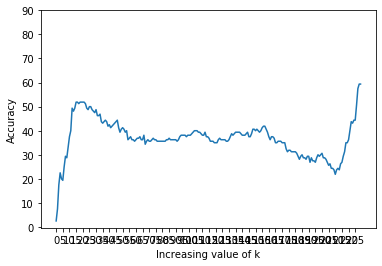

maximum accuracy for 60-40 split = 59.375


In [31]:
print_accuracy_plot(k_val1, acc_val1, 6, 4)

Plotting accuracy vs k


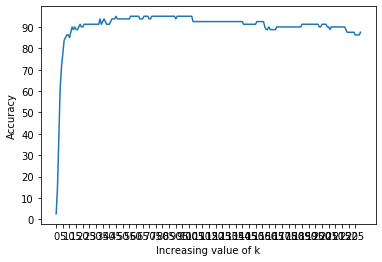

maximum accuracy for 80-20 split = 95.0


In [32]:
print_accuracy_plot(k_val2, acc_val2, 8, 2)

Plotting accuracy vs k


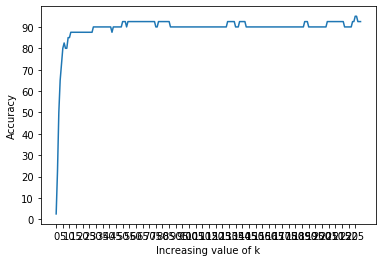

maximum accuracy for 90-10 split = 95.0


In [33]:
print_accuracy_plot(k_val3, acc_val3, 9, 1)

# In case of euclidean distance the accuracy we get for the following train-test splits are:
### 60-40 : 97.5 %
### 80-20 : 98.75 %
### 90-10 : 100.0 %

# In case of Mahalonobis distance the accuracy we get for the following train-test splits are:
### 60-40 : 95.625 %
### 80-20 : 98.75 %
### 90-10 : 97.5 %

# Therefore we get slightly better accuracy in case of Euclidean distance as compared to Mahalonobis distance